# Happy Hotel
You've just joined the data team at a large hotelling chain. Your specific team is embedded in the CX (customer experience) division. Each day you receive hundreds of reviews of your 10 hotels from your customers. Each review consists of a free-form text review and a report of "happy" or "not happy". A product manager on your team wants to understand each hotel's performance at a more granular level; they want to build a product to identify topics within reviews. All of your reviews are unlabeled, and it's infeasible to label them by hand.

Design and execute a method to identify topics within the reviews. For each topic, find a robust means of assigning a score to each hotel in that topic. For each of the ten hotels, what recommendations would you make to their general managers?



In [2]:
#dataexploration
import numpy as np
from pandas_profiling import ProfileReport

#Data Analysis
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

#Data Preprocessing and Feature Engineering
from textblob import TextBlob
import re
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer

#Model Selection and Validation
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix, classification_report,accuracy_score


#NLP
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly as py
import plotly.graph_objs as go
import gensim
from gensim import corpora, models, similarities
import logging
import tempfile
from nltk.corpus import stopwords
from string import punctuation
from collections import OrderedDict
import seaborn as sns
init_notebook_mode(connected=True) #do not miss this line


from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from nltk.stem import WordNetLemmatizer, SnowballStemmer
from nltk.stem.porter import *
np.random.seed(2018)
from gensim.parsing.preprocessing import remove_stopwords
import nltk
from nltk.stem.wordnet import WordNetLemmatizer
nltk.download('wordnet')
from gensim import corpora, models
from joblib import dump
from gensim.models import CoherenceModel

from gensim import corpora, models
from pprint import pprint

#plotting
import matplotlib.pyplot as plt
%matplotlib inline
# Plotting tools
import pyLDAvis
import pyLDAvis.gensim  # don't skip this



import warnings
warnings.filterwarnings("ignore")

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\sarah\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


EDA

In [3]:
happy = pd.read_csv('Happy_Hotel_Data_Set/hotel_happy_reviews.csv')
nothappy = pd.read_csv('Happy_Hotel_Data_Set/hotel_not_happy_reviews.csv')

In [4]:
happy

,User_ID,Description,Is_Response,hotel_ID
0,id10329,Stayed here with husband and sons on the way t...,happy,8
1,id10331,We had - rooms. One was very nice and clearly ...,happy,3
2,id10333,My wife & I stayed in this glorious city a whi...,happy,3
3,id10334,My boyfriend and I stayed at the Fairmont on a...,happy,7
4,id10336,"Steps off Times Square, nice rooms, stayed - n...",happy,3
...,...,...,...,...
26516,id49247,We staed at the Handlery Hotel to Visit San Di...,happy,5
26517,id49250,We booked a room with two single beds. Upon ar...,happy,3
26518,id49251,Arrived via taxi from La Guardia - driving int...,happy,8
26519,id49253,We arrived late at night and walked in to a ch...,happy,8


In [28]:
nothappy

,User_ID,Description,Is_Response,hotel_ID,Sentiment
0,id10326,The room was kind of clean but had a VERY stro...,not happy,3,0
1,id10327,I stayed at the Crown Plaza April -- - April -...,not happy,9,0
2,id10328,I booked this hotel through Hotwire at the low...,not happy,3,0
3,id10330,My girlfriends and I stayed here to celebrate ...,not happy,3,0
4,id10332,My husband and I have stayed in this hotel a f...,not happy,7,0
...,...,...,...,...,...
12406,id49249,I am pretty impartial to this hotel. I would d...,not happy,2,0
12407,id49252,I tend to post reviews only when I’ve had an e...,not happy,1,0
12408,id49254,The only positive impression is location and p...,not happy,2,0
12409,id49255,Traveling with friends for shopping and a show...,not happy,5,0


In [18]:
happy.columns

Index(['User_ID', 'Description', 'Is_Response', 'hotel_ID'], dtype='object')

In [5]:
happy['Sentiment']='1'
nothappy['Sentiment']='0'

In [25]:
nothappy

,User_ID,Description,Is_Response,hotel_ID,Sentiment
0,id10326,The room was kind of clean but had a VERY stro...,not happy,3,0
1,id10327,I stayed at the Crown Plaza April -- - April -...,not happy,9,0
2,id10328,I booked this hotel through Hotwire at the low...,not happy,3,0
3,id10330,My girlfriends and I stayed here to celebrate ...,not happy,3,0
4,id10332,My husband and I have stayed in this hotel a f...,not happy,7,0
...,...,...,...,...,...
12406,id49249,I am pretty impartial to this hotel. I would d...,not happy,2,0
12407,id49252,I tend to post reviews only when I’ve had an e...,not happy,1,0
12408,id49254,The only positive impression is location and p...,not happy,2,0
12409,id49255,Traveling with friends for shopping and a show...,not happy,5,0


In [6]:
hotel = pd.concat([happy,nothappy])

In [7]:
hotel.Description[1]

1    We had - rooms. One was very nice and clearly ...
1    I stayed at the Crown Plaza April -- - April -...
Name: Description, dtype: object

In [50]:
hotelprofile=ProfileReport(hotel, title='Happy and Not Happy Hotels', html={'style':{'full_width':True}})

In [ ]:
hotelprofile

Topic analysis of every review

In [8]:
stop_words = stopwords.words('english')

In [9]:
#Create a corpus of reviews
# Convert to list
data = hotel.Description.values.tolist()
data_text = hotel[['Description']]
#data_text['index'] = data_text.index
documents = data_text

In [10]:
stemmer = SnowballStemmer('english')
def lemmatize_stemming(text):
    return stemmer.stem(WordNetLemmatizer().lemmatize(text, pos='v'))

def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3:
            result.append(lemmatize_stemming(token))
    return result

def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]


In [11]:
#This processes the documents to stem, lemmatize and so on
processed_docs = documents['Description'].map(preprocess)
processed_docs_nostopwords = remove_stopwords(processed_docs)

In [95]:
pprint(processed_docs_nostopwords)

[['stay',
  'husband',
  'son',
  'alaska',
  'cruis',
  'love',
  'hotel',
  'great',
  'experi',
  'room',
  'north',
  'tower',
  'face',
  'north',
  'west',
  'best',
  'view',
  'high',
  'floor',
  'stun',
  'view',
  'needl',
  'citi',
  'cruis',
  'ship',
  'order',
  'room',
  'servic',
  'dinner',
  'enjoy',
  'perfect',
  'view',
  'room',
  'servic',
  'dinner',
  'delici',
  'perfect',
  'spot',
  'walk',
  'enjoy',
  'citi',
  'forget',
  'heaven',
  'bed',
  'heaven'],
 ['room',
  'nice',
  'clear',
  'updat',
  'recent',
  'clean',
  'comfi',
  'need',
  'updat',
  'carpet',
  'wrinkl',
  'exampl',
  'great',
  'locat',
  'visit',
  'inner',
  'harbor',
  'get',
  'fell',
  'point',
  'oriol',
  'game',
  'supershuttl',
  'work',
  'great',
  'way',
  'remot',
  'room',
  'terribl',
  'watch',
  'deal',
  'wireless',
  'sketchi',
  'floor',
  'need',
  'vacat',
  'matter',
  'breakfast',
  'good',
  'morn',
  'stay',
  'town'],
 ['wife',
  'stay',
  'glorious',
  'citi

  'limb',
  'epic',
  'thunderstorm',
  'score',
  'taxi',
  'appoint',
  'time',
  'think',
  'twice',
  'book',
  'hotel',
  'hyatt',
  'terrif',
  'hotel',
  'excel',
  'valu',
  'cheaper',
  'hotel',
  'terrif',
  'valu',
  'enjoy',
  'amen',
  'outstand',
  'experi',
  'wait',
  'return'],
 ['comfort',
  'room',
  'littl',
  'glitzi',
  'tast',
  'tend',
  'reason',
  'price',
  'factilit',
  'littl',
  'limit',
  'quiet',
  'area',
  'restaur',
  'attach',
  'breaksfast',
  'serv',
  'rudimentari',
  'room',
  'servic',
  'save',
  'sure',
  'room',
  'overlook',
  'street',
  'hotel',
  'rectangular',
  'central',
  'void',
  'space',
  'half',
  'room',
  'look',
  'tend',
  'leav',
  'curtain',
  'draw'],
 ['awesom',
  'rate',
  'night',
  'radisson',
  'good',
  'locat',
  'block',
  'grand',
  'central',
  'station',
  'block',
  'rockefel',
  'center',
  'away',
  'chao',
  'nois',
  'time',
  'squar',
  'close',
  'walk',
  'sit',
  'subway',
  'stop',
  'room',
  'good',


  'room',
  'extra',
  'charg',
  'breakfast',
  'credit',
  'sound',
  'great',
  'buffet',
  'person',
  'order',
  'cart',
  'go',
  'rough',
  'total',
  'peopl',
  'adult',
  'kid',
  'morn',
  'breakfast',
  'breakfast',
  'actual',
  'good',
  'mind',
  'lack',
  'matter',
  'fact',
  'free',
  'item',
  'lobbi',
  'good',
  'free',
  'recommend',
  'eat',
  'stay',
  'complet',
  'mini',
  'room',
  'nice',
  'touch',
  'alcohol',
  'free',
  'unlimit',
  'advertis',
  'restock',
  'wise',
  'rest',
  'good',
  'room',
  'offer',
  'limit',
  'privaci',
  'bathroom',
  'area',
  'toilet',
  'glass',
  'door',
  'mirror',
  'shower',
  'door',
  'frost',
  'mirror',
  'block',
  'spectat',
  'good',
  'spous',
  'kid',
  'room',
  'overal',
  'recommend',
  'rat',
  'nice',
  'good',
  'locat',
  'wall',
  'water',
  'read',
  'review',
  'locat',
  'hotel',
  'water',
  'wall',
  'tri',
  'drive'],
 ['great',
  'locat',
  'magnific',
  'mile',
  'illinoi',
  'divid',
  'line',


  'room',
  'room',
  'servic',
  'waiter',
  'fairmont',
  'help',
  'cheer',
  'super',
  'friend'],
 ['locat',
  'hotel',
  'great',
  'need',
  'downtown',
  'denver',
  'park',
  'expens',
  'free',
  'servic',
  'general',
  'good',
  'staff',
  'friend',
  'clean',
  'room',
  'late',
  'manag',
  'apolog',
  'floor',
  'nice',
  'view',
  'drink',
  'stay',
  'twice',
  'stay'],
 ['past',
  'year',
  'opportun',
  'stay',
  'yorker',
  'repeat',
  'trip',
  'coupl',
  'great',
  'room',
  'stand',
  'averag',
  'room',
  'rate',
  'problem',
  'room',
  'need',
  'touchup',
  'slow',
  'sink',
  'worst',
  'thing',
  'locat',
  'ideal',
  'get',
  'manhattan',
  'penn',
  'station',
  'maci',
  'post',
  'offic',
  'fashion',
  'district',
  'close',
  'walk',
  'broadway',
  'easili',
  'night',
  'famili',
  'busi',
  'walk',
  'minut',
  'grab',
  'item',
  'shop',
  'earlier',
  'staff',
  'desk',
  'yorker',
  'excel',
  'help',
  'restaur',
  'fine',
  'differ',
  'decor'

  'room',
  'nice',
  'bed',
  'comfort',
  'pool',
  'small',
  'smaller',
  'conrad',
  'like',
  'rais',
  'design',
  'pool',
  'nice',
  'size',
  'exceris',
  'facil',
  'larg',
  'area',
  'conrad',
  'obvious',
  'superior',
  'chang',
  'shower',
  'facil',
  'pool',
  'excercis',
  'room',
  'comparison',
  'conrad',
  'feel',
  'like',
  'exclus',
  'golf',
  'club',
  'sauna',
  'multipl',
  'shower',
  'free',
  'amen',
  'feel',
  'like',
  'public',
  'chang',
  'area',
  'sauna',
  'free',
  'amen',
  'conrad',
  'come',
  'equip',
  'rob',
  'sight',
  'presenc',
  'starbuck',
  'meet',
  'area',
  'nice',
  'featur',
  'overal',
  'great',
  'hotel',
  'indi',
  'vote',
  'conrad',
  'distant',
  'execut',
  'high',
  'treatment',
  'opinion',
  'probabl',
  'satisfi',
  'like',
  'conrad'],
 ['look',
  'hotel',
  'outdoor',
  'pool',
  'juli',
  'hotel',
  'outdoor',
  'pool',
  'one',
  'outrag',
  'expens',
  'thompson',
  'good',
  'price',
  'love',
  'hotel',
  

  'necessarili',
  'recommend',
  'romant',
  'weekend',
  'getaway',
  'fine',
  'function',
  'hotel',
  'busi',
  'travel',
  'pros',
  'better',
  'locat',
  'downtown',
  'austin',
  'reason',
  'walk',
  'distanc',
  'south',
  'congress',
  'restaur',
  'trailer',
  'street',
  'entertain',
  'district',
  'runner',
  'awesom',
  'basic',
  'staircas',
  'away',
  'town',
  'lake',
  'hike',
  'bike',
  'trail',
  'view',
  'capit',
  'build',
  'downtown',
  'high',
  'town',
  'lake',
  'south',
  'room',
  'updat',
  'clean',
  'channel',
  'flat',
  'screen',
  'small',
  'workspac',
  'houseclean',
  'good',
  'night',
  'stay',
  'con',
  'reimburs',
  'forc',
  'night',
  'park',
  'pocket',
  'stay',
  'differ',
  'hotel',
  'buck',
  'night',
  'poor',
  'coverag',
  'downstair',
  'concierg',
  'need',
  'onlin',
  'minut',
  'overal',
  'choos',
  'hotel',
  'locat',
  'friend',
  'staff',
  'good',
  'night',
  'sleep',
  'bed'],
 ['stay',
  'hollywood',
  'recent',


  'similar',
  'hotel',
  'area',
  'ferri',
  'build',
  'trolley',
  'stop',
  'block',
  'walk',
  'hotel',
  'trolley',
  'time',
  'write',
  'review',
  'fisherman',
  'wharf',
  'alcatraz',
  'ferri',
  'walk',
  'minut',
  'cabl',
  'rout',
  'block',
  'drawback',
  'room',
  'small',
  'pillow',
  'room',
  'rent',
  'airport',
  'site',
  'park',
  'park',
  'street',
  'take',
  'airport',
  'shuttl',
  'instead',
  'sit',
  'foot',
  'live',
  'drawback',
  'interior',
  'decor',
  'hotel',
  'room',
  'updat',
  'fresh',
  'price',
  'market',
  'financi',
  'district',
  'time',
  'book',
  'repres',
  'good',
  'valu'],
 ['good',
  'locat',
  'clean',
  'room',
  'good',
  'price',
  'breakfast',
  'advertis',
  'troubl',
  'understand',
  'desk',
  'clerk',
  'morn',
  'breakfast',
  'ladi',
  'touch',
  'freez',
  'egg',
  'bare',
  'hand',
  'cours',
  'cook',
  'germ',
  'go',
  'say',
  'stay',
  'area'],
 ['book',
  'room',
  'good',
  'deal',
  'free',
  'shuttl'

  'expect',
  'hotel',
  'block',
  'canal',
  'block',
  'street',
  'main',
  'shop',
  'din',
  'street',
  'georgetown',
  'stroll',
  'canal',
  'wonder',
  'restaur',
  'dinner',
  'access',
  'main',
  'easi',
  'circul',
  'cost',
  'hotel',
  'staff',
  'warm',
  'welcom',
  'profession',
  'best',
  'room',
  'love',
  'huge',
  'floor',
  'ceil',
  'marbl',
  'bath',
  'larg',
  'dress',
  'area',
  'mirror',
  'serv',
  'kitchenett',
  'comfortab',
  'sleep',
  'breakfast',
  'nice',
  'pastri',
  'cereal',
  'bagel',
  'starbuck',
  'coffe',
  'situat',
  'coupl',
  'negat',
  'take',
  'water',
  'reach',
  'room',
  'small',
  'elev',
  'heavi',
  'wait',
  'posit',
  'outweigh',
  'minor',
  'negat',
  'definit',
  'stay',
  'hotel',
  'monticello',
  'regret',
  'night'],
 ['stay',
  'hotel',
  'andra',
  'earli',
  'juli',
  'night',
  'spend',
  'hour',
  'scour',
  'page',
  'tripadvisor',
  'stay',
  'whilst',
  'seattl',
  'moment',
  'arriv',
  'perfect',
  'staf

  'subway',
  'block',
  'away',
  'immedi',
  'surround',
  'offer',
  'varieti',
  'excel',
  'din',
  'option',
  'listen',
  'chelsea',
  'pin',
  'staff',
  'recommend',
  'great',
  'felt',
  'safe',
  'walk',
  'surround',
  'street',
  'night',
  'breakfast',
  'vari',
  'fresh',
  'delici',
  'additiion',
  'fruit',
  'chees',
  'cereal',
  'yogurt',
  'bake',
  'differ',
  'kind',
  'bread',
  'suit',
  'clean',
  'plenti',
  'inroom',
  'nespresso',
  'machin',
  'addict',
  'wait',
  'return',
  'thank'],
 ['second',
  'time',
  'stay',
  'helix',
  'excel',
  'kimpton',
  'properti',
  'friend',
  'help',
  'servic',
  'great',
  'room',
  'easi',
  'internet',
  'servic',
  'kimpton',
  'member',
  'appreci',
  'worth',
  'mini',
  'recommend',
  'hotel',
  'busi',
  'pleasur'],
 ['stay',
  'read',
  'review',
  'ahead',
  'time',
  'freak',
  'hour',
  'plane',
  'ride',
  'motion',
  'sick',
  'taxi',
  'ride',
  'airport',
  'mood',
  'felt',
  'like',
  'crap',
  'wal

  'extrem',
  'comfort',
  'slight',
  'drawback',
  'nois',
  'airplan',
  'take',
  'eventu',
  'abat',
  'order',
  'room',
  'servic',
  'extrem',
  'prompt',
  'present',
  'wonder',
  'buffet',
  'breakfast',
  'morn',
  'plenti',
  'nice',
  'varieti',
  'tast',
  'person',
  'staff',
  'extrem',
  'friend',
  'courteous',
  'definit',
  'stay'],
 ['stay',
  'april',
  'famili',
  'week',
  'vacat',
  'york',
  'read',
  'previous',
  'review',
  'tripadvisor',
  'good',
  'disappoint',
  'stay',
  'floor',
  'check',
  'queen',
  'soft',
  'desk',
  'kind',
  'move',
  'room',
  'bed',
  'firm',
  'hotel',
  'manag',
  'commit',
  'staff',
  'consist',
  'rat',
  'locat',
  'central',
  'theatr',
  'time',
  'squar',
  'walkabl',
  'central',
  'park',
  'empir',
  'state',
  'build',
  'graylin',
  'sight',
  'see',
  'street',
  'bikram',
  'yoga',
  'restaur',
  'time',
  'squar',
  'concierg',
  'help',
  'guid',
  'restaur',
  'hell',
  'kitchen',
  'nearbi',
  'come'],
 [

  'go',
  'lunch',
  'request',
  'assur',
  'problem',
  'behold',
  'show',
  'mean',
  'pay',
  'extra',
  'take',
  'sooner',
  'know',
  'disappoint',
  'hop',
  'resolv',
  'hotel',
  'host',
  'roast',
  'pretti',
  'rude',
  'disinterest',
  'wait',
  'tabl',
  'quot',
  'look',
  'station',
  'recommend',
  'look',
  'walk',
  'corner',
  'mention',
  'basic',
  'repeat',
  'turn',
  'eat',
  'highest',
  'recommend',
  'restaur',
  'detroit',
  'expect',
  'great',
  'servic',
  'friend',
  'atmospher',
  'ala',
  'free',
  'wifi',
  'internet',
  'serious',
  'great',
  'trip',
  'potenti',
  'consid',
  'stay',
  'realiz',
  'add',
  'cost',
  'fast'],
 ['locat',
  'better',
  'walk',
  'distanc',
  'great',
  'sit',
  'price',
  'beat',
  'citi',
  'safe',
  'area',
  'clean',
  'comfort',
  'star',
  'hotel',
  'great',
  'definit',
  'recommend',
  'hotel'],
 ['stay',
  'night',
  'fianc',
  'go',
  'check',
  'tell',
  'give',
  'complimentari',
  'upgrad',
  'penthous'

  'long',
  'wait',
  'immigr',
  'custom',
  'return',
  'japan',
  'spend',
  'hour',
  'luggag',
  'get',
  'govern',
  'check',
  'point',
  'privat',
  'secur',
  'personnel',
  'rudest',
  'encount',
  'year',
  'prepar',
  'treatment',
  'review',
  'conveni',
  'place',
  'nearbi',
  'hotel',
  'plan',
  'accord',
  'food',
  'beverag',
  'insid',
  'hotel',
  'accept',
  'outstand',
  'memor',
  'hotel',
  'chain',
  'loyalti',
  'assum',
  'competit',
  'rate',
  'futur',
  'plan',
  'avoid',
  'altogeth'],
 ['great',
  'hotel',
  'stay',
  'hotel',
  'georg',
  'brief',
  'stay',
  'busi',
  'trip',
  'comfort',
  'place',
  'cool',
  'loungi',
  'feel',
  'room',
  'spacious',
  'comfort',
  'nice',
  'furnish',
  'bathroom',
  'nice',
  'spotless',
  'servic',
  'fantast',
  'staff',
  'incred',
  'friend',
  'accommod',
  'conveni',
  'locat',
  'close',
  'union',
  'station',
  'definit',
  'stay',
  'high',
  'recommend'],
 ['brother',
  'stay',
  'month',
  'night',
 

  'maid',
  'smile',
  'greet',
  'even',
  'complimentari',
  'open',
  'wonder',
  'touch',
  'room',
  'servic',
  'say',
  'minut',
  'time',
  'wife',
  'want',
  'blow',
  'manicur',
  'concierg',
  'offer',
  'myriad',
  'nearbi',
  'choic',
  'appoint',
  'live',
  'nearbi',
  'suburb',
  'time',
  'time',
  'stay',
  'hesit',
  'stay',
  'bryant',
  'park',
  'street',
  'bryant',
  'park',
  'love',
  'rink',
  'public',
  'librari',
  'corner',
  'theater',
  'district',
  'shop',
  'short',
  'walk',
  'love'],
 ['famili',
  'hotel',
  'price',
  'york',
  'citi',
  'look',
  'steep',
  'quad',
  'room',
  'reason',
  'rat',
  'cosmo',
  'fussi',
  'husband',
  'risk',
  'etern',
  'damnat',
  'great',
  'book',
  'room',
  'night',
  'realis',
  'luggag',
  'cramp',
  'book',
  'queen',
  'queen',
  'sofa',
  'sleep',
  'turn',
  'expect',
  'true',
  'view',
  'widesceen',
  'largest',
  'room',
  'free',
  'access',
  'want',
  'print',
  'board',
  'pass',
  'save',
  '

  'nice',
  'room',
  'friend',
  'staff',
  'unfortun',
  'connect',
  'work',
  'proper',
  'breakfast',
  'expect',
  'good',
  'choic'],
 ['arriv',
  'hotel',
  'mistak',
  'reserv',
  'marriott',
  'stupid',
  'mapquest',
  'wrong',
  'hotel',
  'town',
  'night',
  'rout',
  'drive',
  'florida',
  'vermont',
  'book',
  'night',
  'monument',
  'tour',
  'deadlin',
  'spend',
  'even',
  'tri',
  'hotel',
  'explain',
  'mistak',
  'desk',
  'clerk',
  'nicer',
  'cancel',
  'reserv',
  'give',
  'room',
  'good',
  'price',
  'comp',
  'park',
  'give',
  'breakfast',
  'free',
  'room',
  'nice',
  'servic',
  'excel',
  'staff',
  'help',
  'wonder',
  'breakfast',
  'excel',
  'servic',
  'tabl',
  'buffet',
  'breakfast',
  'comp',
  'leav',
  'morn',
  'road',
  'valet',
  'tell',
  'exact',
  'downtown',
  'area',
  'stupid',
  'mistak',
  'turn',
  'best',
  'hotel',
  'experi'],
 ['hotel',
  'stand',
  'know',
  'stay',
  'omni',
  'check',
  'futur',
  'base',
  'start

  'comfort',
  'complaint',
  'shower',
  'terribl',
  'water',
  'pressur',
  'hotel',
  'clean',
  'staff',
  'help',
  'great',
  'locat',
  'michigan',
  'avenu',
  'quiet',
  'visit',
  'chicago',
  'stay',
  'presid',
  'club',
  'rate',
  'includ',
  'breakfast',
  'join',
  'presid',
  'club',
  'free'],
 ['love',
  'hotel',
  'close',
  'want',
  'short',
  'walk',
  'subway',
  'station',
  'kid',
  'love',
  'train',
  'go',
  'hotel',
  'add',
  'attract',
  'cost',
  'buy',
  'ticket',
  'hotel',
  'ferri',
  'harbor',
  'pier',
  'block',
  'away',
  'breakfast',
  'corner',
  'diner',
  'peopl',
  'great',
  'valu',
  'citi',
  'stay',
  'year'],
 ['breathtak',
  'view',
  'capit',
  'washington',
  'memori',
  'hotel',
  'beauti',
  'design',
  'meticul',
  'clean',
  'larg',
  'room',
  'especi',
  'reccomend',
  'floor',
  'room',
  'whipch',
  'liittl',
  'extra',
  'wonder',
  'breakfast',
  'even',
  'win',
  'hoer',
  'doerv',
  'adjac',
  'busi',
  'center',
  's

  'ferri',
  'area',
  'brooklyn',
  'bridg',
  'hotel',
  'short',
  'walk',
  'breakfast',
  'includ',
  'book',
  'earli',
  'seat',
  'get',
  'crowd'],
 ['luxuri',
  'pillow',
  'bed',
  'egeyptian',
  'cotton',
  'sheet',
  'soak',
  'tub',
  'marbl',
  'sink',
  'vaniti',
  'separ',
  'shower',
  'upscal',
  'bath',
  'product',
  'challeng',
  'golf',
  'cours',
  'wonder',
  'golf',
  'cours',
  'view',
  'superb',
  'product',
  'ballantyn',
  'upper',
  'echelon',
  'resort',
  'hotel',
  'complaint',
  'whatsoev',
  'room',
  'amen',
  'turn',
  'servic',
  'turn',
  'pick',
  'replac',
  'singl',
  'towel',
  'dinner',
  'entir',
  'differ',
  'stori',
  'main',
  'restaur',
  'tradit',
  'understaf',
  'waiter',
  'tabl',
  'seat',
  'tabl',
  'wait',
  'labori',
  'servic',
  'seat',
  'secur',
  'guard',
  'direct',
  'restuar',
  'signag',
  'inadequ',
  'realiz',
  'seat',
  'servic',
  'slow',
  'waiter',
  'restaur',
  'go',
  'area',
  'reliev',
  'worker',
  'smok

  'amaz',
  'room',
  'abl',
  'fabul',
  'birthday',
  'trump',
  'truli',
  'live',
  'life',
  'luxuri',
  'certain',
  'recommend',
  'hotel',
  'interest',
  'see',
  'chicago',
  'style',
  'bar',
  'trump',
  'occas',
  'drink',
  'phenomen',
  'hand',
  'craft',
  'pricey',
  'negat',
  'thing',
  'astound',
  'charg',
  'incident',
  'room',
  'incident',
  'insan',
  'accid',
  'charg',
  'room'],
 ['time',
  'detroit',
  'love',
  'vast',
  'room',
  'floor',
  'except',
  'view',
  'sure',
  'curvatur',
  'earth',
  'look',
  'rise'],
 ['better',
  'locat',
  'right',
  'near',
  'inner',
  'harbor',
  'near',
  'histor',
  'cobbleston',
  'street',
  'lombard',
  'street',
  'stay',
  'relax',
  'effort',
  'accommod',
  'geoffrey',
  'merriman',
  'arrang',
  'stay',
  'friend',
  'worker',
  'samantha',
  'kay',
  'introduc',
  'seafood',
  'delici',
  'plenti',
  'dinner',
  'geoffrey',
  'samantha',
  'great',
  'hospit',
  'team',
  'wait',
  'brookshir',
  'suit',
  

  'negat',
  'towel',
  'smell',
  'one'],
 ['regular',
  'visitor',
  'antonio',
  'time',
  'stay',
  'contessa',
  'friend',
  'recommend',
  'hotel',
  'pleas',
  'stay',
  'great',
  'atmospher',
  'locat',
  'friend',
  'staff',
  'help',
  'plan',
  'stay',
  'memori',
  'weekend'],
 ['read',
  'review',
  'littl',
  'worri',
  'visit',
  'hotel',
  'paradis',
  'resort',
  'tropic',
  'oasi',
  'good',
  'standard',
  'accomod',
  'excel',
  'staff',
  'certain',
  'problem',
  'servic',
  'ant',
  'room',
  'slight',
  'downsid',
  'maid',
  'servic',
  'thorough',
  'room',
  'servic',
  'baysid',
  'grill',
  'excel',
  'love',
  'set',
  'excel',
  'meal',
  'balleen',
  'restaur',
  'expens',
  'especi',
  'children',
  'add',
  'servic',
  'charg',
  'coffe',
  'dollar',
  'expens',
  'resort',
  'situat',
  'ideal',
  'town',
  'gaslamp',
  'quarter',
  'mile',
  'seaworld',
  'look',
  'relax',
  'tropic',
  'resort',
  'paradis',
  'piont'],
 ['stay',
  'day',
  'busi'

  'negat',
  'thing',
  'think',
  'shower',
  'power',
  'bearabl',
  'shampoo',
  'bodi',
  'bottl',
  'suppli',
  'replac',
  'necessari',
  'locat',
  'locat',
  'hotel',
  'fantast',
  'minut',
  'walk',
  'maci',
  'empir',
  'state',
  'build',
  'come',
  'hotel',
  'turn',
  'right',
  'leav',
  'traffic',
  'light',
  'walk',
  'coupl',
  'min',
  'maci',
  'tick',
  'tock',
  'dinner',
  'right',
  'hotel',
  'walk',
  'nice',
  'place',
  'add',
  'great',
  'restaur',
  'breakfast',
  'lunch',
  'dinner',
  'stage',
  'door',
  'right',
  'hotel',
  'cross',
  'road',
  'great',
  'menu',
  'reason',
  'price',
  'good',
  'servic',
  'recommend',
  'cafe',
  'eighth',
  'avenu',
  'cheap',
  'food',
  'fresh',
  'prepar',
  'come',
  'hotel',
  'cross',
  'road',
  'turn',
  'leav',
  'walk',
  'min',
  'hotel',
  'charg',
  'room',
  'hotel',
  'pricey',
  'play',
  'good',
  'music',
  'check',
  'worth',
  'check',
  'compani',
  'book',
  'hotel',
  'price',
  'pay',


  'locat',
  'walk',
  'distanc',
  'number',
  'bar',
  'eateri',
  'type',
  'room',
  'apoint',
  'twice',
  'larg',
  'regular',
  'star',
  'chain',
  'hotel',
  'choic',
  'visit'],
 ['time',
  'price',
  'beat',
  'place',
  'cours',
  'citi',
  'traffic',
  'free',
  'park',
  'room',
  'nice',
  'size',
  'larg',
  'bathroom',
  'cafe',
  'overpric',
  'lousi',
  'servic',
  'meet',
  'need',
  'inexpens',
  'place',
  'sleep',
  'chicago'],
 ['staff',
  'friend',
  'proactiv',
  'help',
  'check',
  'walk',
  'room',
  'staff',
  'person',
  'pass',
  'offer',
  'pleasant',
  'greet',
  'room',
  'spacious',
  'clean',
  'nice',
  'view',
  'look',
  'firefight',
  'memori',
  'plaza',
  'step',
  'hotel',
  'starbuck',
  'small',
  'groceri',
  'deli',
  'drugstor',
  'like',
  'italian',
  'ciro',
  'trattoria',
  'street',
  'corner',
  'shrimp',
  'parmigiana',
  'sorri',
  'check',
  'rat',
  'expedia',
  'traveloc',
  'pricelin',
  'book',
  'hilton',
  'lowest',
  'rat

 ['return',
  'night',
  'stay',
  'belveder',
  'moment',
  'arriv',
  'felt',
  'like',
  'staff',
  'conscious',
  'need',
  'check',
  'easi',
  'arriv',
  'earli',
  'room',
  'readi',
  'staff',
  'check',
  'take',
  'assur',
  'room',
  'readi',
  'later',
  'arriv',
  'order',
  'room',
  'spacious',
  'clean',
  'look',
  'like',
  'recent',
  'remodel',
  'room',
  'quiet',
  'floor',
  'street',
  'nois',
  'complaint',
  'slow',
  'elev',
  'inconveni',
  'stay',
  'locat',
  'outstand',
  'go',
  'music',
  'stay',
  'minut',
  'walk',
  'time',
  'theater',
  'staff',
  'friend',
  'offer',
  'suggest',
  'check',
  'help',
  'possibl',
  'airport',
  'general',
  'hotel',
  'definit',
  'stay',
  'visit',
  'york',
  'citi'],
 ['simpli',
  'great',
  'hotel',
  'staff',
  'incred',
  'view',
  'corner',
  'room',
  'great',
  'readi',
  'adequ',
  'price',
  'includ',
  'overnight',
  'park',
  'continent',
  'breakfast'],
 ['stay',
  'figueroa',
  'truli',
  'charm',
 

  'con',
  'indiffer',
  'servic',
  'replenish',
  'coffe',
  'replac',
  'day',
  'forget',
  'replac',
  'bathmat',
  'upscal',
  'hotel',
  'addit',
  'servic',
  'insan',
  'expens',
  'mini',
  'internet',
  'access',
  'busi',
  'center',
  'bottl',
  'water',
  'room',
  'rust',
  'bathroom',
  'slight',
  'stain',
  'carpet',
  'tini',
  'elev',
  'hotel',
  'chair',
  'room',
  'includ',
  'desk',
  'chair',
  'thought',
  'base',
  'review',
  'appear',
  'room',
  'qualiti',
  'maid',
  'servic',
  'prefer',
  'simpli',
  'bed',
  'replenish',
  'soap',
  'shampoo',
  'replac',
  'towel',
  'chang',
  'sheet',
  'away',
  'partial',
  'item',
  'away',
  'iron',
  'board'],
 ['hotel',
  'time',
  'squar',
  'actual',
  'street',
  'minut',
  'walk',
  'time',
  'squar',
  'hotel',
  'conveni',
  'sight',
  'travel',
  'hub',
  'central',
  'park',
  'minut',
  'walk',
  'breakfast',
  'complimentari',
  'buffet',
  'style',
  'free',
  'internet',
  'access',
  'lobbi',
  '

  'continu',
  'educ',
  'seminar',
  'hold',
  'dinner',
  'children',
  'live',
  'austin',
  'town',
  'discov',
  'tire',
  'decid',
  'stay',
  'quinta',
  'conveni',
  'drive',
  'home',
  'past',
  'experi',
  'quiet',
  'rest',
  'good',
  'accommod',
  'friend',
  'accommod',
  'staff',
  'miss',
  'breakfast',
  'prefer',
  'sleep'],
 ['search',
  'decid',
  'intercontient',
  'barcali',
  'choic',
  'lobbi',
  'extrem',
  'eleg',
  'ampl',
  'seat',
  'guest',
  'complimentari',
  'wifi',
  'minut',
  'time',
  'york',
  'standard',
  'room',
  'fair',
  'bathroom',
  'small',
  'need',
  'easili',
  'accommod',
  'time',
  'okay',
  'plasma',
  'matter',
  'unbeliev',
  'comfort',
  'despit',
  'middl',
  'manhattan',
  'hard',
  'hear',
  'nois',
  'outsid',
  'secur',
  'safeti',
  'issu',
  'danger',
  'citi',
  'worri',
  'barclay',
  'stay',
  'night',
  'time',
  'go',
  'hotel',
  'polic',
  'offic',
  'stand',
  'outsid',
  'hotel',
  'usual',
  'deal',
  'troubl',


  'stay',
  'modern',
  'hotel',
  'manhattan',
  'nice',
  'staff',
  'wonder',
  'bed',
  'clean',
  'room',
  'great',
  'locat',
  'walk',
  'distanc',
  'time',
  'squar',
  'central',
  'park'],
 ['great',
  'locat',
  'good',
  'servic',
  'spacious',
  'room',
  'mile',
  'area',
  'work',
  'lobbi',
  'date',
  'nostalg',
  'bathroom',
  'room',
  'fine',
  'good',
  'choic'],
 ['better',
  'locat',
  'downtown',
  'diego',
  'holiday',
  'close',
  'airport',
  'amtrak',
  'embarcadero',
  'littl',
  'itali',
  'gaslamp',
  'quarter',
  'cruis',
  'ship',
  'termin',
  'room',
  'upper',
  'floor',
  'sweep',
  'view',
  'diego',
  'downtown',
  'room',
  'spacious',
  'appoint',
  'larg',
  'bathroom',
  'staff',
  'profession',
  'accommod',
  'good',
  'valu',
  'price'],
 ['usual',
  'write',
  'negat',
  'review',
  'price',
  'size',
  'manhattan',
  'hotel',
  'room',
  'room',
  'ridicul',
  'closet',
  'rack',
  'wall',
  'bring',
  'hanger',
  'drawer',
  'cloth',
 

  'book',
  'pricelin',
  'room',
  'type',
  'guarante',
  'give',
  'option',
  'smoke',
  'room',
  'upgrad',
  'suit',
  'obvious',
  'choos',
  'suit',
  'catch',
  'room',
  'includ',
  'rollaway',
  'bring',
  'refriger',
  'rollaway',
  'horribl',
  'expect',
  'lucki',
  'solo',
  'travel',
  'twin',
  'room',
  'floor',
  'look',
  'recent',
  'redecor',
  'clean',
  'nice',
  'view',
  'room',
  'skylin',
  'hotel',
  'wall',
  'paper',
  'recommend',
  'bring',
  'plug',
  'white',
  'nois',
  'machin',
  'lockwood',
  'restaur',
  'potter',
  'loung',
  'comment',
  'overal',
  'locat',
  'amaz',
  'servic',
  'definit',
  'stay'],
 ['great', 'hotel', 'ideal', 'locat', 'friend', 'staff', 'room', 'fantast'],
 ['develop',
  'condo',
  'suit',
  'equip',
  'long',
  'stay',
  'perfect',
  'reason',
  'brief',
  'visit',
  'nice',
  'staff',
  'groceri',
  'store',
  'right',
  'door'],
 ['husband',
  'book',
  'room',
  'despit',
  'read',
  'mix',
  'review',
  'site',
  'wa

  'juic',
  'coffe',
  'includ',
  'room',
  'rate',
  'hallway',
  'spotless',
  'entir',
  'room',
  'space',
  'bathroom',
  'sink',
  'area',
  'bathroom',
  'huge',
  'assign',
  'handicap',
  'access',
  'room',
  'talk',
  'weird',
  'shower',
  'attach',
  'wall',
  'slide',
  'stream',
  'water',
  'bare',
  'horribl',
  'shower',
  'thing',
  'room',
  'hotel',
  'surpris',
  'quiet',
  'night',
  'mattress',
  'pillow',
  'great',
  'hallway',
  'room',
  'carpet',
  'bathroom',
  'thicker',
  'towel',
  'improv',
  'think',
  'consid',
  'decent',
  'hotel',
  'book',
  'comic',
  'want',
  'night',
  'consid',
  'bargain',
  'desk',
  'staff',
  'accomod',
  'friend'],
 ['husband',
  'stay',
  'night',
  'local',
  'area',
  'wed',
  'beauti',
  'hotel',
  'keep',
  'clean',
  'comfort',
  'bathroom',
  'door',
  'like',
  'closet',
  'door',
  'slat',
  'kind',
  'privaci',
  'issu',
  'shower',
  'huge',
  'water',
  'pressur',
  'perfect',
  'condit',
  'work',
  'great

  'neat',
  'clean',
  'good',
  'internet',
  'access',
  'continent',
  'breakfast',
  'includ',
  'price',
  'good',
  'hard',
  'boil',
  'egg',
  'like',
  'qualiti',
  'inn'],
 ['great',
  'stay',
  'knickerbock',
  'littl',
  'wari',
  'read',
  'review',
  'room',
  'clean',
  'fabul',
  'comfi',
  'bathroom',
  'stylish',
  'tile',
  'immacul',
  'clean',
  'quiet',
  'sleep',
  'morn',
  'breakfast',
  'littl',
  'lobbi',
  'restaur',
  'spinach',
  'omelet',
  'great',
  'husband',
  'french',
  'toast',
  'littl',
  'option',
  'area',
  'choos',
  'restaur',
  'conveni',
  'food',
  'averag',
  'park',
  'fee',
  'exhorbit',
  'choos',
  'self',
  'park',
  'street',
  'charg',
  'fee',
  'valet',
  'park'],
 ['minut',
  'walk',
  'white',
  'hous',
  'minut',
  'blue',
  'line',
  'metro',
  'station'],
 ['stay',
  'orchard',
  'hotel',
  'night',
  'june',
  'complain',
  'room',
  'comfort',
  'clean',
  'spacious',
  'adult',
  'huge',
  'luggag',
  'view',
  'expect',

  'reason',
  'avail',
  'cost',
  'thing',
  'citi',
  'price',
  'valet',
  'park',
  'time',
  'vehicl',
  'daili',
  'price',
  'qualiti',
  'luxuri',
  'bath',
  'product',
  'sleep',
  'arrang',
  'comfort',
  'feel',
  'like',
  'royalti',
  'delici',
  'room',
  'din',
  'option',
  'want',
  'chocol',
  'souffl',
  'midnight',
  'time',
  'ventur',
  'chicago',
  'stay',
  'sutton',
  'place',
  'love'],
 ['husband',
  'book',
  'night',
  'hotel',
  'hotwir',
  'anniversari',
  'pleasant',
  'surpris',
  'custom',
  'servic',
  'friend',
  'help',
  'begin',
  'walk',
  'room',
  'queen',
  'truli',
  'love',
  'decor',
  'onlin',
  'pic',
  'justic',
  'disappoint',
  'shower',
  'stall',
  'bathtub',
  'month',
  'pregnant',
  'complet',
  'need',
  'good',
  'soak',
  'husband',
  'call',
  'desk',
  'request',
  'upgrad',
  'move',
  'larger',
  'room',
  'bathtub',
  'king',
  'better',
  'view',
  'extra',
  'charg',
  'coupl',
  'mainten',
  'request',
  'stay',
  'sta

  'trip',
  'worthwhil',
  'trip',
  'long',
  'convers',
  'concierg',
  'help',
  'select',
  'room',
  'book',
  'servic',
  'arriv',
  'welcom',
  'luggag',
  'immedi',
  'store',
  'earli',
  'vacat',
  'start',
  'direct',
  'floor',
  'loung',
  'water',
  'coffe',
  'light',
  'snack',
  'locat',
  'perfect',
  'time',
  'squar',
  'middl',
  'hustl',
  'bustl',
  'visit',
  'rockefel',
  'center',
  'patrick',
  'moma',
  'return',
  'hotel',
  'wine',
  'chees',
  'recept',
  'incred',
  'famili',
  'happi',
  'place',
  'rest',
  'relax',
  'food',
  'drink',
  'generous',
  'room',
  'beauti',
  'immacul',
  'room',
  'suit',
  'bed',
  'pull',
  'couch',
  'generous',
  'size',
  'great',
  'amen',
  'breakfast',
  'morn',
  'delici',
  'especi',
  'wonder',
  'bagel',
  'greet',
  'profession',
  'staff',
  'felt',
  'complet',
  'safe',
  'movi',
  'casablanca',
  'love',
  'decor',
  'place',
  'pull',
  'numer',
  'touch',
  'hotel',
  'tast',
  'stay',
  'chain',
  'y

  'bus',
  'nearbi',
  'mix',
  'crowd',
  'wait',
  'stop',
  'morn',
  'peopl',
  'stop',
  'board',
  'minut',
  'walk',
  'mass',
  'metro',
  'stop',
  'best',
  'area',
  'felt',
  'unsaf'],
 ['great',
  'locat',
  'great',
  'room',
  'great',
  'servic',
  'free',
  'park',
  'room',
  'rate',
  'great',
  'valu',
  'money'],
 ['hotel',
  'ideal',
  'locat',
  'love',
  'clean',
  'hotel',
  'good',
  'bar',
  'restur',
  'enjoy',
  'stay'],
 ['group',
  'stay',
  'hotel',
  'canal',
  'street',
  'busi',
  'road',
  'nois',
  'night',
  'locat',
  'great',
  'hotel',
  'good',
  'valu',
  'money',
  'recent',
  'renov',
  'shop',
  'restaur',
  'nearbi',
  'subway',
  'soho'],
 ['stay',
  'daughter',
  'visit',
  'univers',
  'philadelphia',
  'stay',
  'hotel',
  'perfect',
  'walk',
  'subway',
  'block',
  'need',
  'walk',
  'independ',
  'hall',
  'liberti',
  'bell',
  'walk',
  'water',
  'walk',
  'restaur',
  'night',
  'pizza',
  'deliv',
  'local',
  'place',
  'awe

  'good',
  'place',
  'drive',
  'coronado',
  'delici',
  'brunch',
  'famous',
  'hotel',
  'coronado',
  'hotel',
  'coronado',
  'grand',
  'ground',
  'beauti',
  'right',
  'beach',
  'beach',
  'clean',
  'lucki',
  'herd',
  'dolphin',
  'swim',
  'walk',
  'beach',
  'experi',
  'hotel',
  'restaur',
  'coffe',
  'morsel',
  'hotel',
  'conceirg',
  'help',
  'abl',
  'purchas',
  'activ',
  'ticket',
  'hotel',
  'spend',
  'time',
  'gaslamp',
  'quarter',
  'walk',
  'distanc',
  'omni',
  'restaur',
  'bar',
  'shop',
  'locat',
  'gaslamp',
  'quarter',
  'restaur',
  'experi',
  'quarter',
  'whiskey',
  'girl',
  'hard',
  'rock',
  'cafe',
  'ghiardelli',
  'dessert',
  'mmmmm',
  'nightlif',
  'great',
  'look',
  'abl',
  'experi',
  'nightlif',
  'daughter',
  'look',
  'like',
  'lot',
  'thursday',
  'go',
  'diego',
  'great',
  'time',
  'omni',
  'time',
  'wild',
  'anim',
  'park',
  'hotel',
  'quiet',
  'privat',
  'bother',
  'nois',
  'whatsoev',
  'pool

  'believ',
  'muni',
  'station',
  'thing',
  'walk',
  'castro',
  'kareok',
  'barbershop',
  'chase',
  'bank',
  'close',
  'proxim',
  'invest',
  'bedspread',
  'place',
  'look',
  'date',
  'kitchy',
  'place',
  'charm',
  'home',
  'away',
  'home',
  'visit',
  'castro',
  'inexpens',
  'rat',
  'clean',
  'room',
  'proxim',
  'castro',
  'look',
  'high',
  'hotel',
  'experi',
  'kid',
  'watch',
  'turn',
  'stay',
  'busi',
  'probabl'],
 ['husband',
  'stay',
  'watertown',
  'love',
  'room',
  'clean',
  'comfort',
  'love',
  'aveda',
  'bath',
  'product',
  'park',
  'free',
  'buffet',
  'breakfast',
  'good',
  'desk',
  'help',
  'friend',
  'extrem',
  'help',
  'area',
  'interest',
  'lot',
  'coffe',
  'shop',
  'vegetarian',
  'restaur',
  'movi',
  'theater',
  'funki',
  'shop',
  'walk',
  'distanc',
  'block'],
 ['hotel',
  'excel',
  'area',
  'subway',
  'minut',
  'walk',
  'door',
  'town',
  'minut',
  'town',
  'minut',
  'stay',
  'villag',
  

  'littl',
  'return',
  'time',
  'face',
  'sell',
  'situat',
  'want',
  'shout',
  'famili',
  'young',
  'children',
  'great',
  'locat',
  'close',
  'airport',
  'world',
  'close',
  'market',
  'perfect',
  'hotel',
  'staff',
  'smother',
  'servic',
  'point',
  'joke',
  'call',
  'sure',
  'towel',
  'courtyard',
  'room',
  'small',
  'fantast',
  'children',
  'parent',
  'children',
  'enclos',
  'courtyard',
  'parent',
  'relax',
  'readi',
  'featur',
  'afford',
  'luxuri',
  'actual',
  'abl',
  'relax',
  'time',
  'long',
  'time',
  'impress',
  'blue',
  'pearl',
  'restaur',
  'great',
  'servic',
  'price',
  'decent',
  'food',
  'recommend',
  'rent',
  'consid',
  'park',
  'fact',
  'desk',
  'need',
  'bummer',
  'kiddi',
  'pool',
  'gigant',
  'sand',
  'toy',
  'dana',
  'afford',
  'total',
  'awesom',
  'pray',
  'someday'],
 ['luxuri',
  'hotel',
  'busi',
  'pleasur',
  'travel',
  'need',
  'close',
  'major',
  'sit',
  'public',
  'transport'

  'effici',
  'time',
  'need',
  'taxi',
  'go',
  'georgetown',
  'metro',
  'stop',
  'foggi',
  'georgetown',
  'short',
  'taxi',
  'ride',
  'like',
  'take',
  'georgetown',
  'maryland',
  'slower',
  'effici',
  'stay',
  'hotel',
  'area',
  'extrem',
  'safe',
  'felt',
  'risk',
  'femal',
  'travel'],
 ['read',
  'review',
  'tripadvisor',
  'arrang',
  'stay',
  'night',
  'earlier',
  'month',
  'staff',
  'help',
  'bed',
  'comfort',
  'import',
  'room',
  'quiet',
  'room',
  'overlook',
  'street',
  'doubl',
  'seal',
  'window',
  'effici',
  'drawback',
  'surpris',
  'magnifi',
  'mirror',
  'bathroom',
  'age',
  'eye',
  'want',
  'breakfast',
  'option',
  'lack',
  'fruit',
  'bowl',
  'place',
  'look',
  'banana',
  'prime',
  'bread',
  'look',
  'organ',
  'yogurt',
  'choic'],
 ['decent',
  'size',
  'room',
  'york',
  'suit',
  'year',
  'day',
  'problem',
  'suit',
  'equip',
  'comfort',
  'clean',
  'pluse',
  'complimentari',
  'breakfast',
  'bu

  'note',
  'celebr',
  'anniversari',
  'reserv',
  'check',
  'rose',
  'candi',
  'nice',
  'card',
  'congratul',
  'room',
  'larg',
  'total',
  'uncommon',
  'manhattan',
  'amaz',
  'comfort',
  'staff',
  'accommod',
  'call',
  'sure',
  'happi',
  'wish',
  'happi',
  'anniversari',
  'room',
  'floor',
  'great',
  'view',
  'radio',
  'citi',
  'locat',
  'great',
  'conveni',
  'small',
  'good',
  'cardio',
  'machin',
  'clean',
  'good',
  'flat',
  'screen',
  'breakfast',
  'good',
  'coffe',
  'great',
  'amen',
  'recommend',
  'hotel',
  'look',
  'nice',
  'place',
  'stay',
  'time',
  'squar'],
 ['return',
  'night',
  'stay',
  'hotel',
  'monaco',
  'love',
  'concern',
  'previous',
  'post',
  'linen',
  'room',
  'small',
  'book',
  'room',
  'floor',
  'absolut',
  'charm',
  'book',
  'room',
  'doubl',
  'bed',
  'king',
  'true',
  'room',
  'small',
  'charm',
  'size',
  'bother',
  'linen',
  'definit',
  'staff',
  'delight',
  'past',
  'review',

  'staybridg',
  'suit',
  'minut',
  'walk',
  'time',
  'squar',
  'tourist',
  'attract',
  'conveni',
  'room',
  'love',
  'bed',
  'spacious',
  'bathroom',
  'hard',
  'littl',
  'kitchen',
  'handi',
  'read',
  'long',
  'wait',
  'lift',
  'even',
  'love',
  'complimentari',
  'food',
  'drink',
  'downstair',
  'plenti',
  'wine',
  'beer',
  'nice',
  'nibbl',
  'nice',
  'vari',
  'breakfast',
  'busi',
  'staff',
  'effici',
  'clean',
  'tabl',
  'instant',
  'minor',
  'negat',
  'drink',
  'actual',
  'pricey',
  'deter',
  'definit',
  'recommend'],
 ['stay',
  'hotel',
  'go',
  'convent',
  'hotel',
  'book',
  'stay',
  'expect',
  'great',
  'room',
  'great',
  'servic',
  'grill',
  'food',
  'delici',
  'staff',
  'friend',
  'attent',
  'liter',
  'felt',
  'like',
  'vacat',
  'live',
  'half',
  'hour',
  'away',
  'hotel',
  'high',
  'recommend',
  'hotel'],
 ['stay',
  'hotel',
  'week',
  'attend',
  'class',
  'columbia',
  'univers',
  'minut',
  'wal

  'comput',
  'print',
  'board',
  'pass',
  'virtual',
  'airlin',
  'hotel',
  'quiet',
  'week',
  'christma',
  'obvious',
  'capac',
  'custom',
  'servic',
  'stress'],
 ['nice',
  'hotel',
  'great',
  'locat',
  'visit',
  'subway',
  'stop',
  'adjac',
  'central',
  'park',
  'avoid',
  'crowd',
  'time',
  'squar',
  'midtown',
  'close',
  'want',
  'mrket',
  'store',
  'restaur',
  'aboumd',
  'walkind',
  'distanc',
  'hotel',
  'great',
  'nice',
  'balconi',
  'floor',
  'bring',
  'bottl',
  'wine',
  'room',
  'averag',
  'size',
  'standard',
  'room',
  'smallest',
  'fine',
  'modern',
  'comfort',
  'complaint',
  'carpet',
  'filthi',
  'flip',
  'flop',
  'walk',
  'carpet',
  'sole',
  'flip',
  'flop',
  'filthi',
  'leav',
  'light',
  'color',
  'carpet',
  'clean',
  'long',
  'time',
  'correct',
  'help',
  'maid',
  'need',
  'replenish',
  'soap',
  'didnt',
  'littl',
  'thing',
  'differ',
  'decid',
  'rebook',
  'stay',
  'locat',
  'wonder',
  'h

  'stay',
  'chicest',
  'hotel',
  'hotel',
  'best',
  'money'],
 ['stay',
  'larg',
  'group',
  'work',
  'associ',
  'staff',
  'fantast',
  'room',
  'nice',
  'comfort',
  'right',
  'nice',
  'select',
  'pillow',
  'impress',
  'look',
  'lobbi',
  'nice',
  'waterfal',
  'pool',
  'area',
  'state',
  'great'],
 ['book',
  'hotel',
  'onlin',
  'site',
  'pick',
  'hotel',
  'littl',
  'nervous',
  'read',
  'review',
  'onlin',
  'stick',
  'hotel',
  'decid',
  'hope',
  'best',
  'room',
  'clean',
  'recent',
  'remodel',
  'staff',
  'friend',
  'help',
  'locat',
  'drive',
  'graceland',
  'elmwood',
  'cemeteri',
  'studio',
  'beal',
  'street',
  'walk',
  'distanc',
  'beauti',
  'park',
  'take',
  'shuttl',
  'twice',
  'wait',
  'min',
  'park',
  'night',
  'park',
  'street',
  'hotel',
  'park',
  'gate',
  'street',
  'overal',
  'good',
  'experi',
  'definit',
  'stay'],
 ['stay',
  'hotel',
  'august',
  'love',
  'larg',
  'room',
  'updat',
  'carpet',


  'supervis',
  'impress',
  'lack',
  'resid',
  'relax',
  'chat',
  'staff',
  'hotel',
  'friendliest',
  'pleasur',
  'chat',
  'bell',
  'captain',
  'jean',
  'eddi',
  'bell',
  'captain',
  'gene',
  'bell',
  'hop',
  'credit',
  'hotel',
  'hotel',
  'lucki',
  'friend',
  'polit',
  'good',
  'come',
  'heartbeat'],
 ['stay',
  'night',
  'pick',
  'better',
  'spot',
  'block',
  'fisherman',
  'wharf',
  'privat',
  'access',
  'hotel',
  'main',
  'street',
  'great',
  'room',
  'bathroom',
  'clean',
  'love',
  'comfort',
  'probabl',
  'biggest',
  'certain',
  'plenti',
  'room',
  'feel',
  'cramp',
  'arriv',
  'morn',
  'abl',
  'check',
  'straight',
  'away',
  'concierg',
  'help',
  'tip',
  'inform',
  'staff',
  'come',
  'contact',
  'pleasant',
  'accommod',
  'breakfast',
  'mama',
  'washington',
  'squar',
  'best',
  'breakfast',
  'buttermilk',
  'pancak',
  'fresh',
  'fruit',
  'mapl',
  'syrup',
  'earli',
  'open',
  'go',
  'weekend',
  'probabl

  'take',
  'ninth',
  'floor',
  'room',
  'check',
  'day',
  'later',
  'effici',
  'servic',
  'unbeliev',
  'hour',
  'room',
  'larg',
  'certain',
  'adequ',
  'accommod',
  'husband',
  'bed',
  'comfort',
  'chair',
  'separ',
  'small',
  'round',
  'tabl',
  'armoir',
  'contain',
  'larg',
  'drawer',
  'somewhat',
  'small',
  'bathroom',
  'perfect',
  'modern',
  'clean',
  'employe',
  'desk',
  'bell',
  'captain',
  'housekeep',
  'polit',
  'help',
  'locat',
  'perfect',
  'want',
  'near',
  'georgetown',
  'center',
  'daughter',
  'attend',
  'addit',
  'close',
  'union',
  'station',
  'walk',
  'distanc',
  'capitol',
  'encount',
  'rude',
  'close',
  'think',
  'tourist',
  'need',
  'rememb',
  'smile',
  'treat',
  'hotel',
  'employe',
  'respect',
  'mayb',
  'reason',
  'good',
  'servic',
  'forget',
  'mention',
  'great',
  'price',
  'nite',
  'season',
  'sure',
  'valu'],
 ['great',
  'deal',
  'coupl',
  'room',
  'take',
  'town',
  'famili',
 

  'night',
  'best',
  'western',
  'halloween',
  'weekend',
  'actual',
  'enjoy',
  'close',
  'baltimor',
  'citi',
  'especi',
  'busi',
  'night',
  'felt',
  'relat',
  'safe',
  'hotel',
  'hear',
  'nois',
  'traffic',
  'room',
  'clean',
  'roomi',
  'price',
  'pay',
  'bathroom',
  'littl',
  'shabbi',
  'disgust',
  'wit',
  'place',
  'conveni',
  'locat',
  'block',
  'shop',
  'center',
  'save',
  'money',
  'food',
  'ventur',
  'trip',
  'citi',
  'overal',
  'look',
  'spend',
  'night',
  'relat',
  'safe',
  'clean',
  'place',
  'access',
  'drive',
  'attract',
  'place',
  'definit',
  'worth',
  'price'],
 ['room',
  'communiti',
  'bath',
  'floor',
  'neat',
  'clean',
  'room',
  'small',
  'bolster',
  'sink',
  'closet',
  'wall',
  'busi',
  'basic',
  'need',
  'room',
  'sleep',
  'iron',
  'iron',
  'board',
  'pleas',
  'valu',
  'histor',
  'build',
  'doorman',
  'riff',
  'raff',
  'valet',
  'park',
  'take',
  'lorri',
  'shuttl',
  'airport',


  'real',
  'draw',
  'locat',
  'travel',
  'airport',
  'easier',
  'light',
  'rail',
  'station',
  'liter',
  'half',
  'block',
  'hotel',
  'sightse',
  'minut',
  'walk',
  'ferri',
  'dock',
  'bremerton',
  'bainbridg',
  'island',
  'free',
  'half',
  'block',
  'hotel',
  'run',
  'loop',
  'tourist',
  'area',
  'conveni',
  'walk',
  'steep',
  'go',
  'hill',
  'restaur',
  'galor',
  'surround',
  'area',
  'hotel',
  'bistro',
  'tri',
  'coupl',
  'time',
  'breakfast',
  'good',
  'conveni',
  'staff',
  'superb',
  'friend',
  'help',
  'staff',
  'great',
  'place',
  'hope',
  'stay',
  'travel',
  'seattl'],
 ['elvi',
  'stay',
  'lone',
  'heartbreak',
  'hotel',
  'night',
  'visit',
  'graceland',
  'time',
  'hotel',
  'need',
  'bed',
  'nice',
  'comfi',
  'breakfast',
  'good',
  'food',
  'great',
  'ideal',
  'visit',
  'graceland',
  'road',
  'hotel',
  'shuttl',
  'airport',
  'dont',
  'worri',
  'transfer',
  'shuttl',
  'time',
  'studio',
  'beal

  'consider',
  'price',
  'outstand',
  'room',
  'smallish',
  'comfort',
  'hotel',
  'clear',
  'remodel',
  'past',
  'year',
  'near',
  'plush',
  'ornat',
  'hilton',
  'perfect',
  'pleasant',
  'comfort',
  'king',
  'size',
  'nice',
  'firm',
  'cozi',
  'duvet',
  'clean',
  'work',
  'order',
  'problem',
  'light',
  'burn',
  'second',
  'fix',
  'prompt',
  'wireless',
  'internet',
  'fast',
  'consist',
  'price',
  'high',
  'busi',
  'hotel',
  'charg',
  'charg',
  'staff',
  'attent',
  'friend',
  'help',
  'locat',
  'great',
  'right',
  'michigan',
  'avenu',
  'easi',
  'walk',
  'institut',
  'short',
  'ride',
  'miracl',
  'mile',
  'singl',
  'women',
  'felt',
  'safe',
  'walk',
  'dinner',
  'block',
  'away',
  'dark',
  'complaint',
  'limit',
  'control',
  'temperatur',
  'room',
  'littl',
  'warmer',
  'prefer',
  'near',
  'degre',
  'novemb',
  'hotel',
  'abl',
  'crank',
  'heat',
  'dime',
  'weather',
  'unseason',
  'absolut',
  'stay',
 

  'smart',
  'effici',
  'get',
  'right',
  'prompt',
  'give',
  'hotel',
  'amaz',
  'hotel',
  'room',
  'outsid',
  'room',
  'beauti',
  'interior',
  'outsid',
  'room',
  'design',
  'look',
  'like',
  'privat',
  'hotel',
  'suit',
  'bed',
  'larg',
  'comfort',
  'probabl',
  'best',
  'entir',
  'room',
  'bathroom',
  'nice',
  'eleg',
  'feel',
  'high',
  'brow',
  'hotel',
  'immedi',
  'love',
  'bed',
  'ultra',
  'comfort',
  'luxuri',
  'kind',
  'bed',
  'want',
  'day',
  'décor',
  'room',
  'nice',
  'pleasant',
  'enjoy',
  'free',
  'mini',
  'usual',
  'kimpton',
  'properti',
  'plus',
  'amaz',
  'anim',
  'bathrob',
  'cute',
  'thing',
  'like',
  'kimpton',
  'properti',
  'section',
  'menus',
  'health',
  'conscious',
  'good',
  'valu',
  'money',
  'room',
  'servic',
  'pretti',
  'hard',
  'hotel',
  'leav',
  'feel',
  'utter',
  'rip',
  'room',
  'servic',
  'order',
  'burger',
  'tell',
  'woman',
  'understand',
  'phone',
  'english',
  'g

  'shoe',
  'shin',
  'wireless',
  'internet',
  'room',
  'spotti',
  'free',
  'drawback',
  'room',
  'park',
  'expens',
  'downtown',
  'convien',
  'valet',
  'room',
  'readi',
  'downstair',
  'unlimit',
  'oppos',
  'cheaper',
  'free',
  'park',
  'convent',
  'center',
  'valet',
  'self',
  'nice',
  'stroll',
  'street',
  'water',
  'garden',
  'sundanc',
  'squar',
  'walk',
  'perfect',
  'safe',
  'night',
  'great',
  'restaur'],
 ['love',
  'hotel',
  'great',
  'locat',
  'close',
  'subway',
  'close',
  'time',
  'squar',
  'right',
  'rock',
  'room',
  'perfect',
  'clean',
  'chic',
  'love',
  'bathroom',
  'nice',
  'husband',
  'love',
  'thing',
  'tell',
  'book',
  'book',
  'higher',
  'floor',
  'good',
  'view',
  'floor',
  'abl',
  'super',
  'good',
  'view',
  'nice'],
 ['book',
  'hotel',
  'base',
  'great',
  'review',
  'read',
  'tripadvisor',
  'modern',
  'place',
  'fantast',
  'staff',
  'beauti',
  'clean',
  'room',
  'locat',
  'terrib

  'sweater',
  'outsid',
  'fedex',
  'kinko',
  'houlahan',
  'shop',
  'area',
  'need',
  'copi',
  'busi',
  'center',
  'locat',
  'hotel',
  'walk',
  'citi',
  'week',
  'best',
  'locat',
  'minut',
  'south',
  'millennium',
  'park',
  'shed',
  'aquarium',
  'planetarium',
  'southwest',
  'union',
  'train',
  'station',
  'block',
  'boat',
  'tour',
  'corner',
  'bakeri',
  'northwest',
  'michigan',
  'shop',
  'northeast',
  'navi',
  'pier',
  'overal',
  'felt',
  'safe',
  'hotel',
  'walk',
  'upper',
  'wacker',
  'husband',
  'drop',
  'rental',
  'lake',
  'southeast',
  'hyatt',
  'walk',
  'lake',
  'littl',
  'dark',
  'wacker',
  'fine',
  'run',
  'river',
  'restaur',
  'houlahan',
  'breakfast',
  'buffet',
  'beverag',
  'egg',
  'sausag',
  'biscuit',
  'hash',
  'omelet',
  'fruit',
  'italian',
  'villag',
  'wait',
  'ticket',
  'play',
  'show',
  'faster',
  'reserv',
  'food',
  'amaz',
  'veal',
  'polenta',
  'seafood',
  'ravioli',
  'deal',
  

  'remot',
  'need',
  'batteri',
  'david',
  'correct',
  'problem',
  'ellen',
  'star',
  'desk',
  'staff',
  'unask',
  'give',
  'complimentari',
  'breakfast',
  'citi',
  'hous',
  'din',
  'room',
  'inconveni',
  'temperatur',
  'remot',
  'nice',
  'touch',
  'delight',
  'winson',
  'server',
  'din',
  'experi',
  'fine',
  'staff',
  'room',
  'pleasant',
  'sheet',
  'bed',
  'clean',
  'comfort',
  'price',
  'manhattan',
  'hotel',
  'right',
  'central',
  'park',
  'block',
  'north',
  'time',
  'squar',
  'minut',
  'south',
  'hotel',
  'older',
  'build',
  'stale',
  'smell',
  'hallway',
  'carpet',
  'hope',
  'current',
  'renov',
  'take',
  'care',
  'problem',
  'renov',
  'provid',
  'nice',
  'workout',
  'room',
  'lamp',
  'room',
  'need',
  'dust',
  'thing',
  'good',
  'stay'],
 ['spend',
  'night',
  'hotel',
  'bedroom',
  'suit',
  'doubl',
  'sofa',
  'loung',
  'great',
  'famili',
  'children',
  'extra',
  'room',
  'fit',
  'save',
  'cost

  'locat',
  'outstand',
  'francisco',
  'perform',
  'hay',
  'valley',
  'reason'],
 ['stay',
  'francisco',
  'stay',
  'day',
  'want',
  'close',
  'bart',
  'station',
  'get',
  'airport',
  'close',
  'cabl',
  'car',
  'hotel',
  'block',
  'powel',
  'bart',
  'cabl',
  'start',
  'powel',
  'street',
  'hotel',
  'look',
  'impress',
  'outsid',
  'soon',
  'enter',
  'hotel',
  'know',
  'good',
  'hotel',
  'check',
  'quick',
  'effici',
  'give',
  'room',
  'floor',
  'look',
  'east',
  'room',
  'comfort',
  'larg',
  'bed',
  'equip',
  'bathroom',
  'hotel',
  'room',
  'clean',
  'tidi',
  'hotel',
  'plenti',
  'good',
  'valu',
  'place',
  'near',
  'overal',
  'impress',
  'hotel',
  'locat',
  'import',
  'book',
  'complaint',
  'charg',
  'internet',
  'access',
  'need',
  'check',
  'flight',
  'go',
  'starbuck',
  'free',
  'wifi',
  'cost',
  'coffe',
  'defin',
  'stay',
  'time',
  'francisco'],
 ['alexand',
  'perfect',
  'visit',
  'attract',
  'in

  'reccomend',
  'advantag',
  'free',
  'breakfast',
  'day',
  'week',
  'free',
  'manag',
  'recept',
  'dinner',
  'thur',
  'food',
  'fresh',
  'plenti',
  'sonya',
  'spell',
  'greet',
  'famili',
  'morn',
  'smile',
  'friend',
  'word',
  'despit',
  'fact',
  'din',
  'area',
  'pack',
  'younger',
  'kid',
  'event',
  'area'],
 ['year',
  'return',
  'fantast',
  'week',
  'stay',
  'week',
  'beacon',
  'hotel',
  'absolut',
  'love',
  'hotel',
  'friend',
  'help',
  'staff',
  'locat',
  'great',
  'room',
  'bedroom',
  'suit',
  'sleep',
  'comfi',
  'foldout',
  'couch',
  'loung',
  'room',
  'flat',
  'screen',
  'channel',
  'choos',
  'kitchen',
  'fantast',
  'cook',
  'night',
  'breakfast',
  'room',
  'cheaper',
  'healthier',
  'food',
  'choic',
  'central',
  'park',
  'block',
  'away',
  'ride',
  'bike',
  'walk',
  'supermarket',
  'gourmet',
  'food',
  'store',
  'road',
  'brilliant',
  'absolut',
  'wine',
  'shop',
  'corner',
  'york',
  'door

  'servic',
  'coffe',
  'morn',
  'nice',
  'size',
  'room',
  'tabl',
  'chair',
  'desk',
  'chair',
  'nice',
  'size',
  'bath',
  'alot',
  'extra',
  'space',
  'stuff',
  'thing',
  'like',
  'foot',
  'want',
  'need',
  'floor',
  'park',
  'night',
  'great',
  'stay',
  'stay'],
 ['famili',
  'go',
  'austin',
  'weekend',
  'book',
  'super',
  'favor',
  'review',
  'look',
  'pictur',
  'greet',
  'wonder',
  'staff',
  'receiv',
  'goodi',
  'decor',
  'great',
  'surpris',
  'free',
  'rental',
  'xbox',
  'avail',
  'play',
  'tell',
  'staff',
  'hotel',
  'best',
  'stay',
  'like',
  'take',
  'survey',
  'peopl',
  'want',
  'hotel',
  'person',
  'thing',
  'think',
  'improv',
  'mattress',
  'spring',
  'mattress',
  'pillow',
  'topper',
  'comfort',
  'like',
  'tempur',
  'pedic',
  'mattress',
  'bed',
  'comfort'],
 ['travel',
  'boston',
  'month',
  'buy',
  'pack',
  'play',
  'nice',
  'staff',
  'help',
  'friend',
  'expect',
  'travel',
  'luggag',

  'room',
  'clean',
  'littl',
  'date',
  'add',
  'experi',
  'love',
  'deco',
  'staff',
  'courteous',
  'help',
  'hotel',
  'excel',
  'valu',
  'money',
  'doorstep',
  'time',
  'squar',
  'subway',
  'station',
  'short',
  'walk',
  'away',
  'make',
  'shop',
  'show',
  'museum',
  'zoo',
  'access'],
 ['season',
  'hotel',
  'expens',
  'repres',
  'excel',
  'valu',
  'money',
  'accommod',
  'outstand',
  'servic',
  'standard',
  'intern',
  'hotel',
  'chain',
  'servic',
  'locat',
  'great',
  'child',
  'slipper',
  'arriv',
  'prompt',
  'request',
  'milk',
  'cooki',
  'bedtim',
  'treat',
  'husband',
  'child',
  'comfort',
  'enter',
  'unconsci',
  'head',
  'pillow',
  'masseus',
  'fantast',
  'concierg',
  'great',
  'idea',
  'restaur',
  'prompt',
  'answer',
  'question',
  'babysitt',
  'book',
  'hotel',
  'prompt',
  'profession',
  'use',
  'staff',
  'beam',
  'hello',
  'room',
  'fulli',
  'child',
  'proof',
  'arriv',
  'troubl',
  'appar',
 

  'clean',
  'nice',
  'appoint',
  'bed',
  'comfort',
  'room',
  'desk',
  'quiet',
  'handi',
  'free',
  'breakfast',
  'consist',
  'comfort',
  'inn',
  'offer',
  'varieti',
  'thing',
  'peopl',
  'difficulti',
  'find',
  'tast',
  'food',
  'fresh',
  'staff',
  'spacious',
  'breakfast',
  'room',
  'desk',
  'consist',
  'pleasant',
  'courteous',
  'effici',
  'year',
  'locat',
  'separ',
  'room',
  'hall',
  'lobbi',
  'oper',
  'adequ',
  'need',
  'previous',
  'visit'],
 ['stay',
  'famili',
  'spring',
  'break',
  'book',
  'hotwir',
  'word',
  'come',
  'mind',
  'swanki',
  'upscal',
  'book',
  'hotwir',
  'know',
  'hotel',
  'say',
  'know',
  'go',
  'upscal',
  'hotel',
  'probabl',
  'book',
  'travel',
  'young',
  'children',
  'feel',
  'suit',
  'adult',
  'young',
  'children',
  'say',
  'hotel',
  'nice',
  'walk',
  'distanc',
  'beal',
  'downtown',
  'attract',
  'trolley',
  'line',
  'yard',
  'entranc',
  'build',
  'ride',
  'trolley',
  'wo

  'think',
  'typic',
  'continent',
  'breakfast',
  'option',
  'includ',
  'egg',
  'grit',
  'fri',
  'potato',
  'danish',
  'bagel',
  'lot',
  'fruit',
  'drink',
  'option',
  'hour',
  'access',
  'coffe',
  'cocoa',
  'stay',
  'includ',
  'trip',
  'graceland',
  'mile',
  'away',
  'traffic',
  'take',
  'minut',
  'negat',
  'area',
  'busi',
  'district',
  'traffic',
  'giant',
  'pain',
  'fault',
  'hotel',
  'unfortunat',
  'arriv',
  'rush',
  'hour',
  'thursday'],
 ['book',
  'night',
  'packag',
  'includ',
  'park',
  'breakfast',
  'dinner',
  'total',
  'cost',
  'day',
  'consid',
  'nearbi',
  'hotel',
  'meal',
  'free',
  'internet',
  'work',
  'better',
  'hotel',
  'network',
  'block',
  'walk',
  'union',
  'squar',
  'right',
  'powel',
  'cabl',
  'rout',
  'uniqu',
  'properti',
  'stay',
  'room',
  'overlook',
  'bush',
  'street',
  'littl',
  'noisi',
  'enjoy',
  'look',
  'peopl',
  'watch',
  'nois',
  'expect',
  'citi',
  'locat',
  'bother

  'adequ',
  'smallish',
  'appoint',
  'good',
  'shape',
  'staff',
  'friend',
  'help',
  'locat',
  'terrif',
  'cock',
  'tail',
  'hour',
  'loung',
  'pleasant',
  'small',
  'complaint',
  'stay',
  'week',
  'april',
  'arriv',
  'build',
  'condition',
  'oper',
  'unusu',
  'older',
  'build',
  'annoy',
  'nonetheless',
  'night',
  'warm',
  'leav',
  'window',
  'open',
  'street',
  'nois',
  'temperatur',
  'return',
  'normal',
  'zone',
  'room',
  'perfect',
  'comfort',
  'short',
  'care',
  'transit',
  'month',
  'room',
  'clean',
  'hall',
  'smell',
  'cigarett',
  'great',
  'price',
  'definit',
  'stay'],
 ['hotel',
  'spacious',
  'decad',
  'hotel',
  'feel',
  'good',
  'short',
  'stay',
  'wifi',
  'incred',
  'slow',
  'free',
  'park',
  'breakfast',
  'buffet',
  'limit',
  'select',
  'look',
  'time'],
 ['hotel',
  'histor',
  'hotel',
  'pretti',
  'updat',
  'room',
  'nice',
  'small',
  'fine',
  'night',
  'stay',
  'downtown',
  'plan',
  '

  'littl',
  'itali',
  'pizza',
  'place',
  'mistak',
  'huge',
  'jamba',
  'juic',
  'west',
  'coast',
  'heart',
  'best',
  'smoothi',
  'junior',
  'cheesecak',
  'time',
  'squar',
  'food',
  'cheesecak',
  'better',
  'averag',
  'good',
  'place',
  'mexican',
  'area',
  'blockhead',
  'avenu',
  'best',
  'margarita',
  'citi',
  'great',
  'place',
  'stay',
  'great',
  'staff',
  'locat',
  'room',
  'clean',
  'internet',
  'avail',
  'wait',
  'visit',
  'kid'],
 ['stay',
  'orchard',
  'hotel',
  'june',
  'pass',
  'francisco',
  'busi',
  'trip',
  'napa',
  'locat',
  'central',
  'easi',
  'walk',
  'shop',
  'restaur',
  'hotel',
  'staff',
  'extrem',
  'friend',
  'help',
  'hotel',
  'strive',
  'green',
  'hotel',
  'room',
  'spacious',
  'compar',
  'hotel',
  'room',
  'experi',
  'francisco',
  'quiet',
  'peac',
  'stay',
  'park',
  'know',
  'current',
  'rate',
  'francisco'],
 ['courtyard',
  'copley',
  'squar',
  'fantast',
  'stay',
  'definit',

  'surpris',
  'bed',
  'comfort',
  'staff',
  'friend',
  'breakfast',
  'averag',
  'opinion',
  'continent',
  'breakfast',
  'hotel',
  'locat',
  'conveni',
  'locat',
  'complaint'],
 ['stay',
  'dana',
  'night',
  'love',
  'posit',
  'hotel',
  'close',
  'world',
  'right',
  'marina',
  'kid',
  'love',
  'pool',
  'great',
  'breakfast',
  'dinner',
  'blue',
  'pearl',
  'eateri',
  'recommend',
  'look',
  'visit',
  'diego'],
 ['think',
  'littl',
  'overpric',
  'minut',
  'downtown',
  'diego',
  'attract',
  'staff',
  'nice',
  'hotel',
  'surround',
  'walk',
  'distanc',
  'ocean',
  'stay'],
 ['stay',
  'hilton',
  'arriv',
  'surpris',
  'upgrad',
  'execut',
  'suit',
  'request',
  'room',
  'face',
  'john',
  'river',
  'balconi',
  'beauti',
  'clean',
  'room',
  'face',
  'freeway',
  'problem',
  'nois',
  'leav',
  'balconi',
  'door',
  'open',
  'time',
  'ruth',
  'chris',
  'awesom',
  'water',
  'taxi',
  'come',
  'hilton',
  'hilton',
  'river',


  'entir',
  'room',
  'secur',
  'safe',
  'type',
  'punch',
  'digit',
  'number',
  'open',
  'close',
  'safe',
  'like',
  'door',
  'dresser',
  'closet',
  'close',
  'talk',
  'bathroom',
  'nice',
  'decor',
  'think',
  'take',
  'bath',
  'fuggedaboutit',
  'stand',
  'shower',
  'surround',
  'glass',
  'water',
  'pressur',
  'fine',
  'water',
  'nice',
  'prefer',
  'vaniti',
  'sink',
  'munchkin',
  'love',
  'tini',
  'sink',
  'spigot',
  'protrud',
  'quarter',
  'middl',
  'sink',
  'want',
  'splash',
  'face',
  'care',
  'splash',
  'water',
  'floor',
  'includ',
  'tini',
  'littl',
  'contain',
  'soap',
  'condition',
  'bodi',
  'wash',
  'littl',
  'groom',
  'kit',
  'cours',
  'take',
  'home',
  'lobbi',
  'nice',
  'cushion',
  'seat',
  'sofa',
  'glass',
  'entri',
  'door',
  'usual',
  'gentlemen',
  'help',
  'normal',
  'check',
  'time',
  'usual',
  'mention',
  'onlin',
  'sit',
  'manag',
  'check',
  'hour',
  'later',
  'hotel',
  'divid',

  'trolley',
  'guest',
  'servic',
  'desk',
  'fantast',
  'get',
  'ticket',
  'footbal',
  'game',
  'help',
  'hotel',
  'like',
  'fridg',
  'thing',
  'guest',
  'laundri',
  'hide',
  'floor',
  'come',
  'handi'],
 ['locat',
  'hotel',
  'time',
  'visitor',
  'chicago',
  'excel',
  'staff',
  'westin',
  'great',
  'help',
  'friend',
  'need',
  'earli',
  'check',
  'problem',
  'heaven',
  'bed',
  'exact',
  'christma',
  'fantast',
  'getaway'],
 ['stay',
  'multipl',
  'time',
  'year',
  'busi',
  'consist',
  'great',
  'provid',
  'high',
  'level',
  'custom',
  'servic',
  'negat',
  'state',
  'room',
  'tire',
  'good'],
 ['tripadvisor',
  'hotel',
  'review',
  'live',
  'hype',
  'look',
  'like',
  'room',
  'go',
  'recent',
  'renov',
  'nice',
  'furnitur',
  'carpet',
  'comfort',
  'bed',
  'check',
  'go',
  'smooth',
  'desk',
  'person',
  'consid',
  'welcom',
  'internet',
  'pain',
  'slow',
  'room',
  'slight',
  'mildew',
  'smell',
  'quick',
 

  'design',
  'tri',
  'head',
  'nearbi',
  'wendi',
  'dinner',
  'drive',
  'roundabout',
  'road',
  'mean',
  'hors',
  'risk',
  'drive',
  'intersect',
  'idea',
  'right',
  'hotel',
  'good',
  'locat',
  'exact',
  'opposit'],
 ['bid',
  'pricelin',
  'pricelin',
  'choos',
  'class',
  'downtown',
  'pike',
  'place',
  'perfect',
  'foot',
  'basebal',
  'train',
  'bother',
  'courtyard',
  'room',
  'void',
  'outsid',
  'nois',
  'littl',
  'noisi',
  'work',
  'hear',
  'kid',
  'scream',
  'door',
  'assum',
  'hear',
  'block',
  'walk',
  'pioneer',
  'squar',
  'minut',
  'lone',
  'walk',
  'sport',
  'event',
  'feel',
  'unsaf',
  'dark',
  'folk',
  'breakfast',
  'includ',
  'park',
  'valet',
  'park',
  'night',
  'comfort',
  'room',
  'fridg',
  'micro',
  'coffe',
  'counter',
  'granit',
  'flat',
  'screen',
  'couch',
  'king',
  'desk',
  'easi',
  'access',
  'power',
  'laptop',
  'room',
  'safe',
  'hold',
  'laptop',
  'wireless',
  'connect',
  '

  'place',
  'sight',
  'busi',
  'center',
  'downsid',
  'wish',
  'hotel',
  'dedic',
  'busi',
  'center',
  'kind',
  'overal',
  'great',
  'hotel',
  'stay',
  'busi',
  'pleasur',
  'room',
  'nice',
  'servic',
  'great',
  'locat',
  'fantast',
  'definit',
  'wrong'],
 ['hilton',
  'harbor',
  'island',
  'conveni',
  'airport',
  'downtown',
  'diego',
  'quiet',
  'wonder',
  'view',
  'harbor',
  'marina',
  'hotel',
  'standard',
  'hilton',
  'chain',
  'clean',
  'comfort',
  'quiet',
  'decor',
  'profession',
  'staff',
  'nice',
  'restaur',
  'nice',
  'park',
  'adjac',
  'hotel',
  'great',
  'waterfront',
  'walk',
  'morn',
  'even',
  'great',
  'watch',
  'cruis',
  'navi',
  'ship',
  'sail',
  'concern',
  'nois',
  'airport',
  'problem',
  'room',
  'quiet',
  'regardless',
  'plan',
  'go',
  'overhead'],
 ['long',
  'time',
  'stay',
  'hotel',
  'type',
  'custom',
  'servic',
  'concierg',
  'antonio',
  'jill',
  'great',
  'help',
  'book',
  'tour'

  'center',
  'floor',
  'juic',
  'soft',
  'drink',
  'addit',
  'charg',
  'thing',
  'internet',
  'access',
  'busi',
  'center',
  'lobbi',
  'expect',
  'charg',
  'internet',
  'access',
  'printout',
  'understand',
  'servic',
  'includ',
  'extra',
  'charg',
  'hilton',
  'lower',
  'properti',
  'like',
  'hampton',
  'cost',
  'extra',
  'room',
  'time',
  'expens',
  'line',
  'nice',
  'place',
  'price',
  'conscious',
  'travel',
  'better',
  'option',
  'block',
  'away'],
 ['stay',
  'labor',
  'weekend',
  'room',
  'clean',
  'roomi',
  'famili',
  'plan',
  'trip',
  'world',
  'alamo',
  'riverwalk',
  'mexican',
  'market',
  'time',
  'go',
  'hotel',
  'provid',
  'drive',
  'direct',
  'hotel',
  'attract',
  'abl',
  'discount',
  'ticket',
  'world',
  'desk',
  'restaur',
  'good',
  'adult',
  'offer',
  'children',
  'staff',
  'courteous',
  'help',
  'stay'],
 ['stay',
  'hotel',
  'last',
  'day',
  'rate',
  'expens',
  'hotel',
  'worth',
  'loca

  'near'],
 ['stay',
  'sheraton',
  'busi',
  'love',
  'hotel',
  'staff',
  'friend',
  'accomod',
  'bend',
  'backward',
  'ensur',
  'smooth',
  'check',
  'follow',
  'wake',
  'person',
  'sure',
  'awak',
  'execut',
  'suit',
  'room',
  'beauti',
  'clean',
  'ove',
  'toiletri',
  'creat',
  'bliss',
  'entir',
  'stay',
  'great'],
 ['spend',
  'year',
  'sean',
  'eric',
  'complimentari',
  'wine',
  'hour',
  'greet',
  'guest',
  'servic',
  'great',
  'info',
  'concierg',
  'abigail',
  'locat',
  'cool',
  'boutiqu',
  'hotel',
  'mention',
  'chocol',
  'break',
  'mummer',
  'strut',
  'hotel',
  'recmnd',
  'philli',
  'great',
  'surpris',
  'weekend',
  'wife'],
 ['stay',
  'day',
  'august',
  'hilton',
  'pricelin',
  'rate',
  'room',
  'doubl',
  'bed',
  'floor',
  'tower',
  'ladi',
  'check',
  'room',
  'tower',
  'tell',
  'upgrad',
  'cost',
  'night',
  'furnitur',
  'look',
  'wear',
  'room',
  'smaller',
  'room',
  'overlook',
  'pool',
  'area',

  'averag',
  'peopl',
  'question',
  'stay',
  'hotel',
  'fact',
  'hotel',
  'consid',
  'better',
  'place',
  'stay',
  'chicago'],
 ['stay',
  'septemb',
  'hilton',
  'employe',
  'penn',
  'exceed',
  'expect',
  'desk',
  'staff',
  'kind',
  'bellman',
  'help',
  'luggag',
  'call',
  'taxi',
  'properti',
  'gorgeous',
  'room',
  'highlight',
  'modern',
  'light',
  'ipad',
  'room',
  'ipad',
  'convient',
  'order',
  'room',
  'servic',
  'extra',
  'amen',
  'hotel',
  'close',
  'univers',
  'surround',
  'neighborhood',
  'short',
  'ride',
  'center',
  'citi',
  'overal',
  'penn',
  'amz',
  'hotel',
  'return'],
 ['quick',
  'trip',
  'celebr',
  'anniversari',
  'better',
  'stay',
  'market',
  'explor',
  'pike',
  'place',
  'hotel',
  'best',
  'spot',
  'enjoy',
  'market',
  'rooftop',
  'deck',
  'fantast',
  'citi',
  'view',
  'room',
  'nice',
  'quiet',
  'bare',
  'hear',
  'peopl',
  'stay',
  'adjoin',
  'room',
  'street',
  'nois',
  'problem',

  'except',
  'give',
  'desir',
  'staff',
  'rememb',
  'wife',
  'recommend',
  'hotel',
  'look',
  'romanc',
  'relax'],
 ['seven',
  'girl',
  'travel',
  'part',
  'countri',
  'bachelorett',
  'doubl',
  'room',
  'suit',
  'terribl',
  'time',
  'get',
  'key',
  'synch',
  'hotel',
  'fabul',
  'staff',
  'arriv',
  'hold',
  'bag',
  'gracious',
  'check',
  'walk',
  'farmer',
  'market',
  'union',
  'squar',
  'beauti',
  'flower',
  'bride',
  'ask',
  'vase',
  'flower',
  'giraff',
  'staff',
  'right',
  'doorman',
  'best',
  'smile',
  'agre',
  'cool',
  'aloof',
  'staff',
  'lobbi',
  'york',
  'maid',
  'sweet',
  'bellhop',
  'call',
  'extra',
  'towel',
  'arriv',
  'minut',
  'profession',
  'respect',
  'room',
  'clean',
  'spacious',
  'ampl',
  'outlet',
  'hairdryer',
  'oper',
  'simultan',
  'dustbunni',
  'neglect',
  'spot',
  'look',
  'outlet',
  'good',
  'iron',
  'strong',
  'steam',
  'slipper',
  'come',
  'handi',
  'bed',
  'super',
  'comf

  'pastri',
  'coffe',
  'coffe',
  'provid',
  'room',
  'enjoy',
  'fit',
  'center',
  'larg',
  'window',
  'machin',
  'treadmil',
  'help',
  'free',
  'weight',
  'public',
  'transport',
  'easi',
  'close',
  'locat',
  'need',
  'googl',
  'map',
  'phone',
  'high',
  'recommend',
  'definit',
  'stay',
  'price',
  'terrif',
  'locat',
  'amen'],
 ['expect',
  'dump',
  'evil',
  'littl',
  'snot',
  'amaz',
  'room',
  'overlook',
  'pool',
  'jacuz',
  'pool',
  'waiter',
  'servic',
  'staff',
  'sweet',
  'spill',
  'dring',
  'overmyself',
  'like',
  'dumb',
  'clean',
  'poor',
  'charg',
  'come',
  'star',
  'hyatt',
  'funki',
  'local',
  'hotel',
  'go',
  'stay',
  'everytim',
  'come',
  'year'],
 ['husband',
  'stay',
  'chandler',
  'hotel',
  'earli',
  'octob',
  'room',
  'good',
  'size',
  'bathroom',
  'littl',
  'small',
  'good',
  'shower',
  'clean',
  'staff',
  'help',
  'min',
  'walk',
  'newburi',
  'street',
  'shop',
  'thing',
  'go',
  'do

  'locat',
  'hotel',
  'great',
  'valu',
  'money',
  'spend',
  'wait',
  'return'],
 ['stay',
  'busi',
  'day',
  'month',
  'great',
  'room',
  'standard',
  'room',
  'nice',
  'bathroom',
  'great',
  'view',
  'excel',
  'facil',
  'espresso',
  'machin',
  'water',
  'excel',
  'locat',
  'close',
  'shop',
  'restaur',
  'bar',
  'spring',
  'street',
  'princ',
  'street',
  'staff',
  'help',
  'pleasant',
  'critic',
  'cost',
  'breakfast',
  'amelia',
  'diner',
  'round',
  'corner',
  'good',
  'cheaper',
  'lack',
  'real',
  'meet',
  'area',
  'pool',
  'busi',
  'noisi',
  'sunday',
  'seat',
  'overal',
  'comfort',
  'hotel',
  'fantast',
  'locat'],
 ['thank',
  'terri',
  'tell',
  'good',
  'restaur',
  'place',
  'drop',
  'sdsu',
  'love',
  'cupcak',
  'place',
  'jolla',
  'come',
  'room',
  'nice',
  'good',
  'view',
  'pool',
  'help'],
 ['stay',
  'night',
  'cruis',
  'general',
  'nice',
  'stay',
  'arriv',
  'inform',
  'hotel',
  'overbook',
  

  'coupl',
  'day',
  'pretti',
  'quiet',
  'restaur',
  'expens',
  'night',
  'drink',
  'nice',
  'lush',
  'landscap',
  'make',
  'feel',
  'like',
  'tropic',
  'duck',
  'parrot',
  'pretti',
  'cool',
  'jacuzzi',
  'near',
  'pool',
  'best',
  'featur',
  'think',
  'huge',
  'nite',
  'pool',
  'area',
  'practic',
  'nice',
  'sightse',
  'sooth',
  'tire',
  'bodi',
  'bike',
  'rental',
  'shop',
  'right',
  'hotel',
  'conveni',
  'thing',
  'alot',
  'take',
  'public',
  'transit',
  'instead',
  'rent',
  'stop',
  'right',
  'hotel',
  'ride',
  'citi',
  'bus',
  'town',
  'gaslamp',
  'diego',
  'transit',
  'websit',
  'make',
  'easi',
  'navig',
  'citi',
  'save',
  'money',
  'hotel',
  'charg',
  'extra',
  'park',
  'everyday',
  'downsid',
  'room',
  'mini',
  'fridg',
  'think',
  'end',
  'buy',
  'cheap',
  'cooler',
  'drink',
  'snack',
  'room',
  'hotel',
  'conveni',
  'store',
  'shop',
  'beach',
  'walk',
  'fact',
  'privat',
  'beach',
  'ni

  'fare',
  'room',
  'great',
  'view',
  'floor'],
 ['host',
  'birthday',
  'parti',
  'approxim',
  'guest',
  'room',
  'great',
  'success',
  'excel',
  'food',
  'drink',
  'love',
  'set',
  'candlelit',
  'room',
  'fireplac',
  'manag',
  'waitress',
  'assign',
  'parti',
  'phenomen',
  'seamless',
  'night',
  'excel',
  'servic',
  'relax',
  'enjoy',
  'food',
  'drink',
  'need',
  'great',
  'time',
  'comment',
  'great',
  'set',
  'good',
  'servic'],
 ['stay',
  'late',
  'march',
  'busi',
  'confer',
  'enter',
  'lobbi',
  'idea',
  'nice',
  'place',
  'go',
  'check',
  'grab',
  'wall',
  'counter',
  'room',
  'spacious',
  'nice',
  'view',
  'garden',
  'look',
  'like',
  'nice',
  'outdoor',
  'area',
  'pretti',
  'sever',
  'weather',
  'time',
  'outsid',
  'receiv',
  'free',
  'drink',
  'morn',
  'nice',
  'unexpect',
  'perk',
  'restaur',
  'walk',
  'distanc',
  'hotel',
  'provid',
  'umbrella',
  'local',
  'beer',
  'hotel',
  'staff',
  'gr

  'sure',
  'futur',
  'excel',
  'locat',
  'reason',
  'price'],
 ['counter',
  'servic',
  'excel',
  'nice',
  'friend',
  'help',
  'impress',
  'enter',
  'room',
  'nice',
  'like',
  'layout',
  'suit',
  'king',
  'counter',
  'space',
  'awesom',
  'sink',
  'great',
  'bath',
  'closet',
  'space',
  'good',
  'locat',
  'extrem',
  'conveni',
  'visit',
  'close',
  'famili',
  'jacksonvill',
  'restaur',
  'downtown',
  'event',
  'breakfast',
  'great',
  'select',
  'nice',
  'like',
  'long',
  'tabl',
  'high',
  'chair',
  'center',
  'great',
  'space',
  'staff',
  'member',
  'watch',
  'sunday',
  'pleasant',
  'person',
  'nasti',
  'friend',
  'minor',
  'issu',
  'stay',
  'night',
  'morn',
  'leav',
  'return',
  'room',
  'clean',
  'enter',
  'room',
  'larg',
  'dead',
  'smack',
  'middl',
  'foyer',
  'floor',
  'happen',
  'round',
  'corner',
  'sink',
  'vaniti',
  'area',
  'shock',
  'content',
  'area',
  'trash',
  'dump',
  'right',
  'middl',
  

  'night',
  'rate',
  'roomi',
  'uniqu',
  'mention',
  'averag',
  'mention',
  'expens',
  'glamor',
  'surround',
  'hotel',
  'zaza',
  'word',
  'hotel',
  'zaza',
  'impress'],
 ['room',
  'clean',
  'comfort',
  'bed',
  'great',
  'locat',
  'nice',
  'desk',
  'staff',
  'abl',
  'check',
  'earli',
  'problem',
  'nice',
  'lobbi',
  'loung',
  'area',
  'park',
  'expens',
  'water',
  'pressur',
  'terribl',
  'shower',
  'say',
  'stay',
  'philadelphia'],
 ['stay',
  'adolphus',
  'day',
  'aspect',
  'stay',
  'short',
  'ideal',
  'staff',
  'check',
  'check',
  'help',
  'courteous',
  'beauti',
  'hotel',
  'great',
  'locat',
  'high',
  'recommend',
  'french',
  'room',
  'restaur',
  'equal',
  'best',
  'pari',
  'din',
  'experi',
  'discount',
  'internet',
  'site',
  'rate',
  'limit',
  'extent',
  'stay',
  'enjoy'],
 ['staff',
  'friend',
  'help',
  'request',
  'tough',
  'hotel',
  'take',
  'pet',
  'close',
  'airport',
  'hour',
  'free',
  'shutt

  'level',
  'park',
  'walk',
  'room',
  'clean',
  'nice',
  'nice',
  'great',
  'pillow',
  'menu',
  'nice',
  'touch',
  'complaint',
  'share',
  'bathroom',
  'mate',
  'forget',
  'small',
  'turn',
  'like',
  'closet',
  'care',
  'servic',
  'staff',
  'make',
  'housekeep',
  'littl',
  'slow',
  'mayb',
  'high',
  'floor',
  'hotel',
  'complet',
  'book',
  'come',
  'point',
  'sheet',
  'chang',
  'pillow',
  'case',
  'remov',
  'daili',
  'know',
  'wear',
  'makeup',
  'cup',
  'chang',
  'coffe',
  'wash',
  'nice',
  'servic',
  'daili',
  'base',
  'restaur',
  'lobbi',
  'nice',
  'crowd',
  'good',
  'good',
  'time',
  'desk',
  'nice',
  'print',
  'direct',
  'thing',
  'walgreen',
  'food',
  'spot',
  'come',
  'handi',
  'check'],
 ['duck',
  'march',
  'short',
  'long',
  'wait',
  'crowd',
  'amus',
  'best',
  'mint',
  'julip',
  'town',
  'worth',
  'trip',
  'beauti',
  'lobbi',
  'flash',
  'past',
  'luxuri',
  'hotel'],
 ['okay',
  'diego',
  

  'fresh',
  'pastri',
  'coffe',
  'breakfast'],
 ['stay',
  'hotel',
  'night',
  'stay',
  'anniversari',
  'fulli',
  'enjoy',
  'dinner',
  'daniel',
  'drive',
  'good',
  'thing',
  'wine',
  'cours',
  'feel',
  'pretti',
  'good',
  'surpris',
  'profession',
  'friendli',
  'entir',
  'staff',
  'park',
  'attend',
  'bell',
  'local',
  'away',
  'time',
  'squar',
  'crazi',
  'tourist',
  'scene',
  'hotel',
  'tourist',
  'trap',
  'place',
  'corner',
  'upper',
  'floor',
  'room',
  'beauti',
  'view',
  'time',
  'spend',
  'night',
  'citi',
  'dinner',
  'spend'],
 ['stay',
  'night',
  'mini',
  'staycat',
  'mountain',
  'check',
  'smooth',
  'incred',
  'accomod',
  'room',
  'direct',
  'elev',
  'husband',
  'light',
  'sleeper',
  'white',
  'sound',
  'machin',
  'ask',
  'move',
  'second',
  'room',
  'dark',
  'open',
  'drape',
  'look',
  'park',
  'garag',
  'slight',
  'embarass',
  'go',
  'desk',
  'beg',
  'room',
  'desk',
  'staff',
  'kind',
  '

  'pretenti'],
 ['wrong',
  'place',
  'safe',
  'buzz',
  'room',
  'small',
  'good',
  'place',
  'frugal',
  'travel',
  'want',
  'flophous',
  'ambianc',
  'year',
  'stay',
  'spend',
  'littl',
  'time',
  'room',
  'bathroom',
  'sort',
  'pain',
  'manag',
  'locat',
  'great',
  'adult',
  'bookstor',
  'street',
  'close',
  'subway',
  'bryant',
  'park',
  'herald',
  'time',
  'madison',
  'squar',
  'garden',
  'stay',
  'travel',
  'miss',
  'prefer',
  'room'],
 ['stay',
  'hotel',
  'confer',
  'amaz',
  'know',
  'histori',
  'updat',
  'bathroom',
  'aw',
  'small',
  'date',
  'bewar',
  'elev',
  'scari'],
 ['need',
  'close',
  'citi',
  'work',
  'search',
  'high',
  'nice',
  'afford',
  'accommod',
  'stumbl',
  'hotel',
  'chanc',
  'glad',
  'check',
  'breez',
  'staff',
  'awesom',
  'super',
  'nice',
  'friend',
  'room',
  'small',
  'caveat',
  'stay',
  'citi',
  'room',
  'tast',
  'upgrad',
  'function',
  'overal',
  'enjoy',
  'stay'],
 ['sleep'

  'resist',
  'take',
  'shoe',
  'run',
  'barefoot',
  'bed',
  'comfi',
  'pillow',
  'soft',
  'fluffi',
  'unfortun',
  'restaur',
  'open',
  'saturday',
  'dairi',
  'queen',
  'nearbi',
  'room',
  'clean',
  'machin',
  'floor',
  'floor',
  'breakfast',
  'passabl',
  'reason',
  'price',
  'king',
  'sleeper'],
 ['littl',
  'hesit',
  'stay',
  'drake',
  'read',
  'review',
  'contact',
  'concierg',
  'ahead',
  'time',
  'ensur',
  'king',
  'size',
  'great',
  'view',
  'union',
  'squar',
  'book',
  'pricelin',
  'sure',
  'accommod',
  'request',
  'impress',
  'hotel',
  'staff',
  'best',
  'encount',
  'great',
  'recommend',
  'thing',
  'restaur',
  'check',
  'nelson',
  'probabl',
  'nicest',
  'person',
  'know',
  'go',
  'engag',
  'trip',
  'genuin',
  'excit',
  'wish',
  'rememb',
  'name',
  'come',
  'friend',
  'help',
  'peopl',
  'realiz',
  'hotel',
  'union',
  'squar',
  'beauti',
  'build',
  'give',
  'histor',
  'francisco',
  'feel',
  'older

  'shuttl',
  'servic',
  'pick',
  'park',
  'hassl'],
 ['appoint',
  'hospit',
  'stay',
  'night',
  'room',
  'except',
  'larg',
  'great',
  'flat',
  'screen',
  'sport',
  'site',
  'buckey',
  'grill',
  'hamburg',
  'special',
  'food',
  'fresh',
  'good',
  'love',
  'pool',
  'wish',
  'whirlpool',
  'great',
  'staff',
  'friend',
  'accomod',
  'bed',
  'except',
  'comfort',
  'continent',
  'breakfast',
  'good',
  'vari',
  'choic'],
 ['stay',
  'busi',
  'meet',
  'octob',
  'hotel',
  'dollar',
  'cheaper',
  'brand',
  'hotel',
  'area',
  'room',
  'clean',
  'nice',
  'decor',
  'small',
  'decent',
  'size',
  'seedi',
  'joint',
  'near',
  'probat',
  'center',
  'street',
  'peep',
  'place',
  'time',
  'squar',
  'street',
  'safe',
  'late',
  'night',
  'street',
  'termin',
  'block',
  'subway',
  'transpor',
  'easi',
  'close',
  'theater',
  'center',
  'time',
  'squar',
  'coupl',
  'thing',
  'hotel',
  'breakfast',
  'area',
  'tight',
  'like',


  'drop',
  'high',
  'feel',
  'like',
  'look',
  'right',
  'heart',
  'think',
  'daili',
  'charg',
  'internet',
  'access',
  'room',
  'ridicul',
  'give',
  'room',
  'rate',
  'internet',
  'access',
  'lobbi',
  'aw',
  'email',
  'send',
  'desk',
  'clerk',
  'instruct',
  'print',
  'work',
  'doubt',
  'better',
  'room',
  'glad',
  'wast',
  'money',
  'need',
  'internet',
  'access',
  'stay',
  'look',
  'need',
  'great',
  'hotel',
  'definit',
  'stay'],
 ['pleasant',
  'surpris',
  'hotel',
  'stay',
  'hilton',
  'vega',
  'week',
  'better',
  'room',
  'famili',
  'confort',
  'busi',
  'travel',
  'log',
  'right',
  'laptop',
  'internet',
  'issu',
  'bathroom',
  'amen',
  'includ',
  'select',
  'neutragena',
  'product',
  'shower',
  'toilet',
  'area',
  'small',
  'fabul',
  'room',
  'locat',
  'view',
  'issu',
  'high',
  'recommend'],
 ['excel',
  'modern',
  'hotel',
  'union',
  'squar',
  'area',
  'hotel',
  'liter',
  'step',
  'bart',
  'st

  'earli',
  'accomod',
  'earli',
  'check',
  'friend',
  'desk',
  'overal',
  'staff',
  'great',
  'profession',
  'hotel',
  'situat',
  'central',
  'park',
  'drive',
  'south',
  'hotel',
  'great',
  'access',
  'park',
  'catch',
  'rockett',
  'radio',
  'citi',
  'music',
  'hall',
  'rockefel',
  'center',
  'great',
  'restaur',
  'upper',
  'east',
  'conveni',
  'wife',
  'want',
  'shop',
  'maci',
  'christma',
  'travel',
  'get',
  'near',
  'maci',
  'extrem',
  'difficult',
  'walk',
  'near',
  'block',
  'heavi',
  'shop',
  'bag',
  'room',
  'littl',
  'updat',
  'especi',
  'bathroom',
  'specif',
  'shower',
  'need',
  'caulk',
  'enjoy',
  'stay',
  'definit',
  'recommend',
  'hotel',
  'wife',
  'go',
  'spend',
  'time',
  'maci',
  'case',
  'want',
  'stay',
  'midtown'],
 ['choos',
  'mayflow',
  'park',
  'excel',
  'trip',
  'advisor',
  'review',
  'disappoint',
  'corner',
  'suit',
  'spacious',
  'comfort',
  'nice',
  'abl',
  'relax',
  'liv

  'comfort',
  'spacious',
  'nice',
  'clean',
  'sheet',
  'smell',
  'feel',
  'pillow',
  'luxuri',
  'fluffi',
  'good',
  'select',
  'channel',
  'bathroom',
  'spotless',
  'plenti',
  'water',
  'shower',
  'love',
  'hotel',
  'staff',
  'accomod',
  'return',
  'diego',
  'defin',
  'choos',
  'stay',
  'town',
  'countri',
  'resort',
  'hotel'],
 ['stay',
  'week',
  'meet',
  'follow',
  'servic',
  'desk',
  'quick',
  'friend',
  'exact',
  'want',
  'long',
  'overal',
  'properti',
  'clean',
  'staff',
  'restaur',
  'breakfast',
  'prompt',
  'smile',
  'suggest',
  'improv',
  'offer',
  'diamond',
  'loung',
  'execut',
  'floor',
  'select',
  'limit',
  'compar',
  'hilton',
  'properti',
  'stay'],
 ['pricelin',
  'think',
  'minut',
  'hotel',
  'like',
  'downtown',
  'nice',
  'surpris',
  'situat',
  'downtown',
  'mile',
  'pull',
  'receiv',
  'valet',
  'park',
  'right',
  'cost',
  'dollar',
  'night',
  'tire',
  'late',
  'think',
  'heck',
  'hotel'

  'hotel',
  'look',
  'long',
  'time',
  'park',
  'garag',
  'pool',
  'basement',
  'design',
  'look',
  'like',
  'japanes',
  'teahous',
  'dark',
  'misti',
  'adjac',
  'room',
  'appear',
  'invit',
  'room',
  'second',
  'floor',
  'beauti',
  'appoint',
  'opul',
  'qualiti',
  'reign',
  'love',
  'sete',
  'desk',
  'instead',
  'tradit',
  'ugli',
  'hotel',
  'room',
  'chair',
  'offic',
  'style',
  'desk',
  'room',
  'leather',
  'loung',
  'chair',
  'larg',
  'window',
  'seat',
  'look',
  'citi',
  'problem',
  'street',
  'nois',
  'perfect',
  'qualiti',
  'linen',
  'bathroom',
  'gorgeous',
  'tile',
  'wall',
  'see',
  'larg',
  'shower',
  'option',
  'differ',
  'type',
  'shower',
  'head',
  'depend',
  'prefer',
  'height',
  'great',
  'extrem',
  'surpris',
  'perk',
  'snack',
  'basket',
  'fill',
  'qualiti',
  'goodi',
  'junk',
  'food',
  'absolut',
  'free',
  'free',
  'actual',
  'minibar',
  'free',
  'alcohol',
  'take',
  'advantag',
  

  'welcom',
  'explain',
  'hotel',
  'give',
  'guitar',
  'room',
  'enter',
  'room',
  'breath',
  'take',
  'view',
  'river',
  'skylin',
  'room',
  'larg',
  'king',
  'chair',
  'work',
  'area',
  'spotless',
  'nice',
  'decor',
  'bath',
  'amen',
  'awesom',
  'housekeep',
  'generous',
  'coffe',
  'maker',
  'kuerig',
  'nice',
  'select',
  'tea',
  'coffe',
  'walk',
  'distanc',
  'train',
  'block',
  'wait',
  'return'],
 ['truli',
  'enjoy',
  'experi',
  'hotel',
  'wonder',
  'locat',
  'close',
  'shop',
  'staff',
  'pleasant',
  'help',
  'desk',
  'manag',
  'help',
  'assist',
  'packag',
  'issu',
  'valet',
  'super',
  'friend',
  'pasta',
  'dish',
  'dinner',
  'delici',
  'dalla',
  'stay'],
 ['see',
  'review',
  'talk',
  'peopl',
  'stay',
  'capitol',
  'hotel',
  'high',
  'recommend',
  'talk',
  'rave',
  'holiday',
  'right',
  'place',
  'fantast',
  'stay',
  'want',
  'vacat',
  'choos',
  'place',
  'probabl',
  'best',
  'bargain',
  'trav

  'room',
  'servic',
  'come',
  'harri',
  'caray',
  'italian',
  'steakhous',
  'street',
  'park',
  'valet',
  'matter',
  'time',
  'come',
  'walk',
  'entir',
  'weekend'],
 ['love',
  'properti',
  'great',
  'room',
  'love',
  'rooftop',
  'club',
  'area',
  'conveni',
  'locat',
  'right',
  'union',
  'squar'],
 ['clean',
  'function',
  'right',
  'middl',
  'villag',
  'memor',
  'price',
  'decent',
  'small',
  'hotel',
  'time'],
 ['hotel',
  'road',
  'penn',
  'station',
  'ideal',
  'fli',
  'newark',
  'airport',
  'ask',
  'quiet',
  'room',
  'read',
  'pevious',
  'review',
  'noisi',
  'room',
  'room',
  'quiet',
  'nice',
  'refurbish',
  'small',
  'adequ',
  'nile',
  'restaur',
  'good',
  'awar',
  'bottl',
  'water',
  'middl',
  'tabl',
  'cost',
  'seven',
  'dollar'],
 ['phoenix',
  'week',
  'convent',
  'delight',
  'budget',
  'lodg',
  'downtown',
  'choos',
  'econom',
  'easi',
  'safe',
  'minut',
  'walk',
  'convent',
  'center',
  'defini

  'room',
  'reccom',
  'room',
  'hotel',
  'general',
  'good'],
 ['good',
  'hotel',
  'manag',
  'decent',
  'rate',
  'case',
  'price',
  'hotel',
  'locat',
  'perfect',
  'conveni',
  'close',
  'subway',
  'line',
  'room',
  'decent',
  'size',
  'adequ',
  'closet',
  'drawer',
  'desk',
  'free',
  'work',
  'pefect',
  'nice',
  'help',
  'employe',
  'minor',
  'issu',
  'elev',
  'slow',
  'pack',
  'servic',
  'cart',
  'servic',
  'elev',
  'lobbi',
  'sofa',
  'chair',
  'renew',
  'wear'],
 ['servic',
  'room',
  'laqunita',
  'second',
  'stay',
  'expens',
  'choos',
  'travel',
  'area',
  'dalla',
  'staff',
  'unfail',
  'kind',
  'room',
  'placement',
  'give',
  'complet',
  'accur',
  'drive',
  'direct',
  'final',
  'destin',
  'enabl',
  'go',
  'fight',
  'dalla',
  'traffic',
  'altogeth',
  'super',
  'satisfi',
  'stay',
  'reccommend',
  'laquinta',
  'kind',
  'year',
  'woman',
  'travel',
  'feel',
  'like',
  'care',
  'safeti',
  'feel',
  'safe

  'short',
  'walk',
  'subway',
  'line',
  'easi',
  'stroll',
  'broadway',
  'heart',
  'time',
  'squar',
  'attract',
  'rockefel',
  'center',
  'theater',
  'nearbi',
  'hotel',
  'lobbi',
  'classi',
  'staff',
  'friend',
  'room',
  'clean',
  'modern',
  'skyscrap',
  'view',
  'floor',
  'great',
  'view',
  'look',
  'west',
  'hudson',
  'river',
  'room',
  'size',
  'huge',
  'perfect',
  'adequ',
  'room',
  'come',
  'king',
  'room',
  'sofa',
  'extra',
  'charg',
  'child',
  'year',
  'like',
  'sleep',
  'sure',
  'work',
  'depend',
  'advertis',
  'friend',
  'european',
  'overal',
  'posit',
  'experi',
  'ideal',
  'base',
  'sightse'],
 ['stay',
  'miss',
  'flight',
  'leav',
  'denver',
  'airport',
  'great',
  'rate',
  'expedia',
  'free',
  'shuttl',
  'airport',
  'regular',
  'rate',
  'includ',
  'free',
  'breakfast',
  'good',
  'qualiti',
  'free',
  'room',
  'spacious',
  'clean',
  'modern',
  'staff',
  'extrem',
  'friend',
  'help',
  'su

  'elev',
  'shop',
  'michigan',
  'great',
  'din',
  'option',
  'rush',
  'walgreen',
  'door',
  'conveni',
  'forget',
  'home',
  'breakfast',
  'great',
  'overal',
  'great',
  'place',
  'stay',
  'coupl'],
 ['make',
  'hotel',
  'hotel',
  'chicago',
  'want',
  'stay',
  'littl',
  'luxuri',
  'afford',
  'peninsula',
  'park',
  'hyatt',
  'season',
  'trump',
  'think',
  'good',
  'choic',
  'stay',
  'ritz',
  'drake',
  'enjoy',
  'grandmoth',
  'furnitur',
  'conrad',
  'exud',
  'modern',
  'cosmopolitan',
  'polish',
  'moment',
  'check',
  'time',
  'check',
  'servic',
  'consist',
  'good',
  'differ',
  'staff',
  'llevel',
  'cheapest',
  'room',
  'queen',
  'face',
  'michigan',
  'avenu',
  'lay',
  'cozi',
  'bathroom',
  'huge',
  'type',
  'room',
  'separ',
  'shower',
  'stall',
  'door',
  'separ',
  'toilet',
  'like',
  'peninsula',
  'menu',
  'pillow',
  'relax',
  'aromatherapi',
  'littl',
  'touch',
  'differ',
  'slipper',
  'rob',
  'provid',

  'squar',
  'return',
  'philadelphia',
  'defin',
  'want',
  'stay',
  'palomar',
  'thorough',
  'recommend',
  'hotel',
  'visit',
  'philli',
  'area',
  'perfect',
  'situat',
  'shop',
  'din',
  'sightse'],
 ['small',
  'medium',
  'size',
  'hotel',
  'easi',
  'block',
  'walk',
  'subway',
  'block',
  'maci',
  'koreatown',
  'empir',
  'state',
  'build',
  'corner',
  'fact',
  'stay',
  'view',
  'room',
  'plenti',
  'good',
  'restaur',
  'bar',
  'area',
  'room',
  'spotless',
  'comfort',
  'water',
  'pressur',
  'shower',
  'tremend',
  'invigor',
  'staff',
  'friend',
  'help',
  'hotel',
  'tremend',
  'valu',
  'great',
  'experi'],
 ['wed',
  'night',
  'hotel',
  'spectacular',
  'servic',
  'food',
  'star',
  'breakfast',
  'deal',
  'food',
  'soooo',
  'delici',
  'stay'],
 ['great',
  'locat',
  'sure',
  'complaint',
  'area',
  'unsaf',
  'sure',
  'homeless',
  'street',
  'common',
  'citi',
  'size',
  'threaten',
  'pushi',
  'powel',
  'muni',
 

  'time',
  'agre',
  'differ',
  'scene',
  'folk',
  'walk',
  'metro',
  'traffic',
  'game',
  'probabl',
  'add',
  'comfort',
  'factor'],
 ['good',
  'hotel',
  'great',
  'locat',
  'previous',
  'review',
  'site',
  'accur',
  'room',
  'massiv',
  'slight',
  'date',
  'say',
  'caus',
  'problem',
  'renov',
  'guess',
  'price',
  'increas',
  'accord',
  'room',
  'clean',
  'kitchen',
  'facil',
  'great',
  'time',
  'even',
  'tire',
  'order',
  'chines',
  'takeaway',
  'recept',
  'guess',
  'hotel',
  'keen',
  'frontier',
  'diner',
  'corner',
  'block',
  'ideal',
  'place',
  'breakfast',
  'good',
  'restaur',
  'close',
  'cibo',
  'block',
  'street',
  'high',
  'recommend',
  'area',
  'feel',
  'safe',
  'night',
  'short',
  'walk',
  'grand',
  'central',
  'station',
  'great',
  'hotel'],
 ['book',
  'onlin',
  'site',
  'base',
  'price',
  'tripadvisor',
  'review',
  'laugh',
  'elev',
  'small',
  'hallway',
  'pleasant',
  'supris',
  'enter',
  

  'amaz',
  'view',
  'spend',
  'day',
  'love',
  'love',
  'book',
  'stay',
  'pretti',
  'central',
  'locat',
  'warn',
  'right',
  'world',
  'trade',
  'center',
  'tourist',
  'central',
  'believ',
  'higher',
  'construct',
  'nois',
  'hear',
  'drawback',
  'look',
  'ventur',
  'uptown',
  'time',
  'squar',
  'broadway',
  'need',
  'train'],
 ['stay',
  'hilton',
  'night',
  'actual',
  'consid',
  'extend',
  'stay',
  'baltimor',
  'like',
  'hotel',
  'husband',
  'town',
  'oriol',
  'game',
  'hotel',
  'liter',
  'step',
  'ballpark',
  'floor',
  'hotel',
  'adjac',
  'fit',
  'center',
  'patio',
  'tabl',
  'chair',
  'look',
  'right',
  'ballpark',
  'fit',
  'center',
  'plenti',
  'state',
  'equip',
  'sauna',
  'pool',
  'hotel',
  'walk',
  'distanc',
  'inner',
  'harbor',
  'room',
  'hotel',
  'general',
  'clean',
  'pristin',
  'condit',
  'recommend',
  'stay',
  'hilton',
  'pay',
  'night',
  'believ',
  'great',
  'valu',
  'hotel',
  'nice'],

  'recommend',
  'check'],
 ['hilton',
  'littl',
  'differ',
  'lobbi',
  'instanc',
  'floor',
  'park',
  'garag',
  'bellman',
  'desk',
  'street',
  'level',
  'entranc',
  'elev',
  'help',
  'guid',
  'assist',
  'luggag',
  'locat',
  'downtown',
  'downtown',
  'mayb',
  'block',
  'water',
  'harbor',
  'steep',
  'walk',
  'staff',
  'good',
  'airport',
  'shuttl',
  'hotel',
  'downtown',
  'shuttl',
  'stop',
  'tell'],
 ['recent',
  'stay',
  'lakeshor',
  'want',
  'trendi',
  'restaur',
  'notic',
  'concierg',
  'robert',
  'shumat',
  'friend',
  'help',
  'suggest',
  'get',
  'maestro',
  'love',
  'meal',
  'waiter',
  'bring',
  'dessert',
  'say',
  'compliment',
  'concierg',
  'statement'],
 ['know',
  'expect',
  'read',
  'review',
  'like',
  'embassi',
  'suit',
  'washington',
  'decid',
  'hotel',
  'clean',
  'time',
  'walk',
  'lobbi',
  'clean',
  'wash',
  'polish',
  'peopl',
  'elev',
  'polish',
  'handrail',
  'room',
  'modern',
  'clean',
  '

  'intern',
  'travel'],
 ['nice',
  'servic',
  'larg',
  'hotel',
  'room',
  'desk',
  'staff',
  'polit',
  'process',
  'check',
  'check',
  'fast'],
 ['stay',
  'hotel',
  'begin',
  'octob',
  'basebal',
  'game',
  'great',
  'locat',
  'close',
  'friend',
  'room',
  'clean',
  'smell',
  'perfect',
  'size',
  'peopl',
  'restaur',
  'littl',
  'poor',
  'staff',
  'food',
  'good',
  'high',
  'recommend',
  'hotel',
  'travel',
  'baltimor'],
 ['wife',
  'stay',
  'sofitel',
  'night',
  'overal',
  'experi',
  'fantast',
  'room',
  'spacious',
  'high',
  'view',
  'modern',
  'design',
  'want',
  'comfort',
  'clean',
  'servic',
  'excel',
  'free',
  'water',
  'indulg',
  'free',
  'chocol',
  'staff',
  'friend',
  'attent',
  'restaur',
  'offer',
  'excel',
  'food',
  'dinner',
  'twice',
  'despit',
  'hundr',
  'choic',
  'peopl',
  'breakfast',
  'lot',
  'place',
  'good',
  'choic',
  'locat',
  'fantast',
  'minut',
  'time',
  'squar',
  'broadway',
  'm

  'recommend',
  'café',
  'asia',
  'favorit',
  'place',
  'accept',
  'cash',
  'payment',
  'inconveni'],
 ['begin',
  'stay',
  'anniversari',
  'nighter',
  'delux',
  'room',
  'ask',
  'junior',
  'suit',
  'avail',
  'end',
  'get',
  'room',
  'room',
  'room',
  'huge',
  'bigger',
  'hotel',
  'room',
  'hotel',
  'snob',
  'like',
  'expect',
  'histor',
  'expens',
  'hotel',
  'usual',
  'mean',
  'small',
  'room',
  'case',
  'bathroom',
  'half',
  'size',
  'actual',
  'room',
  'coupl',
  'cartwheel',
  'sink',
  'spread',
  'apart',
  'room',
  'need',
  'prepar',
  'even',
  'concurr',
  'come',
  'close',
  'bump',
  'elbow',
  'shower',
  'ridicul',
  'larg',
  'shower',
  'head',
  'wall',
  'rain',
  'shower',
  'head',
  'middl',
  'room',
  'shower',
  'perspect',
  'overs',
  'jacuzzi',
  'jazz',
  'cafe',
  'right',
  'street',
  'time',
  'go',
  'night',
  'downtown',
  'houston'],
 ['marriott',
  'reward',
  'custom',
  'point',
  'room',
  'receiv',
  

  'sqaur',
  'rockefel',
  'plaza',
  'better',
  'locat',
  'go',
  'late',
  'want',
  'check',
  'today',
  'perfect',
  'hotel',
  'nice',
  'smaller',
  'lobbi',
  'allow',
  'intim',
  'feel',
  'appreci',
  'busi',
  'place',
  'room',
  'larger',
  'clean',
  'iron',
  'room',
  'staff',
  'deliv',
  'quick',
  'final',
  'pick',
  'phone',
  'room',
  'nice',
  'spectacular',
  'stay',
  'hotel',
  'consid',
  'star',
  'level',
  'nicer',
  'luxuri',
  'room',
  'like',
  'mention',
  'review',
  'dark',
  'room',
  'fine',
  'quiet',
  'high',
  'floor',
  'away',
  'elev',
  'request',
  'free',
  'breakfast',
  'fine',
  'free',
  'go',
  'complain',
  'late',
  'checkout',
  'spectacular',
  'check',
  'hour',
  'earli',
  'hassl',
  'whatsoev',
  'staff',
  'okay',
  'write',
  'home',
  'expect',
  'higher',
  'level',
  'appear',
  'slight',
  'sophist',
  'establish',
  'night',
  'complainin',
  'compar',
  'servic',
  'level',
  'let',
  'palac',
  'appl',
  'orang'

 ['stay',
  'differ',
  'time',
  'park',
  'seattl',
  'expens',
  'night',
  'make',
  'hotel'],
 ['stay',
  'night',
  'choos',
  'hotel',
  'proxim',
  'soldier',
  'field',
  'minut',
  'walk',
  'good',
  'size',
  'room',
  'huge',
  'bathroom',
  'nice',
  'appoint',
  'great',
  'view',
  'lake',
  'michigan',
  'park',
  'tube',
  'short',
  'walk',
  'hotel',
  'easili',
  'walk',
  'wacker',
  'michigan',
  'minut',
  'friend',
  'staff',
  'good',
  'locat',
  'chic',
  'hotel',
  'interior'],
 ['stop',
  'night',
  'indiana',
  'reserv',
  'marriott',
  'mobil',
  'site',
  'work',
  'great',
  'arriv',
  'desk',
  'clerk',
  'upgrad',
  'suit',
  'marriott',
  'reward',
  'member',
  'room',
  'clean',
  'nightstand',
  'go',
  'thing',
  'husband',
  'half',
  'eat',
  'smelli',
  'hamburg',
  'nightstand',
  'look',
  'awhil',
  'tire',
  'complain',
  'leav',
  'note',
  'housekeep',
  'brave',
  'husband',
  'trash',
  'perfect',
  'exact',
  'expect',
  'marriott',


  'serv',
  'breakfast',
  'desk',
  'peopl',
  'nice'],
 ['stay',
  'quick',
  'anniversari',
  'trip',
  'right',
  'street',
  'mediv',
  'time',
  'stay',
  'night',
  'nice',
  'quiet',
  'comfort',
  'hotel'],
 ['husband',
  'stay',
  'night',
  'baltimor',
  'marathon',
  'fabul',
  'time',
  'hotel',
  'beauti',
  'sparkl',
  'friend',
  'perfect',
  'locat',
  'race',
  'citi',
  'tourist',
  'staff',
  'person',
  'speak',
  'friend',
  'help',
  'place',
  'sparkl',
  'best',
  'locat',
  'camden',
  'yard',
  'view',
  'proxim',
  'ballpark',
  'special',
  'weekend',
  'easi',
  'mile',
  'walk',
  'waterfront',
  'mile',
  'littl',
  'itali',
  'great',
  'sidewalk',
  'visibl',
  'local',
  'outsid',
  'night',
  'nest',
  'pratt',
  'sabatino',
  'littl',
  'itali',
  'second',
  'night',
  'nest',
  'love',
  'outsid',
  'din',
  'sabatino',
  'fabul',
  'great',
  'food',
  'servic',
  'plant',
  'parmesean',
  'great',
  'quick',
  'run',
  'overview',
  'citi',
  'd

  'indi'],
 ['good',
  'locat',
  'cool',
  'hotel',
  'cool',
  'room',
  'walk',
  'time',
  'squar',
  'walk',
  'broadway',
  'free',
  'wifi',
  'free',
  'coffe',
  'water',
  'free',
  'filter',
  'coffe',
  'muffin'],
 ['thorough',
  'profession',
  'servic',
  'wonder',
  'room',
  'nespresso',
  'coffe',
  'maker',
  'rob',
  'spectacular',
  'pool',
  'climb',
  'wall',
  'basketbal',
  'court',
  'staff',
  'unfail',
  'help',
  'concierg',
  'housekeep',
  'food',
  'elway',
  'know',
  'probabl',
  'minor'],
 ['secont',
  'time',
  'omni',
  'time',
  'orlando',
  'perfect',
  'great',
  'room',
  'locat',
  'good',
  'small',
  'glitch',
  'shower',
  'littl',
  'pressur',
  'room',
  'better',
  'fastest',
  'check',
  'perfect'],
 ['stay',
  'day',
  'attend',
  'compani',
  'annual',
  'confer',
  'hold',
  'diego',
  'convent',
  'centr',
  'hotel',
  'perfect',
  'locat',
  'direct',
  'adjac',
  'short',
  'walk',
  'room',
  'confer',
  'conveni',
  'abl',
  'room

  'accommod',
  'trip',
  'extrem',
  'pleasant'],
 ['weekend',
  'locat',
  'price',
  'perfect',
  'park',
  'walk',
  'near',
  'mall',
  'light',
  'rail',
  'attract',
  'breakfast',
  'good',
  'desk',
  'staff',
  'friend',
  'inform',
  'stay'],
 ['hotel',
  'love',
  'locat',
  'walk',
  'distanc',
  'downtown',
  'seattl',
  'club',
  'littl',
  'dark',
  'lot',
  'wood',
  'beauti',
  'fireplac',
  'lobbi',
  'hotel',
  'open',
  'lobbi',
  'fireplac',
  'seat',
  'area',
  'offer',
  'pool',
  'tabl',
  'group',
  'enjoy',
  'stay',
  'floor',
  'beauti',
  'balconi',
  'surround',
  'view',
  'fantast',
  'sit',
  'balconi',
  'sunni',
  'wonder',
  'hotel',
  'staff',
  'member',
  'courteous',
  'help',
  'request',
  'deliv',
  'prompt',
  'bell',
  'servic',
  'housekeep',
  'gracious',
  'prompt',
  'breakfast',
  'hotel',
  'restaur',
  'excel',
  'sure',
  'homemad',
  'pastri',
  'warm',
  'chocol',
  'chip',
  'cooki',
  'offer',
  'check',
  'delici',
  'enjoy',


 ['locat',
  'good',
  'mile',
  'houston',
  'galeria',
  'hotel',
  'nice',
  'furnish',
  'bed',
  'comfort',
  'room',
  'clean',
  'breakfast',
  'usual',
  'wider',
  'select',
  'plain',
  'bagel',
  'muffin',
  'pool',
  'clean',
  'nice',
  'busi',
  'center',
  'equip',
  'washer',
  'dryer',
  'hotel',
  'thogh',
  'washer',
  'dirti',
  'good',
  'experi'],
 ['stay',
  'hotel',
  'day',
  'busi',
  'trip',
  'antonio',
  'great',
  'deal',
  'expedia',
  'decid',
  'stay',
  'servic',
  'good',
  'beat',
  'free',
  'park',
  'free',
  'internet',
  'mile',
  'riverwalk',
  'concern',
  'mind',
  'walk',
  'near',
  'alamodom',
  'sunset',
  'station',
  'game',
  'good',
  'restaur',
  'hotel',
  'serv',
  'decent',
  'breakfast',
  'clean',
  'attend',
  'convent',
  'center',
  'riverwalk',
  'hotel',
  'primarili',
  'sleep',
  'good',
  'choic',
  'definit',
  'consid',
  'stay',
  'swim',
  'pool',
  'awar',
  'fact',
  'coupl',
  'local',
  'touristi',
  'interestign

  'cocktail',
  'roof',
  'quaint',
  'view',
  'love',
  'love',
  'comfi',
  'chair',
  'sofa',
  'hammock',
  'steal',
  'moment',
  'tri',
  'cocktail',
  'librari',
  'outsid',
  'great',
  'place',
  'peopl',
  'watch',
  'breakfast',
  'morn',
  'cheap',
  'beauti',
  'especi',
  'fresh',
  'mix',
  'berri',
  'hotel',
  'walk',
  'central',
  'park',
  'subway',
  'definit',
  'stay',
  'room',
  'smaller',
  'place',
  'perfect',
  'form'],
 ['check',
  'embassi',
  'rememb',
  'year',
  'kid',
  'young',
  'cri',
  'leav',
  'hotel',
  'want',
  'live',
  'enjoy',
  'time',
  'pool',
  'enjoy',
  'saturday',
  'night',
  'manag',
  'recept',
  'great',
  'place',
  'meet',
  'friend',
  'go',
  'dinner',
  'sunday',
  'brunch',
  'time',
  'room',
  'queen',
  'bed',
  'main',
  'bedroom',
  'guest',
  'say',
  'sofa',
  'comfort',
  'problem',
  'whatsoev',
  'room',
  'staff',
  'friend',
  'welcom',
  'arriv',
  'immedi',
  'direct',
  'park',
  'spot',
  'street',
  'hote

  'decent',
  'room',
  'price',
  'easi',
  'free',
  'shuttl',
  'littl',
  'aircraft',
  'nois',
  'servic',
  'recept',
  'slow',
  'buffet',
  'breakfast',
  'best',
  'overal',
  'recommend',
  'hotel'],
 ['mother',
  'take',
  'son',
  'hotel',
  'beat',
  'locat',
  'opinion',
  'travel',
  'agent',
  'draw',
  'smallish',
  'bathroom',
  'peopl',
  'room',
  'size',
  'probabl',
  'enjoy',
  'morn',
  'breakfast',
  'uniqu',
  'morn',
  'featur',
  'differ',
  'item',
  'starbuck',
  'corner',
  'caffin',
  'love',
  'lucki',
  'sunday',
  'chines',
  'restaur',
  'right',
  'accross',
  'street',
  'lunch',
  'special',
  'reason',
  'night',
  'servic',
  'outstand',
  'food',
  'fresh',
  'easi',
  'walk',
  'theatr',
  'felt',
  'safe',
  'like',
  'citi',
  'need',
  'smart',
  'realiz',
  'subway',
  'fare',
  'afraid',
  'train',
  'destin',
  'happi',
  'travel'],
 ['palomar',
  'locat',
  'dupont',
  'circl',
  'make',
  'breez',
  'metro',
  'taxi',
  'plenti',
  'lo

  'room',
  'size',
  'superior',
  'room',
  'night',
  'comfi',
  'nice',
  'channel',
  'super',
  'stylish',
  'sexi',
  'place',
  'store',
  'thing',
  'mini',
  'bewar',
  'want',
  'sneak',
  'look',
  'insid',
  'store',
  'beacaus',
  'charg',
  'sensor',
  'book',
  'hotel',
  'month',
  'advanc',
  'charg',
  'room',
  'arriv',
  'breakfest',
  'morn',
  'fresh',
  'tasti',
  'make',
  'save',
  'coupl',
  'dollar',
  'orang',
  'juic',
  'coffe',
  'cereal',
  'milk',
  'croissant',
  'bagel',
  'littl',
  'healthi',
  'muffin',
  'staff',
  'staff',
  'welcom',
  'like',
  'treat',
  'like',
  'friend',
  'witch',
  'appreci',
  'good',
  'servic',
  'internet',
  'charg',
  'internet',
  'usual',
  'hotel',
  'free',
  'locat',
  'locat',
  'great',
  'right',
  'middl',
  'time',
  'squar',
  'great',
  'amazin',
  'restaur',
  'close',
  'street',
  'scarletto',
  'amaz',
  'food',
  'expens',
  'authent',
  'italian',
  'cuisin',
  'park',
  'park',
  'expens',
  'hou

 ['spend',
  'night',
  'park',
  'south',
  'late',
  'impress',
  'qualiti',
  'decor',
  'fit',
  'cleanli',
  'locat',
  'close',
  'subway',
  'stop',
  'ampl',
  'breakfast',
  'particular',
  'worth',
  'note',
  'staff',
  'friend',
  'help',
  'room',
  'look',
  'small',
  'lucki',
  'fair',
  'sizeabl',
  'pretti',
  'good',
  'book',
  'hotel',
  'websit'],
 ['abl',
  'great',
  'deal',
  'hotel',
  'pricelin',
  'concern',
  'stay',
  'read',
  'negat',
  'review',
  'stay',
  'fine',
  'pleasant',
  'surpris',
  'hotel',
  'older',
  'compar',
  'newer',
  'brand',
  'hotel',
  'decor',
  'say',
  'hotel',
  'nice',
  'lobbi',
  'area',
  'pleasant',
  'room',
  'older',
  'decent',
  'size',
  'floor',
  'nice',
  'balconi',
  'bathroom',
  'smaller',
  'newer',
  'hotel',
  'deal',
  'negat',
  'older',
  'flat',
  'screen',
  'littl',
  'hard',
  'staff',
  'send',
  'extra',
  'comfort',
  'soften',
  'free',
  'internet',
  'littl',
  'slower',
  'normal',
  'stopper

  'clean',
  'attract',
  'room',
  'good',
  'facil'],
 ['stay',
  'hotel',
  'night',
  'juli',
  'arriv',
  'earli',
  'allow',
  'earli',
  'check',
  'room',
  'readi',
  'lower',
  'floor',
  'good',
  'view',
  'room',
  'clean',
  'furnish',
  'flat',
  'screen',
  'limit',
  'channel',
  'coffe',
  'maker',
  'fridg',
  'call',
  'prior',
  'trip',
  'tell',
  'room',
  'comfort',
  'nice',
  'fluffi',
  'pillow',
  'solid',
  'mattress',
  'hear',
  'peopl',
  'room',
  'pretti',
  'clear',
  'frustrat',
  'bathroom',
  'hairdryer',
  'shampoo',
  'condition',
  'soap',
  'bath',
  'towel',
  'biggest',
  'issu',
  'lack',
  'water',
  'bathroom',
  'lukewarm',
  'best',
  'keep',
  'altern',
  'cold',
  'locat',
  'hotel',
  'excel',
  'prepar',
  'park',
  'night',
  'abl',
  'walk',
  'millenium',
  'park',
  'navi',
  'pier',
  'magnfic',
  'mile',
  'john',
  'hancock',
  'build',
  'plenti',
  'restaur',
  'surround',
  'small',
  'cafe',
  'insid',
  'brew',
  'starbuc

  'beat'],
 ['chicago',
  'famili',
  'reunion',
  'come',
  'citi',
  'night',
  'dissapoint',
  'room',
  'larg',
  'comfort',
  'hotel',
  'staff',
  'great',
  'pillow',
  'menu',
  'look',
  'wonder',
  'like',
  'standard',
  'pillow',
  'felt',
  'need',
  'chang',
  'park',
  'issu',
  'resolv',
  'hotel',
  'charg',
  'garag',
  'sure',
  'problem',
  'expect',
  'updat',
  'year',
  'stay',
  'downtown',
  'hotel',
  'definit',
  'come'],
 ['room',
  'desk',
  'staff',
  'ensur',
  'room',
  'close',
  'restaur',
  'delici',
  'mila',
  'sure',
  'need',
  'leav',
  'hungri',
  'thirsti',
  'mila',
  'nice',
  'charm',
  'entertain',
  'heather',
  'delight',
  'morn',
  'breakfast',
  'disappoint',
  'breakfast',
  'gravi',
  'avail',
  'heather',
  'custom',
  'servic',
  'skill',
  'room',
  'clean',
  'room',
  'mouthwash',
  'bottl',
  'neat',
  'place',
  'miss',
  'lavend',
  'spray',
  'littl',
  'amen'],
 ['desk',
  'check',
  'process',
  'easi',
  'staff',
  'help'

  'small',
  'refriger',
  'microwav',
  'small',
  'sink',
  'area',
  'seat',
  'includ',
  'love',
  'seat',
  'chair',
  'bench',
  'desk',
  'addit',
  'small',
  'dress',
  'area',
  'small',
  'bureau',
  'safe',
  'closet',
  'plat',
  'silverwar',
  'area',
  'thing',
  'check',
  'immedi',
  'enter',
  'room',
  'clean',
  'floor',
  'carpet',
  'older',
  'spotless',
  'spotless',
  'bathroom',
  'clean',
  'fine',
  'sheet',
  'nice',
  'qualiti',
  'like',
  'hate',
  'sheet',
  'hotel',
  'bed',
  'donatello',
  'sheet',
  'nice',
  'problem',
  'sleep',
  'okay',
  'mention',
  'club',
  'nice',
  'fireplac',
  'tabl',
  'chair',
  'leather',
  'sofa',
  'chair',
  'seat',
  'coffe',
  'avail',
  'thank',
  'sauna',
  'massag',
  'extra',
  'concierg',
  'speak',
  'nice',
  'thought',
  'restaur',
  'regular',
  'polit',
  'welcom',
  'mention',
  'hotel',
  'block',
  'away',
  'union',
  'squar',
  'restaur',
  'shop',
  'abound',
  'addit',
  'public',
  'transport',

  'present',
  'book',
  'bedroom',
  'delux',
  'suit',
  'stay',
  'librari',
  'hotel',
  'march',
  'work',
  'hotel',
  'choic',
  'citi',
  'check',
  'quick',
  'easi',
  'walk',
  'hotel',
  'room',
  'minut',
  'check',
  'take',
  'minut',
  'accur',
  'book',
  'refund',
  'room',
  'direct',
  'hotel',
  'websit',
  'week',
  'prior',
  'stay',
  'feel',
  'like',
  'good',
  'price',
  'elev',
  'servic',
  'littl',
  'slow',
  'time',
  'wait',
  'minut',
  'staffer',
  'encount',
  'extrem',
  'courteous',
  'help',
  'manag',
  'send',
  'birthday',
  'cake',
  'tasti',
  'chocol',
  'concoct',
  'note',
  'hour',
  'arriv',
  'nice',
  'touch',
  'desk',
  'wish',
  'happi',
  'birthday',
  'person',
  'phone',
  'call',
  'pillow',
  'room',
  'servic',
  'request',
  'reason',
  'time',
  'room',
  'huge',
  'floor',
  'hotel',
  'larg',
  'terrac',
  'friend',
  'enjoy',
  'drink',
  'cigar',
  'rememb',
  'smoke',
  'insid',
  'terrac',
  'overlook',
  'lexington',

  'cancer',
  'treatment',
  'center',
  'care',
  'center',
  'street',
  'complet',
  'weekend',
  'great',
  'find',
  'park',
  'probabl',
  'great',
  'secur',
  'purpos',
  'saturday',
  'night',
  'car',
  'park',
  'street',
  'window',
  'shatter',
  'probabl',
  'car',
  'total',
  'happen',
  'friend',
  'hous',
  'saturday',
  'night',
  'idea',
  'hotel',
  'owner',
  'car',
  'neighborhood',
  'fine',
  'probabl',
  'unfortun',
  'aberr',
  'obvious',
  'stay',
  'garag',
  'definit',
  'recommend',
  'hotel',
  'especi',
  'famili',
  'kitchen',
  'great',
  'save',
  'money',
  'lunch',
  'dinner',
  'nice',
  'separ',
  'room',
  'kid',
  'sleep',
  'adult',
  'stay',
  'later',
  'playground',
  'street',
  'visit',
  'weather',
  'soggi',
  'cold'],
 ['stay',
  'night',
  'australia',
  'stay',
  'better',
  'good',
  'deal',
  'mysteri',
  'deal',
  'websit',
  'nice',
  'furnish',
  'comfi',
  'quiet',
  'plan',
  'hear',
  'good',
  'restaur',
  'dinner',
  'break

  'hill',
  'hotel',
  'week',
  'explor',
  'francisco',
  'read',
  'review',
  'place',
  'antiqu',
  'till',
  'walk',
  'till',
  'understand',
  'mean',
  'place',
  'take',
  'romant',
  'charm',
  'european',
  'affair',
  'perfect',
  'locat',
  'shop',
  'restaur',
  'practic',
  'walk',
  'manag',
  'super',
  'help',
  'nice',
  'complimentari',
  'wine',
  'night',
  'great',
  'start',
  'even',
  'complimentari',
  'breakfast',
  'great',
  'start',
  'morn',
  'fit',
  'room',
  'come',
  'handi',
  'actual',
  'impress',
  'wait',
  'come',
  'francisco',
  'wish'],
 ['hotel',
  'immacul',
  'right',
  'time',
  'squar',
  'better',
  'valu',
  'expect',
  'build',
  'electron',
  'billboard',
  'room',
  'walk',
  'hotel',
  'better',
  'valu',
  'expect',
  'shop',
  'book',
  'member',
  'staff',
  'avail',
  'help',
  'citi',
  'respond',
  'request',
  'room',
  'adaqu',
  'hotel',
  'stay',
  'thank'],
 ['park',
  'spot',
  'desk',
  'clerk',
  'kevin',
  'person

  'newest',
  'properti',
  'maintain',
  'fine',
  'room',
  'date',
  'clean',
  'staff',
  'nice',
  'breakfast',
  'averag',
  'quiet',
  'appreci',
  'park',
  'locat',
  'door',
  'direct',
  'connect',
  'hotel',
  'littl',
  'confus',
  'look',
  'thing',
  'place',
  'outsid',
  'hotel',
  'option',
  'limit',
  'midtown',
  'area',
  'near',
  'hotel',
  'good',
  'access',
  'phoenix'],
 ['stay',
  'hotel',
  'busi',
  'time',
  'impress',
  'qualiti',
  'servic',
  'room',
  'usual',
  'stay',
  'tower',
  'room',
  'despit',
  'larg',
  'hotel',
  'loung',
  'make',
  'feel',
  'person',
  'stay',
  'special',
  'mention',
  'concierg',
  'staff',
  'wonder',
  'name',
  'barman',
  'smiley',
  'troubl',
  'travel',
  'child',
  'game',
  'room',
  'requir',
  'control',
  'send',
  'impress',
  'speed',
  'arriv',
  'give',
  'size',
  'hotel',
  'live',
  'usual',
  'arriv',
  'hour',
  'flight',
  'child',
  'hilton',
  'provid',
  'hassl',
  'free',
  'hotel',
  'unwin

  'care',
  'menu',
  'bistro',
  'drive',
  'nearbi',
  'restaur',
  'hotel',
  'desk',
  'offer',
  'recommend',
  'staff',
  'friend',
  'accommod',
  'larg',
  'group',
  'kid',
  'stay',
  'tournament',
  'kind',
  'awaken',
  'time',
  'night',
  'loud',
  'talk',
  'laugh',
  'breakfast',
  'area',
  'crowd',
  'loud',
  'sunday',
  'go',
  'sunday',
  'night',
  'quiet',
  'hear',
  'door',
  'slam',
  'breakfast',
  'area',
  'monday',
  'uncrowd',
  'quiet',
  'worth',
  'price',
  'stay'],
 ['meet',
  'attend',
  'visit',
  'restaur',
  'ambassador',
  'henri',
  'go',
  'comfort',
  'luncheon',
  'experi',
  'want',
  'courtyard',
  'instead',
  'restaur',
  'henri',
  'bring',
  'china',
  'flatwar',
  'plastic',
  'flatwar',
  'styrofoam',
  'box',
  'tell',
  'respons',
  'assist',
  'bring',
  'food',
  'provid',
  'plat',
  'glasswar',
  'flatwar',
  'provid',
  'tootsi',
  'roll',
  'dessert',
  'henri',
  'truli',
  'go',
  'luncheon',
  'experi',
  'courtyard',
  'm

  'repair',
  'go',
  'locat',
  'street',
  'overal',
  'stay',
  'good',
  'breakfast',
  'good',
  'room',
  'stain',
  'floor',
  'odor',
  'room'],
 ['excel',
  'locat',
  'visit',
  'student',
  'boston',
  'boston',
  'colleg',
  'expens',
  'downtown',
  'hotel',
  'locat',
  'minut',
  'walk',
  'train',
  'go',
  'downtown',
  'boston',
  'ride',
  'take',
  'minut',
  'top',
  'train',
  'frequent',
  'import',
  'park',
  'imposs',
  'boston',
  'room',
  'definit',
  'luxuri',
  'clean',
  'comfort',
  'quiet',
  'hotel',
  'offer',
  'free',
  'breakfast',
  'overal',
  'money',
  'satisfi'],
 ['stay',
  'time',
  'number',
  'occat',
  'night',
  'earli',
  'departur',
  'good',
  'care',
  'hotel',
  'conveni',
  'airport'],
 ['stay',
  'celebr',
  'anniversari',
  'januari',
  'alex',
  'doorman',
  'great',
  'help',
  'courteous',
  'class',
  'merced',
  'hotel',
  'avail',
  'transport',
  'guest',
  'area',
  'restaur',
  'store',
  'room',
  'spacious',
  'clean'

  'staff',
  'friend',
  'eager',
  'help',
  'give',
  'great',
  'recomend',
  'place',
  'reserv',
  'great',
  'staff',
  'soooo',
  'friend',
  'pleasant',
  'thank',
  'homewood',
  'suit',
  'staff',
  'make',
  'vacat',
  'great',
  'sure',
  'visit'],
 ['hotel',
  'perfect',
  'especi',
  'price',
  'stay',
  'smallest',
  'room',
  'studio',
  'suit',
  'fantast',
  'worri',
  'small',
  'absolut',
  'room',
  'larg',
  'separ',
  'room',
  'kitchen',
  'room',
  'adult',
  'year',
  'perfect',
  'choic',
  'kid',
  'plentli',
  'room',
  'spread',
  'entir',
  'room',
  'spotless',
  'kitchen',
  'size',
  'fridg',
  'handi',
  'good',
  'size',
  'modern',
  'bathroom',
  'shower',
  'great',
  'shower',
  'pressur',
  'blowdryer',
  'room',
  'fulli',
  'equip',
  'safe',
  'iron',
  'board',
  'plat',
  'dish',
  'glass',
  'silverwar',
  'kitchen',
  'bed',
  'comfi',
  'like',
  'pillow',
  'menu',
  'pull',
  'neck',
  'trip',
  'magnet',
  'therapi',
  'pillow',
  'sw

  'handl',
  'checkout',
  'day',
  'contrast',
  'palomar',
  'street',
  'quirki',
  'memor',
  'specialti',
  'kimpton',
  'hotel',
  'stay',
  'trip',
  'floor',
  'worth',
  'check',
  'drink',
  'view',
  'nice',
  'seat',
  'window',
  'expens',
  'place',
  'drink',
  'dinner',
  'drink',
  'worth',
  'sure',
  'complaint',
  'time',
  'probabl',
  'stay',
  'varieti'],
 ['club',
  'quarter',
  'boston',
  'primarili',
  'utilitarian',
  'facil',
  'style',
  'throw',
  'pros',
  'rat',
  'cleanli',
  'secur',
  'peac',
  'quiet',
  'décor',
  'remind',
  'stay',
  'discount',
  'facil',
  'signific',
  'draw',
  'ask',
  'doubl',
  'size',
  'singl',
  'bed',
  'push',
  'matter',
  'wors',
  'comfort',
  'long',
  'standard',
  'bed',
  'problem',
  'relat',
  'direct',
  'room',
  'size',
  'reserv',
  'smallest',
  'room',
  'size',
  'remind',
  'manhattan',
  'hotel',
  'room',
  'recommend',
  'facil',
  'busi',
  'travel',
  'facil',
  'middl',
  'financi',
  'district'

  'servic',
  'recommend',
  'desk',
  'concierg',
  'valet',
  'spot',
  'room',
  'appoint',
  'clean',
  'impress',
  'genuin',
  'friendli',
  'rooftop',
  'neighborhood',
  'best',
  'spot',
  'town',
  'watch'],
 ['valu',
  'money',
  'look',
  'weekend',
  'away',
  'near',
  'market',
  'area',
  'restaur',
  'thing',
  'miss',
  'room',
  'servic'],
 ['enjoy',
  'stay',
  'littl',
  'sick',
  'clean',
  'staff',
  'offer',
  'teddi',
  'bear',
  'nice',
  'nice',
  'room',
  'friend',
  'staff',
  'littl',
  'pricey'],
 ['book',
  'suit',
  'style',
  'hotel',
  'kid',
  'room',
  'hotel',
  'york',
  'citi',
  'cheap',
  'hotel',
  'right',
  'time',
  'squar',
  'easi',
  'access',
  'theater',
  'restaur',
  'subway',
  'visit',
  'rest',
  'manhattan',
  'surpris',
  'quiet',
  'room',
  'larg',
  'floor',
  'plan',
  'feel',
  'crowd',
  'clean',
  'modern',
  'friend',
  'staff',
  'definit',
  'stay',
  'especi',
  'want',
  'right',
  'middl',
  'thing'],
 ['refer',
  

  'guest',
  'go',
  'hotel',
  'main',
  'entranc',
  'room',
  'small',
  'cute',
  'figur',
  'room',
  'differ',
  'size',
  'see',
  'huge',
  'room',
  'friend',
  'receiv',
  'rate',
  'dont',
  'corner',
  'room',
  'want',
  'space',
  'bathroom',
  'similar',
  'size',
  'airplan',
  'bathroom',
  'super',
  'modern',
  'clean',
  'staff',
  'concierg',
  'desk',
  'help',
  'hard',
  'reserv',
  'local',
  'gastropub',
  'eas',
  'give',
  'treatment',
  'hotel',
  'signatur',
  'scent',
  'lobbi',
  'time',
  'smell',
  'smell',
  'chicago',
  'bring',
  'fond',
  'memori',
  'unfortun',
  'groceri',
  'store',
  'brand',
  'scent',
  'trashbag',
  'smell',
  'good',
  'thought',
  'return'],
 ['wife',
  'kid',
  'stay',
  'enjoy',
  'aspect',
  'hotel',
  'friend',
  'help',
  'staff',
  'hotel',
  'room',
  'larger',
  'cleaner',
  'truli',
  'enjoy',
  'stay'],
 ['come',
  'diego',
  'watch',
  'particip',
  'diego',
  'triathlon',
  'hotel',
  'close',
  'event',
  'mor

  'prepar',
  'rest',
  'night',
  'pool',
  'fantast',
  'dine',
  'outdoor',
  'possibl',
  'pool',
  'entertain',
  'follow',
  'walk',
  'gaslamp',
  'district',
  'enjoy',
  'shop',
  'street',
  'fine',
  'din',
  'excit',
  'cuisin',
  'shamu',
  'world',
  'possibl',
  'stay',
  'park',
  'close',
  'shamu',
  'rock',
  'firework',
  'total',
  'worth',
  'spend',
  'diego',
  'ride',
  'bike',
  'morn',
  'embarcadero',
  'stroll',
  'shop',
  'seaport',
  'villag',
  'design',
  'walt',
  'disney',
  'harbor',
  'cruis',
  'learn',
  'spend',
  'hour',
  'midway',
  'absolut',
  'facin',
  'tip',
  'instead',
  'eat',
  'hotel',
  'short',
  'walk',
  'seaport',
  'gaslamp',
  'food',
  'fabul',
  'costco',
  'ticket',
  'diego',
  'seaworld',
  'check',
  'hotel',
  'coupon',
  'harbor',
  'cruis',
  'midway',
  'entranc',
  'fee'],
 ['realiz',
  'month',
  'duplic',
  'charg',
  'credit',
  'card',
  'stay',
  'blake',
  'hotel',
  'obvious',
  'mind',
  'call',
  'hotel',


  'plan',
  'stay',
  'omni',
  'coupon',
  'room',
  'upgrad',
  'time',
  'coupon',
  'weekend',
  'stay',
  'omni',
  'book',
  'omni',
  'expedia',
  'select',
  'guest',
  'room',
  'readi',
  'spec',
  'offer',
  'complimentari',
  'morn',
  'beverag',
  'stay',
  'plus',
  'small',
  'discount',
  'room',
  'servic',
  'breakfast',
  'menu',
  'room',
  'nice',
  'quiet',
  'occasion',
  'hear',
  'faint',
  'voic',
  'room',
  'hall',
  'bother',
  'floor',
  'hear',
  'nois',
  'street',
  'view',
  'street',
  'restaur',
  'shop',
  'partial',
  'brick',
  'park',
  'garag',
  'interact',
  'staff',
  'great',
  'desk',
  'staff',
  'especi',
  'nice',
  'readi',
  'assist',
  'parent',
  'accid',
  'umbrella',
  'trash',
  'room',
  'maid',
  'throw',
  'away',
  'think',
  'break',
  'desk',
  'help',
  'investig',
  'give',
  'credit',
  'inconveni',
  'light',
  'dinner',
  'hurrah',
  'salad',
  'huge',
  'reason',
  'price',
  'drink',
  'littl',
  'pricey',
  'typic',


  'confirm',
  'opposit',
  'wonder',
  'stay',
  'barclay',
  'year',
  'king',
  'execut',
  'room',
  'simpli',
  'perfect',
  'desk',
  'staff',
  'friend',
  'help',
  'ask',
  'room',
  'locat',
  'high',
  'possibl',
  'request',
  'reject',
  'say',
  'room',
  'assign',
  'concierg',
  'smile',
  'offer',
  'assist',
  'lobbi',
  'speak',
  'spacious',
  'eleg',
  'smell',
  'fresh',
  'flower',
  'soon',
  'step',
  'insid',
  'feel',
  'like',
  'home',
  'room',
  'huge',
  'hotel',
  'room',
  'comfort',
  'love',
  'linen',
  'point',
  'stay',
  'cheaper',
  'chain',
  'make',
  'differ',
  'room',
  'floor',
  'memori',
  'right',
  'face',
  'nois',
  'level',
  'night',
  'claim',
  'bathroom',
  'neat',
  'clean',
  'greatest',
  'pleasur',
  'spacious',
  'wardrob',
  'plenti',
  'hanger',
  'date',
  'want',
  'watch',
  'televis',
  'newyork',
  'definit',
  'locat',
  'better',
  'walk',
  'distanc',
  'sight',
  'want',
  'statut',
  'liberti',
  'surviv',
  'ri

  'conveni',
  'advantag',
  'enjoy',
  'dinner',
  'hotel',
  'casual',
  'french',
  'cafe',
  'cafe',
  'campagn',
  'formal',
  'campagn',
  'close',
  'monday',
  'pleas',
  'servic',
  'meal',
  'relax',
  'french',
  'cafe',
  'tradit',
  'dinner',
  'enjoy',
  'view',
  'citi',
  'light',
  'floor',
  'balconi',
  'hotel',
  'open',
  'guest',
  'warmer',
  'night',
  'perfect',
  'place',
  'glass',
  'wine',
  'dinner'],
 ['hotel',
  'best',
  'staff',
  'treat',
  'good',
  'inquir',
  'need',
  'locat',
  'close',
  'shop',
  'navi',
  'pier',
  'hotel',
  'renov',
  'decor',
  'beauti',
  'clean',
  'neat',
  'return',
  'soon'],
 ['second',
  'visit',
  'resort',
  'good',
  'friend',
  'includ',
  'quest',
  'visit',
  'famili',
  'troubl',
  'decid',
  'date',
  'katrina',
  'reserv',
  'patient',
  'accomod',
  'attend',
  'fung',
  'shei',
  'lectur',
  'love',
  'speaker',
  'tri',
  'tarot',
  'card',
  'kick',
  'profession',
  'focus',
  'star',
  'experi',
  'pro

  'safe',
  'area',
  'good',
  'restaur',
  'area',
  'includ',
  'penelop',
  'lexington',
  'thai',
  'restaur',
  'right',
  'door',
  'murray',
  'hill',
  'market',
  'right',
  'nearbi',
  'sandwich',
  'groceri',
  'item',
  'conveni',
  'thing',
  'like',
  'hotel',
  'allow',
  'pet',
  'luckili',
  'hear',
  'small',
  'coupl',
  'time',
  'bark',
  'leav',
  'complain',
  'desk',
  'wari',
  'taxi',
  'driver',
  'outsid',
  'go',
  'roll',
  'window',
  'later',
  'refus',
  'realiz',
  'ride',
  'long',
  'worth',
  'cost',
  'luckili',
  'employe',
  'hotel',
  'help'],
 ['pleasant',
  'stay',
  'staff',
  'friendlier',
  'treat',
  'kind',
  'prompt',
  'suppli',
  'past',
  'feel',
  'receiv',
  'kind',
  'servic',
  'book',
  'decid',
  'hawtrron',
  'fact',
  'group',
  'stay',
  'request',
  'iron',
  'board',
  'iron',
  'coffe',
  'kitchen',
  'suppli',
  'prompt',
  'suppli',
  'mention',
  'staff',
  'appreci',
  'servic',
  'tell',
  'get',
  'furnitur',
  'nea

  'manag',
  'recept',
  'turn',
  'hotdog',
  'macaroni',
  'salad',
  'bag',
  'potato',
  'chip',
  'dinner',
  'opinion',
  'lemon',
  'squar',
  'dessert',
  'good',
  'complimentari',
  'glass',
  'beer',
  'wine',
  'morn',
  'breakfast',
  'better',
  'good',
  'varieti',
  'cold',
  'food',
  'plenti',
  'tabl',
  'larg',
  'lobbi',
  'atrium',
  'area',
  'nice',
  'indoor',
  'waterfal',
  'area',
  'staff',
  'pleasant',
  'help',
  'park',
  'garag',
  'hotel',
  'access',
  'room',
  'cardkey',
  'tight',
  'want',
  'park',
  'larger',
  'size',
  'take',
  'streetcar',
  'downtown',
  'seattl',
  'get',
  'stop',
  'close',
  'hotel',
  'conveni',
  'kind',
  'lake',
  'union',
  'area',
  'downtown',
  'hotel',
  'clean',
  'comfort',
  'nice',
  'place',
  'stay',
  'walk',
  'pool',
  'exercis',
  'area',
  'look',
  'nice',
  'custom',
  'leisur',
  'travel',
  'like',
  'peopl',
  'proxim',
  'medic',
  'center',
  'nearbi',
  'busi',
  'travel'],
 ['juri',
  'grea

  'friend',
  'marriot',
  'properti',
  'choic'],
 ['awesom',
  'hotel',
  'room',
  'comfort',
  'properti',
  'nice',
  'decor',
  'room',
  'servic',
  'make',
  'great',
  'margarita'],
 ['travel',
  'year',
  'encount',
  'staff',
  'like',
  'crew',
  'employ',
  'magic',
  'castl',
  'hotel',
  'young',
  'peopl',
  'extra',
  'mile',
  'stay',
  'hollywood',
  'memor',
  'return',
  'month',
  'long',
  'vacat',
  'west',
  'coast',
  'stay',
  'hotel',
  'magic',
  'castl',
  'doubt',
  'best',
  'experi',
  'leeri',
  'book',
  'hotel',
  'week',
  'rat',
  'diamond',
  'read',
  'review',
  'folk',
  'trip',
  'advisor',
  'decid',
  'ignor',
  'pros',
  'wise',
  'choic',
  'hotel',
  'excel',
  'locat',
  'tourist',
  'quiet',
  'want',
  'rent',
  'husband',
  'drive',
  'mile',
  'trip',
  'hotel',
  'close',
  'form',
  'public',
  'transport',
  'sightse',
  'venu',
  'arriv',
  'hour',
  'check',
  'time',
  'hop',
  'store',
  'luggag',
  'shock',
  'staff',
  'say'

  'ghirardelli',
  'chocol',
  'store',
  'coffe',
  'chocol',
  'drink',
  'cours',
  'signatur',
  'chocol',
  'candi',
  'cream',
  'sunda',
  'dessert',
  'treat',
  'take',
  'hors',
  'carriag',
  'ride',
  'minut',
  'lakeshor',
  'drive',
  'general',
  'downtown',
  'area',
  'chilli',
  'go',
  'ghirardelli',
  'beverag',
  'plus',
  'carriag',
  'blanket',
  'lap',
  'filen',
  'basement',
  'home',
  'great',
  'bargain',
  'door',
  'ghirardelli',
  'border',
  'book',
  'store',
  'dinner',
  'night',
  'grand',
  'cafe',
  'good',
  'compani',
  'cheesecak',
  'factori',
  'peach',
  'bellini',
  'drink',
  'chicken',
  'lettuc',
  'wrap',
  'larg',
  'portion',
  'finish',
  'dessert',
  'amaz',
  'chocol',
  'melt',
  'cake',
  'warm',
  'rustic',
  'appl',
  'lot',
  'dessert',
  'choic',
  'websit',
  'check',
  'reserv',
  'dinner',
  'minut',
  'wait',
  'saturday',
  'night',
  'glad',
  'dinner',
  'lobbi',
  'area',
  'swell',
  'peopl',
  'wait',
  'tabl',
  'l

  'meet',
  'room',
  'confer',
  'gorgeous',
  'stain',
  'glass',
  'window',
  'room',
  'pipe',
  'organ',
  'mason',
  'inspir',
  'marbl',
  'wood',
  'stain',
  'glass',
  'deco',
  'featur',
  'beckon',
  'photo',
  'sure',
  'ladi',
  'loung',
  'grind',
  'floor',
  'deco',
  'fresco',
  'ladi',
  'room',
  'floor'],
 ['breann',
  'work',
  'reserv',
  'second',
  'week',
  'decemb',
  'afford',
  'hotel',
  'area',
  'staff',
  'locat',
  'room',
  'amen',
  'outstand',
  'wife',
  'say',
  'come',
  'stay',
  'trip',
  'discrimin',
  'easi',
  'access',
  'subway',
  'line',
  'block',
  'walk',
  'deli',
  'street',
  'serv',
  'great',
  'coffe',
  'fast',
  'takeout',
  'safe',
  'area',
  'night',
  'notic',
  'european',
  'frequent',
  'hotel'],
 ['pay',
  'excel',
  'locat',
  'midtown',
  'walk',
  'distanc',
  'touristi',
  'arriv',
  'pleasant',
  'surpris',
  'hotel',
  'room',
  'fine',
  'bathroom',
  'renov',
  'room',
  'clean',
  'good',
  'bed',
  'overal',

  'smell',
  'like',
  'spring',
  'irish',
  'garden',
  'take',
  'twin',
  'elev',
  'street',
  'level',
  'walk',
  'short',
  'block',
  'beal',
  'street',
  'area',
  'cleaner',
  'safer',
  'rememb',
  'year',
  'obvious',
  'citi',
  'take',
  'note',
  'previous',
  'condit',
  'take',
  'action',
  'safe',
  'judg',
  'activ',
  'area',
  'pedestrian',
  'felt',
  'encount',
  'panhandl',
  'ingeni',
  'pleasant',
  'approach',
  'give',
  'thorough',
  'interest',
  'histori',
  'renov',
  'build',
  'sing',
  'song',
  'happi',
  'provid',
  'inform',
  'entertain',
  'attitud',
  'cheaper',
  'tour',
  'guid',
  'floor',
  'return',
  'hotel',
  'unev',
  'enjoy',
  'larg',
  'wonder',
  'meal',
  'beal',
  'drink',
  'king',
  'watch',
  'movi',
  'room',
  'retir',
  'earli',
  'televis',
  'date',
  'work',
  'perfect',
  'adequ',
  'channel',
  'select',
  'remot',
  'work',
  'hiccup',
  'awak',
  'morn',
  'refresh',
  'immedi',
  'adequ',
  'water',
  'shower',
  

  'amaz',
  'free',
  'high',
  'speed',
  'internet',
  'usual',
  'case',
  'upscal',
  'hotel',
  'park',
  'littl',
  'pricey',
  'valet',
  'servic',
  'right'],
 ['staff',
  'know',
  'quick',
  'report',
  'time',
  'tripadvisor',
  'excel',
  'john',
  'door',
  'typic',
  'team',
  'profession',
  'friend',
  'curteous',
  'expect',
  'great',
  'locat',
  'fair',
  'nois',
  'read',
  'review',
  'fair',
  'hotel',
  'locat',
  'outstand',
  'nois',
  'level',
  'intrus',
  'floor',
  'whilst',
  'certain',
  'silent',
  'didnt',
  'awak',
  'shop',
  'site',
  'see',
  'wife',
  'similar',
  'room',
  'describ',
  'small',
  'take',
  'junior',
  'suit',
  'close',
  'size',
  'typic',
  'doubl',
  'room',
  'hotel',
  'stay',
  'book',
  'budget',
  'want',
  'petit',
  'free',
  'wifi',
  'excel',
  'great',
  'recept',
  'keep',
  'email',
  'easi',
  'balanc',
  'sell',
  'freebi',
  'prefer',
  'great',
  'breakfast',
  'basic',
  'fair',
  'offer',
  'typic',
  'coffe'

  'trip',
  'sister',
  'hotel',
  'york'],
 ['hotel',
  'perfect',
  'refin',
  'design',
  'look',
  'restuar',
  'experi',
  'self',
  'choos',
  'stay',
  'hotel',
  'warm',
  'recommend',
  'visit',
  'restaur'],
 ['stay',
  'night',
  'attend',
  'intern',
  'gift',
  'check',
  'staff',
  'friend',
  'effici',
  'room',
  'north',
  'tower',
  'larg',
  'clean',
  'furnish',
  'littl',
  'wear',
  'accept',
  'condition',
  'work',
  'better',
  'time',
  'desk',
  'turn',
  'messag',
  'light',
  'phone',
  'ask',
  'repair',
  'deadbolt',
  'go',
  'dinner',
  'repair',
  'accomplish',
  'stay',
  'concierg',
  'help',
  'find',
  'restaur',
  'tell',
  'walk',
  'overal',
  'hotel',
  'great',
  'valu',
  'locat'],
 ['stay',
  'septemb',
  'day',
  'busi',
  'encount',
  'paparazzi',
  'hotel',
  'waitng',
  'pictur',
  'celebr',
  'stay',
  'hotel',
  'know',
  'staff',
  'profession',
  'help',
  'ask',
  'assist',
  'dinner',
  'reserv',
  'acquir',
  'entertain',
  'ticke

  'time',
  'visit',
  'famili',
  'seattl',
  'predict',
  'pleasant',
  'stay',
  'clean',
  'room',
  'friend',
  'servic',
  'free',
  'breakfast',
  'wifi',
  'street',
  'nois',
  'locat',
  'conveni',
  'prici',
  'good',
  'seattl'],
 ['hotel',
  'imagin',
  'stay',
  'year',
  'hotel',
  'updat',
  'wifi',
  'plenti',
  'outlet',
  'room',
  'elev',
  'extrem',
  'slow',
  'take',
  'stair',
  'wait',
  'elev',
  'room',
  'larg',
  'recommend',
  'stay',
  'away',
  'pool',
  'noisi',
  'condition',
  'posit',
  'immedi',
  'adjac',
  'desk',
  'freez',
  'blow',
  'direct',
  'work',
  'turn',
  'work',
  'start',
  'swelter',
  'room',
  'safe',
  'closet',
  'height',
  'feet',
  'shorter',
  'like',
  'safe',
  'useless',
  'place',
  'chair',
  'closet',
  'reach',
  'hand',
  'servic',
  'certain',
  'nice',
  'staff',
  'bring',
  'milk',
  'coffe',
  'night',
  'daughter',
  'send',
  'free',
  'juic',
  'room',
  'morn',
  'hotel',
  'close',
  'small',
  'commerci',

  'terrif',
  'staff',
  'concierg',
  'friend',
  'help',
  'friend',
  'place',
  'person',
  'bowl',
  'welcom',
  'dog',
  'stay',
  'hotel',
  'bed',
  'super',
  'comfort',
  'larger',
  'room',
  'previous',
  'trip',
  'busi',
  'clean',
  'room',
  'bathroom',
  'add',
  'touch',
  'kimpton',
  'hotel',
  'plan',
  'bring',
  'son',
  'decemb'],
 ['hotel',
  'major',
  'stag',
  'point',
  'alaska',
  'cruis',
  'knowledg',
  'ship',
  'pier',
  'stay',
  'cruis',
  'weekend',
  'morn',
  'breakfast',
  'loung',
  'fill',
  'travel',
  'go',
  'come',
  'breakfast',
  'free',
  'includ',
  'waffl',
  'cereal',
  'fruit',
  'staff',
  'friend',
  'help',
  'room',
  'clean',
  'comfort',
  'hotel',
  'locat',
  'close',
  'center',
  'downtown',
  'impli',
  'short',
  'walk',
  'space',
  'needl',
  'monorail',
  'downtown',
  'minut',
  'walk',
  'hotel',
  'spot',
  'downtown',
  'take',
  'minut',
  'staff',
  'happi',
  'store',
  'luggag',
  'explor',
  'citi',
  'check',

  'hotel',
  'minut',
  'walk',
  'independ',
  'visitor',
  'center',
  'liberti',
  'bell',
  'center',
  'constitut',
  'center',
  'eateri',
  'walk',
  'street',
  'block',
  'market',
  'street',
  'turn',
  'leav',
  'walk',
  'block',
  'spot',
  'sigh',
  'penn',
  'land',
  'favorit',
  'food',
  'entertain',
  'walk',
  'eateri',
  'street',
  'possibl',
  'walk',
  'street',
  'block',
  'acroo',
  'market',
  'street',
  'straight',
  'ahead',
  'insid',
  'shop',
  'area',
  'offer',
  'food',
  'court',
  'past',
  'subway',
  'shop',
  'sign',
  'food',
  'court',
  'remain',
  'open',
  'week'],
 ['histor',
  'hotel',
  'walk',
  'distanc',
  'fenway',
  'park',
  'kenmor',
  'squar',
  'access',
  'cool',
  'area',
  'staff',
  'nice'],
 ['excel',
  'hotel',
  'stay',
  'book',
  'room',
  'floor',
  'ask',
  'avail',
  'higher',
  'check',
  'gracious',
  'quick',
  'accommod',
  'receiv',
  'room',
  'floor',
  'highest',
  'floor',
  'gorgeous',
  'view',
  'call',

  'weather',
  'coldest',
  'experi',
  'room',
  'suit',
  'bathroom',
  'great',
  'larg',
  'mirror',
  'window',
  'side',
  'room',
  'light',
  'cosi',
  'nice',
  'view',
  'didnt',
  'hotel',
  'comment',
  'food',
  'servic',
  'good'],
 ['stay',
  'night',
  'manhattan',
  'time',
  'hotel',
  'easi',
  'miss',
  'larg',
  'color',
  'hampton',
  'sign',
  'build',
  'drive',
  'time',
  'drive',
  'park',
  'hotel',
  'easi',
  'arriv',
  'hotel',
  'hour',
  'check',
  'staff',
  'accommod',
  'rush',
  'room',
  'readi',
  'wait',
  'lobbi',
  'bag',
  'give',
  'room',
  'room',
  'assign',
  'occupi',
  'open',
  'door',
  'needl',
  'shock',
  'walk',
  'coupl',
  'peopl',
  'go',
  'downstair',
  'room',
  'staff',
  'apologet',
  'fine',
  'room',
  'clean',
  'realit',
  'quiet',
  'heart',
  'hear',
  'neighbor',
  'room',
  'slam',
  'door',
  'night',
  'overal',
  'nice',
  'hotel',
  'friend',
  'staff',
  'great',
  'locat',
  'block',
  'time',
  'squar',
  'e

  'quiet',
  'secur',
  'need',
  'room',
  'swipe',
  'card',
  'oper',
  'lift',
  'varick',
  'turn',
  'head',
  'north',
  'shop',
  'east',
  'king',
  'varick',
  'like',
  'bland',
  'food'],
 ['go',
  'grill',
  'chees',
  'sandwich',
  'sit',
  'outsid',
  'hall',
  'room',
  'servic',
  'tray',
  'day',
  'nasti',
  'know',
  'staff',
  'walk',
  'past',
  'time',
  'nasti'],
 ['larg',
  'room',
  'newli',
  'refit',
  'floor',
  'happi',
  'stay',
  'room',
  'free',
  'drink',
  'fridg',
  'welcom',
  'annoy',
  'duan',
  'read',
  'corner',
  'drink',
  'water',
  'stay',
  'bedroom',
  'suit',
  'street',
  'view',
  'empir',
  'state',
  'build',
  'terrac',
  'floor',
  'depend',
  'weather',
  'great',
  'view',
  'empir',
  'state',
  'build',
  'concierg',
  'miss',
  'good',
  'rubbish',
  'look',
  'thing',
  'googl',
  'locat',
  'great',
  'right',
  'centr',
  'citi',
  'give',
  'great',
  'access',
  'maci',
  'equal',
  'distanc',
  'busi',
  'district',
  '

  'staff',
  'help',
  'friend',
  'charg',
  'phone',
  'charger',
  'wasnt',
  'work',
  'check',
  'inmi',
  'flight',
  'laptop',
  'guest',
  'go',
  'recept',
  'recept',
  'area',
  'comfort',
  'nice',
  'touch',
  'fresh',
  'fruit',
  'avail',
  'play',
  'card',
  'manag',
  'consid',
  'coffe',
  'facil',
  'avail',
  'room',
  'provid',
  'request',
  'especi',
  'fridg',
  'pressur',
  'sensor',
  'guest',
  'drink',
  'peril',
  'choic',
  'hotel',
  'provid',
  'facil',
  'husband',
  'young',
  'pension',
  'love',
  'hotel',
  'super',
  'locat',
  'street',
  'nois',
  'friend',
  'helpful',
  'staff'],
 ['stay',
  'hotel',
  'solamar',
  'christma',
  'weekend',
  'hubbi',
  'dog',
  'pros',
  'good',
  'locat',
  'gaslamp',
  'short',
  'walk',
  'major',
  'restaur',
  'bar',
  'district',
  'reason',
  'price',
  'think',
  'pay',
  'night',
  'special',
  'offer',
  'kimpton',
  'friend',
  'import',
  'trip',
  'special',
  'dog',
  'con',
  'option',
  'park',

  'servic',
  'hotel',
  'place',
  'locat',
  'insid',
  'know',
  'impress',
  'busi',
  'social',
  'friend',
  'meet',
  'drink',
  'fourti',
  'street',
  'burger',
  'cafe',
  'royalton',
  'small',
  'effect',
  'like',
  'earli',
  'want',
  'littl',
  'sweat',
  'work',
  'get',
  'master',
  'cover',
  'combo',
  'room',
  'reason',
  'duvet',
  'good',
  'need',
  'room',
  'cool',
  'time',
  'need',
  'master',
  'royalton',
  'sister',
  'morgan',
  'hotel',
  'group',
  'mondrian',
  'soho',
  'past',
  'royalton',
  'manag',
  'go',
  'automat',
  'qualifi',
  'clift',
  'hotel',
  'probabl',
  'best',
  'hotel',
  'stay',
  'time',
  'travel',
  'virtual',
  'week',
  'feel',
  'qualifi',
  'royalton',
  'stellar',
  'high',
  'recommend',
  'savvi',
  'travel',
  'busi',
  'visitor',
  'cours',
  'cultur',
  'icon'],
 ['go',
  'meet',
  'capitol',
  'hang',
  'room',
  'entertain',
  'destin',
  'citi',
  'want',
  'clean',
  'decent',
  'conveni',
  'place',
  'stay'

  'amen',
  'iron',
  'exercis',
  'room',
  'like',
  'small',
  'equip',
  'plus',
  'pretti',
  'sure',
  'desk',
  'exercis',
  'forget',
  'hair',
  'elev',
  'small',
  'talk',
  'enter',
  'step',
  'sideway',
  'small',
  'luggag',
  'peopl',
  'catch',
  'elev',
  'take',
  'stair',
  'time',
  'wait',
  'elev',
  'longish',
  'wife',
  'exercis',
  'freak',
  'busi',
  'center',
  'basement',
  'macintosh',
  'comput',
  'color',
  'printer',
  'desk',
  'hallway',
  'hour',
  'prorat',
  'wait',
  'check',
  'email',
  'home',
  'pool',
  'nice',
  'thing',
  'offer',
  'luggag',
  'hold',
  'servic',
  'hold',
  'luggag',
  'check',
  'catch',
  'train',
  'home',
  'tri',
  'lobbi',
  'restaur',
  'room',
  'servic',
  'checkout',
  'quick',
  'common',
  'practic',
  'slide',
  'room',
  'door',
  'date',
  'check',
  'pay',
  'night',
  'plus',
  'night',
  'tax',
  'check',
  'checkout',
  'noon',
  'minut',
  'past',
  'noon',
  'check',
  'hurri',
  'phone',
  'remind

  'want',
  'stay',
  'breakfast',
  'till',
  'wine',
  'chees',
  'hotel',
  'offer',
  'star'],
 ['room',
  'face',
  'wyom',
  'stay',
  'object',
  'possibl',
  'reader',
  'form',
  'opinion',
  'busi',
  'wallpap',
  'pattern',
  'room',
  'desk',
  'virtual',
  'useless',
  'take',
  'avail',
  'surfac',
  'mount',
  'wall',
  'desk',
  'usabl',
  'probabl',
  'want',
  'watch',
  'away',
  'home',
  'channel',
  'avail',
  'room',
  'small',
  'fulli',
  'furnish',
  'desk',
  'desk',
  'chair',
  'chair',
  'foot',
  'rest',
  'ottoman',
  'lamp',
  'small',
  'tabl',
  'tabl',
  'furnitur',
  'suitcas',
  'go',
  'floor',
  'phone',
  'desk',
  'tabl',
  'bathroom',
  'sure',
  'phone',
  'small',
  'space',
  'use',
  'hotel',
  'phone',
  'bathroom',
  'marbl',
  'tile',
  'floor',
  'ceil',
  'glass',
  'door',
  'shower',
  'look',
  'nice',
  'bath',
  'towel',
  'super',
  'long',
  'long',
  'counter',
  'bathroom',
  'stuff',
  'sink',
  'recommend',
  'tini',
  'she

  'take',
  'hour',
  'mind',
  'journey',
  'good',
  'hollywood',
  'breakfast',
  'nice',
  'choic',
  'hotel',
  'pool',
  'great',
  'small',
  'move',
  'sunb',
  'limit',
  'leav',
  'problem',
  'hollywood',
  'hotel',
  'definit',
  'stay'],
 ['famili',
  'stay',
  'best',
  'western',
  'hospit',
  'hous',
  'june',
  'perfect',
  'stay',
  'year',
  'visit',
  'select',
  'hotel',
  'differ',
  'trip',
  'month',
  'decid',
  'return',
  'hospit',
  'hous',
  'great',
  'locat',
  'continent',
  'breakfast',
  'real',
  'time',
  'saver',
  'clean',
  'apart',
  'like',
  'spacious',
  'room',
  'famili',
  'privaci',
  'care',
  'profession',
  'servic',
  'phone',
  'manag',
  'gaeta',
  'look',
  'forward',
  'stay',
  'think',
  'profession',
  'care',
  'make',
  'differ',
  'plus',
  'hear',
  'renov',
  'stay',
  'hospit',
  'suit',
  'deck'],
 ['second',
  'time',
  'stay',
  'westin',
  'locat',
  'perfect',
  'price',
  'room',
  'overlook',
  'river',
  'clean',
 

  'restaur',
  'nice',
  'mini',
  'room',
  'nice',
  'plus',
  'staff',
  'friend',
  'help',
  'warn',
  'breakfast',
  'buffet',
  'pricey',
  'mayb',
  'norm',
  'recommend'],
 ['lenox',
  'stun',
  'outsid',
  'insid',
  'junior',
  'suit',
  'nice',
  'room',
  'fireplac',
  'shame',
  'cold',
  'enjoy',
  'staff',
  'friend',
  'recommend',
  'love',
  'australian',
  'bell',
  'think',
  'work',
  'year',
  'add',
  'charm',
  'hotel',
  'perfect',
  'good',
  'locat',
  'easi',
  'walk',
  'newburi',
  'street',
  'copley',
  'squar',
  'prudenti',
  'centr',
  'shop',
  'slight',
  'complaint',
  'cost',
  'park',
  'take',
  'account',
  'book',
  'hotel',
  'extra',
  'night',
  'rememb',
  'take',
  'overal',
  'defin',
  'return',
  'defin',
  'recommend'],
 ['relat',
  'inexpens',
  'francisco',
  'stay',
  'multipl',
  'time',
  'probabl',
  'ricki',
  'manag',
  'nice',
  'occas',
  'give',
  'rat',
  'phone',
  'charg',
  'check',
  'claim',
  'certain',
  'rat',
  '

  'gentrifi',
  'area',
  'love',
  'late',
  'checkout',
  'handl',
  'better',
  'desk',
  'servic',
  'terrif',
  'enjoy',
  'hotel',
  'love',
  'stay'],
 ['stay',
  'locat',
  'past',
  'week',
  'look',
  'properti',
  'near',
  'client',
  'greet',
  'friend',
  'staff',
  'differ',
  'continu',
  'return',
  'week',
  'week',
  'hotel',
  'recent',
  'open',
  'month',
  'thing',
  'clean',
  'restaur',
  'site',
  'food',
  'good',
  'overal',
  'pleas',
  'experi',
  'travel',
  'picki',
  'stay'],
 ['come',
  'weekend',
  'want',
  'near',
  'inner',
  'harbor',
  'pros',
  'staff',
  'fantast',
  'begin',
  'reserv',
  'staff',
  'pleasant',
  'accommod',
  'sure',
  'time',
  'pirat',
  'festiv',
  'weekend',
  'kid',
  'staff',
  'member',
  'gold',
  'coin',
  'collect',
  'prize',
  'treasur',
  'nice',
  'adopt',
  'beta',
  'fish',
  'weekend',
  'basic',
  'fish',
  'bowl',
  'beta',
  'room',
  'feed',
  'requir',
  'bring',
  'leav',
  'kid',
  'love',
  'name',
  

  'place',
  'check',
  'smooth',
  'accommod',
  'ask',
  'room',
  'away',
  'nois',
  'check',
  'help',
  'treat',
  'manag',
  'happi',
  'help',
  'check',
  'downtown',
  'lamp',
  'area',
  'priceless',
  'hop',
  'place',
  'negat',
  'night',
  'pool',
  'loung',
  'ask',
  'seat',
  'go',
  'start',
  'bottl',
  'servic',
  'hour',
  'stand',
  'stop',
  'drink',
  'asid',
  'good',
  'place',
  'give',
  'star',
  'crappi',
  'corpor',
  'greedi',
  'attitud',
  'night'],
 ['hotel',
  'extrem',
  'nice',
  'locat',
  'univers',
  'texa',
  'campus',
  'restaur',
  'great',
  'room',
  'comfort',
  'stay'],
 ['charm',
  'hotel',
  'great',
  'neighborhood',
  'close',
  'central',
  'park',
  'subway'],
 ['night',
  'trip',
  'teenag',
  'daughter',
  'love',
  'hotel',
  'room',
  'larg',
  'decor',
  'staff',
  'help',
  'courteous',
  'great',
  'time',
  'hotel',
  'downtown',
  'denver',
  'locat',
  'great',
  'park',
  'walk',
  'day',
  'get',
  'night',
  'felt',
  

  'bore',
  'suffic',
  'happi',
  'stay',
  'opportun',
  'visit',
  'houston'],
 ['clean',
  'nice',
  'hotel',
  'room',
  'floor',
  'renov',
  'flat',
  'screen',
  'hotel',
  'look',
  'brand',
  'outdoor',
  'area',
  'resort',
  'like',
  'larg',
  'pool',
  'nicer',
  'standard',
  'pool',
  'airport',
  'close',
  'overal',
  'nicer',
  'expect'],
 ['partner',
  'complet',
  'night',
  'stay',
  'arctic',
  'club',
  'trip',
  'seattl',
  'great',
  'thing',
  'properti',
  'histori',
  'spade',
  'begin',
  'life',
  'turn',
  'twentieth',
  'centuri',
  'gentleman',
  'club',
  'super',
  'friend',
  'staff',
  'prime',
  'seattl',
  'locat',
  'near',
  'histor',
  'pioneer',
  'squar',
  'consid',
  'hotel',
  'room',
  'note',
  'review',
  'nice',
  'appoint',
  'overal',
  'histor',
  'theme',
  'credibl',
  'stay',
  'point',
  'upgrad',
  'corner',
  'king',
  'whirlpool',
  'room',
  'overal',
  'comfort',
  'great',
  'bathroom',
  'particular',
  'addit',
  'point

  'room',
  'servic',
  'bring',
  'morn',
  'coffe',
  'bathroom',
  'rat',
  'hotel',
  'higher',
  'food',
  'amen',
  'provid',
  'valu',
  'know',
  'appeal',
  'offer',
  'good',
  'valu'],
 ['stay',
  'night',
  'honeymoon',
  'delight',
  'chocol',
  'present',
  'bottl',
  'wine',
  'wait',
  'check',
  'room',
  'higher',
  'floor',
  'view',
  'union',
  'squar',
  'window',
  'locat',
  'fantast',
  'cabl',
  'run',
  'fisherman',
  'wharf',
  'outsid',
  'hotel',
  'door',
  'larg',
  'depart',
  'store',
  'macey',
  'minut',
  'walk',
  'extrem',
  'comfort',
  'decor',
  'furnitur',
  'room',
  'tast',
  'think',
  'room',
  'small',
  'mayb',
  'europ',
  'differ',
  'expect',
  'room',
  'size',
  'perfect',
  'adequ',
  'enjoy',
  'drink',
  'small',
  'second',
  'night',
  'rori',
  'barman',
  'perfect',
  'host',
  'breakfast',
  'morn',
  'hotel',
  'restaur',
  'servic',
  'good',
  'hotel',
  'offer',
  'dicount',
  'voucher',
  'restaur',
  'check',
  'suzi',

  'includ',
  'small',
  'fridg',
  'microwav',
  'wonder',
  'keep',
  'drink',
  'yogurt',
  'help',
  'offset',
  'food',
  'cost',
  'heat',
  'leftov',
  'food',
  'portion',
  'huge',
  'locat',
  'terrif',
  'block',
  'away',
  'street',
  'subway',
  'station',
  'minut',
  'walk',
  'central',
  'park',
  'moma',
  'rock',
  'broadway',
  'theatr',
  'crazi',
  'time',
  'squar',
  'corner'],
 ['hotel',
  'clean',
  'safe',
  'close',
  'nice',
  'restaur',
  'area',
  'renov',
  'hotel',
  'good',
  'condit',
  'close',
  'hospit',
  'attract',
  'excel',
  'rat',
  'servic',
  'facil'],
 ['locat',
  'great',
  'nice',
  'walk',
  'path',
  'bike',
  'path',
  'restaur',
  'good',
  'servic',
  'ambianc',
  'surpris',
  'good',
  'food',
  'nice',
  'outdoor',
  'seat',
  'includ',
  'seagul',
  'nice',
  'kingsiz',
  'view',
  'terrac',
  'worth',
  'price',
  'return',
  'trip',
  'diego',
  'negat',
  'flat',
  'pillow',
  'probabl',
  'buy'],
 ['stay',
  'roosevelt',
  '

  'head',
  'abysm',
  'safe',
  'room',
  'lock',
  'box',
  'desk',
  'incred',
  'inconveni',
  'carri',
  'queen',
  'jewel',
  'like',
  'jewelri',
  'safe',
  'go',
  'ipod',
  'camera',
  'wallet',
  'carri',
  'thing',
  'lock',
  'pain',
  'constant',
  'wait',
  'line',
  'peopl',
  'check',
  'access',
  'thing',
  'room',
  'break',
  'slide',
  'door',
  'closet',
  'vaniti',
  'light',
  'work',
  'nice',
  'light',
  'magnifi',
  'mirror',
  'mention',
  'terribl',
  'water',
  'pressur',
  'lock',
  'kind',
  'shrug',
  'sorri',
  'summari',
  'good',
  'hotel',
  'prepar',
  'consid',
  'star',
  'experi',
  'stay',
  'staff',
  'nice',
  'great',
  'shepherd',
  'import',
  'comfort',
  'great',
  'pillow',
  'locat',
  'fantast',
  'expect',
  'star',
  'hotel',
  'stay',
  'last',
  'know',
  'review',
  'complain',
  'siren',
  'street',
  'nois',
  'hear',
  'siren',
  'nois',
  'opinion',
  'hear',
  'stay',
  'major',
  'citi'],
 ['earlier',
  'stay',
  'night',

  'comfort',
  'petit',
  'auberg',
  'return',
  'butterfli',
  'wander',
  'francisco',
  'later',
  'return',
  'french',
  'castl',
  'simplic',
  'transform',
  'princess',
  'week'],
 ['spend',
  'night',
  'june',
  'flight',
  'room',
  'nice',
  'staff',
  'help',
  'bed',
  'comfort',
  'shuttl',
  'servic',
  'excel',
  'plan',
  'stay',
  'august'],
 ['love',
  'stay',
  'hotel',
  'happi',
  'splurg',
  'stay',
  'pros',
  'comfort',
  'pillow',
  'friend',
  'help',
  'staff',
  'clean',
  'room',
  'quiet',
  'hotel',
  'hear',
  'guest',
  'great',
  'locat',
  'perfect',
  'sight',
  'see',
  'walk',
  'charl',
  'playhous',
  'blue',
  'group',
  'wonder',
  'walk',
  'shower',
  'shower',
  'head',
  'usual',
  'level',
  'motion',
  'activ',
  'night',
  'light',
  'vaniti',
  'bathroom',
  'complimentari',
  'bottl',
  'water',
  'micro',
  'fridg',
  'con',
  'power',
  'mode',
  'go',
  'activ',
  'room',
  'okay',
  'room',
  'sleep',
  'wake',
  'coupl',
  'tim

  'tonight',
  'credit',
  'save',
  'hotel',
  'locat',
  'downtown',
  'restaur',
  'mall',
  'walk',
  'distanc',
  'suit',
  'fridg',
  'micro',
  'hair',
  'dryer',
  'safe',
  'iron',
  'suit',
  'sure',
  'beat',
  'typic',
  'hotel',
  'room',
  'iphon',
  'android',
  'sure',
  'download',
  'hotel',
  'tonight',
  'discount',
  'invit',
  'code',
  'dstanert',
  'instant',
  'credit',
  'add',
  'account',
  'addit',
  'promo',
  'code',
  'getht',
  'credit',
  'hotel',
  'tonight',
  'hotel'],
 ['recent',
  'visit',
  'hotel',
  'accompani',
  'daughter',
  'daughter',
  'girl',
  'trip',
  'locat',
  'beat',
  'multipl',
  'restaur',
  'surround',
  'hotel',
  'kitchen',
  'want',
  'walk',
  'distanc',
  'short',
  'subway',
  'ride',
  'check',
  'suit',
  'renov',
  'accomod',
  'suitabl',
  'mattress',
  'hide',
  'accept',
  'go',
  'desk',
  'move',
  'renov',
  'suit',
  'memori',
  'foam',
  'hide',
  'thank',
  'desk',
  'staff',
  'make',
  'offer',
  'bathroom',

  'beauti',
  'wonder',
  'staff',
  'includ',
  'manag',
  'warm',
  'hospit',
  'profession',
  'obvious',
  'staff',
  'truli',
  'care',
  'guest',
  'avoid',
  'review',
  'tri',
  'tip',
  'hotel',
  'excel',
  'reason',
  'price',
  'thing',
  'consid',
  'definit',
  'return',
  'stay'],
 ['stay',
  'member',
  'discoveri',
  'want',
  'properti',
  'room',
  'beauti',
  'appoint',
  'thing',
  'felt',
  'experi',
  'hotel',
  'associ',
  'enjoy',
  'area',
  'concierg',
  'help'],
 ['travel',
  'mother',
  'friend',
  'nice',
  'stay',
  'abl',
  'park',
  'underground',
  'park',
  'garag',
  'conveni',
  'free',
  'locat',
  'near',
  'cute',
  'shop',
  'georgetown',
  'district',
  'close',
  'main',
  'attract',
  'hear',
  'thank',
  'hotel',
  'provid',
  'fabul',
  'shuttl',
  'servic',
  'subway',
  'leav',
  'hotel',
  'half',
  'hour',
  'need',
  'pick',
  'call',
  'come',
  'nice',
  'hotel',
  'room',
  'mini',
  'kitchen',
  'downsid',
  'claim',
  'pool',
  'a

  'dessert',
  'bring',
  'tabl',
  'wife',
  'birthday',
  'prompt',
  'mention',
  'beauti',
  'amen',
  'send',
  'room',
  'desk',
  'friend',
  'check',
  'true',
  'peopl',
  'watch',
  'scene',
  'best',
  'stay',
  'hotel',
  'experi',
  'travel',
  'year',
  'work',
  'encount',
  'thing',
  'zaza',
  'right',
  'staff',
  'beauti',
  'room',
  'atmospher',
  'food',
  'overal',
  'attitud',
  'peopl',
  'right',
  'thank',
  'make',
  'make',
  'wife',
  'birthday',
  'extra',
  'special',
  'make',
  'true',
  'zaza',
  'friend',
  'famili'],
 ['nice',
  'hotel',
  'good',
  'placement',
  'washington',
  'minut',
  'walk',
  'lincoln',
  'memori',
  'minut',
  'walk',
  'metro',
  'internet',
  'charg',
  'hotel',
  'crazi',
  'minut',
  'hour'],
 ['stay',
  'night',
  'confer',
  'room',
  'spacious',
  'fulli',
  'appoint',
  'larg',
  'fridg',
  'cooker',
  'microwav',
  'conmfort',
  'staff',
  'help',
  'great',
  'cost',
  'compar',
  'hotel',
  'thde',
  'minor',
  '

  'clean',
  'shower',
  'store',
  'cloth',
  'peopl',
  'come',
  'citi',
  'hotel',
  'room',
  'pick',
  'fault'],
 ['stay',
  'night',
  'read',
  'union',
  'squar',
  'suit',
  'fisherman',
  'wharf',
  'main',
  'tourist',
  'locat',
  'complet',
  'agre',
  'later',
  'locat',
  'brilliant',
  'uphil',
  'main',
  'union',
  'squar',
  'action',
  'maci',
  'shop',
  'includ',
  'skate',
  'rink',
  'winter',
  'street',
  'line',
  'shop',
  'tram',
  'stop',
  'right',
  'hotel',
  'walk',
  'fame',
  'tram',
  'turnaround',
  'area',
  'like',
  'safe',
  'bustl',
  'life',
  'food',
  'shop',
  'wifi',
  'room',
  'starbuck',
  'street',
  'free',
  'wifi',
  'lori',
  'diner',
  'chain',
  'diagon',
  'street',
  'popular',
  'sear',
  'fine',
  'food',
  'street',
  'room',
  'face',
  'road',
  'liter',
  'monitor',
  'length',
  'queue',
  'brave',
  'wind',
  'line',
  'great',
  'busi',
  'hotel',
  'feel',
  'serv',
  'purpos',
  'sightse',
  'locat',
  'downsid',
 

  'gripe',
  'room',
  'heat',
  'stay',
  'room',
  'turn',
  'heat',
  'right',
  'open',
  'window',
  'freez',
  'tempertur',
  'outsid',
  'bearabl',
  'know',
  'like',
  'summer',
  'stay',
  'floor',
  'face',
  'street',
  'noisi',
  'think',
  'previous',
  'build',
  'work',
  'go',
  'hear',
  'stay',
  'overal',
  'pleas',
  'hotel',
  'salisburi',
  'fantast',
  'valu',
  'money',
  'definit',
  'stay',
  'convinc',
  'boyfriend'],
 ['stay',
  'past',
  'weekend',
  'remodel',
  'lobbi',
  'restaur',
  'open',
  'week',
  'prior',
  'remodel',
  'nice',
  'fireplac',
  'cozi',
  'lobbi',
  'seat',
  'area',
  'restaur',
  'locat',
  'mezzanin',
  'level',
  'open',
  'lobbi',
  'spend',
  'money',
  'furnish',
  'fixtur',
  'bewar',
  'view',
  'like',
  'grandview',
  'restaur',
  'replac',
  'grandview',
  'longer',
  'public',
  'area',
  'convert',
  'meet',
  'room',
  'space',
  'nice',
  'featur',
  'properti',
  'impress',
  'view',
  'floor',
  'check',
  'prompt

  'rat',
  'hotel',
  'area',
  'hotel',
  'good',
  'provid',
  'need',
  'stay',
  'recommend'],
 ['boyfriend',
  'stay',
  'night',
  'hotel',
  'impress',
  'stay',
  'hotel',
  'monaco',
  'downtown',
  'seattl',
  'favorit',
  'hotel',
  'locat',
  'surpris',
  'good',
  'minut',
  'walk',
  'space',
  'needl',
  'quick',
  'minut',
  'streetcar',
  'ride',
  'downtown',
  'westlak',
  'center',
  'food',
  'store',
  'conveni',
  'hous',
  'restaur',
  'great',
  'food',
  'enjoy',
  'room',
  'love',
  'deep',
  'bathtub',
  'standard',
  'queen',
  'room',
  'fit',
  'center',
  'awesom',
  'best',
  'hotel',
  'fit',
  'center',
  'plenti',
  'cardio',
  'machin',
  'lot',
  'nice',
  'weight',
  'equip',
  'love',
  'view',
  'sauna',
  'hyrdotherapi',
  'pool',
  'servic',
  'great',
  'staff',
  'wonder',
  'valet',
  'upbeat',
  'profession',
  'fantast',
  'stay'],
 ['travel',
  'singapor',
  'york',
  'citi',
  'plane',
  'detour',
  'detroit',
  'winter',
  'storm',
  

  'nice',
  'landscap',
  'lot',
  'greeneri',
  'sort',
  'surpris',
  'exceed',
  'expect',
  'restaur',
  'call',
  'hole',
  'wall',
  'daili',
  'happi',
  'hour',
  'order',
  'veggi',
  'sandwich',
  'sweet',
  'potato',
  'fri',
  'awesom',
  'blue',
  'moon',
  'beer',
  'serv',
  'signatur',
  'orang',
  'slice',
  'go',
  'great',
  'sandwich',
  'hole',
  'wall',
  'fabul',
  'outdoor',
  'patio',
  'firesid',
  'area',
  'nice',
  'tri',
  'restaur',
  'order',
  'salad',
  'okay',
  'walk',
  'outsid',
  'resort',
  'turn',
  'leav',
  'follow',
  'chili',
  'pepper',
  'paint',
  'walk',
  'block',
  'lead',
  'greatest',
  'mexican',
  'food',
  'restaur',
  'call',
  'aunt',
  'chilada',
  'histor',
  'structur',
  'fantast',
  'outdoor',
  'patio',
  'seat',
  'area',
  'food',
  'great',
  'reason',
  'price',
  'trust',
  'regret',
  'wish',
  'sooner',
  'frequent',
  'visitor',
  'stay',
  'star',
  'resort',
  'rank',
  'right',
  'definit',
  'return',
  'sure',

  'groceri',
  'deli',
  'corner',
  'eatri',
  'street',
  'hotel',
  'clean',
  'friend',
  'frig',
  'micro',
  'iron',
  'room',
  'updat',
  'room',
  'definit',
  'stay',
  'graylin',
  'tour',
  'block',
  'away',
  'great',
  'get',
  'anytim',
  'taxi',
  'laguardia',
  'locat',
  'locat',
  'locat',
  'hotel',
  'scale'],
 ['great',
  'valu',
  'area',
  'hotel',
  'room',
  'clean',
  'quiet',
  'great',
  'size',
  'room',
  'nice',
  'amen',
  'view',
  'staff',
  'nice',
  'definit',
  'return'],
 ['return',
  'stay',
  'brown',
  'palac',
  'come',
  'realize',
  'favorit',
  'hotel',
  'tri',
  'figur',
  'make',
  'amaz',
  'realiz',
  'part',
  'simpli',
  'hotel',
  'simpl',
  'ostentati',
  'perfect',
  'small',
  'thing',
  'brown',
  'special',
  'bellman',
  'give',
  'impromptu',
  'histori',
  'lesson',
  'brown',
  'singl',
  'fresh',
  'flower',
  'bathroom',
  'keurig',
  'coffe',
  'machin',
  'room',
  'fluffi',
  'pillow',
  'stretch',
  'relax',
  'cigar

  'standard',
  'furnitur',
  'modern',
  'bed',
  'comfort',
  'regular',
  'room',
  'balconi',
  'club',
  'level',
  'room',
  'room',
  'face',
  'highway',
  'nois',
  'problem',
  'sleep',
  'fine',
  'locat',
  'great',
  'access',
  'downtown',
  'beach',
  'come',
  'atlanta',
  'surpris',
  'close',
  'diego',
  'minut',
  'drive',
  'want',
  'larg',
  'shop',
  'mall',
  'target',
  'theater',
  'right',
  'highway',
  'hotel',
  'conveni',
  'concierg',
  'older',
  'woman',
  'friend',
  'help',
  'give',
  'sheet',
  'direct',
  'major',
  'attract',
  'area',
  'hotel',
  'overal',
  'great',
  'time',
  'diego',
  'sheraton',
  'mission',
  'valley',
  'adequ',
  'stay',
  'beat',
  'valu',
  'point',
  'weekend',
  'night'],
 ['husband',
  'travel',
  'frequent',
  'stay',
  'choic',
  'hotel',
  'properti',
  'wyndham',
  'hilton',
  'marriott',
  'hotel',
  'experi',
  'overal',
  'best',
  'facil',
  'beauti',
  'clean',
  'websit',
  'pictur',
  'peopl',
  'stay'

 ['stay',
  'night',
  'famili',
  'tour',
  'england',
  'choos',
  'better',
  'locat',
  'walk',
  'straight',
  'hotel',
  'middl',
  'need',
  'boston',
  'great',
  'stay',
  'histor',
  'build',
  'wide',
  'travel',
  'famili',
  'rare',
  'stay',
  'hotel',
  'felt',
  'like',
  'home',
  'larg',
  'room',
  'clean',
  'excel',
  'bathroom',
  'night',
  'room',
  'servic',
  'bring',
  'complimentari',
  'milk',
  'cooki',
  'children',
  'experi',
  'comfort',
  'drawback',
  'pool',
  'park',
  'corner',
  'expens',
  'boston',
  'nightmar',
  'navig',
  'boston',
  'hotel',
  'easier',
  'leav',
  'apart',
  'usual',
  'sight',
  'dont',
  'miss',
  'courtyard',
  'boston',
  'librari',
  'accid',
  'find',
  'daughter',
  'tube',
  'great',
  'trip',
  'harvard',
  'enormus',
  'disappoint',
  'love',
  'boston',
  'compact',
  'size',
  'stay',
  'omni',
  'parker',
  'ice',
  'cake',
  'plan',
  'stay',
  'night',
  'day',
  'boston'],
 ['stay',
  'year',
  'busi',
  'f

  'date',
  'add',
  'charm',
  'lift',
  'littl',
  'slow',
  'sound',
  'like',
  'rubber',
  'band',
  'snap',
  'moment',
  'chuckl',
  'room',
  'spotless',
  'larg',
  'fridg',
  'microwav',
  'coffe',
  'maker',
  'small',
  'sink',
  'kitchenett',
  'area',
  'coffe',
  'suppli',
  'everyday',
  'towel',
  'bedlinen',
  'chang',
  'everyday',
  'ask',
  'room',
  'larg',
  'walk',
  'wardrob',
  'iron',
  'iron',
  'board',
  'safe',
  'free',
  'breakfast',
  'excel',
  'valu',
  'money',
  'fantast',
  'time',
  'certain',
  'recommend',
  'hotel',
  'visit'],
 ['wife',
  'fli',
  'singapor',
  'fli',
  'meet',
  'atlanta',
  'renaiss',
  'perfect',
  'rendezv',
  'want',
  'conveni',
  'hotel',
  'close',
  'provid',
  'airport',
  'pick',
  'hour',
  'room',
  'servic',
  'read',
  'dozen',
  'review',
  'settl',
  'renaiss',
  'price',
  'happi',
  'satisfi',
  'hotel',
  'minut',
  'probabl',
  'spend',
  'time',
  'wait',
  'free',
  'shuttl',
  'actual',
  'ride',
  'ho

  'tabl',
  'window',
  'room',
  'closest',
  'room',
  'king',
  'nice',
  'ask',
  'foam',
  'pillow',
  'bring',
  'fair',
  'quick',
  'cloth',
  'closet',
  'larg',
  'small',
  'cabinet',
  'bathroom',
  'disappoint',
  'deco',
  'style',
  'think',
  'chip',
  'tile',
  'larg',
  'bathtub',
  'separ',
  'shower',
  'toilet',
  'modern',
  'look',
  'amen',
  'enjoy',
  'particular',
  'take',
  'bath',
  'nice',
  'think',
  'bathtub',
  'season',
  'midtown',
  'nicer',
  'sink',
  'modern',
  'marbl',
  'bathroom',
  'din',
  'room',
  'dinner',
  'request',
  'jacket',
  'lend',
  'probabl',
  'place',
  'felt',
  'like',
  'boston',
  'world',
  'style',
  'servic',
  'basic',
  'white',
  'glove',
  'bend',
  'backward',
  'food',
  'love',
  'nice',
  'select',
  'good',
  'wine',
  'menu',
  'breakfast',
  'better',
  'think',
  'white',
  'glove',
  'servic',
  'excel',
  'food',
  'belgian',
  'waffl',
  'great',
  'love',
  'breakfast',
  'anytim',
  'felt',
  'like',

  'jam',
  'famili'],
 ['great',
  'locat',
  'great',
  'staff',
  'close',
  'bart',
  'come',
  'visit',
  'friend',
  'attend',
  'hard',
  'strict',
  'plus',
  'giant',
  'playoff',
  'game',
  'fleet',
  'week',
  'blueangl',
  'crazi',
  'downtown',
  'close',
  'awesom',
  'cheap',
  'reliabl',
  'staff',
  'fabul',
  'help',
  'get',
  'earli',
  'flight',
  'home',
  'eleg',
  'hotel',
  'lobbi',
  'spacious',
  'great',
  'area',
  'breakfast',
  'think',
  'high',
  'weekend',
  'fern',
  'pot',
  'palm',
  'pictur',
  'think',
  'like',
  'window',
  'open',
  'common',
  'day',
  'hotel',
  'havac',
  'cool',
  'room',
  'fair',
  'comfort',
  'except',
  'thirsti',
  'even',
  'excess',
  'coffe',
  'room',
  'sure',
  'order',
  'downstair',
  'reliant',
  'thing',
  'jolt',
  'minor',
  'inconvieni',
  'kinda',
  'neat',
  'includ',
  'histor',
  'info',
  'hotel',
  'room'],
 ['nice',
  'room',
  'staff',
  'lousi',
  'amen',
  'room',
  'ipad',
  'worthless',
  'con

  'restaur',
  'adjac',
  'pearl',
  'leav',
  'good'],
 ['stay',
  'quick',
  'day',
  'christma',
  'getaway',
  'kid',
  'amaz',
  'locat',
  'diego',
  'world',
  'town',
  'nearbi',
  'restaur',
  'choos',
  'dont',
  'want',
  'hotel',
  'staff',
  'desk',
  'bell',
  'housekeep',
  'courteous',
  'smile',
  'welcom'],
 ['hotel',
  'great',
  'locat',
  'easi',
  'close',
  'nation',
  'mall',
  'block',
  'start',
  'capit',
  'work',
  'lincoln',
  'memori',
  'hit',
  'white',
  'hous',
  'museum',
  'problem',
  'arriv',
  'know',
  'earli',
  'room',
  'expect',
  'want',
  'park',
  'know',
  'arriv',
  'stow',
  'luggag',
  'surpris',
  'say',
  'room',
  'yeah',
  'stuff',
  'open',
  'door',
  'surpris',
  'stuff',
  'room',
  'thank',
  'run',
  'nake',
  'shock',
  'desk',
  'person',
  'know',
  'employe',
  'super',
  'pleasant',
  'profession',
  'get',
  'room',
  'eeek',
  'room',
  'possess',
  'apolog',
  'room',
  'check',
  'thing',
  'head',
  'great',
  'roo

  'includ',
  'even',
  'cocktail',
  'hour',
  'free',
  'beer',
  'wine',
  'littl',
  'munchi',
  'marriott',
  'courtyard',
  'attach',
  'resid',
  'sure',
  'stay',
  'includ',
  'freebi',
  'park',
  'littl',
  'high',
  'manag',
  'escap',
  'night',
  'meter',
  'right',
  'street',
  'charg',
  'spot',
  'arriv',
  'leav',
  'overnight',
  'move',
  'morn',
  'garag',
  'driskil',
  'lunch',
  'best',
  'hamburg',
  'banana',
  'split',
  'reason',
  'duck',
  'boat',
  'tour',
  'water',
  'littl',
  'disappoint',
  'water',
  'driver',
  'let',
  'peopl',
  'steer',
  'circl',
  'come',
  'bore',
  'passeng',
  'boat',
  'better',
  'view'],
 ['spend',
  'day',
  'averag',
  'night',
  'plus',
  'tax',
  'like',
  'amaz',
  'rate',
  'note',
  'room',
  'larg',
  'includ',
  'sit',
  'area',
  'kitchenett',
  'staff',
  'friend',
  'help',
  'room',
  'spotless',
  'hotel',
  'minut',
  'walk',
  'dupont',
  'circl',
  'close',
  'varieti',
  'restaur',
  'levant',
  'medit

  'district',
  'enter',
  'hotel',
  'grind',
  'floor',
  'check',
  'elev',
  'floor',
  'word',
  'elev',
  'extrem',
  'effici',
  'enter',
  'floor',
  'keypad',
  'keypad',
  'indic',
  'elev',
  'peopl',
  'group',
  'stop',
  'floor',
  'second',
  'wait',
  'asend',
  'desend',
  'time',
  'trip',
  'room',
  'lay',
  'speak',
  'pattern',
  'elimin',
  'long',
  'corridor',
  'room',
  'foyer',
  'follow',
  'bedroom',
  'sit',
  'area',
  'flat',
  'screen',
  'face',
  'sit',
  'area',
  'swivel',
  'view',
  'check',
  'leav',
  'luggag',
  'bell',
  'captain',
  'floor',
  'pick',
  'floor',
  'litter',
  'step',
  'hotel',
  'music',
  'theater',
  'broadway',
  'show',
  'block',
  'central',
  'locat',
  'give',
  'hotel',
  'point',
  'properti',
  'stay',
  'past',
  'marriott',
  'marqui',
  'choic'],
 ['townplac',
  'suit',
  'downtown',
  'fantast',
  'experi',
  'stay',
  'day',
  'truli',
  'felt',
  'like',
  'home',
  'away',
  'home',
  'know',
  'staff',
  

  'hotel'],
 ['spend',
  'week',
  'maritim',
  'second',
  'time',
  'hotel',
  'usual',
  'amaz',
  'staff',
  'friend',
  'food',
  'good',
  'locat',
  'amaz',
  'walk',
  'distanc',
  'chelsea',
  'galleri',
  'design',
  'shop',
  'meatpack',
  'high',
  'lane',
  'park',
  'definit',
  'stay'],
 ['properti',
  'neighbor',
  'fairfield',
  'look',
  'date',
  'outsid',
  'renov',
  'lobbi',
  'room',
  'fair',
  'recent',
  'probabl',
  'know',
  'strong',
  'competit',
  'brand',
  'gorgeous',
  'holiday',
  'express',
  'door',
  'relat',
  'brand',
  'place',
  'hyatt',
  'place',
  'wingat',
  'hampton',
  'area',
  'staff',
  'go',
  'provid',
  'great',
  'fresh',
  'cooki',
  'even',
  'springhil',
  'suit',
  'nashvill',
  'metrocent',
  'properti',
  'better',
  'shape',
  'cleaner',
  'nashvill',
  'locat',
  'great',
  'wolfchas',
  'galleria',
  'mall',
  'ton',
  'shop',
  'nice',
  'restaur',
  'price',
  'rang',
  'immedi',
  'area',
  'includ',
  'chain',
  'pleas

  'help',
  'advic',
  'citi',
  'reni',
  'bellmen',
  'great',
  'hold',
  'bag',
  'check',
  'allow',
  'sightse',
  'hassl',
  'carri',
  'bag',
  'give',
  'idea',
  'order',
  'gino',
  'pizza',
  'deliv',
  'hotel',
  'genuin',
  'friend',
  'tidbit',
  'tip',
  'wireless',
  'access',
  'come',
  'room',
  'purchas',
  'comment',
  'workstat',
  'lobbi',
  'area',
  'suffici',
  'email',
  'airlin',
  'check',
  'type',
  'person',
  'bring',
  'leftov',
  'room',
  'spring',
  'higher',
  'price',
  'room',
  'refriger',
  'room',
  'worth',
  'need',
  'card',
  'access',
  'room',
  'floor',
  'secur',
  'measur',
  'mind',
  'travel',
  'breakfast',
  'leav',
  'room',
  'keycard',
  'machin',
  'locat',
  'number',
  'floor',
  'pepsi',
  'machin',
  'locat',
  'number',
  'floor',
  'soda',
  'machin',
  'dollar',
  'quarter',
  'mind',
  'want',
  'drink',
  'general',
  'need',
  'stay',
  'sight',
  'see',
  'downtown',
  'plus',
  'rememb',
  'valet',
  'park',
  'ni

  'midtown',
  'murray',
  'hill',
  'scene',
  'includ',
  'interest',
  'restaur',
  'tavern',
  'close',
  'worth',
  'walk',
  'neighborhood',
  'discov',
  'local',
  'opportun',
  'exampl',
  'stumbl',
  'wonder',
  'concert',
  'bach',
  'harpsichord',
  'music',
  'histor',
  'moravian',
  'church',
  'lexington',
  'near',
  'multi',
  'screen',
  'cinema',
  'corner',
  'maci',
  'walkabl',
  'posit',
  'outweigh',
  'negat',
  'especi',
  'locat',
  'spacious',
  'interior',
  'like',
  'return',
  'envoy',
  'club',
  'futur'],
 ['spend',
  'night',
  'marriott',
  'decemb',
  'busi',
  'hotel',
  'perfect',
  'certain',
  'comfort',
  'stay',
  'posit',
  'outweigh',
  'glitch',
  'posit',
  'clean',
  'modern',
  'decor',
  'warm',
  'color',
  'wardrob',
  'length',
  'mirror',
  'light',
  'iron',
  'iron',
  'board',
  'rob',
  'expect',
  'amen',
  'mini',
  'fridg',
  'coffe',
  'maker',
  'friend',
  'servic',
  'concierg',
  'bring',
  'item',
  'leav',
  'elev',
 

  'night',
  'stay',
  'cheer',
  'friend',
  'person',
  'extrem',
  'help',
  'staff',
  'person',
  'eager',
  'help',
  'go',
  'expect',
  'pretti',
  'high',
  'answer',
  'question',
  'respond',
  'need',
  'place',
  'stay',
  'room',
  'floor',
  'balconi',
  'extra',
  'charg',
  'overlook',
  'benjamin',
  'franklin',
  'parkway',
  'great',
  'view',
  'saint',
  'peter',
  'paul',
  'cathedr',
  'fountain',
  'parkway',
  'sit',
  'balconi',
  'great',
  'peopl',
  'watch',
  'morn',
  'even',
  'room',
  'walk',
  'closet',
  'kitchen',
  'stave',
  'dishwash',
  'fridg',
  'microwav',
  'easi',
  'walk',
  'nearbi',
  'minut',
  'walk',
  'food',
  'breakfast',
  'dinner',
  'food',
  'want',
  'quiet',
  'comfort',
  'bed',
  'fine',
  'swim',
  'pool',
  'roof',
  'laundri',
  'room',
  'add',
  'pluse',
  'famili',
  'hotel',
  'definit',
  'maintain',
  'feel',
  'comfort',
  'homey',
  'tell',
  'make',
  'upgrad',
  'nice',
  'place',
  'posh',
  'place',
  'perfe

  'convers',
  'area',
  'tabl',
  'outlet',
  'meet',
  'surf',
  'nice',
  'quiet',
  'space',
  'meet',
  'work',
  'valet',
  'park',
  'quick',
  'effici',
  'addit',
  'park',
  'includ',
  'multipl',
  'hampton',
  'street',
  'charg',
  'entri',
  'street',
  'park',
  'free',
  'leav',
  'earli',
  'meter',
  'weekday',
  'easi',
  'safe',
  'walk',
  'distanc',
  'area',
  'downtown',
  'comfort',
  'stay',
  'pleasant',
  'staff',
  'stay'],
 ['excel',
  'hotel',
  'right',
  'centr',
  'york',
  'action',
  'arriv',
  'transatlant',
  'cruis',
  'check',
  'floor',
  'direct',
  'level',
  'year',
  'ball',
  'time',
  'squar',
  'stay',
  'night',
  'hoho',
  'manhattan',
  'believ',
  'complain',
  'elev',
  'hotel',
  'believ',
  'phenomen',
  'piec',
  'engin',
  'ideal',
  'build',
  'size',
  'definit',
  'stay',
  'hotel',
  'time',
  'york',
  'citi'],
 ['plus',
  'larg',
  'corner',
  'suit',
  'high',
  'floor',
  'japanes',
  'soak',
  'impress',
  'view',
  'cit

  'friend',
  'ask',
  'need',
  'quirk',
  'curtain',
  'floor',
  'mean',
  'peopl',
  'outsid',
  'complet',
  'stranger',
  'start',
  'wave',
  'street',
  'close',
  'comfort',
  'know',
  'quirk',
  'hear',
  'clear',
  'wall',
  'nice',
  'hardwood',
  'floor',
  'hear',
  'peopl',
  'walk',
  'babi',
  'cri',
  'door',
  'park',
  'issu',
  'secur',
  'right',
  'hotel',
  'walk',
  'rain',
  'park',
  'wireless',
  'internet',
  'keep',
  'go',
  'hard',
  'access',
  'bathroom',
  'amaz',
  'size',
  'perfect',
  'plenti',
  'space',
  'counter',
  'space',
  'open',
  'shower',
  'nice',
  'touch',
  'room',
  'decor',
  'perfect',
  'flow',
  'contemporari',
  'hotel',
  'feel',
  'soft',
  'pillow',
  'overal',
  'stay',
  'hotel',
  'recommend',
  'friend',
  'forewarn',
  'thing',
  'mention'],
 ['hotel',
  'room',
  'confi',
  'bed',
  'great',
  'bathroom',
  'block',
  'away',
  'enfant',
  'subway',
  'station',
  'access',
  'differ',
  'line',
  'metro',
  'walk',

  'room',
  'danc',
  'floor',
  'tabl',
  'chair',
  'larg',
  'contain',
  'suppli',
  'decor',
  'servic',
  'cater',
  'music',
  'get',
  'rave',
  'review',
  'guest',
  'special',
  'parti',
  'recommend',
  'check',
  'facil',
  'need',
  'nice',
  'space',
  'special',
  'event',
  'guest',
  'room',
  'clean',
  'comfort',
  'compact',
  'need',
  'fridg',
  'hairdryer',
  'coffe',
  'maker',
  'good',
  'work',
  'order',
  'wifi',
  'nice',
  'conveni',
  'showerhead',
  'need',
  'adjust',
  'pressur',
  'wash',
  'hair',
  'quick',
  'mention',
  'desk',
  'speedi',
  'repair',
  'comfi',
  'room',
  'quiet',
  'sleep',
  'adjac',
  'par',
  'restaur',
  'pleasant',
  'surpris',
  'year',
  'resid',
  'diego',
  'plan',
  'steer',
  'guest',
  'popular',
  'breakfast',
  'establish',
  'morn',
  'hook',
  'morn',
  'happili',
  'par',
  'brave',
  'wait',
  'break',
  'yolk',
  'drive',
  'food',
  'good',
  'accommod',
  'like',
  'vari',
  'review',
  'post',
  'antithe

  'room',
  'shower',
  'morn',
  'warm',
  'water',
  'time',
  'wireless',
  'internet',
  'connect',
  'hour',
  'period',
  'charg',
  'room',
  'go',
  'credit',
  'card',
  'make',
  'pain',
  'travel',
  'claim',
  'review',
  'mention',
  'traffic',
  'street',
  'nois',
  'notic',
  'rush',
  'hour',
  'hotel',
  'great',
  'locat',
  'block',
  'away',
  'mcpherson',
  'squar',
  'metro',
  'station',
  'numer',
  'restaur',
  'rang',
  'inexpens',
  'expens',
  'walk',
  'distanc',
  'stay',
  'busi',
  'wife',
  'room',
  'small',
  'peopl'],
 ['stay',
  'hotel',
  'week',
  'let',
  'honest',
  'york',
  'gonna',
  'spend',
  'time',
  'hotel',
  'room',
  'hotel',
  'locat',
  'brilliant',
  'area',
  'take',
  'liter',
  'minut',
  'walk',
  'empir',
  'state',
  'build',
  'love',
  'stay',
  'anytim',
  'receptionist',
  'friend',
  'help',
  'question',
  'room',
  'clean',
  'clean',
  'share',
  'bathroom',
  'shower',
  'hour',
  'later',
  'tidi',
  'clean',
  'to

  'shoppet'],
 ['stay',
  'night',
  'labor',
  'weekend',
  'starwood',
  'point',
  'book',
  'club',
  'loung',
  'level',
  'room',
  'floor',
  'marina',
  'tower',
  'overlook',
  'overal',
  'enjoy',
  'stay',
  'nitpick',
  'posit',
  'locat',
  'conveni',
  'oceanfront',
  'downtown',
  'world',
  'deal',
  'freeway',
  'room',
  'nice',
  'appoint',
  'doubl',
  'bed',
  'great',
  'view',
  'marina',
  'harbor',
  'marina',
  'tower',
  'nice',
  'open',
  'lobbi',
  'common',
  'area',
  'floor',
  'walk',
  'recent',
  'updat',
  'kid',
  'lagoon',
  'pool',
  'larg',
  'popular',
  'peak',
  'hour',
  'felt',
  'busi',
  'plenti',
  'loung',
  'chair',
  'avail',
  'food',
  'drink',
  'servic',
  'pool',
  'prompt',
  'nice',
  'workout',
  'area',
  'nice',
  'amen',
  'kid',
  'like',
  'movi',
  'pool',
  'ping',
  'pong',
  'busi',
  'enjoy',
  'con',
  'room',
  'somewhat',
  'wear',
  'anti',
  'slip',
  'coat',
  'bathtub',
  'peel',
  'chip',
  'paint',
  'say',


  'bitter',
  'cold',
  'decid',
  'stay',
  'room',
  'night',
  'sleep',
  'morn',
  'lazi',
  'late',
  'breakfast',
  'capric',
  'great',
  'food',
  'perfect',
  'look',
  'guest',
  'restaur',
  'look',
  'like',
  'photo',
  'shoot',
  'later',
  'order',
  'deliv',
  'pizza',
  'lunch',
  'hang',
  'room',
  'watch',
  'snow',
  'texa',
  'girl',
  'cold',
  'enjoy',
  'citi',
  'need',
  'catch',
  'work',
  'bother',
  'luxuri',
  'pierr',
  'relax',
  'busi',
  'trip',
  'love',
  'pierr',
  'felt',
  'like',
  'home',
  'better',
  'decor',
  'understand',
  'comment',
  'tripadvisor',
  'pierr',
  'hand',
  'pick',
  'better',
  'staff',
  'long',
  'term',
  'employe',
  'belong',
  'place',
  'place',
  'know',
  'want',
  'experi',
  'pamper',
  'luxuri',
  'encount',
  'person',
  'indiffern',
  'rude',
  'hope',
  'stay',
  'futur'],
 ['like',
  'hotel',
  'nice',
  'confort',
  'room',
  'king',
  'size',
  'clean',
  'privat',
  'bathroom',
  'nice',
  'decor',
  '

  'pleasant',
  'desk',
  'staff',
  'wait',
  'time',
  'stop',
  'question',
  'definit',
  'recommend',
  'holiday',
  'center',
  'citi',
  'travel',
  'charlott',
  'area'],
 ['excel',
  'hotel',
  'boston',
  'near',
  'beauti',
  'classi',
  'room',
  'great',
  'view',
  'floor',
  'park',
  'right',
  'hotel',
  'staff',
  'friend',
  'help',
  'stay',
  'labour'],
 ['week',
  'westin',
  'complaint',
  'check',
  'fine',
  'room',
  'readi',
  'arriv',
  'noon',
  'valet',
  'park',
  'smooth',
  'easi',
  'lobbi',
  'spacious',
  'need',
  'quiet',
  'spot',
  'room',
  'larg',
  'clean',
  'comfort',
  'westin',
  'heaven',
  'packag',
  'locat',
  'strip',
  'great',
  'tourist',
  'fine',
  'busi',
  'rental',
  'despit',
  'review',
  'write',
  'hear',
  'singl',
  'plane',
  'stay',
  'window',
  'close',
  'practic',
  'reach',
  'touch',
  'hear',
  'hotel',
  'week',
  'confer',
  'busi',
  'seminar',
  'meet',
  'room',
  'away',
  'lobbi',
  'floor',
  'know',
  '

  'chill',
  'relax',
  'room',
  'ultra',
  'clean',
  'comfort',
  'staff',
  'singl',
  'member',
  'staff',
  'readi',
  'help',
  'possibl',
  'stay',
  'hotel',
  'week',
  'rest',
  'year',
  'glad',
  'home',
  'away',
  'home',
  'believ',
  'picki',
  'negat',
  'stay',
  'hotel'],
 ['hotel', 'nice', 'room', 'clean', 'comfi', 'sure', 'breakfast', 'good'],
 ['simpl',
  'eleg',
  'good',
  'locat',
  'nice',
  'room',
  'hotel',
  'date',
  'clean',
  'effici'],
 ['time',
  'stay',
  'citi',
  'gravit',
  'relat',
  'peac',
  'quiet',
  'tribeca',
  'hotel',
  'downtown',
  'locat',
  'awesom',
  'sit',
  'abv',
  'chamber',
  'station',
  'station',
  'line',
  'block',
  'walk',
  'room',
  'small',
  'staff',
  'pleasant',
  'help',
  'room',
  'except',
  'clean',
  'lay',
  'price',
  'beat',
  'king',
  'room',
  'dollar',
  'manhattan',
  'steal',
  'speak',
  'high',
  'indpend',
  'want',
  'glitz',
  'glamor',
  'stay',
  'chain',
  'head',
  'uptown',
  'time',
  'sq

  'attach',
  'galleria',
  'husband',
  'stay',
  'hard',
  'staff',
  'work',
  'comfort',
  'difficult',
  'time',
  'wonder',
  'sweet',
  'dream',
  'bed',
  'soft',
  'linen',
  'come',
  'expect',
  'westin',
  'disappoint',
  'starwood',
  'gold',
  'floor',
  'room',
  'larg',
  'bright',
  'airi',
  'comfi',
  'chair',
  'room',
  'overlook',
  'houston',
  'skylin',
  'particular',
  'love'],
 ['opportun',
  'stay',
  'hotel',
  'twice',
  'week',
  'doubt',
  'best',
  'valu',
  'money',
  'hotel',
  'stay',
  'year',
  'staff',
  'attent',
  'custom',
  'breakfast',
  'good',
  'despit',
  'busi',
  'room',
  'clean',
  'ventil',
  'condit',
  'work',
  'park',
  'conveni',
  'need',
  'travel',
  'conveni',
  'hotel'],
 ['beauti',
  'histor',
  'properti',
  'locat',
  'uptown',
  'area',
  'dalla',
  'room',
  'advertis',
  'size',
  'right',
  'stay',
  'differ',
  'histor',
  'hotel',
  'year',
  'spacious',
  'comfort',
  'sleep',
  'good',
  'night',
  'sleep',
  'ho

  'compact',
  'ideal',
  'larger',
  'peopl',
  'small',
  'iron',
  'iron',
  'board',
  'avail',
  'request',
  'instead',
  'machin',
  'offer',
  'bottl',
  'cap',
  'chill',
  'water',
  'station',
  'locat',
  'floor'],
 ['hilton',
  'garden',
  'indianaopli',
  'fabul',
  'hotel',
  'stay',
  'base',
  'recommend',
  'site',
  'disappoint',
  'starter',
  'locat',
  'conveni',
  'overlook',
  'beauti',
  'monument',
  'circl',
  'room',
  'feel',
  'like',
  'right',
  'center',
  'downtown',
  'easi',
  'walk',
  'bunch',
  'great',
  'food',
  'place',
  'nice',
  'mall',
  'sport',
  'venu',
  'right',
  'nearbi',
  'town',
  'busi',
  'second',
  'walk',
  'greet',
  'pleasant',
  'friend',
  'staff',
  'origin',
  'room',
  'right',
  'outsid',
  'elev',
  'area',
  'crazi',
  'foot',
  'traffic',
  'go',
  'downstair',
  'member',
  'desk',
  'staff',
  'immedi',
  'offer',
  'help',
  'hear',
  'concern',
  'reassign',
  'awesom',
  'corner',
  'room',
  'direct',
  'ove

  'smithsonian',
  'american',
  'museum',
  'nation',
  'portrait',
  'galleri',
  'get',
  'nation',
  'mall',
  'museum',
  'easi',
  'walk',
  'room',
  'nice',
  'servic',
  'excel',
  'breakfast',
  'great',
  'especi',
  'earli',
  'riser',
  'morn',
  'go',
  'crowd',
  'thing',
  'move',
  'hotel',
  'internet',
  'kiosk',
  'check',
  'mail',
  'problem',
  'parent',
  'kid',
  'play',
  'game',
  'peopl',
  'wait',
  'check',
  'mail',
  'pool',
  'fit',
  'area',
  'restaur',
  'great',
  'room',
  'hotel',
  'view',
  'minim',
  'natur',
  'light',
  'problem',
  'review',
  'complain',
  'nois',
  'room',
  'come',
  'probabl',
  'stay'],
 ['busi',
  'convent',
  'center',
  'block',
  'away',
  'ballgam',
  'minut',
  'maid',
  'park',
  'block',
  'away',
  'meal',
  'hotel',
  'meal',
  'good',
  'seafood',
  'restaur',
  'street',
  'enjoy'],
 ['spend',
  'night',
  'singl',
  'room',
  'disneyland',
  'peopl',
  'suit',
  'fisherman',
  'wharf',
  'welcom',
  'chang'

  'excel',
  'pressur',
  'room',
  'tight',
  'adult',
  'child',
  'breakfast',
  'awesom',
  'wait',
  'minut',
  'close',
  'time',
  'hard',
  'seat',
  'negat',
  'reason',
  'room',
  'servic',
  'towel',
  'premium',
  'extra',
  'take',
  'shower',
  'morn',
  'place',
  'towel',
  'floor',
  'even',
  'want',
  'second',
  'shower',
  'heat',
  'room',
  'servic',
  'ask',
  'towel',
  'final',
  'downstair',
  'room',
  'clean',
  'leav',
  'come',
  'somewhat',
  'organ',
  'clean',
  'night',
  'room',
  'clean',
  'margin',
  'room',
  'clean',
  'nice',
  'night',
  'room',
  'small',
  'sure',
  'difficult',
  'clean',
  'room',
  'peopl',
  'stay',
  'stay',
  'definit',
  'stay',
  'room',
  'room',
  'small'],
 ['stay',
  'night',
  'happi',
  'room',
  'servic',
  'locat',
  'con',
  'coffe',
  'product',
  'coffe',
  'maker',
  'room',
  'refil',
  'daili',
  'basi',
  'need',
  'receptionist',
  'care',
  'minut'],
 ['stay',
  'past',
  'saturday',
  'quick',
  'o

  'annoy',
  'know',
  'right',
  'place',
  'know',
  'chartreus',
  'light',
  'escal',
  'public',
  'area',
  'hotel',
  'love',
  'lobbi',
  'skylit',
  'cover',
  'roof',
  'outdoor',
  'bar',
  'floor',
  'view',
  'cozi',
  'librari',
  'live',
  'danc',
  'attract',
  'expens',
  'cafeteria',
  'room',
  'tini',
  'stylish',
  'size',
  'travel',
  'complaint',
  'condit',
  'noisi',
  'time',
  'crank',
  'like',
  'buzz',
  'room',
  'bathroom',
  'tini',
  'bare',
  'squeez',
  'toilet',
  'stylish',
  'sink',
  'fixtur',
  'drip',
  'lever',
  'right',
  'spot',
  'give',
  'ach',
  'hurt',
  'coupl',
  'day',
  'home',
  'sleep',
  'good',
  'mattress',
  'complaint',
  'address',
  'possibl',
  'differ',
  'room',
  'consid',
  'stay'],
 ['hampton',
  'provid',
  'free',
  'airport',
  'transport',
  'arriv',
  'baggag',
  'claim',
  'call',
  'pick',
  'minut',
  'later',
  'arriv',
  'prompt',
  'room',
  'clean',
  'comfort',
  'typic',
  'hampton',
  'room',
  'break

  'gramerci',
  'park',
  'confess',
  'walk',
  'pass',
  'choic',
  'hell',
  'kitchen',
  'impress',
  'bourbon',
  'restaur',
  'time',
  'thank',
  'librari',
  'comfort',
  'stay',
  'comment',
  'base',
  'tast'],
 ['pay',
  'night',
  'refund',
  'advanc',
  'purchas',
  'room',
  'nice',
  'view',
  'walk',
  'metro',
  'line',
  'seven',
  'minut',
  'birch',
  'barley',
  'block',
  'half',
  'away',
  'nice',
  'pool',
  'outdoor',
  'heat',
  'good',
  'locat',
  'excel',
  'valu',
  'washington'],
 ['travel',
  'day',
  'year',
  'stay',
  'simpli',
  'better',
  'place',
  'franci',
  'price',
  'stuff',
  'food',
  'high',
  'locat',
  'coupl',
  'quiet',
  'qualiti',
  'hotel',
  'close',
  'bart',
  'union',
  'squar',
  'trolley',
  'line',
  'great',
  'place'],
 ['muse',
  'perfect',
  'place',
  'stay',
  'surpris',
  'birthday',
  'parti',
  'girl',
  'weekend',
  'doubl',
  'premier',
  'room',
  'girl',
  'shop',
  'bathroom',
  'huge',
  'bed',
  'comfi',
  'r

  'morn',
  'delici',
  'keep',
  'go',
  'past',
  'lunch',
  'time',
  'room',
  'nice',
  'flat',
  'screen',
  'request',
  'quiet',
  'room',
  'overlook',
  'busi',
  'road',
  'exact',
  'give',
  'sleep',
  'night',
  'peac',
  'rest',
  'hear',
  'peopl',
  'room',
  'hallway',
  'light',
  'sleeper',
  'park',
  'downtown',
  'think',
  'reason',
  'carpark',
  'gate',
  'secur',
  'area',
  'worth',
  'look',
  'defin',
  'hotel',
  'choic',
  'stay'],
 ['hotel',
  'staff',
  'great',
  'friend',
  'accomd',
  'room',
  'small',
  'amen',
  'need',
  'clean',
  'bathroom',
  'great',
  'airi',
  'bright',
  'doubl',
  'shower',
  'head',
  'great',
  'shower',
  'attend',
  'cub',
  'game',
  'wrigley',
  'easili',
  'walk',
  'distanc',
  'lot',
  'great',
  'restaur',
  'block'],
 ['stay',
  'night',
  'hotel',
  'special',
  'occas',
  'night',
  'servic',
  'impecc',
  'give',
  'beauti',
  'room',
  'floor',
  'nois',
  'issu',
  'outsid',
  'condit',
  'insid',
  'loud

  'room',
  'soundproof',
  'remov',
  'noisi',
  'vend',
  'machin',
  'room',
  'comfort',
  'coffe',
  'maker',
  'great',
  'negat',
  'hotel',
  'standard',
  'attract',
  'aircrew',
  'busi',
  'travel',
  'world',
  'expect',
  'connect',
  'wifi',
  'iphon',
  'problem',
  'case',
  'offer',
  'free',
  'slow',
  'internet',
  'wifi',
  'pay',
  'littl',
  'faster',
  'work',
  'devic',
  'especi',
  'iphon',
  'ask',
  'hotel',
  'staff',
  'apologis',
  'telephon',
  'call',
  'room',
  'phone',
  'expens',
  'think',
  'cheaper',
  'mobil',
  'phone',
  'minut',
  'friend',
  'jersey',
  'charg',
  'great',
  'locat',
  'maci',
  'road',
  'garment',
  'district',
  'minut',
  'walk',
  'time',
  'squar',
  'minut',
  'walk',
  'nice'],
 ['stay',
  'hilton',
  'time',
  'squar',
  'year',
  'great',
  'locat',
  'room',
  'york',
  'standard',
  'like',
  'fact',
  'proof',
  'stay',
  'time',
  'tri',
  'walk',
  'hotel',
  'complaint',
  'hotel',
  'gift',
  'shop',
  'pla

  'expect',
  'locat',
  'great',
  'safe',
  'minut',
  'walk',
  'distanc',
  'subway',
  'central',
  'park',
  'museum',
  'natur',
  'histori',
  'restaur',
  'negat',
  'thing',
  'view',
  'room',
  'brick',
  'wall',
  'specifi',
  'view',
  'like',
  'suggest',
  'ask',
  'park',
  'view',
  'book',
  'check',
  'bother',
  'room',
  'sleep',
  'chang',
  'shower',
  'book',
  'parti',
  'sure',
  'ahead',
  'hotel',
  'direct',
  'ensur',
  'room',
  'view',
  'want',
  'expect',
  'wonder'],
 ['stay',
  'time',
  'excel',
  'valu',
  'especi',
  'compar',
  'marriott',
  'stay',
  'month',
  'busi',
  'properti',
  'brand',
  'room',
  'fulli',
  'equip',
  'kitchen',
  'flat',
  'panel',
  'suit',
  'channel',
  'marriott',
  'comedi',
  'central',
  'cours',
  'squeaki',
  'clean',
  'date',
  'month',
  'like',
  'larg',
  'desk',
  'come',
  'handi',
  'work',
  'small',
  'marriott',
  'latest',
  'cardio',
  'machin',
  'dumbel',
  'shower',
  'water',
  'pressur',
  '

  'state',
  'build',
  'room',
  'basic',
  'clean',
  'bare',
  'room',
  'hotel',
  'idea',
  'base',
  'explor',
  'definatley',
  'return',
  'near',
  'futur',
  'fault',
  'place'],
 ['travel',
  'doubletre',
  'decemb',
  'stay',
  'hotel',
  'time',
  'visit',
  'time',
  'differ',
  'problem',
  'stay',
  'check',
  'quick',
  'especi',
  'busi',
  'time',
  'year',
  'free',
  'cooki',
  'bonus',
  'appreci',
  'hour',
  'flight',
  'plane',
  'food',
  'locat',
  'great',
  'take',
  'night',
  'stay',
  'apart',
  'airport',
  'run',
  'room',
  'clean',
  'tidi',
  'generous',
  'size',
  'locat',
  'price',
  'recommend',
  'stay',
  'hotel',
  'know',
  'stay',
  'come'],
 ['minut',
  'walk',
  'jacob',
  'javit',
  'convent',
  'center',
  'free',
  'breakfast',
  'happi',
  'food',
  'beer',
  'wine',
  'save',
  'money',
  'friend',
  'staff',
  'amaz',
  'bed',
  'free',
  'kitch',
  'microwav',
  'stave',
  'refrig',
  'plat',
  'negat',
  'hard',
  'taxi',
  'stay

  'hotel',
  'properti',
  'bonus',
  'great',
  'place',
  'famili',
  'vacat'],
 ['take',
  'girl',
  'age',
  'york',
  'citi',
  'christma',
  'gift',
  'arriv',
  'christma',
  'stay',
  'night',
  'problem',
  'pleas',
  'hotel',
  'read',
  'review',
  'staff',
  'friend',
  'experi',
  'staff',
  'wish',
  'good',
  'leav',
  'hotel',
  'welcom',
  'room',
  'clean',
  'bed',
  'comfort',
  'excel',
  'view',
  'citi',
  'room',
  'locat',
  'awesom',
  'step',
  'away',
  'want',
  'visit'],
 ['enjoy',
  'stay',
  'nice',
  'women',
  'check',
  'nice',
  'friend',
  'knowledg',
  'activ',
  'hotel',
  'defin',
  'come',
  'getaway'],
 ['stay',
  'night',
  'septemb',
  'perfect',
  'room',
  'clean',
  'reason',
  'size',
  'share',
  'share',
  'bathroom',
  'handi',
  'locat',
  'want',
  'basic',
  'nice',
  'cheap',
  'compar',
  'price',
  'york',
  'hotel',
  'hostel',
  'real',
  'hide',
  'work',
  'night',
  'give',
  'student',
  'rate',
  'half',
  'price',
  'quot

  'thing',
  'terminus',
  'cabl',
  'line',
  'chinatown',
  'bart',
  'stop',
  'right',
  'door',
  'moscon',
  'moma',
  'block',
  'away',
  'disadvantag',
  'locat',
  'locat',
  'citi',
  'noisi',
  'staff',
  'notch',
  'help',
  'enthusiasm',
  'room',
  'small',
  'comfort',
  'pillow',
  'ceil',
  'cool',
  'amen',
  'flat',
  'screen',
  'basic',
  'channel',
  'free',
  'wireless',
  'coffe',
  'maker',
  'hair',
  'dryer',
  'minus',
  'bathroom',
  'mini',
  'blind',
  'louver',
  'adjust',
  'point',
  'problem',
  'hotel',
  'street',
  'activ',
  'bathroom'],
 ['stay',
  'night',
  'enjoy',
  'locat',
  'base',
  'view',
  'balconi',
  'excel',
  'combin',
  'hill',
  'citi',
  'scape',
  'apart',
  'spacious',
  'breakfast',
  'min',
  'walk',
  'road',
  'magic',
  'castl',
  'basic',
  'fresh',
  'tasti',
  'wifi',
  'magic',
  'castl',
  'apart',
  'free',
  'staff',
  'friend',
  'help',
  'stay',
  'pool',
  'look',
  'nice',
  'unfortun',
  'clean'],
 ['busi',


  'place',
  'take',
  'opportun',
  'jack',
  'price',
  'pay',
  'go',
  'disappoint',
  'place',
  'general',
  'jump',
  'price',
  'night',
  'skip',
  'place',
  'neighborhood',
  'room',
  'bigger',
  'servic',
  'care',
  'bigger',
  'better',
  'hotel',
  'place',
  'opinion',
  'best',
  'cheep',
  'stay'],
 ['usual',
  'stay',
  'roosevelt',
  'decid',
  'chang',
  'room',
  'great',
  'servic',
  'amaz',
  'like',
  'activ',
  'hotel',
  'see',
  'better',
  'crowd',
  'go',
  'pool',
  'parti',
  'drai',
  'treat',
  'like',
  'hotel',
  'liason',
  'chris',
  'nelson',
  'start',
  'finish',
  'sure',
  'take',
  'care',
  'incred',
  'respons',
  'prior',
  'arriv',
  'follow',
  'sure',
  'great',
  'time',
  'consist',
  'theme',
  'stay'],
 ['nice',
  'hotel',
  'reason',
  'price',
  'absolut',
  'immacul',
  'friend',
  'staff',
  'slight',
  'complaint',
  'poor',
  'water',
  'pressur',
  'shower',
  'coupl',
  'trip',
  'easton',
  'year',
  'regular',
  'hotel',

 ['huge',
  'hotel',
  'michigan',
  'decor',
  'classic',
  'european',
  'style',
  'locat',
  'perfect',
  'galleri',
  'museum',
  'chicago',
  'minut',
  'walk',
  'signific',
  'shop',
  'area',
  'confer',
  'facil',
  'varieti',
  'room',
  'enorm',
  'term',
  'accommod',
  'room',
  'larg',
  'comfi',
  'bed',
  'ampl',
  'work',
  'space',
  'plenti',
  'hang',
  'space',
  'real',
  'coat',
  'hanger',
  'bathroom',
  'small',
  'littl',
  'space',
  'sround',
  'basin',
  'toiletri',
  'room',
  'small',
  'window',
  'natur',
  'light',
  'option',
  'brighten',
  'room',
  'light',
  'fit',
  'feel',
  'room',
  'staff',
  'hotel',
  'friend',
  'effici',
  'obtrus',
  'obvious',
  'hang',
  'tip'],
 ['marriot',
  'know',
  'get',
  'imperson',
  'need',
  'concierg',
  'loung',
  'nice',
  'view',
  'littl',
  'crowd',
  'time',
  'quota',
  'scream',
  'kid',
  'conveni',
  'freedom',
  'trail',
  'boat',
  'trolley',
  'tour',
  'north',
  'italian',
  'food',
  'trip

  'pull',
  'taxi',
  'place',
  'great',
  'like',
  'take',
  'care',
  'problem',
  'stay',
  'room',
  'modern',
  'pillow',
  'menu',
  'good',
  'bathroom',
  'amen',
  'notch',
  'soap',
  'shampoo',
  'class',
  'love',
  'minut',
  'place',
  'locat',
  'perfect',
  'see',
  'sight',
  'walk'],
 ['stay',
  'night',
  'hotel',
  'recent',
  'busi',
  'trip',
  'boston',
  'select',
  'decent',
  'rate',
  'good',
  'review',
  'tripadvisor',
  'disappoint',
  'room',
  'small',
  'locat',
  'great',
  'conveni',
  'hotel',
  'amen',
  'comfort',
  'stay',
  'breakfast',
  'good',
  'downstair',
  'restaur',
  'nice',
  'atmospher',
  'even',
  'great',
  'relax',
  'collegu',
  'definit'],
 ['stay',
  'week',
  'sept',
  'think',
  'terrif',
  'review',
  'staff',
  'super',
  'friend',
  'desk',
  'attend',
  'guy',
  'imagin',
  'late',
  'night',
  'drunk',
  'loiter',
  'count',
  'flat',
  'screen',
  'room',
  'yard',
  'mulberri',
  'room',
  'clean',
  'fresh',
  'towel

  'guest',
  'leav',
  'borrow',
  'guest',
  'perfect',
  'complaint',
  'hotel',
  'park',
  'privat',
  'park',
  'garag',
  'hotel',
  'conveni',
  'worri',
  'vehicl',
  'hassl',
  'look',
  'park',
  'haul',
  'thing',
  'beach',
  'stay',
  'beach',
  'handi',
  'husband',
  'foot',
  'surgeri',
  'knee',
  'cart',
  'crutch',
  'right',
  'boardwalk',
  'handi',
  'plenti',
  'restaur',
  'shop',
  'nearbi',
  'navig',
  'easili',
  'beach',
  'easili',
  'surfboard',
  'lesson',
  'board',
  'bike',
  'rental',
  'avail',
  'surf',
  'come',
  'certain',
  'time',
  'plenti',
  'peopl',
  'enjoy',
  'swim',
  'appreci',
  'citi',
  'allow',
  'smoke',
  'alcohol',
  'beach',
  'beach',
  'clean',
  'familiar',
  'witih',
  'diego',
  'worri',
  'traffic',
  'locat',
  'safeti',
  'worri',
  'arriv',
  'hotel',
  'close',
  'airport',
  'traffic',
  'issu',
  'time',
  'week',
  'long',
  'safari',
  'park',
  'airport',
  'town',
  'gaslamp',
  'district',
  'minut',
  'spend'

  'saturday',
  'night',
  'lobbi',
  'feel',
  'night',
  'club',
  'lot',
  'pretti',
  'peopl',
  'better',
  'dress',
  'stumbl',
  'plane',
  'check',
  'kind',
  'hard',
  'hear',
  'friend',
  'effici',
  'room',
  'nice',
  'minut',
  'night',
  'reserv',
  'expect',
  'palati',
  'room',
  'decor',
  'clean',
  'comfort',
  'need',
  'regret',
  'stay',
  'night',
  'like',
  'check',
  'servic',
  'amen',
  'properti',
  'worth',
  'stay',
  'hotel',
  'lobbi',
  'charl',
  'street',
  'jail',
  'enjoy',
  'stay',
  'manag',
  'shivv',
  'yard'],
 ['enjoy',
  'stay',
  'librari',
  'hotel',
  'small',
  'modern',
  'comfort',
  'hotel',
  'central',
  'locat',
  'discov',
  'appl',
  'servic',
  'excel',
  'folk',
  'recept',
  'go',
  'extra',
  'mile',
  'restaur',
  'reserv',
  'forget',
  'advanc',
  'room',
  'small',
  'beauti',
  'differ',
  'motto',
  'theme',
  'recommend',
  'love',
  'room',
  'room',
  'hotel',
  'balconi',
  'return'],
 ['hotel',
  'fabul',
  'se

  'car',
  'good',
  'room',
  'rat',
  'manhattan',
  'especi',
  'close',
  'theatr',
  'time',
  'squar',
  'easi',
  'walk',
  'lincoln',
  'centr',
  'central',
  'park',
  'easi',
  'quick',
  'walk',
  'broadway',
  'theatr',
  'time',
  'squar',
  'liter',
  'block',
  'subway',
  'block',
  'tourist',
  'open',
  'tour',
  'stop',
  'recommend',
  'friend',
  'current',
  'choic',
  'reason',
  'price',
  'manhattan',
  'accommod'],
 ['husband',
  'stay',
  'night',
  'hotel',
  'chandler',
  'begin',
  'januari',
  'night',
  'quiet',
  'spend',
  'york',
  'citi',
  'live',
  'room',
  'small',
  'extrem',
  'comfort',
  'clean',
  'staff',
  'gracious',
  'help',
  'lobbi',
  'quiet',
  'renov',
  'bother',
  'room',
  'hotel',
  'manag',
  'kind',
  'provid',
  'compensatori',
  'servic',
  'gratuit',
  'breakfast',
  'wine',
  'chees',
  'recept',
  'renov',
  'complet',
  'like',
  'return',
  'enjoy'],
 ['true',
  'hotel',
  'midtown',
  'right',
  'near',
  'subway',
 

  'place',
  'relax',
  'hectic',
  'class',
  'locat',
  'sight',
  'shop',
  'coupl',
  'excel',
  'room',
  'space',
  'servic',
  'place',
  'york',
  'cost',
  'pretti',
  'reason'],
 ['hotel', 'locat', 'great', 'hotel', 'construct', 'hear', 'nois'],
 ['daughter',
  'birthday',
  'celebr',
  'arriv',
  'hotel',
  'saturday',
  'morn',
  'help',
  'name',
  'mike',
  'check',
  'tell',
  'room',
  'go',
  'avail',
  'earlier',
  'receiv',
  'return',
  'hotel',
  'quick',
  'check',
  'desk',
  'room',
  'floor',
  'great',
  'room',
  'comfi',
  'pillow',
  'larg',
  'great',
  'locat',
  'help',
  'friend',
  'staff',
  'thank',
  'posit',
  'experi'],
 ['member',
  'ambassador',
  'reward',
  'program',
  'receiv',
  'upgrad',
  'larg',
  'room',
  'suit',
  'check',
  'complimentari',
  'fruit',
  'bowl',
  'bottl',
  'deliv',
  'bedroom',
  'comfi',
  'king',
  'size',
  'perfect',
  'furnish',
  'appoint',
  'desk',
  'bureau',
  'flat',
  'screen',
  'free',
  'wifi',
  'inf

  'walkway',
  'allow',
  'access',
  'tower',
  'recept',
  'area',
  'elev',
  'direct',
  'street',
  'level',
  'tower',
  'easiest',
  'option',
  'secur',
  'requir',
  'room',
  'card',
  'oper',
  'separ',
  'elev',
  'underground',
  'park',
  'tower',
  'room',
  'recept',
  'build',
  'sheraton',
  'situat',
  'direct',
  'mall',
  'outdoor',
  'pedestrian',
  'shop',
  'district',
  'free',
  'bus',
  'length',
  'great',
  'cut',
  'foot',
  'slog',
  'tour',
  'downtown',
  'particular',
  'good',
  'shop',
  'area',
  'plenti',
  'restaur',
  'grade',
  'great',
  'peopl',
  'watch',
  'enjoy',
  'street',
  'entertain',
  'free',
  'bus',
  'great',
  'stay',
  'sheraton',
  'go',
  'game',
  'coor',
  'field',
  'sheraton',
  'easi',
  'walk',
  'distanc',
  'main',
  'museum',
  'state',
  'capitol',
  'convent',
  'center',
  'kati',
  'mullen',
  'great',
  'irish',
  'good',
  'food',
  'direct',
  'road',
  'sheraton',
  'buzz',
  'weekend',
  'stay',
  'earl',
  

  'room',
  'redo',
  'happi',
  'room',
  'size',
  'amen',
  'minor',
  'snit',
  'suffici',
  'channel',
  'recept',
  'poor',
  'attend',
  'meet',
  'convent',
  'center',
  'short',
  'walk',
  'indoor'],
 ['attend',
  'rejuven',
  'age',
  'face',
  'confer',
  'stay',
  'hotel',
  'night',
  'activ',
  'streamlin',
  'littl',
  'disappoint',
  'size',
  'room',
  'base',
  'room',
  'rate',
  'qualiti',
  'room',
  'actual',
  'servic',
  'best',
  'servic',
  'encount',
  'member',
  'staff',
  'except',
  'gracious',
  'abl',
  'anticip',
  'need',
  'high',
  'recommend',
  'hotel',
  'say',
  'room',
  'small',
  'room',
  'hampton',
  'room',
  'notic',
  'extra',
  'refriger',
  'coffe',
  'mention',
  'wish',
  'bellman',
  'right',
  'phone',
  'order',
  'room',
  'bring',
  'minut',
  'addit',
  'charg',
  'assum',
  'stock',
  'item',
  'save',
  'room',
  'space'],
 ['stay',
  'gild',
  'hall',
  'hotel',
  'weekend',
  'night',
  'room',
  'clean',
  'comfort',
  '

  'cracker',
  'great',
  'room',
  'famili',
  'comfort',
  'queen',
  'bed',
  'pull',
  'sofa',
  'room',
  'clean',
  'frig',
  'microwav',
  'free',
  'shuttl',
  'drop',
  'point',
  'antonio',
  'great',
  'conveni',
  'save',
  'cab',
  'rental',
  'car',
  'overnight',
  'park',
  'night',
  'pool',
  'area',
  'terrif',
  'young',
  'famili',
  'pool',
  'mini',
  'golf',
  'attract',
  'courtyard',
  'set',
  'luxuri',
  'certain',
  'adequ',
  'give',
  'price',
  'hotel',
  'bed',
  'incred',
  'comfort',
  'pillow',
  'bed',
  'sleep',
  'sound',
  'drawback',
  'walk',
  'locat',
  'block',
  'riverwalk',
  'walk',
  'pretti',
  'major',
  'highway',
  'run',
  'direct',
  'hotel',
  'room',
  'bother',
  'traffic',
  'nois',
  'hear',
  'highway',
  'pool',
  'area',
  'husband',
  'disappoint',
  'machin',
  'order',
  'tell',
  'servic',
  'happen',
  'leav',
  'overal',
  'imagin',
  'find',
  'better',
  'valu',
  'hotel'],
 ['stay',
  'pacif',
  'terrac',
  'hotel'

  'send',
  'employe',
  'custom',
  'eas',
  'book',
  'room',
  'know',
  'minut',
  'receiv',
  'excel',
  'servic',
  'clean',
  'great',
  'breakfast',
  'option',
  'starbuck',
  'coffe',
  'staff',
  'kind',
  'noteworthi',
  'feedback',
  'come',
  'vice',
  'presid',
  'servic',
  'depart',
  'say',
  'hotel',
  'excel',
  'great',
  'southern',
  'hospit',
  'great',
  'work',
  'relationship',
  'director',
  'sale',
  'aliya',
  'amanzholova',
  'make',
  'sure',
  'guest',
  'receiv',
  'best',
  'appreci',
  'know',
  'count',
  'employe',
  'custom',
  'stay'],
 ['salisburi',
  'ideal',
  'situat',
  'great',
  'area',
  'york',
  'situat',
  'block',
  'central',
  'park',
  'stone',
  'throw',
  'avenu',
  'room',
  'clean',
  'attempt',
  'breakfast',
  'free',
  'plastic',
  'plat',
  'buffet',
  'sampl',
  'york',
  'place',
  'close',
  'hotel',
  'problem',
  'towel',
  'figur',
  'despit',
  'tell',
  'staff',
  'friend',
  'idea',
  'appl',
  'hotel',
  'price',

  'hotel',
  'fabul',
  'modern',
  'chic',
  'furnish',
  'staff',
  'courteous',
  'attent',
  'greet',
  'glass',
  'wine',
  'check',
  'leav',
  'dinner',
  'room',
  'modern',
  'nice',
  'furnish',
  'free',
  'beverag',
  'snack',
  'room',
  'hotel',
  'roof',
  'pool',
  'loung',
  'fabul',
  'view',
  'overlook',
  'citi',
  'hotel',
  'offer',
  'free',
  'transport',
  'cadilllac',
  'escalad',
  'local',
  'restaur',
  'venu',
  'hotel',
  'central',
  'locat',
  'downtown',
  'lamp',
  'district',
  'horton',
  'plaza',
  'shop',
  'blks',
  'away',
  'high',
  'recommend',
  'hotel',
  'valet',
  'park',
  'night'],
 ['stay',
  'vintag',
  'court',
  'week',
  'night',
  'great',
  'locat',
  'right',
  'powel',
  'cablecar',
  'line',
  'easili',
  'walk',
  'downtown',
  'area',
  'chinatown',
  'north',
  'beach',
  'perfect',
  'locat',
  'room',
  'nice',
  'servic',
  'excel',
  'shower',
  'crappi',
  'pressur',
  'nice',
  'nois',
  'minim',
  'beat'],
 ['childr

  'room',
  'extra',
  'larg',
  'compar',
  'francisco',
  'properti',
  'decor',
  'nice',
  'blend',
  'japanes',
  'tradit',
  'contemporari',
  'touch',
  'shoji',
  'screen',
  'cover',
  'floor',
  'ceil',
  'window',
  'small',
  'love',
  'balconi',
  'japanes',
  'soak',
  'chais',
  'relax',
  'read',
  'plasma',
  'televis',
  'ipod',
  'dock',
  'station',
  'heaven',
  'robe',
  'stay',
  'extraordinari',
  'bathroom',
  'separ',
  'vaniti',
  'granit',
  'counter',
  'lot',
  'space',
  'toiletri',
  'towel',
  'soft',
  'wonder',
  'commod',
  'total',
  'separ',
  'tradit',
  'japanes',
  'bath',
  'area',
  'tall',
  'peopl',
  'shower',
  'experi',
  'problemat',
  'showerhead',
  'inch',
  'away',
  'crown',
  'head',
  'floor',
  'room',
  'cover',
  'carpet',
  'design',
  'mimic',
  'tatami',
  'mat',
  'closet',
  'larg',
  'featur',
  'safe',
  'refriger',
  'count',
  'coffe',
  'buttler',
  'stock',
  'folger',
  'instant',
  'coffe',
  'lipton',
  'bed',
  '

  'good',
  'hurt',
  'room',
  'small',
  'locat',
  'fantast',
  'walk',
  'right',
  'rush',
  'street',
  'self',
  'park',
  'hour',
  'valet',
  'plus',
  'michigan',
  'right',
  'magnific',
  'mile',
  'wonder',
  'locat',
  'park',
  'garag',
  'locat',
  'block',
  'entranc',
  'rush',
  'good',
  'case',
  'wish',
  'chicaogo',
  'great',
  'locat',
  'park',
  'locat',
  'ohio',
  'rush',
  'michigan'],
 ['excel',
  'hotel',
  'check',
  'accomod',
  'cooki',
  'time',
  'request',
  'late',
  'check',
  'problem',
  'locat',
  'view',
  'charls',
  'cool',
  'room',
  'separ',
  'sit',
  'room',
  'pull',
  'couch',
  'stay',
  'sure'],
 ['stay',
  'night',
  'chicago',
  'wed',
  'suit',
  'nice',
  'famili',
  'come',
  'hang',
  'recept',
  'hold',
  'gold',
  'room',
  'spectacular',
  'suit',
  'clean',
  'comfort',
  'great',
  'choic'],
 ['love',
  'ground',
  'lobbi',
  'clean',
  'room',
  'great',
  'breakfast',
  'problem',
  'card',
  'need',
  'recharg',
  'st

  'final',
  'send',
  'turn',
  'alarm',
  'complain',
  'speak',
  'complet',
  'ignor',
  'apolog',
  'consid',
  'money',
  'father',
  'spend',
  'suit',
  'think',
  'recept',
  'apolog',
  'love',
  'come',
  'probabl',
  'return',
  'warwick'],
 ['arriv',
  'room',
  'reserv',
  'necessari',
  'manag',
  'duti',
  'go',
  'extra',
  'step',
  'chang',
  'room',
  'sure',
  'comfort',
  'thing',
  'move',
  'room',
  'go',
  'dinner'],
 ['great',
  'boutiqu',
  'hotel',
  'locat',
  'littl',
  'itali',
  'area',
  'near',
  'downtown',
  'wharf',
  'area',
  'easi',
  'walk',
  'distanc',
  'trolley',
  'go',
  'town',
  'shop',
  'arena',
  'tijuana',
  'downtown',
  'gaslight',
  'district',
  'comfort',
  'room',
  'good',
  'price',
  'lousi',
  'park',
  'time',
  'skip',
  'rental',
  'public',
  'transport',
  'conveni',
  'book',
  'return',
  'trip'],
 ['want',
  'spend',
  'night',
  'chicago',
  'ahead',
  'train',
  'trip',
  'conrad',
  'reason',
  'point',
  'night

  'deserv',
  'high',
  'rank'],
 ['stay',
  'cute',
  'littl',
  'place',
  'night',
  'definit',
  'choos',
  'price',
  'proxim',
  'daughter',
  'place',
  'delight',
  'room',
  'small',
  'appoint',
  'clean',
  'quiet',
  'window',
  'actual',
  'open',
  'enjoy',
  'cool',
  'breez',
  'locat',
  'beat',
  'boston',
  'close',
  'stop',
  'shop',
  'lot',
  'interest',
  'restaur',
  'littl',
  'worri',
  'nois',
  'restaur',
  'sleep',
  'like',
  'babi',
  'staff',
  'pleasant',
  'help',
  'littl',
  'aloof',
  'answer',
  'question',
  'free',
  'breakfast',
  'definit',
  'continent',
  'coffe',
  'bagel',
  'danish',
  'go',
  'fill',
  'plan',
  'bring',
  'husband',
  'time',
  'place',
  'discov'],
 ['stay',
  'queen',
  'queen',
  'singl',
  'room',
  'june',
  'read',
  'review',
  'differ',
  'sit',
  'sure',
  'expect',
  'pleasant',
  'surpris',
  'room',
  'clean',
  'bathroom',
  'small',
  'work',
  'fantast',
  'water',
  'pressur',
  'shower',
  'perfect',
  

  'place',
  'good',
  'distanc',
  'fantast',
  'restaur',
  'rush',
  'street',
  'close',
  'lake',
  'perfcet',
  'locat',
  'summer',
  'visit',
  'room',
  'nice',
  'regret',
  'pay',
  'addit',
  'higher',
  'room',
  'stay',
  'reason',
  'locat',
  'right',
  'john',
  'handcock',
  'tower',
  'beauti',
  'chicago',
  'skylin',
  'higher',
  'give',
  'quiet',
  'chicago',
  'traffic',
  'wash',
  'guess',
  'decor',
  'beauti',
  'comfort',
  'think',
  'time',
  'book',
  'suit',
  'wonder',
  'experi',
  'thank'],
 ['expect',
  'marriott',
  'nice',
  'lobbi',
  'clean',
  'room',
  'friend',
  'staff',
  'starbuck',
  'lobbi',
  'conveni',
  'room',
  'nice',
  'mattress',
  'need',
  'upgrad',
  'pay',
  'extra',
  'night',
  'upgrad',
  'room',
  'view',
  'statu',
  'liberti',
  'famili',
  'divid',
  'worth',
  'check',
  'photo',
  'shell',
  'extra',
  'buck',
  'walk',
  'neighborhood',
  'difficult',
  'sidewalk',
  'close',
  'construct',
  'world',
  'trade',
  

  'close',
  'slowli',
  'worri',
  'excess',
  'nois',
  'near',
  'housekeep',
  'suppli',
  'closet',
  'issu',
  'hotel',
  'appear',
  'insul',
  'nois',
  'problem',
  'request',
  'king',
  'abl',
  'queen',
  'work',
  'fine',
  'lower',
  'room',
  'assum',
  'pricelin',
  'imagin',
  'expens',
  'room',
  'like',
  'go',
  'floor',
  'panaram',
  'view',
  'citi',
  'definit',
  'worth',
  'grand',
  'hyatt',
  'locat',
  'right',
  'union',
  'squar',
  'easi',
  'walk',
  'lot',
  'shop',
  'go',
  'concert',
  'late',
  'look',
  'food',
  'go',
  'diner',
  'nearbi',
  'call',
  'lori',
  'diner',
  'recommend',
  'servic',
  'wors',
  'food',
  'posit',
  'place',
  'open',
  'late',
  'night',
  'someplac',
  'overal',
  'pleasant',
  'stay',
  'come',
  'grand',
  'hyatt',
  'time',
  'decid',
  'stay',
  'francisco'],
 ['return',
  'night',
  'stay',
  'park',
  'south',
  'hotel',
  'clean',
  'bed',
  'comfort',
  'hotel',
  'close',
  'empir',
  'state',
  'build',

  'asid',
  'problem',
  'check',
  'ask',
  'room',
  'away',
  'hotel',
  'train',
  'request',
  'grant',
  'expect',
  'room',
  'window',
  'skylight',
  'vandal',
  'cover',
  'room',
  'dark',
  'light',
  'major',
  'problem',
  'want',
  'sleep',
  'shower',
  'hotel',
  'surpris',
  'hear',
  'train',
  'imagin',
  'loud',
  'train',
  'hotel',
  'real',
  'problem',
  'hotel',
  'shower',
  'floor',
  'water',
  'pressur',
  'trickl',
  'water',
  'take',
  'minut',
  'heat',
  'patient',
  'recommend',
  'hotel',
  'good',
  'valu',
  'money',
  'major',
  'wrong',
  'look',
  'luxuri',
  'light',
  'sleeper',
  'definit',
  'look'],
 ['love',
  'hotel',
  'cruel',
  'remind',
  'great',
  'hotel',
  'open',
  'conveni',
  'wall',
  'street'],
 ['glad',
  'choos',
  'base',
  'trip',
  'advisor',
  'review',
  'disappoint',
  'stay',
  'mayfair',
  'suit',
  'largest',
  'suit',
  'like',
  'stay',
  'apart',
  'good',
  'size',
  'bedroom',
  'live',
  'room',
  'bathroom'

  'tell',
  'signal',
  'want',
  'order',
  'order',
  'lobster',
  'bisqu',
  'excel',
  'rack',
  'lamb',
  'excel',
  'veal',
  'scaloppini',
  'ordinari',
  'night',
  'price',
  'fix',
  'meal',
  'good',
  'chocol',
  'explos',
  'excel',
  'servic',
  'accept',
  'restaur',
  'outta',
  'minut',
  'ground',
  'hotel',
  'outstand',
  'lazi',
  'river',
  'tire',
  'float',
  'entir',
  'thing',
  'minut',
  'pool',
  'plenti',
  'nice',
  'dinner',
  'drink',
  'outsid',
  'patio',
  'live',
  'music',
  'dreami',
  'peopl',
  'stay',
  'adjac',
  'timeshar',
  'marriott',
  'canyon',
  'villa',
  'facil',
  'hotel',
  'valet',
  'park',
  'self',
  'park',
  'free',
  'hike',
  'shuttl'],
 ['choos',
  'hotel',
  'base',
  'tripadvisor',
  'review',
  'disappoint',
  'staff',
  'help',
  'friend',
  'room',
  'clean',
  'comfort',
  'bed',
  'good',
  'select',
  'choos',
  'breakfast',
  'especi',
  'waffl',
  'thing',
  'miss',
  'fridg',
  'safe',
  'room',
  'offer',
  'saf

  'phone',
  'help',
  'shop',
  'coupon',
  'bloomingdal',
  'custom',
  'servic',
  'photo',
  'coupon',
  'rate',
  'avail',
  'book',
  'week',
  'later',
  'book',
  'email',
  'order',
  'form',
  'reserv',
  'request',
  'addit',
  'pillow',
  'blanket',
  'towel',
  'arriv',
  'sure',
  'remind',
  'phone',
  'complaint',
  'internet',
  'access',
  'hhonor',
  'member',
  'gold',
  'level',
  'busi',
  'center',
  'counter',
  'comput',
  'printer',
  'charg',
  'wireless',
  'internet',
  'access',
  'valet',
  'park',
  'expens',
  'conveni',
  'effici',
  'leav',
  'home'],
 ['pricelin',
  'book',
  'room',
  'rate',
  'night',
  'happi',
  'hotel',
  'york',
  'mind',
  'think',
  'overpay',
  'qualiti',
  'pros',
  'great',
  'locat',
  'probabl',
  'best',
  'transport',
  'connect',
  'east',
  'york',
  'train',
  'close',
  'proxim',
  'rest',
  'citi',
  'access',
  'effici',
  'staff',
  'particular',
  'friend',
  'rude',
  'lose',
  'replac',
  'quick',
  'delici'

  'hotel'],
 ['return',
  'nice',
  'trip',
  'phoenix',
  'stay',
  'arizona',
  'grand',
  'night',
  'book',
  'resort',
  'activ',
  'like',
  'idea',
  'golf',
  'hike',
  'horseback',
  'ride',
  'resort',
  'close',
  'complaint',
  'plus',
  'night',
  'resort',
  'excess',
  'pricey',
  'food',
  'resort',
  'yogurt',
  'room',
  'face',
  'noisi',
  'park',
  'phone',
  'last',
  'minut',
  'cost',
  'mayb',
  'cheap',
  'resort',
  'attract',
  'probabl',
  'enjoy',
  'spend',
  'time',
  'resort'],
 ['cooki',
  'lobbi',
  'excel',
  'staff',
  'suit',
  'desk',
  'flat',
  'screen',
  'jet',
  'bathtub',
  'clean',
  'great',
  'bed',
  'notch',
  'day',
  'inn',
  'probabl',
  'rent',
  'room',
  'year',
  'great',
  'deal',
  'staff',
  'believ',
  'worth',
  'penni',
  'ask',
  'price'],
 ['stay',
  'standard',
  'room',
  'larg',
  'york',
  'basic',
  'kitchenett',
  'small',
  'function',
  'bathroom',
  'room',
  'maintain',
  'offer',
  'storag',
  'space',
  'good'

 ['husband',
  'daughter',
  'stay',
  'best',
  'western',
  'cabrillo',
  'garden',
  'vacat',
  'diego',
  'year',
  'flight',
  'arriv',
  'late',
  'morn',
  'consequ',
  'reach',
  'hotel',
  'reserv',
  'room',
  'base',
  'previous',
  'review',
  'site',
  'pleas',
  'attract',
  'small',
  'hotel',
  'situat',
  'urban',
  'area',
  'owner',
  'go',
  'great',
  'effort',
  'surround',
  'properti',
  'beauti',
  'flower',
  'box',
  'planter',
  'attract',
  'landscap',
  'check',
  'time',
  'technic',
  'later',
  'afternoon',
  'desk',
  'clerk',
  'cheer',
  'welcom',
  'show',
  'room',
  'typic',
  'motor',
  'court',
  'style',
  'hotel',
  'undergo',
  'complet',
  'remodel',
  'year',
  'steril',
  'institut',
  'refurbish',
  'owner',
  'take',
  'pain',
  'establish',
  'boutiqu',
  'style',
  'set',
  'exterior',
  'corridor',
  'remain',
  'elev',
  'guest',
  'room',
  'second',
  'floor',
  'rooftop',
  'area',
  'seat',
  'lush',
  'flower',
  'box',
  'conta

  'street',
  'hotel',
  'locat',
  'corner',
  'face',
  'street',
  'arriv',
  'oversea',
  'flight',
  'hour',
  'time',
  'differ',
  'wake',
  'couold',
  'sleep',
  'hour',
  'nois',
  'garbag',
  'truck',
  'guess',
  'room',
  'face',
  'problem',
  'definit',
  'excel',
  'valu',
  'money',
  'stay',
  'hotel',
  'twice',
  'price',
  'closer',
  'moscon',
  'convent',
  'center',
  'choic',
  'worth',
  'money'],
 ['start',
  'say',
  'stay',
  'hotel',
  'go',
  'year',
  'hotel',
  'staff',
  'work',
  'extrem',
  'hard',
  'guest',
  'comfort',
  'help',
  'advic',
  'need',
  'recentstay',
  'unexpect',
  'crude',
  'friend',
  'convers',
  'general',
  'manag',
  'sudden',
  'interrupt',
  'young',
  'coupl',
  'barg',
  'hotel',
  'lobbi',
  'act',
  'total',
  'theater',
  'plot',
  'tell',
  'blood',
  'stain',
  'hunormus',
  'cockroach',
  'crawl',
  'room',
  'demand',
  'free',
  'night',
  'hotel',
  'turn',
  'peopl',
  'like',
  'think',
  'away',
  'treat',
  

  'coutur',
  'shop',
  'soho',
  'latt',
  'dean',
  'delucca',
  'love',
  'love',
  'ambienc',
  'doubletre',
  'chelsea',
  'absolut',
  'hearbeat',
  'love',
  'locat',
  'time',
  'squar',
  'touristi',
  'busi',
  'great',
  'custom',
  'servic',
  'teamwork',
  'wait',
  'return',
  'scottish',
  'say',
  'cloth',
  'porridg',
  'say',
  'holiday',
  'dream',
  'risk',
  'famili',
  'scotland'],
 ['book',
  'hotel',
  'parti',
  'site',
  'great',
  'rate',
  'night',
  'concern',
  'later',
  'read',
  'review',
  'bedbug',
  'report',
  'hotel',
  'travel',
  'site',
  'concern',
  'valid',
  'room',
  'neat',
  'clean',
  'bedbug',
  'encount',
  'issu',
  'second',
  'bathroom',
  'floor',
  'water',
  'water',
  'pour',
  'overflow',
  'spout',
  'ceil',
  'immedi',
  'call',
  'desk',
  'minut',
  'move',
  'room',
  'give',
  'hotel',
  'credit',
  'sweet',
  'assum',
  'night',
  'free',
  'book',
  'parti',
  'site',
  'hotel',
  'credit',
  'appreci',
  'servic',
  'c

 ['husband',
  'spend',
  'wed',
  'anniversari',
  'beach',
  'favorit',
  'pacif',
  'beach',
  'hotel',
  'ocean',
  'park',
  'guest',
  'ocean',
  'park',
  'open',
  'year',
  'staff',
  'help',
  'profession',
  'desk',
  'todd',
  'hotel',
  'engin',
  'run',
  'tight',
  'ship',
  'clean',
  'pool',
  'everyday',
  'housekeep',
  'staff',
  'know',
  'care',
  'room',
  'miss',
  'staff',
  'recommend',
  'great',
  'room',
  'view',
  'pacif'],
 ['pleasant',
  'supris',
  'marriott',
  'room',
  'good',
  'size',
  'downtown',
  'hotel',
  'look',
  'updat',
  'recent',
  'locat',
  'conveni',
  'scenic',
  'housekeep',
  'staff',
  'best',
  'train',
  'see',
  'effici',
  'incred',
  'friend',
  'help',
  'complaint',
  'minibar',
  'room',
  'bucket'],
 ['spend',
  'marriott',
  'relax',
  'nice',
  'larg',
  'room',
  'king',
  'size',
  'pillow',
  'view',
  'runway',
  'plan',
  'take',
  'hear',
  'hotel',
  'nice',
  'workout',
  'area',
  'sauna',
  'differ',
  'rest

  'sign',
  'go',
  'construct',
  'hotel',
  'probabl',
  'notic',
  'room',
  'probabl',
  'nicest',
  'stay',
  'plushest',
  'bed',
  'see',
  'comfort',
  'regret',
  'stay',
  'citi',
  'hotel',
  'longer',
  'bathroom',
  'nice',
  'bathrob',
  'excel',
  'touch',
  'hotel',
  'nice',
  'servic',
  'hotel',
  'offer',
  'free',
  'privat',
  'servic',
  'local',
  'locat',
  'believ',
  'hour',
  'servic',
  'wait',
  'minut',
  'drop',
  'correct',
  'locat',
  'driver',
  'friend',
  'knowledg',
  'concierg',
  'help',
  'post',
  'offic',
  'mail',
  'item',
  'home',
  'make',
  'trip',
  'middl',
  'pacif',
  'accur',
  'tell',
  'post',
  'offic',
  'fail',
  'tell',
  'locat',
  'pickup',
  'walk',
  'block',
  'post',
  'offic',
  'luckili',
  'hill',
  'climb',
  'piss',
  'rate',
  'servic',
  'averag',
  'best',
  'stay',
  'heartbeat',
  'memori',
  'hotel',
  'forget',
  'consid',
  'book',
  'direct',
  'hotel',
  'futur'],
 ['marriott',
  'peopl',
  'time',
  'sha

  'play',
  'yanke',
  'hotel',
  'coupl',
  'block',
  'away',
  'field',
  'short',
  'distanc',
  'harbor'],
 ['hotel',
  'absolut',
  'beauti',
  'servic',
  'class',
  'concierg',
  'servic',
  'impec',
  'want',
  'onlin',
  'book',
  'worri',
  'thing',
  'definit',
  'suggest',
  'definit'],
 ['room',
  'night',
  'group',
  'late',
  'januari',
  'great',
  'mark',
  'fourth',
  'event',
  'courtyard',
  'awesom',
  'high',
  'recommend',
  'especi',
  'town',
  'tradeshow',
  'stay',
  'work',
  'treatment'],
 ['good',
  'place',
  'stay',
  'cheap',
  'citi',
  'nice',
  'hotel',
  'good',
  'neighborhood',
  'complaint',
  'metro',
  'multipl',
  'restaur',
  'safeway',
  'block',
  'radius'],
 ['choos',
  'hotel',
  'depend',
  'wish',
  'expect',
  'stay',
  'vacat',
  'staff',
  'super',
  'nice',
  'friend',
  'help',
  'goog',
  'spirit',
  'standard',
  'hotel',
  'fine',
  'step',
  'door',
  'middl',
  'constuct',
  'drill',
  'nois',
  'even',
  'night',
  'go',
  

  'clean',
  'great',
  'servic',
  'friend',
  'room',
  'servic',
  'hotel',
  'restaur',
  'food',
  'smell',
  'great',
  'flat',
  'screen',
  'clean',
  'restroom',
  'fit',
  'center',
  'treadmil',
  'work',
  'week',
  'ellipt',
  'bike',
  'stairmast',
  'separ',
  'room',
  'free',
  'weight',
  'adequ',
  'quick',
  'weather',
  'outsid',
  'hotel',
  'good',
  'locat',
  'easi',
  'easi',
  'maneuv',
  'downtown'],
 ['attend',
  'wed',
  'omni',
  'riverway',
  'holiday',
  'stay',
  'night',
  'love',
  'stay',
  'hotel',
  'staff',
  'friend',
  'curteous',
  'overal',
  'servic',
  'fantast',
  'hotel',
  'locat',
  'close',
  'galleria',
  'mall',
  'hotel',
  'offer',
  'shuttl',
  'servic',
  'shuttl',
  'servic',
  'free',
  'mile',
  'radius',
  'frequent',
  'conveni',
  'mile',
  'limit',
  'room',
  'spacious',
  'clean',
  'comfort',
  'enjoy',
  'complimentari',
  'beverag',
  'morn',
  'benefit',
  'sign',
  'loyalti',
  'program',
  'breakfast',
  'cafe',
  

  'easi',
  'walk',
  'distanc',
  'thing',
  'definit',
  'recomend',
  'hotel',
  'stay',
  'hesit'],
 ['stay',
  'properti',
  'night',
  'bed',
  'great',
  'staff',
  'friend',
  'price',
  'right',
  'staff',
  'bend',
  'backward',
  'meet',
  'need',
  'general',
  'manag',
  'go',
  'hello',
  'sure',
  'perfect',
  'stay',
  'dollar',
  'dollar',
  'wrong',
  'properti'],
 ['appar',
  'place',
  'recent',
  'undergo',
  'refurb',
  'look',
  'great',
  'great',
  'internet',
  'rate',
  'basic',
  'level',
  'room',
  'request',
  'view',
  'hollywood',
  'sign',
  'moment',
  'walk',
  'lobbi',
  'know',
  'place',
  'great',
  'recept',
  'staff',
  'great',
  'special',
  'thank',
  'claudia',
  'concierg',
  'desk',
  'recommend',
  'spot',
  'book',
  'short',
  'notic',
  'good',
  'restaur',
  'happi',
  'help',
  'room',
  'comfort',
  'modern',
  'applianc',
  'great',
  'bathroom',
  'huge',
  'shower',
  'rose',
  'fantast',
  'water',
  'pressur',
  'best',
  'equ

  'look',
  'forward',
  'return',
  'thing',
  'crazi',
  'bistro',
  'renov',
  'upscal',
  'restaur',
  'breakfast',
  'beauti',
  'lobbi',
  'area',
  'servic',
  'best',
  'experi',
  'rememb',
  'famili',
  'happi',
  'feel',
  'welcom',
  'hotel',
  'help',
  'amaz',
  'peopl',
  'work',
  'singl',
  'ender',
  'ozmelek',
  'true',
  'friend',
  'welcom',
  'feel',
  'home',
  'exampl',
  'arrang',
  'greek',
  'newspap',
  'deliv',
  'room',
  'time',
  'hotel',
  'approach',
  'perfect'],
 ['time',
  'seattl',
  'balanc',
  'stay',
  'budget',
  'stay',
  'holiday',
  'weekend',
  'fact',
  'bumbershoot',
  'weekend',
  'book',
  'minut',
  'hotel',
  'walk',
  'distanc',
  'pike',
  'place',
  'market',
  'offer',
  'shuttl',
  'pick',
  'wish',
  'know',
  'need',
  'book',
  'shuttl',
  'even',
  'shuttl',
  'return',
  'pike',
  'place',
  'great',
  'desk',
  'clerk',
  'kind',
  'offer',
  'upgrad',
  'doubl',
  'smoke',
  'room',
  'room',
  'view',
  'king',
  'great',

  'enjoy',
  'vacat',
  'kid',
  'thank',
  'entir',
  'staff',
  'make',
  'famili',
  'vacat',
  'boy',
  'enjoy'],
 ['room', 'cozi', 'furnush', 'flat', 'screen', 'frount', 'desk', 'helpful'],
 ['fran',
  'wed',
  'want',
  'stay',
  'citi',
  'thank',
  'hotwir',
  'good',
  'deal',
  'overal',
  'perfect',
  'fine',
  'room',
  'nice',
  'staff',
  'friend',
  'complaint',
  'park',
  'jose',
  'long',
  'stori',
  'wed',
  'access',
  'public',
  'transport',
  'hotel',
  'nearbi',
  'charg',
  'like',
  'research',
  'ahead',
  'park',
  'mission',
  'garag',
  'street',
  'save',
  'nice',
  'place',
  'stay',
  'right',
  'heart',
  'thing',
  'near',
  'union',
  'squar'],
 ['go',
  'meet',
  'friend',
  'chicago',
  'stay',
  'night',
  'heaven',
  'servic',
  'great',
  'request',
  'deliv',
  'prompt',
  'smile',
  'room',
  'comfort',
  'conveni',
  'shop',
  'especi',
  'winter',
  'want',
  'outsid',
  'love',
  'hotel'],
 ['convent',
  'attend',
  'time',
  'indianapoli

  'internet',
  'outrag',
  'park',
  'rat',
  'draw',
  'great',
  'locat',
  'expens',
  'cart',
  'includ',
  'pool',
  'fit',
  'go',
  'goug',
  'thing',
  'free',
  'place',
  'unlik',
  'come'],
 ['sweetheart',
  'deal',
  'hotel',
  'expedia',
  'glad',
  'hotel',
  'conveni',
  'right',
  'market',
  'street',
  'near',
  'moma',
  'moscon',
  'center',
  'block',
  'away',
  'major',
  'transport',
  'rout',
  'bart',
  'desk',
  'personnel',
  'friend',
  'effici',
  'busi',
  'like',
  'hotel',
  'lobbi',
  'busi',
  'unclutt',
  'area',
  'taxi',
  'pull',
  'drive',
  'hotel',
  'park',
  'dollar',
  'plus',
  'tip',
  'instead',
  'turn',
  'leav',
  'stevenson',
  'street',
  'right',
  'hotel',
  'drive',
  'alley',
  'leav',
  'park',
  'garag',
  'dollar',
  'hour',
  'park',
  'clean',
  'cheap',
  'area',
  'love',
  'room',
  'clean',
  'upgrad',
  'starwood',
  'prefer',
  'room',
  'corner',
  'build',
  'quiet',
  'modern',
  'attract',
  'fabul',
  'view',
  '

  'site',
  'room',
  'floor',
  'look',
  'direct',
  'site',
  'combin',
  'long',
  'fantast',
  'day',
  'make',
  'trip',
  'comfort',
  'bed',
  'plug',
  'sleep',
  'entir',
  'stay',
  'experi',
  'staff',
  'hotel',
  'good',
  'friend',
  'help',
  'food',
  'amen',
  'hotel',
  'hope',
  'visit',
  'york',
  'probabl',
  'hotel',
  'closer',
  'time',
  'squar',
  'time',
  'rule',
  'millenium',
  'mean',
  'hesit',
  'recommend',
  'hotel',
  'amen',
  'staff',
  'locat',
  'enjoy',
  'stay',
  'hope'],
 ['stay',
  'hour',
  'layov',
  'courtesi',
  'continent',
  'unit',
  'airlin',
  'oaxaca',
  'mexico',
  'monday',
  'april',
  'shuttl',
  'servic',
  'courteous',
  'friend',
  'give',
  'hassl',
  'pick',
  'drop',
  'town',
  'place',
  'locat',
  'right',
  'main',
  'highway',
  'short',
  'distanc',
  'airport',
  'offer',
  'local',
  'restaur',
  'desgin',
  'someeth',
  'tell',
  'later',
  'mall',
  'go',
  'necessarili',
  'safe',
  'mind',
  'relat',
  'mall

  'river',
  'enjoy',
  'larg',
  'whirlpool',
  'ampl',
  'fragrant',
  'bath',
  'salt',
  'downsid',
  'corner',
  'shower',
  'tini',
  'liter',
  'difficulti',
  'turn',
  'limit',
  'room',
  'servic',
  'menu',
  'construct',
  'nois',
  'night',
  'street',
  'boutiqu',
  'hotel',
  'real',
  'hotel',
  'restaur',
  'door',
  'hall',
  'lobbi',
  'enter',
  'south',
  'water',
  'kitchen',
  'casual',
  'look',
  'place',
  'hotel',
  'complimentari',
  'wine',
  'hour',
  'even',
  'lobbi',
  'nice',
  'spartan',
  'wine',
  'accompani',
  'sole',
  'dish',
  'oliv',
  'glass',
  'fill',
  'breadstick',
  'room',
  'servic',
  'menu',
  'snack',
  'light',
  'tide',
  'late',
  'dinner',
  'weak',
  'point',
  'room',
  'receiv',
  'turndown',
  'servic',
  'night',
  'stay',
  'second',
  'night',
  'telephon',
  'housekeep',
  'minut',
  'request',
  'turndown',
  'servic',
  'leav',
  'dinner',
  'reserv',
  'tell',
  'hotel',
  'provid',
  'housekeep',
  'servic',
  'make'

  'hold',
  'hotel',
  'hotel',
  'great',
  'locat',
  'heart',
  'downtown',
  'detroit',
  'walk',
  'look',
  'hotel',
  'ford',
  'field',
  'cominski',
  'park',
  'view',
  'canada',
  'nice',
  'view',
  'walk',
  'casino',
  'night',
  'walk',
  'detroit',
  'redw',
  'game',
  'night',
  'take',
  'peopl',
  'mover',
  'greektown',
  'night',
  'recommend',
  'visit',
  'greektown',
  'casino',
  'shop',
  'plenti',
  'place',
  'restaur',
  'hotel',
  'pricey',
  'knock',
  'expect',
  'spend',
  'person',
  'decent',
  'dinner',
  'thing',
  'notic',
  'detroit',
  'anymor',
  'place',
  'ghost',
  'town',
  'talk',
  'local',
  'say',
  'popul',
  'leav',
  'rush',
  'hour',
  'hand',
  'car',
  'homeless',
  'peopl',
  'help',
  'safeti',
  'book',
  'disappoint'],
 ['hotel',
  'amaz',
  'clean',
  'organ',
  'associ',
  'work',
  'desk',
  'extrem',
  'friend',
  'great',
  'restaur',
  'near',
  'lobbi',
  'travel',
  'hotel',
  'clean',
  'friend'],
 ['ritz',
  'carlto

 ['absolut',
  'gorgeous',
  'hotel',
  'room',
  'spacious',
  'expect',
  'hotel',
  'feel',
  'incred',
  'comfort',
  'great',
  'long',
  'walk',
  'rate',
  'hotel',
  'littl',
  'rat',
  'room',
  'sunday',
  'night',
  'water',
  'shut',
  'note',
  'leav',
  'desk',
  'explain',
  'citi',
  'construct',
  'turn',
  'morn',
  'normal',
  'furious',
  'expect',
  'abl',
  'overlook',
  'look',
  'place',
  'central',
  'central',
  'park',
  'rockefel',
  'center',
  'time',
  'squar',
  'coupl',
  'easi',
  'walk',
  'block',
  'away',
  'note',
  'empir',
  'state',
  'build',
  'night',
  'open',
  'super',
  'late',
  'skylin',
  'beauti',
  'rock'],
 ['stay',
  'night',
  'hotel',
  'good',
  'standard',
  'worth',
  'extra',
  'club',
  'level',
  'staff',
  'effici',
  'help',
  'metro',
  'station',
  'hotel',
  'convieni'],
 ['overal',
  'great',
  'stay',
  'view',
  'room',
  'amaz',
  'breathtak',
  'view',
  'sunset',
  'night',
  'cloud',
  'obscur',
  'view',
  'g

  'shop',
  'close',
  'transport',
  'conveni',
  'airport',
  'servic',
  'excel',
  'amen',
  'extrem',
  'comfort'],
 ['return',
  'jaunt',
  'chicago',
  'scar',
  'type',
  'hotel',
  'downtown',
  'chicago',
  'impress',
  'room',
  'suit',
  'kitchen',
  'king',
  'size',
  'want',
  'second',
  'free',
  'wifi',
  'window',
  'open',
  'love',
  'windi',
  'citi',
  'nice',
  'breez',
  'come',
  'nice',
  'great',
  'high',
  'recommend',
  'hotel'],
 ['recent',
  'strand',
  'sandi',
  'great',
  'locat',
  'close',
  'need',
  'great',
  'restur',
  'nearbi',
  'staff',
  'friend',
  'knowledg',
  'help'],
 ['jessica',
  'bomb',
  'come',
  'perfect',
  'desk',
  'person',
  'cute',
  'nice',
  'sweet',
  'help',
  'know',
  'busi',
  'wish',
  'hotel',
  'stay',
  'desk',
  'person',
  'like',
  'jessica',
  'hotel',
  'nice'],
 ['room',
  'spacious',
  'comfort',
  'queen',
  'bed',
  'desk',
  'chair',
  'night',
  'stand',
  'dresser',
  'flat',
  'screen',
  'roomi',
 

 ['purchas',
  'ticket',
  'close',
  'night',
  'perform',
  'favourit',
  'opera',
  'chicago',
  'lyric',
  'opera',
  'choos',
  'peninsula',
  'night',
  'stay',
  'want',
  'assur',
  'take',
  'care',
  'debat',
  'forth',
  'ritz',
  'carlton',
  'peninsula',
  'final',
  'decid',
  'peninsula',
  'previous',
  'stay',
  'ritz',
  'locat',
  'leav',
  'feel',
  'dizzi',
  'attempt',
  'opul',
  'peninsula',
  'mantra',
  'appear',
  'disappoint',
  'hotel',
  'arrang',
  'driver',
  'airport',
  'smile',
  'immacul',
  'sedan',
  'featur',
  'peninsula',
  'signatur',
  'magazin',
  'bottl',
  'signatur',
  'miner',
  'water',
  'snack',
  'arriv',
  'chicago',
  'treat',
  'regal',
  'driver',
  'concierg',
  'show',
  'room',
  'warm',
  'gracious',
  'young',
  'ladi',
  'check',
  'recept',
  'stay',
  'night',
  'opt',
  'regular',
  'king',
  'room',
  'suit',
  'room',
  'appoint',
  'underst',
  'eleg',
  'hop',
  'showi',
  'opul',
  'room',
  'entir',
  'hotel',
  'bo

 ['stay',
  'iroquoi',
  'month',
  'night',
  'group',
  'women',
  'york',
  'adventur',
  'locat',
  'ideal',
  'block',
  'time',
  'squar',
  'staff',
  'includ',
  'door',
  'help',
  'friend',
  'give',
  'great',
  'advic',
  'includ',
  'shop',
  'groceri',
  'best',
  'york',
  'cheesecak',
  'room',
  'comfort',
  'queen',
  'bed',
  'room',
  'modern',
  'conveni',
  'small',
  'bathroom',
  'modern',
  'provid',
  'need',
  'long',
  'day',
  'sightse',
  'take',
  'advantag',
  'free',
  'rental',
  'coupl',
  'occas',
  'restaur',
  'plenti',
  'afford',
  'meal',
  'option',
  'nearbi',
  'suit',
  'tast',
  'budget',
  'high',
  'recommend',
  'hotel',
  'comfort',
  'stylish',
  'afford',
  'stay'],
 ['hotel',
  'locat',
  'right',
  'downtown',
  'congress',
  'bridg',
  'right',
  'right',
  'bridg',
  'hotel',
  'lobbi',
  'view',
  'bat',
  'night',
  'hotel',
  'clean',
  'staff',
  'nice',
  'definit',
  'stay'],
 ['look',
  'best',
  'antonio',
  'offer',
  'co

  'breez',
  'american',
  'museum',
  'natur',
  'histori',
  'room',
  'small',
  'chic',
  'comfort',
  'nice',
  'comfort',
  'sooth',
  'room',
  'long',
  'busi',
  'day',
  'traips',
  'citi',
  'terrif',
  'time',
  'glad',
  'stay',
  'royalton',
  'happier',
  'choic',
  'separ',
  'definit',
  'list',
  'choic',
  'hotel',
  'busi',
  'reason',
  'look',
  'interest',
  'invit',
  'crazi',
  'prefer',
  'busi',
  'trip',
  'need',
  'thump',
  'bass',
  'downstair',
  'earli',
  'meet',
  'morn',
  'great',
  'spot',
  'high',
  'recommend'],
 ['travel',
  'busi',
  'facil',
  'good',
  'room',
  'spacious',
  'bathroom',
  'modern',
  'spotless',
  'staff',
  'attent',
  'fit',
  'room',
  'decent',
  'equip',
  'jog',
  'track',
  'breakfast',
  'buffet',
  'restaur',
  'excel',
  'good',
  'health',
  'food',
  'option',
  'complaint',
  'bed',
  'hard',
  'pillow',
  'check',
  'rat',
  'local',
  'hotel',
  'qualiti',
  'size',
  'room',
  'good',
  'valu',
  'colleagu'

  'sight',
  'see',
  'pool',
  'sauna',
  'steam',
  'room',
  'coupl',
  'time',
  'good',
  'friend',
  'staff',
  'staff',
  'desk',
  'help',
  'troubl',
  'locat',
  'great',
  'liter',
  'yard',
  'time',
  'squar',
  'york',
  'second',
  'time',
  'wait',
  'defin',
  'stay',
  'note',
  'visit',
  'defin',
  'recommend',
  'go',
  'rock',
  'rockefel',
  'oppos',
  'empir',
  'state',
  'slight',
  'cheaper',
  'better',
  'view',
  'central',
  'park',
  'plus',
  'view',
  'empir',
  'state',
  'experi',
  'polish',
  'conclus',
  'want',
  'inexpens',
  'friend',
  'midtown',
  'hotel',
  'think',
  'better'],
 ['desk',
  'tell',
  'hectic',
  'trip',
  'empathet',
  'abl',
  'upgrad',
  'room',
  'husband',
  'favorit',
  'beer',
  'deliv',
  'room',
  'person',
  'sensit',
  'accomod',
  'go',
  'appreci',
  'custom',
  'orient',
  'focus'],
 ['look',
  'review',
  'hotel',
  'wonder',
  'stay',
  'differ',
  'hotel',
  'room',
  'spotless',
  'bed',
  'clean',
  'bathro

  'help',
  'direct',
  'downtown',
  'area',
  'room',
  'lobbi',
  'clean'],
 ['boyfriend',
  'return',
  'hotel',
  'york',
  'citi',
  'honest',
  'hotel',
  'visit',
  'perfect',
  'littl',
  'snob',
  'come',
  'hotel',
  'trip',
  'advisor',
  'obsess',
  'come',
  'pick',
  'hotel',
  'read',
  'review',
  'hotel',
  'decid',
  'instinct',
  'complet',
  'right',
  'sightse',
  'spend',
  'massiv',
  'time',
  'room',
  'night',
  'time',
  'morn',
  'time',
  'fantast',
  'coupl',
  'time',
  'love',
  'food',
  'restaur',
  'room',
  'perfect',
  'accept',
  'size',
  'especi',
  'fantast',
  'power',
  'shower',
  'super',
  'comfort',
  'definit',
  'need',
  'walk',
  'manhattan',
  'definit',
  'return',
  'hotel',
  'short',
  'staff',
  'polit',
  'help',
  'perfect',
  'trip',
  'trip',
  'restaur',
  'hotel',
  'chanc',
  'call',
  'fatti',
  'crab',
  'quirki',
  'fantast',
  'place',
  'eat',
  'fatti',
  'duck',
  'menu',
  'superb'],
 ['take',
  'employ',
  'requi

  'break',
  'earli',
  'april',
  'hotel',
  'suit',
  'roomi',
  'clean',
  'staff',
  'wonder',
  'help',
  'hotel',
  'tuck',
  'away',
  'quiet',
  'corner',
  'riverwalk',
  'walk',
  'distanc',
  'sit',
  'numer',
  'restaur',
  'block',
  'away',
  'stop',
  'offer',
  'bus',
  'world',
  'museum',
  'market',
  'desk',
  'help',
  'guid',
  'time',
  'hotel',
  'staff',
  'reflect',
  'cultur',
  'hospit',
  'citi',
  'antonio',
  'offer',
  'definit',
  'return',
  'hotel'],
 ['husband',
  'stay',
  'properti',
  'come',
  'cub',
  'hotel',
  'safe',
  'neighborhood',
  'ton',
  'restaur',
  'shop',
  'nearbi',
  'main',
  'reason',
  'stay',
  'properti',
  'block',
  'wrigley',
  'field',
  'pros',
  'properti',
  'appear',
  'go',
  'renov',
  'stay',
  'room',
  'look',
  'newli',
  'remodel',
  'larg',
  'flat',
  'screen',
  'microfridg',
  'coffe',
  'maker',
  'room',
  'clean',
  'stock',
  'extra',
  'towel',
  'blanket',
  'pillow',
  'nice',
  'bottl',
  'water',


  'good',
  'price',
  'despit',
  'fact',
  'convent',
  'hotel',
  'room',
  'staff',
  'courteous',
  'profession',
  'room',
  'servic',
  'menu',
  'tasti',
  'choic',
  'order',
  'appet',
  'nice',
  'hotel',
  'tast',
  'away',
  'citi',
  'action'],
 ['right',
  'street',
  'galleria',
  'shop',
  'ladi',
  'great',
  'window',
  'treatment',
  'lobbi',
  'open',
  'staff',
  'attent',
  'quick',
  'check',
  'huge',
  'room',
  'suit',
  'layout',
  'huge',
  'plasma',
  'flat',
  'screen',
  'heaven',
  'bed',
  'lilli',
  'coffe',
  'need',
  'great',
  'rate'],
 ['pleas',
  'facil',
  'suit',
  'except',
  'clean',
  'servic',
  'outstand',
  'breakfast',
  'buffet',
  'scrumptious',
  'vari',
  'real',
  'valu',
  'recommend'],
 ['husband',
  'return',
  'baltimor',
  'anniversari',
  'weekend',
  'getaway',
  'stay',
  'henderson',
  'wharf',
  'properti',
  'room',
  'immacul',
  'servic',
  'superb',
  'locat',
  'wonder',
  'away',
  'hustl',
  'close',
  'attract',
 

  'reid',
  'pharmaceut',
  'conveni',
  'store',
  'locat',
  'street',
  'restaur',
  'floral',
  'pastri',
  'shop',
  'econom',
  'level',
  'nearbi',
  'walk',
  'distanc',
  'walk',
  'tour',
  'unit',
  'nation',
  'build',
  'roger',
  'smith',
  'histor',
  'turtl',
  'neighborhood',
  'home',
  'star',
  'katherin',
  'hepburn',
  'paul',
  'joann',
  'newman',
  'illuminari',
  'rate',
  'star',
  'plus'],
 ['stay',
  'floor',
  'king',
  'suit',
  'day',
  'boss',
  'marriott',
  'reward',
  'member',
  'treat',
  'like',
  'royalti',
  'hesit',
  'stay',
  'read',
  'review',
  'end',
  'impress',
  'desk',
  'staff',
  'except',
  'smell',
  'lobbi',
  'place',
  'elev',
  'sloooow',
  'sound',
  'scari',
  'room',
  'impress',
  'larg',
  'suit',
  'couch',
  'good',
  'size',
  'desk',
  'chair',
  'mini',
  'fridg',
  'sink',
  'king',
  'size',
  'flat',
  'screen',
  'larg',
  'bathroom',
  'plenti',
  'room',
  'sink',
  'store',
  'toiletri',
  'maid',
  'servic',


  'comfort',
  'clean',
  'need',
  'faucet',
  'want',
  'romanc',
  'willard',
  'park',
  'build',
  'cost',
  'come',
  'unlimit',
  'time',
  'embassi',
  'suit',
  'convent',
  'center',
  'closer',
  'downtown',
  'park',
  'block',
  'away',
  'actual',
  'hotel',
  'properti',
  'sure',
  'decid',
  'want',
  'book'],
 ['hotel',
  'great',
  'desk',
  'peopl',
  'best',
  'free',
  'food',
  'drink',
  'happi',
  'hour',
  'wonder',
  'surpris',
  'hotel',
  'connect',
  'convent',
  'center',
  'need',
  'outsid',
  'cold',
  'breakfast',
  'morn',
  'wonder',
  'high',
  'recommend',
  'hotel',
  'need',
  'stay',
  'columbus',
  'hear',
  'hotel',
  'stay',
  'book',
  'stay'],
 ['excel',
  'hotel',
  'check',
  'hotel',
  'area',
  'expens',
  'price',
  'neighborhood',
  'review',
  'horribl',
  'great',
  'valu',
  'price',
  'pay',
  'night',
  'worth',
  'excel',
  'servic',
  'room',
  'nice',
  'decor',
  'bathroom',
  'arent',
  'sleep',
  'bathroom',
  'size',
  'm

  'away',
  'station',
  'train',
  'airport',
  'half',
  'hour',
  'trip',
  'detriment',
  'long',
  'walk',
  'termin',
  'hotel',
  'super',
  'staff',
  'servic',
  'quiet',
  'conveni',
  'proxim',
  'downtown',
  'airport',
  'foot',
  'public',
  'transport',
  'ask'],
 ['best',
  'place',
  'stay',
  'york',
  'citi',
  'look',
  'want',
  'great',
  'neighbourhood',
  'quiet',
  'garden',
  'clean',
  'wonder',
  'decor',
  'combin',
  'best',
  'friendliest',
  'peopl',
  'york',
  'help',
  'gracious',
  'kind',
  'feel',
  'home',
  'comfort',
  'come',
  'time',
  'accompani',
  'daughter',
  'start',
  'intern',
  'fashion',
  'cours',
  'januari',
  'help',
  'move',
  'husband',
  'daughter',
  'friend',
  'stay',
  'life'],
 ['sister',
  'travel',
  'chicago',
  'annual',
  'weekend',
  'trip',
  'decid',
  'stay',
  'hyatt',
  'regenc',
  'year',
  'usual',
  'stay',
  'hotel',
  'near',
  'north',
  'miracl',
  'mile',
  'think',
  'hyatt',
  'closer',
  'loop',
  

  'price',
  'night',
  'competit',
  'downtown',
  'chicago',
  'lodg',
  'standard',
  'especi',
  'consid',
  'room',
  'bedroom',
  'breakfast',
  'issu',
  'cost',
  'park',
  'kind',
  'go',
  'rate',
  'hotel',
  'guess',
  'parti',
  'drive',
  'loop',
  'trip',
  'chicago',
  'definit',
  'staff',
  'homewood',
  'suit'],
 ['magnolia',
  'hotel',
  'beauti',
  'namesak',
  'staff',
  'friend',
  'help',
  'room',
  'clean',
  'spacious',
  'equip',
  'clean',
  'food',
  'delici',
  'cooki',
  'buffet',
  'uniqu',
  'thought',
  'touch',
  'littl',
  'problem',
  'internet',
  'connect',
  'smoot',
  'run',
  'magnolia',
  'sure',
  'fix',
  'soon',
  'crown',
  'jewel',
  'magnolia',
  'valet',
  'shuttl',
  'servic',
  'prompt',
  'knowledg',
  'charismat',
  'pricey',
  'magnolia',
  'worth',
  'penni'],
 ['attend',
  'confer',
  'boston',
  'convent',
  'center',
  'locat',
  'colleagu',
  'price',
  'lower',
  'imperson',
  'hotel',
  'convent',
  'recommend',
  'place',


  'live',
  'leland',
  'probabl',
  'look',
  'like',
  'subdivis',
  'truth',
  'caus',
  'fewer',
  'problem',
  'drunken',
  'convention',
  'mainstream',
  'hotel',
  'worri',
  'minivan',
  'mom',
  'scari',
  'look',
  'peopl',
  'better',
  'thing',
  'pick',
  'time',
  'detroit',
  'grand',
  'hotel',
  'retain',
  'fade',
  'grandeur',
  'vanish',
  'corner',
  'diner',
  'downstair',
  'look',
  'like',
  'model',
  'famous',
  'nighthawk',
  'paint',
  'rang',
  'downtown',
  'entertain',
  'walk',
  'distanc',
  'includ',
  'edg',
  'nightclub',
  'right',
  'downstair',
  'amen',
  'decent',
  'room',
  'go',
  'bother',
  'admit',
  'past',
  'leland',
  'suffer',
  'zealous',
  'mainten',
  'past',
  'year',
  'thing',
  'great',
  'improv',
  'area',
  'doughti',
  'urban',
  'adventur',
  'hike',
  'grand',
  'staircas',
  'recept',
  'area',
  'check',
  'parti',
  'friend',
  'kitchett',
  'suit',
  'club',
  'downstair',
  'wear',
  'outrag',
  'gothic',
  'fetish

  'friday',
  'ice',
  'refil',
  'serv',
  'crass',
  'woman',
  'look',
  'like',
  'cottag',
  'chees',
  'pour',
  'nylon',
  'leotard',
  'corner',
  'right',
  'fifth',
  'avenu',
  'small',
  'deli',
  'call',
  'european',
  'deli',
  'reason',
  'cafeteria',
  'cart',
  'situat',
  'nysc',
  'conveni',
  'locat',
  'street',
  'happi',
  'hope',
  'offer',
  'insight',
  'hesit',
  'stay',
  'mansfield',
  'understand',
  'peopl',
  'boutiqu',
  'hotel',
  'like',
  'nice',
  'part',
  'europ',
  'want',
  'dank',
  'cooki',
  'cutter',
  'mauv',
  'tapestri',
  'product',
  'tast',
  'stink',
  'lemon',
  'sanit',
  'spray',
  'stay',
  'nation',
  'chain'],
 ['great',
  'locat',
  'class',
  'furnish',
  'great',
  'staff',
  'kitchen',
  'brown',
  'crunch',
  'easi',
  'din',
  'room',
  'cold',
  'potato',
  'sausag',
  'breakfast',
  'complaint'],
 ['perfect',
  'locat',
  'right',
  'riverwalk',
  'term',
  'locat',
  'heart',
  'antonio',
  'heaven',
  'mayb',
  'mattr

  'pictur',
  'luxuri',
  'bathroom',
  'renov',
  'bathroom',
  'home',
  'style',
  'design',
  'lynett',
  'account',
  'execut',
  'offic',
  'effici',
  'help',
  'item',
  'depart',
  'effici',
  'pleasant',
  'provid',
  'excel',
  'custom',
  'servic',
  'stay',
  'penn',
  'frequent',
  'student'],
 ['wife',
  'stay',
  'night',
  'quick',
  'getaway',
  'young',
  'toddler',
  'year',
  'live',
  'mile',
  'hotel',
  'know',
  'area',
  'locat',
  'great',
  'middl',
  'action',
  'sundanc',
  'squar',
  'hotel',
  'servic',
  'check',
  'earli',
  'straight',
  'hotel',
  'dinner',
  'hassl',
  'room',
  'give',
  'nice',
  'floor',
  'face',
  'east',
  'mean',
  'look',
  'larg',
  'park',
  'structur',
  'street',
  'ask',
  'desk',
  'room',
  'face',
  'north',
  'citi',
  'view',
  'john',
  'desk',
  'abl',
  'floor',
  'slight',
  'larger',
  'suit',
  'wonder',
  'view',
  'upgrad',
  'charg',
  'ask',
  'celebr',
  'stay',
  'explain',
  'celebr',
  'night',
  'yea

  'butt',
  'litter',
  'area',
  'nonsmok',
  'properti',
  'shame',
  'room',
  'servic',
  'dish',
  'outsid',
  'neighbor',
  'door',
  'check',
  'checkout',
  'guest',
  'room',
  'tidi',
  'complaint'],
 ['month',
  'visit',
  'cantera',
  'anniversari',
  'talk',
  'wonder',
  'experi',
  'resort',
  'feel',
  'special',
  'celebr',
  'occas',
  'weather',
  'overcast',
  'raini',
  'enjoy',
  'time',
  'pool',
  'codi',
  'gracious',
  'help',
  'drink',
  'take',
  'tram',
  'mall',
  'area',
  'driver',
  'stop',
  'conveni',
  'store',
  'claudia',
  'gonzalez',
  'leav',
  'treat',
  'room',
  'arriv',
  'hear',
  'anniversari',
  'armando',
  'galvan',
  'wonder',
  'surpris',
  'moniqu',
  'paulina',
  'pleasant',
  'sure',
  'hand',
  'help',
  'weekend',
  'special',
  'name'],
 ['place',
  'away',
  'pike',
  'block',
  'away',
  'space',
  'needl',
  'close',
  'caff',
  'vita',
  'capuccino',
  'awesom',
  'room',
  'super',
  'nice',
  'hard',
  'wood',
  'floor',


  'bedroom',
  'unit',
  'floor',
  'rang',
  'hallway',
  'storag',
  'room',
  'quiet',
  'window',
  'look',
  'call',
  'courtyard',
  'brick',
  'build',
  'problem',
  'come',
  'room',
  'look',
  'window',
  'glad',
  'street',
  'quiet',
  'elev',
  'smaller',
  'size',
  'watch',
  'skip',
  'floor',
  'housekeep',
  'tell',
  'key',
  'skip',
  'floor',
  'head',
  'corner',
  'servic',
  'elev',
  'busi',
  'complain',
  'elev',
  'elev',
  'clear',
  'mark',
  'look',
  'sign',
  'arriv',
  'friday',
  'night',
  'town',
  'carmel',
  'servic',
  'fabul',
  'taxi',
  'bellman',
  'remov',
  'luggag',
  'trunk',
  'take',
  'insid',
  'bellman',
  'great',
  'arriv',
  'line',
  'nice',
  'polit',
  'check',
  'bag',
  'prompt',
  'deliv',
  'room',
  'suit',
  'bathroom',
  'shower',
  'larg',
  'shower',
  'bathroom',
  'small',
  'medium',
  'size',
  'nice',
  'linen',
  'king',
  'master',
  'rollaway',
  'like',
  'pull',
  'couch',
  'friend',
  'mind',
  'anticip',


  'dryer',
  'breakfast',
  'descent',
  'nois',
  'kid',
  'run',
  'room',
  'major',
  'kid',
  'kid',
  'pretti'],
 ['central',
  'locat',
  'union',
  'squar',
  'shop',
  'cabl',
  'car',
  'citi',
  'room',
  'comfort',
  'great',
  'flat',
  'screen',
  'internet',
  'access',
  'newli',
  'refurbish',
  'pool',
  'concierg',
  'inform',
  'busi',
  'hotel',
  'usual',
  'expens',
  'park',
  'charg',
  'citi',
  'hotel',
  'locat',
  'upper',
  'level',
  'enjoy',
  'drink',
  'view',
  'citi',
  'high'],
 ['great',
  'older',
  'properti',
  'great',
  'histori',
  'busi',
  'trip',
  'frequent',
  'remind',
  'local',
  'hotel',
  'legionnair',
  'diseas',
  'breakout',
  'year',
  'past',
  'enjoy',
  'hotel',
  'locat',
  'excel',
  'easi',
  'walk',
  'distanc',
  'citi',
  'hall',
  'number',
  'shop',
  'store',
  'restaur',
  'includ',
  'entir',
  'busi',
  'focus',
  'food',
  'court',
  'downstair',
  'hotel',
  'school',
  'grand',
  'dame',
  'westin',
  'franci',

  'right',
  'away',
  'morn',
  'second',
  'morn',
  'avail',
  'tabl',
  'peopl',
  'come',
  'wait',
  'long',
  'servic',
  'renaiss',
  'brilliant',
  'maid',
  'slip',
  'card',
  'door',
  'morn',
  'littl',
  'privaci',
  'sign',
  'door',
  'ask',
  'inform',
  'like',
  'room',
  'servic',
  'leav',
  'breakfast',
  'ask',
  'time',
  'room',
  'offer',
  'right',
  'away',
  'breakfast',
  'middl',
  'clean',
  'room',
  'door',
  'person',
  'get',
  'mark',
  'richard',
  'greet',
  'desk',
  'check',
  'absolut',
  'ador',
  'friend',
  'help',
  'help',
  'chang',
  'reserv',
  'earlier',
  'departur',
  'time',
  'sunday',
  'morn',
  'leav',
  'vancouv',
  'love',
  'locat',
  'hotel',
  'mind',
  'walk',
  'pike',
  'place',
  'market',
  'exampl',
  'mind',
  'walk',
  'good',
  'locat',
  'block',
  'pike',
  'note',
  'hotel',
  'locat',
  'massiv',
  'hill',
  'crappi',
  'shape',
  'like',
  'hard',
  'time',
  'climb',
  'loooong',
  'steep',
  'hill',
  'hotel

  'build',
  'room',
  'wifi',
  'major',
  'turnoff',
  'travel',
  'busi',
  'profession',
  'catch',
  'tiger',
  'game',
  'spend',
  'night',
  'room',
  'atmospher',
  'bed',
  'comfort',
  'relax',
  'depend',
  'locat',
  'hotel',
  'view',
  'detroit',
  'amaz',
  'worth',
  'cost',
  'room',
  'hotel',
  'small',
  'pool',
  'floor',
  'kid',
  'stay',
  'year',
  'great',
  'hotel',
  'close',
  'nightlif',
  'scene',
  'detroit',
  'high',
  'recommend',
  'come',
  'area'],
 ['hotel',
  'help',
  'room',
  'need',
  'disabl',
  'facil',
  'hotel',
  'clean',
  'good',
  'facil',
  'locat',
  'ideal',
  'wheelchair',
  'block',
  'theatr',
  'coach',
  'termin',
  'central',
  'park',
  'main',
  'attract'],
 ['good',
  'locat',
  'facil',
  'help',
  'staff',
  'access',
  'internet',
  'station',
  'hard',
  'room',
  'york',
  'standard',
  'stay'],
 ['best',
  'western',
  'reward',
  'member',
  'stay',
  'alot',
  'best',
  'western',
  'point',
  'free',
  'night',
 

  'small',
  'european',
  'boutiqu',
  'hotel',
  'chain',
  'room',
  'floor',
  'clean',
  'appoint',
  'love',
  'locat',
  'littl',
  'itali',
  'walk',
  'great',
  'restaur',
  'shop',
  'train',
  'coaster',
  'trolley',
  'short',
  'walk',
  'away',
  'north',
  'carlsbad',
  'mexico',
  'south',
  'gaslamp',
  'district',
  'minut',
  'walk',
  'away',
  'despit',
  'locat',
  'near',
  'freeway',
  'airport',
  'quiet',
  'pool',
  'deck',
  'excel',
  'clean',
  'hotel',
  'staff',
  'friend',
  'happi',
  'stay'],
 ['famili',
  'come',
  'antonio',
  'fiesta',
  'week',
  'problem',
  'check',
  'friday',
  'april',
  'room',
  'readi',
  'wait',
  'like',
  'month',
  'past',
  'problem',
  'room',
  'readi',
  'check',
  'late',
  'afternoon',
  'time',
  'room',
  'readi',
  'abl',
  'enjoy',
  'time',
  'pool',
  'kid',
  'incid',
  'internet',
  'work',
  'come',
  'desk',
  'supervisor',
  'know',
  'car',
  'rude',
  'apologet',
  'issu',
  'tell',
  'work',
  'tim

  'furnish',
  'tire',
  'fridg',
  'coffe',
  'maker',
  'larg',
  'closet',
  'safe',
  'bath',
  'pool',
  'area',
  'nice',
  'tropic',
  'feel',
  'plenti',
  'loung',
  'chair',
  'umbrella',
  'smallest',
  'thinnest',
  'pool',
  'towel',
  'hotel',
  'recal',
  'definit',
  'cover',
  'loung',
  'chair',
  'quirk',
  'snack',
  'pool',
  'instead',
  'pick',
  'phone',
  'wall',
  'connect',
  'room',
  'servic',
  'place',
  'order',
  'waiter',
  'bring',
  'order',
  'food',
  'pool',
  'area',
  'suppos',
  'work',
  'indic',
  'real',
  'resort',
  'properti',
  'charm',
  'thing',
  'humphrey',
  'offer',
  'free',
  'rental',
  'bike',
  'hour',
  'daughter',
  'take',
  'advantag',
  'ride',
  'shelter',
  'island',
  'hotel',
  'locat',
  'safe',
  'comfort',
  'breezi',
  'exercis',
  'pretti',
  'wife',
  'go',
  'restaur',
  'breakfast',
  'includ',
  'stroll',
  'away',
  'marina',
  'tri',
  'view',
  'restaur',
  'nice',
  'breakfast',
  'surpris',
  'tasti',
  

  'superb',
  'high',
  'serv',
  'afternoon',
  'room',
  'servic',
  'housekeep',
  'work',
  'extra',
  'wash',
  'cloth',
  'hair',
  'dryer',
  'moment',
  'phone',
  'request',
  'true',
  'expens',
  'hotel',
  'youcould',
  'probabl',
  'good',
  'servic',
  'downsid',
  'check',
  'tell',
  'time',
  'interv',
  'hour',
  'guest',
  'occupi',
  'room',
  'leav',
  'room',
  'readi',
  'complain',
  'tell',
  'time',
  'accomod',
  'offer',
  'free',
  'drink',
  'think',
  'happen',
  'honest',
  'start',
  'think',
  'room',
  'normal',
  'half',
  'hotel',
  'undergo',
  'renov',
  'disturb',
  'downsid',
  'leav',
  'block',
  'larg',
  'credit',
  'card',
  'kind',
  'warranti',
  'like',
  'realiz',
  'check',
  'hotel',
  'mention',
  'advanc',
  'certain',
  'go',
  'account',
  'conclud',
  'spite',
  'negat',
  'point',
  'return',
  'hotel',
  'atmospher',
  'servic',
  'locat'],
 ['night',
  'roadtrip',
  'undoubt',
  'best',
  'hotel',
  'plaza',
  'beverley',
  'h

  'galleria',
  'hotel',
  'host',
  'compani',
  'month',
  'educ',
  'meet',
  'past',
  'year',
  'month',
  'meet',
  'includ',
  'night',
  'stay',
  'come',
  'class',
  'servic',
  'receiv',
  'hotel',
  'employe',
  'person',
  'respons',
  'guest',
  'hotel',
  'servic',
  'restaur',
  'great',
  'tast',
  'food',
  'hotel',
  'clean',
  'manag',
  'import',
  'class',
  'servic',
  'consist',
  'month',
  'month',
  'past',
  'year',
  'employe',
  'meet',
  'attende',
  'complaint',
  'hotel',
  'houston',
  'texa',
  'busi',
  'person',
  'great',
  'experi',
  'star',
  'hotel'],
 ['locat',
  'locat',
  'locat',
  'read',
  'review',
  'pretti',
  'hear',
  'wrong',
  'locat',
  'amaz',
  'basic',
  'right',
  'time',
  'squar',
  'minut',
  'walk',
  'time',
  'squar',
  'subway',
  'block',
  'near',
  'major',
  'theater',
  'broadway',
  'minut',
  'direct',
  'empir',
  'state',
  'build',
  'rock',
  'york',
  'librari',
  'maci',
  'time',
  'squar',
  'bryant',
  '

  'stay',
  'crown',
  'plaza',
  'april',
  'april',
  'husband',
  'open',
  'heart',
  'surgeri',
  'cedar',
  'sinai',
  'hotel',
  'help',
  'make',
  'feel',
  'comfort',
  'know',
  'stress',
  'situat',
  'staff',
  'fabul',
  'thing',
  'recommend',
  'coupl',
  'comput',
  'guest',
  'definit',
  'book',
  'futur',
  'reserv',
  'crown',
  'plaza',
  'thank',
  'difficult',
  'situat',
  'better'],
 ['nice',
  'farili',
  'hotel',
  'good',
  'locat',
  'close',
  'plenti',
  'shop',
  'place',
  'fit',
  'room',
  'consist',
  'piec',
  'equip',
  'bike',
  'tread',
  'elip',
  'free',
  'weight',
  'towel',
  'sani',
  'wipe',
  'careless',
  'exercis',
  'place',
  'good'],
 ['boyfriend',
  'stay',
  'week',
  'april',
  'cherri',
  'blossom',
  'festiv',
  'hotel',
  'wonder',
  'free',
  'upgrad',
  'suit',
  'nicest',
  'room',
  'stay',
  'room',
  'spotless',
  'privat',
  'hear',
  'sound',
  'emerg',
  'vehicl',
  'drive',
  'outsid',
  'complaint',
  'room',
  'exh

  'room',
  'great',
  'view',
  'opposit',
  'brick',
  'wall',
  'clean',
  'share',
  'bathroom',
  'clean',
  'towel',
  'professionn',
  'welcom',
  'check',
  'fast',
  'excel',
  'locat',
  'restaur',
  'recommend'],
 ['stay',
  'honeymoon',
  'york',
  'place',
  'earth',
  'ihav',
  'want',
  'visit',
  'look',
  'forwrad',
  'trip',
  'hotel',
  'exceed',
  'expect',
  'honeymoon',
  'give',
  'love',
  'room',
  'lot',
  'space',
  'look',
  'grand',
  'central',
  'station',
  'ladi',
  'check',
  'recpet',
  'arrang',
  'bottl',
  'wine',
  'chees',
  'send',
  'room',
  'love',
  'touch',
  'staff',
  'accross',
  'friend',
  'guy',
  'market',
  'cafe',
  'lobbi',
  'great',
  'rate',
  'hotel',
  'perfect',
  'situat',
  'road',
  'libari',
  'time',
  'squar',
  'minut',
  'walk',
  'hope',
  'visit',
  'york',
  'defin',
  'love',
  'stay',
  'hyatt'],
 ['spend',
  'past',
  'weekend',
  'attend',
  'function',
  'host',
  'crown',
  'plaza',
  'dalla',
  'market',
  

  'sister',
  'husband',
  'suggest',
  'stay',
  'room',
  'locat',
  'welcom',
  'exit',
  'warmest',
  'encount',
  'fast',
  'routin',
  'issu',
  'room',
  'tini',
  'nice',
  'washroom',
  'awesom',
  'locat',
  'know',
  'chicago',
  'offer',
  'fell',
  'love',
  'citi',
  'tell',
  'peopl',
  'hotel',
  'littl',
  'expens',
  'look',
  'heart',
  'citi',
  'breakfast',
  'cafe',
  'architect',
  'delish',
  'littl',
  'expens',
  'worth'],
 ['choos',
  'hotel',
  'wonder',
  'review',
  'read',
  'tripadvisor',
  'definit',
  'hide',
  'secret',
  'locat',
  'fabul',
  'step',
  'time',
  'squar',
  'room',
  'comfort',
  'quiet',
  'staff',
  'friend',
  'help',
  'greet',
  'time',
  'enter',
  'leav',
  'hotel',
  'love',
  'breakfast',
  'buffet',
  'snack',
  'avail',
  'definit',
  'cost',
  'save',
  'eat',
  'citi',
  'pricey',
  'famili',
  'look',
  'forward',
  'visit'],
 ['read',
  'previous',
  'review',
  'worri',
  'book',
  'arriv',
  'request',
  'smoke',
  'r

  'recent',
  'visit',
  'boston',
  'locat',
  'perfect',
  'middl',
  'close',
  'quick',
  'trip',
  'best',
  'thing',
  'king',
  'room',
  'suit',
  'give',
  'famili',
  'teenag',
  'girl',
  'plenti',
  'room',
  'spread',
  'bed',
  'comfort',
  'hotel',
  'enjoy',
  'free',
  'wine',
  'even',
  'wine',
  'good',
  'pretti',
  'picki',
  'staff',
  'pleasant',
  'help',
  'direct',
  'recommend',
  'complaint',
  'bathroom',
  'small',
  'bedroom',
  'suit',
  'manag',
  'suggest',
  'hotel',
  'addit',
  'mirror',
  'room',
  'easi',
  'access',
  'plug',
  'help',
  'lack',
  'bathroom',
  'space'],
 ['start',
  'pluse',
  'say',
  'locat',
  'central',
  'near',
  'cabl',
  'car',
  'bart',
  'right',
  'downtown',
  'busi',
  'noisi',
  'hear',
  'street',
  'nois',
  'floor',
  'hotel',
  'staff',
  'friend',
  'respons',
  'room',
  'larg',
  'luck',
  'get',
  'terrac',
  'room',
  'luxuri',
  'clean',
  'spacious',
  'beat',
  'price',
  'critic',
  'teen',
  'sofa',


  'visit',
  'york'],
 ['fifth',
  'annual',
  'chicago',
  'shop',
  'weekend',
  'stay',
  'hotel',
  'twice',
  'year',
  'stay',
  'doubletre',
  'chang',
  'trend',
  'choos',
  'downtown',
  'chicago',
  'hotel',
  'doubletre',
  'locat',
  'easi',
  'walk',
  'michigan',
  'shop',
  'manag',
  'walk',
  'state',
  'wabash',
  'shop',
  'district',
  'staff',
  'hotel',
  'desk',
  'concierg',
  'bellmen',
  'housekeep',
  'friend',
  'help',
  'larg',
  'warm',
  'cooki',
  'check',
  'welcom',
  'treat',
  'room',
  'clean',
  'comfort',
  'dinner',
  'night',
  'hotel',
  'restaur',
  'food',
  'servic',
  'good',
  'pricey',
  'einsten',
  'brother',
  'bagel',
  'shop',
  'hotel',
  'morn',
  'breakfast',
  'coffe',
  'need',
  'quick',
  'conveni'],
 ['need',
  'anymor',
  'excel',
  'money',
  'spend',
  'worth',
  'servic',
  'locat',
  'excel'],
 ['husband',
  'want',
  'night',
  'away',
  'spend',
  'night',
  'hotel',
  'staff',
  'friend',
  'go',
  'treat',
  'valu'

  'hallway',
  'littl',
  'loud',
  'come',
  'go',
  'hour',
  'night',
  'sound',
  'sleeper',
  'bother'],
 ['hotel',
  'time',
  'sqaur',
  'cityandshow',
  'good',
  'deal',
  'night',
  'husband',
  'contact',
  'hotel',
  'direct',
  'explain',
  'birthday',
  'upgrad',
  'room',
  'view',
  'time',
  'squar',
  'room',
  'adequ',
  'comfort',
  'smell',
  'smoke',
  'bathroom',
  'good',
  'hotel',
  'great',
  'locat',
  'good',
  'price',
  'staff',
  'good',
  'downsid',
  'lift',
  'street',
  'lobbi',
  'lift',
  'work',
  'normal',
  'inconveni',
  'recommend',
  'hotel',
  'right',
  'heart',
  'thing',
  'round',
  'corner',
  'gershwin',
  'theatr',
  'wick',
  'definit',
  'broadway',
  'load',
  'theatr',
  'nearbi',
  'near',
  'restaur',
  'choos',
  'varieti',
  'good',
  'restaur',
  'cheap',
  'good',
  'breaskfast',
  'deli',
  'nearbi',
  'cheaper',
  'brand',
  'restaur',
  'yorker',
  'hotel',
  'rate',
  'disappoint'],
 ['stay',
  'marriot',
  'angel',
  'l

  'manag',
  'larg',
  'milford',
  'plaza',
  'sign',
  'build',
  'requir',
  'bulb',
  'replac',
  'durat',
  'stay',
  'talk',
  'point',
  'provid',
  'giggl',
  'local',
  'friend',
  'catch',
  'drift',
  'recommend',
  'hotel',
  'want',
  'stay',
  'great',
  'locat',
  'york',
  'fair',
  'reason',
  'price',
  'stay'],
 ['moment',
  'book',
  'hotel',
  'wife',
  'birthday',
  'trip',
  'impress',
  'stay',
  'grand',
  'view',
  'king',
  'room',
  'spacious',
  'great',
  'size',
  'shower',
  'fantast',
  'room',
  'feel',
  'nice',
  'cool',
  'room',
  'spotless',
  'complimentari',
  'coffe',
  'machin',
  'great',
  'bonus',
  'ideal',
  'locat',
  'time',
  'squar',
  'shop',
  'visit',
  'rock',
  'empir',
  'state',
  'build',
  'circl',
  'line',
  'cruis',
  'foot',
  'subway',
  'handili',
  'locat',
  'minut',
  'walk',
  'distanc',
  'servic',
  'staff',
  'superb',
  'check',
  'check',
  'especi',
  'misha',
  'recept',
  'sing',
  'whilst',
  'wait',
  'tra

  'fine',
  'perfect',
  'invis',
  'leav',
  'wait',
  'minut',
  'appear',
  'room',
  'great',
  'face',
  'inner',
  'courtyard',
  'quiet',
  'return',
  'right',
  'price'],
 ['trip',
  'arizona',
  'actual',
  'trip',
  'west',
  'mississippi',
  'phoenix',
  'yorker',
  'england',
  'experi',
  'temperatur',
  'degre',
  'entir',
  'life',
  'needl',
  'pretti',
  'shock',
  'hop',
  'hotel',
  'pool',
  'thank',
  'good',
  'work',
  'hampton',
  'know',
  'expect',
  'brand',
  'disappoint',
  'hotel',
  'except',
  'clean',
  'great',
  'servic',
  'love',
  'free',
  'breakfast',
  'great',
  'locat',
  'abl',
  'walk',
  'restaur',
  'right',
  'near',
  'train',
  'citi',
  'eas',
  'love',
  'southwest',
  'phoenix',
  'journey',
  'hotel',
  'perfect',
  'perfect',
  'trip'],
 ['famili',
  'husband',
  'daughter',
  'stay',
  'nikko',
  'past',
  'week',
  'night',
  'categori',
  'rate',
  'hotel',
  'excel',
  'abl',
  'hotel',
  'rat',
  'good',
  'rate',
  'hotel',


  'peopl',
  'room',
  'street',
  'problem',
  'great',
  'place',
  'thorough',
  'recommend',
  'plan',
  'trip',
  'york'],
 ['go',
  'chicago',
  'year',
  'stay',
  'night',
  'hotel',
  'tripadvisor',
  'great',
  'review',
  'convinc',
  'stay',
  'great',
  'place',
  'stay',
  'cheap',
  'feel',
  'like',
  'stay',
  'cheap',
  'hotel',
  'staff',
  'amaz',
  'boyfriend',
  'arriv',
  'chicago',
  'friday',
  'morn',
  'exhaust',
  'get',
  'earli',
  'leav',
  'boston',
  'stop',
  'hotel',
  'drop',
  'bag',
  'assum',
  'abl',
  'check',
  'like',
  'websit',
  'say',
  'room',
  'readi',
  'check',
  'earli',
  'extra',
  'cost',
  'continent',
  'breakfast',
  'happen',
  'check',
  'person',
  'check',
  'tell',
  'feel',
  'free',
  'grab',
  'food',
  'extra',
  'continent',
  'breakfast',
  'free',
  'continent',
  'breakfast',
  'pretti',
  'good',
  'yummi',
  'western',
  'omelet',
  'home',
  'fri',
  'room',
  'cute',
  'look',
  'nicer',
  'expect',
  'hampton'

  'like',
  'guest',
  'wait',
  'check',
  'arriv',
  'take',
  'bag',
  'walk',
  'hour',
  'room',
  'queen',
  'size',
  'desk',
  'chair',
  'bureau',
  'chair',
  'small',
  'armoir',
  'bathroom',
  'good',
  'size',
  'nice',
  'sink',
  'shower',
  'water',
  'pressur',
  'great',
  'water',
  'nice',
  'clean',
  'room',
  'locat',
  'near',
  'machin',
  'littl',
  'nois',
  'guest',
  'get',
  'typic',
  'quiet',
  'night',
  'continent',
  'breakfast',
  'great',
  'morn',
  'great',
  'varieti',
  'food',
  'sititng',
  'area',
  'tabl',
  'stay',
  'take',
  'night',
  'stay',
  'spend',
  'time',
  'room',
  'great',
  'place',
  'safe',
  'area',
  'clean',
  'conveni',
  'reason',
  'price',
  'area'],
 ['stay',
  'orchard',
  'hotel',
  'numer',
  'occas',
  'recent',
  'june',
  'hotel',
  'locat',
  'near',
  'cabl',
  'line',
  'union',
  'squar',
  'shop',
  'restaur',
  'easi',
  'walk',
  'chinatown',
  'staff',
  'consist',
  'respons',
  'effici',
  'bed',
  

  'want',
  'hang',
  'tell',
  'drive',
  'diego',
  'timid',
  'driver',
  'appreci',
  'peac',
  'loveli',
  'locat',
  'boy',
  'enjoy',
  'pool',
  'build',
  'ocean',
  'night',
  'staff',
  'friend',
  'help',
  'room',
  'clean',
  'add',
  'extra',
  'tip',
  'housekeep',
  'extrem',
  'attent',
  'free',
  'great',
  'benefit',
  'furnitur',
  'room',
  'updat',
  'kitchen',
  'properti',
  'grill',
  'avail',
  'room',
  'mini',
  'fridg',
  'lot',
  'good',
  'restaur',
  'close',
  'pepe',
  'italian',
  'famili',
  'young',
  'children',
  'enjoy',
  'garden',
  'beauti',
  'place',
  'lay',
  'relax',
  'friend',
  'littl',
  'dog',
  'run',
  'greet',
  'guest',
  'look',
  'handout',
  'definit',
  'plan',
  'book',
  'stay',
  'mayb',
  'time',
  'leav',
  'teenag',
  'home'],
 ['hotel',
  'save',
  'terribl',
  'experinc',
  'aloft',
  'street',
  'night',
  'town',
  'work',
  'give',
  'king',
  'room',
  'floor',
  'unfortun',
  'room',
  'smoke',
  'similar',
  '

  'state',
  'custom',
  'servic',
  'best',
  'valet',
  'park',
  'attend',
  'doorman',
  'bellman',
  'desk',
  'housekeep',
  'great',
  'welcom',
  'look',
  'feel',
  'like',
  'royalti',
  'place',
  'celebr',
  'daughter',
  'birthday',
  'staff',
  'feel',
  'special',
  'bring',
  'size',
  'version',
  'robe',
  'bowl',
  'goldfish',
  'think',
  'coolest',
  'thing',
  'birthday',
  'treat',
  'room',
  'love',
  'love',
  'chocol',
  'afternoon',
  'wine',
  'tast',
  'appl',
  'cider',
  'even',
  'staff',
  'member',
  'encount',
  'treat',
  'like',
  'import',
  'guest',
  'stay',
  'heartbeat',
  'hope',
  'check',
  'kimpton',
  'hotel',
  'futur',
  'bed',
  'comfi',
  'clean',
  'lot',
  'pillow',
  'necess',
  'aveda',
  'bigelow',
  'toiletri',
  'interest',
  'museum',
  'connect',
  'lower',
  'level',
  'hotel',
  'sure',
  'check',
  'locat',
  'amaz',
  'opportun',
  'stay',
  'hesit',
  'bring',
  'earplug'],
 ['recent',
  'book',
  'hotel',
  'confer',
  

  'high',
  'recommend',
  'properti',
  'team',
  'genuin',
  'care',
  'major',
  'passion',
  'guest',
  'enjoy',
  'career',
  'pleasur',
  'stay',
  'escap',
  'expens',
  'common',
  'routin',
  'experi',
  'thank',
  'team',
  'person',
  'take',
  'great',
  'care',
  'guest',
  'know',
  'andaz',
  'wall',
  'street'],
 ['return',
  'night',
  'hotel',
  'impress',
  'poor',
  'mix',
  'book',
  'arriv',
  'late',
  'room',
  'book',
  'pay',
  'ask',
  'room',
  'near',
  'high',
  'floor',
  'juggl',
  'room',
  'opposit',
  'floor',
  'consid',
  'floor',
  'shaun',
  'manag',
  'best',
  'iron',
  'problem',
  'tire',
  'want',
  'unpack',
  'delay',
  'flight',
  'long',
  'journey',
  'happend',
  'virgin',
  'fault',
  'book',
  'holiday',
  'month',
  'advanc',
  'virgin',
  'book',
  'room',
  'week',
  'arriv',
  'pleas',
  'hear',
  'shall',
  'write',
  'virgin',
  'room',
  'updat',
  'time',
  'visit',
  'hotel',
  'year',
  'fresh',
  'clean',
  'huge',
  'fluff

  'load',
  'amaz',
  'architectur',
  'featur',
  'photo',
  'opportun',
  'postbox',
  'recept',
  'worthi',
  'snapshot',
  'soon',
  'walk',
  'door',
  'grand',
  'lobbi',
  'sens',
  'fantast',
  'heyday',
  'sad',
  'tire',
  'retain',
  'aura',
  'class',
  'glamour',
  'room',
  'quirki',
  'shape',
  'load',
  'door',
  'good',
  'size',
  'bathroom',
  'squeez',
  'suit',
  'compulsori',
  'fine',
  'girl',
  'function',
  'decor',
  'definit',
  'bore',
  'standard',
  'hotel',
  'fare',
  'add',
  'charact',
  'place',
  'sheet',
  'carpet',
  'toilet',
  'scrupul',
  'clean',
  'area',
  'like',
  'top',
  'bathroom',
  'tile',
  'clean',
  'year',
  'shame',
  'restaur',
  'amaz',
  'breakfast',
  'affor',
  'option',
  'starbuck',
  'lobbi',
  'tram',
  'bus',
  'right',
  'outsid',
  'door',
  'definit',
  'bonus',
  'area',
  'hotel',
  'horribl',
  'place',
  'scar',
  'load',
  'homeless',
  'interest',
  'individu',
  'larg',
  'group',
  'young',
  'peopl',
  'sho

  'bellman',
  'didnt',
  'head',
  'mini',
  'cupcak',
  'desk',
  'room',
  'room',
  'room',
  'floor',
  'face',
  'opposit',
  'direct',
  'empir',
  'state',
  'build',
  'water',
  'tower',
  'room',
  'typic',
  'size',
  'think',
  'room',
  'bigger',
  'right',
  'elev',
  'room',
  'nice',
  'open',
  'fridg',
  'want',
  'chang',
  'open',
  'fridg',
  'charg',
  'elev',
  'peopl',
  'wait',
  'slide',
  'room',
  'card',
  'elev',
  'floor',
  'elev',
  'servic',
  'elav',
  'hotel',
  'guest',
  'rooftop',
  'elav',
  'stop',
  'floor',
  'dedic',
  'lobbi',
  'rooftop',
  'access',
  'busi',
  'center',
  'printer',
  'near',
  'desk',
  'print',
  'board',
  'pass',
  'avoid',
  'checkin',
  'ticket',
  'area',
  'airport',
  'internet',
  'charg',
  'internet',
  'buy',
  'week',
  'even',
  'come',
  'get',
  'slow',
  'guest',
  'network',
  'taxi',
  'bother',
  'take',
  'yellow',
  'hotel',
  'wife',
  'leav',
  'airport',
  'earlier',
  'week',
  'bellman',
  'sa

  'visibl',
  'street',
  'pick',
  'perfect',
  'locat',
  'seattl',
  'hotel',
  'lobbi',
  'fair',
  'intim',
  'chic',
  'style',
  'hush',
  'sort',
  'atmospher',
  'ruth',
  'chris',
  'steakhous',
  'leav',
  'servic',
  'starbuck',
  'kiosk',
  'right',
  'request',
  'room',
  'corner',
  'suit',
  'overlook',
  'harbor',
  'space',
  'needl',
  'view',
  'absolut',
  'stun',
  'end',
  'room',
  'roomi',
  'split',
  'part',
  'sit',
  'area',
  'bedroom',
  'area',
  'bathroom',
  'larg',
  'separ',
  'glass',
  'shower',
  'good',
  'allow',
  'bedroom',
  'area',
  'unclutt',
  'shade',
  'close',
  'electron',
  'comfort',
  'plush',
  'hotel',
  'quiet',
  'save',
  'street',
  'nois',
  'high',
  'floor',
  'disrupt',
  'interior',
  'insul',
  'appear',
  'good',
  'hear',
  'neighbor',
  'complaint',
  'room',
  'decor',
  'piec',
  'furnitur',
  'look',
  'littl',
  'wear',
  'place',
  'set',
  'surpris',
  'televis',
  'fashion',
  'kind',
  'flat',
  'screen',
  

  'help',
  'prompt',
  'especi',
  'direct',
  'citi',
  'poor',
  'attitud',
  'experi',
  'larger',
  'citi',
  'rooftop',
  'swim',
  'pool',
  'nice',
  'clean',
  'beauti',
  'view',
  'citi',
  'shortag',
  'towel',
  'small',
  'suck',
  'rack',
  'rib',
  'possibl',
  'work',
  'prioriti',
  'citi',
  'park',
  'direclti',
  'street',
  'free',
  'concert',
  'weekend',
  'room',
  'face',
  'park',
  'music',
  'play',
  'till',
  'late',
  'night',
  'mind',
  'blue',
  'properti',
  'warn',
  'place',
  'good',
  'night',
  'sleep',
  'beal',
  'best',
  'music',
  'planet',
  'minut',
  'walk',
  'door',
  'especi',
  'appreci',
  'hotel',
  'secur',
  'dark',
  'eat',
  'differ',
  'famous',
  'place',
  'area',
  'beal',
  'famili',
  'favorit',
  'blue',
  'citi',
  'cafe',
  'prefer',
  'certain',
  'base',
  'opinion',
  'combin',
  'smoke',
  'recommend',
  'miss',
  'blue',
  'citi',
  'cafe',
  'pass',
  'award',
  'win',
  'place',
  'call',
  'clean',
  'nerv',
 

  'staff',
  'want',
  'wonder',
  'bed',
  'clean',
  'quiet',
  'room',
  'free',
  'continent',
  'breakfast',
  'excel',
  'coffe',
  'pretti',
  'particular',
  'coffe',
  'check',
  'hotel',
  'famili',
  'definit',
  'stay',
  'visit',
  'chicago',
  'travel',
  'children',
  'year',
  'know',
  'kind',
  'activ',
  'environ',
  'enjoy',
  'majest',
  'water',
  'activ',
  'play',
  'area',
  'children',
  'parent',
  'enjoy',
  'want',
  'quiet',
  'comfort',
  'stay',
  'delight',
  'staff',
  'stay',
  'majest',
  'thank',
  'especi',
  'sarita',
  'accommod',
  'schedul',
  'room',
  'request',
  'particular',
  'upgrad',
  'beauti',
  'suit',
  'porch',
  'thank',
  'dana',
  'roxanna',
  'guy',
  'terrif',
  'thank'],
 ['second',
  'stay',
  'warwick',
  'denver',
  'prove',
  'best',
  'place',
  'stay',
  'denver',
  'locat',
  'except',
  'walk',
  'distanc',
  'street',
  'mall',
  'restaur',
  'club',
  'theatr',
  'shop',
  'room',
  'extrem',
  'good',
  'size',
  '

  'restaur',
  'take',
  'minut',
  'hotel',
  'condit',
  'room',
  'loud',
  'cool',
  'affect',
  'lite',
  'sleeper'],
 ['best',
  'hotel',
  'room',
  'huge',
  'clean',
  'right',
  'middl',
  'york',
  'great',
  'thing',
  'london',
  'window',
  'sound',
  'proof',
  'wish',
  'properti',
  'world',
  'maze',
  'restaur',
  'improv',
  'past',
  'year'],
 ['loop',
  'near',
  'theater',
  'includ',
  'ford',
  'center',
  'perform',
  'art',
  'palac',
  'close',
  'walk',
  'downtown',
  'shop',
  'millenium',
  'park',
  'room',
  'huge',
  'mean',
  'adequ',
  'clean',
  'comfort',
  'bed',
  'clean',
  'modern',
  'bathroom',
  'excel',
  'soundproof',
  'street',
  'nois',
  'hear',
  'atrium',
  'mall',
  'shop',
  'right',
  'street',
  'corner',
  'bakeri',
  'cafe',
  'block',
  'eateri',
  'pharmaci',
  'block',
  'valet',
  'staff',
  'attent',
  'polit',
  'hour',
  'onsit',
  'fit',
  'center',
  'popular',
  'bring',
  'laptop',
  'busi',
  'center',
  'involv',


  'distil',
  'water',
  'appl',
  'thing',
  'nice',
  'gestur',
  'stay',
  'differ',
  'hotel',
  'francisco',
  'encount',
  'hotel',
  'room',
  'quiet',
  'floor',
  'hear',
  'busi',
  'street',
  'expect',
  'hear',
  'nois',
  'earplug',
  'readi',
  'nice',
  'surpris',
  'problem',
  'encount',
  'stay',
  'usual',
  'shampoo',
  'condition',
  'provid',
  'hotel',
  'kimpton',
  'usual',
  'provid',
  'great',
  'amentin',
  'decid',
  'bother',
  'bring',
  'shampoo',
  'aveda',
  'dri',
  'hair',
  'deal',
  'smack',
  'middl',
  'downtown',
  'easi',
  'walk',
  'regular',
  'shampoo',
  'pillow',
  'small',
  'queen',
  'king',
  'size',
  'pillow',
  'king',
  'size',
  'pillow',
  'provid',
  'standard',
  'pillow',
  'small',
  'look',
  'place',
  'larg',
  'bathroom',
  'nice',
  'water',
  'take',
  'forev',
  'drain',
  'fact',
  'water',
  'reach',
  'ankl',
  'take',
  'shower',
  'hotel',
  'know',
  'encount',
  'problem',
  'time',
  'toilet',
  'flush',
  '

 ['husband',
  'stay',
  'westin',
  'labor',
  'weekend',
  'great',
  'time',
  'check',
  'give',
  'upgrad',
  'request',
  'stay',
  'older',
  'portion',
  'hotel',
  'fine',
  'know',
  'differ',
  'husband',
  'like',
  'nostalg',
  'feel',
  'prefer',
  'updat',
  'room',
  'room',
  'small',
  'great',
  'view',
  'union',
  'squar',
  'actual',
  'enjoy',
  'nois',
  'outsid',
  'remind',
  'vacat',
  'francisco',
  'pillow',
  'sheet',
  'outstand',
  'overal',
  'vacat',
  'great',
  'dinner',
  'recommend',
  'concierg',
  'perfect',
  'hotel',
  'fantast',
  'locat',
  'definit',
  'stay',
  'chang',
  'tower',
  'room'],
 ['stay',
  'marriott',
  'platinum',
  'think',
  'good',
  'get',
  'know',
  'train',
  'staff',
  'hire',
  'minut',
  'desk',
  'man',
  'wonder',
  'young',
  'woman',
  'initi',
  'think',
  'attempt',
  'stay',
  'award',
  'win',
  'start',
  'check',
  'process',
  'quick',
  'easi',
  'accommid',
  'attitud',
  'tone',
  'staff',
  'member',


  'view',
  'awesom',
  'dont',
  'singl',
  'complaint',
  'room',
  'bathroom',
  'littl',
  'irrit',
  'light',
  'shut',
  'picket',
  'saturday',
  'morn',
  'bright',
  'earli',
  'earli',
  'riser',
  'walk',
  'door',
  'start',
  'high',
  'suggest',
  'walk',
  'avoid',
  'great',
  'stay',
  'worth',
  'price'],
 ['nice',
  'littl',
  'boutiqu',
  'hotel',
  'block',
  'manhattan',
  'east',
  'good',
  'staff',
  'warm',
  'friend',
  'desk',
  'doormen',
  'restaur',
  'staff',
  'breakfast',
  'includ',
  'room',
  'wonder',
  'amen',
  'room',
  'excel',
  'nice',
  'bathrob',
  'high',
  'toiletri',
  'player',
  'umbrella',
  'closet',
  'fit',
  'room',
  'excel',
  'state',
  'machin',
  'exercis',
  'mat',
  'fresh',
  'fruit',
  'upgrad',
  'suit',
  'nice',
  'need',
  'kitchen',
  'come',
  'mean',
  'kitchen',
  'hallway',
  'kind',
  'strang',
  'happi',
  'refriger',
  'maker',
  'slight',
  'furnitur',
  'kind',
  'cheap',
  'look',
  'sort',
  'ikea',
  'sty

  'review',
  'adolphus',
  'think',
  'pay',
  'room',
  'lawrenc',
  'smaller',
  'nice',
  'decor',
  'cozi',
  'mattress',
  'littl',
  'soft',
  'comfort',
  'check',
  'hotel',
  'websit',
  'peek',
  'differ',
  'hotel',
  'friend',
  'relax',
  'staff',
  'felt',
  'like',
  'longtim',
  'acquaint',
  'great',
  'featur',
  'complimentari',
  'shuttl',
  'servic',
  'mile',
  'driver',
  'end',
  'half',
  'cost',
  'taxi',
  'breakfast',
  'continent',
  'waffl',
  'yogurt',
  'cottag',
  'chees',
  'fruit',
  'stay',
  'lawrenc'],
 ['meter',
  'away',
  'time',
  'squar',
  'locat',
  'amaz',
  'room',
  'small',
  'probabl',
  'price',
  'great',
  'offer',
  'standard',
  'room',
  'expens',
  'squar',
  'meter',
  'condit',
  'work',
  'noisi',
  'cool',
  'room',
  'floor',
  'think',
  'look',
  'window',
  'build',
  'meter',
  'hotel',
  'itsself',
  'decor',
  'modern',
  'style',
  'nice',
  'restaur',
  'staff',
  'kind'],
 ['go',
  'group',
  'ask',
  'better',
  '

  'bed',
  'comfort',
  'kitchen',
  'din',
  'area',
  'live',
  'bedroom',
  'turn',
  'servic',
  'night',
  'receiv',
  'chocol',
  'day',
  'weather',
  'report',
  'think',
  'love',
  'touch',
  'laundri',
  'site',
  'free',
  'deterg',
  'famili',
  'need',
  'servic',
  'pool',
  'biggest',
  'kid',
  'love',
  'staff',
  'drive',
  'hill',
  'min',
  'larger',
  'pool',
  'japanes',
  'restaur',
  'view',
  'citi',
  'spectacular',
  'great',
  'locat',
  'hollywood',
  'boulevard',
  'safe',
  'walk',
  'hotel',
  'nice',
  'touch',
  'manag',
  'hotel',
  'come',
  'round',
  'morn',
  'complimentari',
  'breakfast',
  'serv',
  'check',
  'need',
  'offer',
  'advic',
  'place',
  'overal',
  'great',
  'famili',
  'hotel',
  'servic',
  'excel',
  'clean',
  'afford'],
 ['partner',
  'stay',
  'friend',
  'start',
  'decemb',
  'hop',
  'short',
  'walk',
  'grand',
  'central',
  'station',
  'mean',
  'get',
  'sight',
  'easi',
  'upgrad',
  'free',
  'room',
  'space

  'help',
  'suggest',
  'interest',
  'sit',
  'visit',
  'activ',
  'stay',
  'certain',
  'glad',
  'visit',
  'place',
  'list',
  'high',
  'line',
  'park',
  'sunday',
  'schedul',
  'fulli',
  'free',
  'purchas',
  'ticket',
  'visit',
  'statu',
  'liberti',
  'elli',
  'island',
  'memori',
  'time',
  'certain',
  'visit',
  'place',
  'particip',
  'activ',
  'recommend',
  'littl',
  'time',
  'return',
  'get',
  'marriag',
  'licens',
  'jacqu',
  'torr',
  'chocol',
  'room',
  'note',
  'owner',
  'chelsea',
  'pin',
  'welcom',
  'exchang',
  'vow',
  'ring',
  'return',
  'vase',
  'fill',
  'beauti',
  'white',
  'rose',
  'card',
  'handwritten',
  'note',
  'troy',
  'congratul',
  'gift',
  'stop',
  'check',
  'present',
  'pair',
  'chelsea',
  'pin',
  'anniversari',
  'coffe',
  'mug',
  'offer',
  'superb',
  'continent',
  'breakfast',
  'appeal',
  'palat',
  'particular',
  'love',
  'homemad',
  'mocha',
  'bread',
  'make',
  'bake',
  'good',
  'need'

  'sleep',
  'room',
  'extrem',
  'quiet',
  'hear',
  'street',
  'nois',
  'breakfast',
  'free',
  'breakfast',
  'good',
  'morn',
  'serv',
  'scrambl',
  'egg',
  'sausag',
  'biscuit',
  'oatmeal',
  'yogurt',
  'pastri',
  'food',
  'decent',
  'meal',
  'substanc',
  'hotel',
  'coffe',
  'think',
  'brew',
  'coffe',
  'fair',
  'good',
  'free',
  'breakfast',
  'fit',
  'awesom',
  'facil',
  'treadmil',
  'ellipt',
  'machin',
  'weight',
  'locker',
  'room',
  'towel',
  'cold',
  'water',
  'headphon',
  'high',
  'qualiti',
  'experi',
  'equip',
  'work',
  'item',
  'offer',
  'free',
  'beer',
  'wine',
  'night',
  'free',
  'cooki',
  'milk',
  'late',
  'even',
  'nice',
  'littl',
  'perk',
  'concierg',
  'good',
  'email',
  'trip',
  'need',
  'leav',
  'arrang',
  'airport',
  'nice',
  'time',
  'saver',
  'appreci',
  'area',
  'near',
  'hotel',
  'larg',
  'street',
  'mall',
  'nearbi',
  'walgreen',
  'radioshack',
  'bagel',
  'place',
  'starbuck',


  'upgrad',
  'impress',
  'staff',
  'help',
  'friend',
  'send',
  'complimentari',
  'bottl',
  'spring',
  'water',
  'ask',
  'water',
  'amen',
  'like',
  'wide',
  'varieti',
  'dvds',
  'watch',
  'free',
  'bicycl',
  'think',
  'great',
  'place',
  'stay',
  'famili',
  'young',
  'crowd',
  'want',
  'central',
  'locat',
  'year',
  'gorgeous',
  'room',
  'huge',
  'great',
  'view',
  'comfort',
  'nice',
  'free',
  'toiletri',
  'fanci',
  'toothpast',
  'visual',
  'stun',
  'place',
  'overal',
  'welcom',
  'spend',
  'small',
  'stay'],
 ['minut',
  'walk',
  'lobbi',
  'greet',
  'glass',
  'wine',
  'place',
  'cool',
  'wish',
  'stay',
  'night',
  'want',
  'finish',
  'long',
  'wine',
  'countri',
  'vacat',
  'night',
  'fresh',
  'seafood',
  'perfect',
  'hotel',
  'perfect',
  'vacat',
  'prompt',
  'check',
  'hotel',
  'receiv',
  'upgrad',
  'king',
  'room',
  'view',
  'high',
  'recommend',
  'room',
  'decor',
  'nautic',
  'style',
  'entir',
 

  'particular',
  'fruit',
  'cocktail',
  'bowl',
  'bedroom',
  'larg',
  'clean',
  'face',
  'hotel',
  'note',
  'face',
  'major',
  'road',
  'pool',
  'small',
  'open',
  'adjoin',
  'fit',
  'room'],
 ['year',
  'love',
  'affair',
  'somewhat',
  'bittersweet',
  'fondest',
  'memori',
  'stem',
  'time',
  'birthday',
  'technic',
  'earli',
  'morn',
  'stumbl',
  'burger',
  'numer',
  'bar',
  'club',
  'ridicul',
  'queue',
  'kati',
  'roll',
  'infam',
  'brunch',
  'parti',
  'brooklyn',
  'bridg',
  'night',
  'black',
  'random',
  'night',
  'york',
  'finest',
  'hand',
  'fond',
  'memori',
  'birthday',
  'random',
  'airport',
  'inspect',
  'numer',
  'hour',
  'spend',
  'custom',
  'immigr',
  'random',
  'interrog',
  'american',
  'random',
  'play',
  'lotteri',
  'rock',
  'appl',
  'birthday',
  'celebr',
  'somewhat',
  'apprehens',
  'fenc',
  'holiday',
  'fall',
  'mental',
  'scar',
  'happi',
  'hol',
  'hotel',
  'choic',
  'larg',
  'sketchi',


  'good',
  'experi',
  'recommend',
  'ask',
  'room',
  'towel',
  'oppos',
  'older',
  'build',
  'room',
  'small',
  'loud',
  'nois',
  'come',
  'hall',
  'outsid',
  'visit',
  'collegu',
  'build',
  'room',
  'modern',
  'appoint',
  'overal',
  'hotel',
  'clean',
  'nice',
  'good',
  'servic',
  'locat',
  'beat'],
 ['nice',
  'hotel',
  'staff',
  'polit',
  'room',
  'clean',
  'think',
  'night',
  'valet',
  'park',
  'steep',
  'downtown',
  'chicago',
  'properti',
  'coupl',
  'block',
  'michigan',
  'avenu',
  'walk',
  'transport',
  'dark',
  'know',
  'pleasant',
  'walk',
  'night',
  'great',
  'view',
  'room'],
 ['look',
  'romant',
  'quaint',
  'hotel',
  'even',
  'franciso',
  'mosser',
  'perfect',
  'escap',
  'great',
  'locat',
  'even',
  'win',
  'din',
  'stroll',
  'citi',
  'staff',
  'pleasant',
  'help',
  'stay',
  'opt',
  'room',
  'privat',
  'bath',
  'small',
  'think',
  'european',
  'lack',
  'space',
  'think',
  'add',
  'histor',

  'short',
  'experi',
  'check',
  'assist',
  'nice',
  'room',
  'gift',
  'shop',
  'go',
  'expect',
  'breakfast',
  'crowd',
  'servic',
  'person',
  'attent'],
 ['stay',
  'hilton',
  'garden',
  'phoenix',
  'airport',
  'north',
  'total',
  'time',
  'year',
  'origin',
  'jewel',
  'hotel',
  'search',
  'onlin',
  'establish',
  'close',
  'phoenix',
  'skyharbor',
  'intern',
  'airport',
  'check',
  'price',
  'room',
  'reserv',
  'onlin',
  'click',
  'link',
  'say',
  'view',
  'packag',
  'promot',
  'room',
  'discov',
  'park',
  'sleep',
  'choic',
  'includ',
  'king',
  'size',
  'breakfast',
  'guest',
  'daili',
  'park',
  'shuttl',
  'servic',
  'airport',
  'moment',
  'check',
  'year',
  'moment',
  'check',
  'year',
  'like',
  'home',
  'sweet',
  'home',
  'michael',
  'leaverton',
  'general',
  'manag',
  'roll',
  'carpet',
  'time',
  'request',
  'leav',
  'longer',
  'period',
  'time',
  'normal',
  'reserv',
  'includ',
  'hesit',
  'say',


  'seattl',
  'probabl',
  'favorit',
  'hotel',
  'earth',
  'pain',
  'love',
  'special',
  'love',
  'decor',
  'perfect',
  'locat',
  'great',
  'food',
  'librari',
  'bistro',
  'bookstor',
  'truli',
  'feel',
  'home',
  'kimpton',
  'perfect',
  'wish',
  'updat',
  'cardio',
  'machin',
  'etern'],
 ['leav',
  'item',
  'hotel',
  'keep',
  'week',
  'retriev',
  'best',
  'night',
  'sleep',
  'stay',
  'room',
  'clean',
  'comfort'],
 ['think',
  'hotel',
  'great',
  'staff',
  'friend',
  'help',
  'bark',
  'door',
  'friend',
  'floor',
  'sure',
  'check',
  'sure',
  'okay',
  'upgrad',
  'room',
  'floor',
  'hotel',
  'staff',
  'come',
  'quick',
  'key',
  'drink',
  'voucher',
  'troubl',
  'room',
  'quiet',
  'shade',
  'block',
  'light',
  'outsid',
  'room',
  'nice',
  'clean',
  'obvious',
  'small',
  'certain',
  'smaller',
  'room',
  'stay',
  'citi',
  'free',
  'wireless',
  'coffe',
  'chocol',
  'soho',
  'great',
  'area',
  'restaur',
  'bouti

  'hotel',
  'cultiv',
  'reward',
  'retain',
  'special',
  'fact',
  'impress',
  'serious',
  'consid',
  'switch',
  'hilton',
  'honor',
  'diamond',
  'level',
  'starwood',
  'properti',
  'base',
  'sole',
  'stay',
  'adam',
  'eden',
  'concierg',
  'deserv',
  'special',
  'mention',
  'recal'],
 ['chicago',
  'excel',
  'accommod',
  'choic',
  'insid',
  'loop',
  'hotel',
  'brand',
  'best',
  'know',
  'contemporari',
  'properti',
  'design',
  'standard',
  'particular',
  'hotel',
  'warm',
  'invit',
  'food',
  'drink',
  'delici',
  'staff',
  'inform',
  'attent',
  'spectacular',
  'guest',
  'room',
  'bathroom',
  'larg',
  'appoint',
  'chicago',
  'creativ',
  'reincarn',
  'histor',
  'structur',
  'eager',
  'stay',
  'hotel'],
 ['granddaught',
  'pleasur',
  'stay',
  'hotel',
  'fort',
  'worth',
  'overnight',
  'christma',
  'trip',
  'hotel',
  'staff',
  'nicer',
  'help',
  'come',
  'contact',
  'pleasant',
  'room',
  'rest',
  'hotel',
  'bright

  'come',
  'turn',
  'doorman',
  'walk',
  'past',
  'help',
  'girl',
  'suitcas',
  'pretti',
  'night',
  'boyfriend',
  'tri',
  'open',
  'window',
  'handl',
  'come',
  'wait',
  'minut',
  'come',
  'repair',
  'everyday',
  'overhear',
  'peopl',
  'complain',
  'room',
  'size',
  'elev',
  'nois',
  'lucki',
  'complaint',
  'european',
  'standard',
  'spacious',
  'room',
  'modern',
  'facil',
  'quiet',
  'build',
  'love',
  'plump',
  'cosi',
  'duvet',
  'bathroom',
  'product',
  'locat',
  'excel',
  'midst',
  'thing',
  'stone',
  'throw',
  'subway',
  'stop',
  'definit',
  'stay',
  'time',
  'head'],
 ['stay',
  'hotel',
  'night',
  'staff',
  'help',
  'room',
  'clean',
  'complimentari',
  'breakfast',
  'good',
  'wide',
  'select',
  'food',
  'avail',
  'rat',
  'reason',
  'park',
  'free',
  'stay',
  'travelodg',
  'door',
  'previous',
  'night',
  'rat',
  'higher',
  'room',
  'nice',
  'small',
  'clean',
  'park',
  'qualiti',
  'close',
  'se

  'like',
  'cheap',
  'cut',
  'corner',
  'feel',
  'rip',
  'pretenti',
  'place'],
 ['flat',
  'hotel',
  'stay',
  'hotel',
  'quot',
  'like',
  'funki',
  'throw',
  'rout',
  'hotel',
  'meet',
  'danc',
  'club',
  'meet',
  'resort',
  'meet',
  'see',
  'knosh',
  'spot',
  'room',
  'fanci',
  'care',
  'cool',
  'quirki',
  'staff',
  'friend',
  'readi',
  'parti',
  'good',
  'time',
  'great',
  'restaur',
  'good',
  'time',
  'easi',
  'best',
  'thing',
  'hang',
  'want',
  'food',
  'roof',
  'terrac',
  'fine',
  'want',
  'cocktail',
  'pool',
  'fine',
  'plastic'],
 ['smaller',
  'expect',
  'modern',
  'comfort',
  'decor',
  'hotel',
  'cozi',
  'room',
  'friend',
  'staff',
  'mistak',
  'pick',
  'busiest',
  'weekend',
  'fashion',
  'week',
  'year',
  'hotel',
  'avail',
  'expens',
  'usual',
  'worth'],
 ['night',
  'stay',
  'pay',
  'special',
  'rate',
  'decid',
  'properti',
  'instead',
  'usual',
  'hotel',
  'block',
  'away',
  'happier',
  '

  'thing',
  'like',
  'pillow',
  'bed',
  'compar',
  'tri',
  'person',
  'thing',
  'floor',
  'patio',
  'view',
  'pretti',
  'cool',
  'nice',
  'place',
  'relax',
  'citi'],
 ['hear',
  'amaz',
  'thing',
  'decid',
  'love',
  'atmospher',
  'seren',
  'locker',
  'room',
  'privat',
  'provid',
  'need',
  'want',
  'wait',
  'massag',
  'begin',
  'amaz',
  'tranquil',
  'massag',
  'treat',
  'especi',
  'dancer',
  'need',
  'muscl',
  'healthi',
  'overal',
  'definit',
  'come',
  'pleasur'],
 ['stay',
  'handleri',
  'stay',
  'daughter',
  'sarah',
  'stay',
  'comic',
  'enjoy',
  'jeff',
  'rich',
  'concierg',
  'super',
  'deal',
  'knowledg',
  'friendi',
  'erica',
  'postcard',
  'rememb',
  'sarah',
  'stay',
  'year',
  'erica',
  'laura',
  'great',
  'deal',
  'jose',
  'lupe',
  'robert',
  'postcard',
  'great',
  'stephani',
  'erica',
  'desk',
  'great',
  'deal',
  'lisett',
  'extrem',
  'help',
  'friend',
  'concern',
  'address',
  'quick',
  'pol

  'delux',
  'room',
  'pricey',
  'actual',
  'worth',
  'especi',
  'long',
  'haul',
  'flight',
  'comfort',
  'spacious',
  'seat',
  'area',
  'great',
  'bathroom',
  'breakfast',
  'food',
  'fresh',
  'fruit',
  'croissant',
  'toast',
  'bun',
  'cereal',
  'friend',
  'effici',
  'help',
  'staff',
  'friend',
  'place',
  'especi',
  'happi',
  'hour',
  'restaur',
  'good',
  'excel',
  'overal',
  'class',
  'experi'],
 ['experi',
  'hotel',
  'superb',
  'great',
  'communic',
  'prior',
  'stay',
  'amaz',
  'servic',
  'start',
  'soon',
  'step',
  'foot',
  'taxi',
  'hotel',
  'staff',
  'friend',
  'attent',
  'need',
  'treat',
  'complimentari',
  'bottl',
  'bubbl',
  'chocol',
  'celebr',
  'wed',
  'anniversari',
  'compliment',
  'concierg',
  'desk',
  'staff',
  'view',
  'room',
  'stun',
  'bathroom',
  'vaniti',
  'incred',
  'place',
  'larg',
  'window',
  'view',
  'port',
  'dock',
  'cruis',
  'liner',
  'great',
  'complimentari',
  'coffe',
  'stu

  'room',
  'avail',
  'sauna',
  'reason',
  'price',
  'travel',
  'work',
  'best',
  'hotel',
  'stay',
  'price',
  'say',
  'star',
  'luxuri',
  'star',
  'price',
  'dead',
  'didnt',
  'advantag',
  'offer',
  'game',
  'high',
  'reccomend',
  'place'],
 ['hotel',
  'great',
  'great',
  'pillow',
  'desk',
  'staff',
  'assist',
  'earli',
  'check',
  'think',
  'free',
  'wifi',
  'kimpton',
  'touch',
  'member',
  'great',
  'speed',
  'easi',
  'connect',
  'locat',
  'hotel',
  'block',
  'away',
  'union',
  'station',
  'capitol',
  'bluid',
  'corner',
  'street',
  'room',
  'kind',
  'small',
  'equip',
  'great',
  'choic'],
 ['stay',
  'fair',
  'past',
  'year',
  'see',
  'transform',
  'hotel',
  'year',
  'pros',
  'room',
  'clean',
  'comfort',
  'breakfast',
  'good',
  'servic',
  'exemplari',
  'restaur',
  'door',
  'superb',
  'microwav',
  'fridg',
  'room',
  'room',
  'rat',
  'reason',
  'seattl',
  'locat',
  'great',
  'exit',
  'ramp',
  'mile'

  'carlton',
  'season',
  'happi'],
 ['tack',
  'extra',
  'night',
  'meet',
  'daughter',
  'busi',
  'trip',
  'actual',
  'great',
  'deal',
  'marriott',
  'friday',
  'night',
  'walk',
  'hotel',
  'thrill',
  'close',
  'mall',
  'go',
  'run',
  'lincoln',
  'memori',
  'capit',
  'offer',
  'coupl',
  'recommend',
  'watch',
  'game',
  'dinner',
  'fabul',
  'night',
  'room',
  'comfort',
  'expect',
  'marriott',
  'give',
  'coupon',
  'breakfast',
  'buffet',
  'perfect',
  'certain',
  'look',
  'stay',
  'close',
  'metro',
  'easi',
  'daughter',
  'train',
  'station',
  'stop'],
 ['stay',
  'roosevelt',
  'nice',
  'hotel',
  'plush',
  'mean',
  'comfort',
  'friend',
  'staff',
  'clean',
  'room',
  'like',
  'price',
  'line',
  'room',
  'call',
  'confirm',
  'mention',
  'price',
  'line',
  'get',
  'singl',
  'singl',
  'queen',
  'floor',
  'elev',
  'problem',
  'time',
  'elev',
  'work',
  'great',
  'locat',
  'easi',
  'walk',
  'pike',
  'place',
  

  'lot',
  'seat',
  'nice',
  'surpris',
  'complimentari',
  'coffe',
  'chocol',
  'avail',
  'guest',
  'room',
  'excel',
  'comfort',
  'clean',
  'cramp',
  'tri',
  'cram',
  'famili',
  'room',
  'case',
  'littl',
  'tight',
  'singl',
  'complaint',
  'night',
  'stay',
  'wish',
  'differ',
  'thank',
  'staff',
  'fairfield',
  'chelsea'],
 ['daughter',
  'surgeri',
  'check',
  'hotel',
  'decid',
  'stay',
  'overnight',
  'thing',
  'easier',
  'staff',
  'extrem',
  'accomod',
  'understand',
  'refridg',
  'ask',
  'bring',
  'immedi',
  'valet',
  'desk',
  'housekeep',
  'polit',
  'nice',
  'shower',
  'work',
  'proper',
  'cold',
  'right',
  'away',
  'think',
  'valet',
  'park',
  'littl',
  'steep',
  'self',
  'park',
  'inexpens',
  'hotel',
  'pay',
  'rate',
  'recommend',
  'locat',
  'rodeo',
  'skip',
  'away',
  'hotel',
  'great',
  'bargain',
  'nice',
  'quiet',
  'order',
  'food',
  'restaur',
  'ceaser',
  'chicken',
  'salad',
  'ton',
  'chick

  'obvious',
  'understand',
  'consequ',
  'poor',
  'mistak',
  'grate',
  'integr',
  'honor',
  'bravo'],
 ['stay',
  'night',
  'follow',
  'hectic',
  'night',
  'vega',
  'night',
  'fortworth',
  'stay',
  'corner',
  'king',
  'room',
  'beauti',
  'decor',
  'comfort',
  'bathroom',
  'good',
  'size',
  'clean',
  'littl',
  'disapoint',
  'complimentari',
  'water',
  'pay',
  'bottl',
  'water',
  'go',
  'walgreen',
  'road',
  'water',
  'best',
  'hotel',
  'landmark',
  'restaur',
  'decid',
  'even',
  'blow',
  'away',
  'staff',
  'profession',
  'polit',
  'knowledg',
  'food',
  'love',
  'surpris',
  'serv',
  'delight',
  'amus',
  'bouch',
  'complimentari',
  'chef',
  'restaur',
  'servic',
  'food',
  'good',
  'decid',
  'second',
  'even',
  'favourit',
  'item',
  'asian',
  'calamari',
  'starter',
  'good',
  'even',
  'follow',
  'close',
  'chocul',
  'muffin',
  'dessert',
  'visit',
  'texa',
  'state',
  'fair',
  'good',
  'pass',
  'hour',
  'hot

  'sleep',
  'check',
  'girl',
  'desk',
  'explain',
  'work',
  'dial',
  'mattress',
  'sleeper',
  'adjust',
  'hard',
  'like',
  'night',
  'adjust',
  'manufactur',
  'suggest',
  'like',
  'sleep',
  'rock',
  'rest',
  'stay',
  'adjust',
  'softest',
  'set',
  'like',
  'sleep',
  'floor',
  'wake',
  'sore',
  'morn',
  'prefer',
  'pillow',
  'mattress',
  'stay',
  'hotel',
  'nice'],
 ['enjoy',
  'stay',
  'hotel',
  'houston',
  'brother',
  'travel',
  'houston',
  'wach',
  'sport',
  'event',
  'locat',
  'perfect',
  'extrem',
  'short',
  'walk',
  'minut',
  'maid',
  'park',
  'houston',
  'dynamo',
  'stadium',
  'staff',
  'friend',
  'ammen',
  'hotel',
  'except',
  'clean',
  'room',
  'lobbi',
  'environ',
  'basebal',
  'theme',
  'decor',
  'enhanc',
  'atmospher',
  'overal',
  'trip',
  'watch',
  'sport',
  'great',
  'hotel',
  'look',
  'forward',
  'stay',
  'return',
  'houston'],
 ['great',
  'famili',
  'vacat',
  'spot',
  'lazi',
  'river',
  

  'usual',
  'disrupt',
  'servic',
  'disturb'],
 ['love',
  'stay',
  'seattl',
  'excel',
  'hotel',
  'daughter',
  'book',
  'reserv',
  'sale',
  'newli',
  'open',
  'season',
  'open',
  'stay',
  'pick',
  'larg',
  'hotel',
  'expect',
  'star',
  'properti',
  'complaint',
  'young',
  'concierg',
  'desk',
  'assur',
  'assur',
  'cab',
  'door',
  'flight',
  'york',
  'wrong',
  'near',
  'desk',
  'knowledg',
  'help',
  'minibar',
  'sensor',
  'thing',
  'charg',
  'desk',
  'revers',
  'charg',
  'call',
  'complain',
  'reason',
  'bring',
  'snack',
  'room'],
 ['catamaran',
  'beach',
  'eden',
  'garden',
  'beauti',
  'fish',
  'parrot',
  'stream',
  'pond',
  'resort',
  'beach',
  'rare',
  'palm',
  'plant',
  'world',
  'love',
  'parrot',
  'wish',
  'bird',
  'belong',
  'garden',
  'magnific',
  'waterfal',
  'lobbi',
  'enter',
  'outsid',
  'diego',
  'hotel',
  'beach',
  'best',
  'locat',
  'hotel',
  'offer',
  'water',
  'sport',
  'rent',
  'kayak

  'place',
  'busi',
  'meet',
  'fli',
  'hare',
  'event',
  'advantag',
  'walk',
  'airport',
  'termin',
  'direct',
  'hotel',
  'underground',
  'walkway',
  'hotel',
  'effici',
  'comfort',
  'hotel',
  'busi',
  'meet',
  'year',
  'disappoint',
  'check',
  'room',
  'meet',
  'room',
  'check',
  'recommend',
  'hotel',
  'especi',
  'busi',
  'travel'],
 ['write',
  'drink',
  'wine',
  'color',
  'review',
  'hotel',
  'freakin',
  'awesom',
  'second',
  'visit',
  'book',
  'emerald',
  'suit',
  'return',
  'year',
  'iraq',
  'check',
  'room',
  'highest',
  'prettiest',
  'suit',
  'hotel',
  'largest',
  'comfort',
  'suit',
  'stay',
  'hotel',
  'view',
  'olymp',
  'peninsula',
  'citi',
  'flawless',
  'outstand',
  'towel',
  'refresh',
  'pick',
  'great',
  'hotel'],
 ['absolut',
  'love',
  'place',
  'outsid',
  'except',
  'outsid',
  'stare',
  'hour',
  'insid',
  'breathtak',
  'bathroom',
  'mirror',
  'soft',
  'comfort',
  'linen',
  'modern',
  'de

  'shop',
  'nice',
  'restaur',
  'close',
  'restaur',
  'pricey',
  'ordinari',
  'diego',
  'food',
  'hotel',
  'restaur',
  'good',
  'room',
  'date',
  'clean',
  'husband',
  'plan',
  'definit',
  'stay'],
 ['hotel',
  'conveni',
  'locat',
  'lower',
  'manhattan',
  'street',
  'world',
  'trade',
  'center',
  'site',
  'great',
  'deal',
  'construct',
  'go',
  'build',
  'memori',
  'loud',
  'distract',
  'room',
  'overlook',
  'site',
  'nois',
  'york',
  'citi',
  'hotel',
  'quiet',
  'build',
  'locat',
  'block',
  'minut',
  'walk',
  'subway',
  'station',
  'differ',
  'line',
  'coupl',
  'block',
  'batteri',
  'park',
  'citi',
  'esplanad',
  'hudson',
  'river',
  'good',
  'restaur',
  'walk',
  'distanc',
  'mile',
  'crowd',
  'exclud',
  'memori',
  'return',
  'busi',
  'pleasur',
  'plan',
  'stay',
  'easi',
  'travel',
  'midtown',
  'brooklyn',
  'fewer',
  'tourist',
  'good',
  'size',
  'room',
  'good',
  'view',
  'empir',
  'state',
  'bui

  'stay',
  'experi',
  'real',
  'hotel'],
 ['great',
  'stay',
  'willow',
  'late',
  'juli',
  'nite',
  'visit',
  'famili',
  'east',
  'lakeview',
  'area',
  'quiet',
  'conveni',
  'locat',
  'close',
  'shop',
  'restaur',
  'lake',
  'michigan',
  'staff',
  'help',
  'friend',
  'room',
  'clean',
  'comfort',
  'bathroom',
  'date',
  'unexpect',
  'vintag',
  'boutiqu',
  'like',
  'hotel',
  'european',
  'style',
  'especi',
  'lobbi',
  'welcom',
  'pleasant',
  'simpl',
  'fresh',
  'breakfast',
  'includ',
  'stay',
  'suggest',
  'friend'],
 ['love',
  'hotel',
  'deca',
  'seattl',
  'visit',
  'famili',
  'stay',
  'weekend',
  'hotel',
  'charm',
  'older',
  'build',
  'recent',
  'renov',
  'modern',
  'deco',
  'design',
  'beauti',
  'room',
  'extrem',
  'clean',
  'amaz',
  'view',
  'space',
  'needl',
  'super',
  'comfort',
  'offer',
  'free',
  'work',
  'perfect',
  'accommod',
  'enjoy',
  'hotel',
  'staff',
  'incred',
  'courteous',
  'go',
  'ass

  'coin',
  'oper',
  'laundri',
  'recommend',
  'hotel',
  'friend',
  'recommend',
  'tripadvisor',
  'client',
  'hope',
  'enjoy',
  'hotel'],
 ['stay',
  'hotel',
  'spend',
  'weekend',
  'charlott',
  'famili',
  'trip',
  'night',
  'give',
  'nice',
  'corner',
  'room',
  'floor',
  'visit',
  'tri',
  'enjoy',
  'hilton',
  'diamond',
  'member',
  'probabl',
  'help',
  'littl',
  'breakfast',
  'good',
  'room',
  'clean',
  'nice',
  'walk',
  'area',
  'includ',
  'small',
  'lake',
  'good',
  'restaur',
  'area'],
 ['stay',
  'portion',
  'vacat',
  'base',
  'larg',
  'review',
  'read',
  'trip',
  'advisor',
  'impress',
  'posit',
  'check',
  'anna',
  'friend',
  'help',
  'arriv',
  'room',
  'assign',
  'huge',
  'letdown',
  'room',
  'sit',
  'corner',
  'build',
  'absolut',
  'light',
  'make',
  'room',
  'locat',
  'right',
  'storag',
  'room',
  'maid',
  'room',
  'date',
  'cramp',
  'peopl',
  'vaniti',
  'outsid',
  'bathroom',
  'nice',
  'light',

  'friend',
  'starbuck',
  'lobbi',
  'loung',
  'chair',
  'outsid',
  'wifi',
  'lobbi',
  'avail',
  'room',
  'elit',
  'status',
  'marriott',
  'room',
  'balconi',
  'bewar',
  'one',
  'smoke',
  'area',
  'nois',
  'pollut',
  'room',
  'open',
  'pool',
  'area',
  'great',
  'want',
  'roll',
  'want',
  'silenc'],
 ['return',
  'stay',
  'hotel',
  'night',
  'brother',
  'choos',
  'hotel',
  'reserv',
  'block',
  'room',
  'wed',
  'parti',
  'hotel',
  'nice',
  'finish',
  'insid',
  'room',
  'averag',
  'size',
  'felt',
  'larger',
  'tall',
  'ceil',
  'staff',
  'pleasant',
  'accomod',
  'request',
  'especi',
  'valet',
  'word',
  'warn',
  'light',
  'sleeper',
  'expect',
  'quiet',
  'room',
  'sure',
  'book',
  'high',
  'floor',
  'build',
  'away',
  'street',
  'mall',
  'wall',
  'hear',
  'convers',
  'radio',
  'adjac',
  'room',
  'great',
  'locat',
  'conveni',
  'downtown',
  'certain',
  'stay',
  'quieter',
  'room',
  'locat'],
 ['andrew',
  

  'view',
  'free',
  'wireless',
  'internet',
  'furnitur',
  'extrem',
  'good',
  'condit',
  'look',
  'brand',
  'hotel',
  'ground',
  'golf',
  'cours',
  'keep',
  'pool',
  'larg',
  'clean',
  'bath',
  'shade',
  'palm',
  'tree',
  'drink',
  'hotel',
  'comment',
  'qualiti',
  'restaur',
  'room',
  'servic',
  'menu',
  'reason',
  'price',
  'nice',
  'hotel',
  'recommend',
  'anybodi',
  'visit',
  'area',
  'stay',
  'note',
  'hotel',
  'near',
  'diego',
  'mile',
  'visit',
  'tour',
  'citi',
  'probabl',
  'locat',
  'inconveni',
  'somebodi',
  'tour',
  'mountain',
  'coast',
  'great'],
 ['husband',
  'stay',
  'night',
  'competit',
  'austin',
  'sure',
  'expect',
  'price',
  'normal',
  'stay',
  'quinta',
  'hotel',
  'sell',
  'arriv',
  'nervous',
  'kid',
  'music',
  'park',
  'sort',
  'music',
  'festiv',
  'go',
  'weekend',
  'lot',
  'parti',
  'peopl',
  'austin',
  'mention',
  'concern',
  'check',
  'hotel',
  'clerk',
  'say',
  'problem'

  'restaur',
  'easi',
  'walk',
  'central',
  'area',
  'room',
  'improv',
  'ask',
  'quiet',
  'room',
  'place',
  'floor',
  'room',
  'face',
  'build',
  'door',
  'feet',
  'away',
  'curtain',
  'draw',
  'time',
  'peopl',
  'build',
  'straight',
  'room',
  'problem',
  'away',
  'room',
  'sleep',
  'hear',
  'traffic',
  'nois',
  'main',
  'go',
  'bother',
  'area',
  'quiet',
  'night',
  'nois',
  'problem',
  'room',
  'servic',
  'adequ',
  'stay',
  'breakfast',
  'order',
  'comment',
  'qualiti',
  'food',
  'problem',
  'maid',
  'forget',
  'leav',
  'order',
  'menu',
  'room',
  'breakfast',
  'take',
  'hour',
  'unlik',
  'prior',
  'day',
  'minor',
  'annoy',
  'fortun',
  'interrupt',
  'schedul',
  'annoy'],
 ['locat',
  'hotel',
  'excel',
  'slight',
  'away',
  'chao',
  'easi',
  'walk',
  'rockerfella',
  'centr',
  'fifth',
  'central',
  'park',
  'time',
  'squar',
  'york',
  'hotel',
  'room',
  'expens',
  'staff',
  'friend',
  'room',
  '

  'phone',
  'charger',
  'organis',
  'borrow',
  'extra',
  'cost',
  'wifi',
  'connect',
  'fastest',
  'upper',
  'floor',
  'stay',
  'room',
  'floor',
  'need',
  'upload',
  'vast',
  'amount',
  'data',
  'work',
  'fine',
  'thing',
  'like',
  'tri',
  'finger',
  'mark',
  'brush',
  'hotel',
  'serv',
  'breakfast',
  'multipl',
  'cafe',
  'walk',
  'distanc',
  'recommend',
  'citizen',
  'cafe',
  'mekka',
  'larg',
  'supermarket',
  'close',
  'hotel',
  'hotel',
  'room',
  'microwav',
  'build',
  'restaur',
  'name',
  'rock',
  'pack',
  'peopl',
  'consid',
  'good',
  'sign',
  'corner',
  'nice',
  'asian',
  'place',
  'thai',
  'vietnames',
  'sushi',
  'restaur',
  'hotel',
  'nice',
  'locat',
  'queen',
  'district',
  'nice',
  'neighborhood',
  'bus',
  'drive',
  'downtown',
  'regular',
  'wait',
  'capitol',
  'hill',
  'district',
  'home',
  'music',
  'bar',
  'look',
  'away',
  'reachabl',
  'taxi',
  'hotel',
  'night',
  'buck',
  'altogeth',


  'car',
  'union',
  'squar',
  'block',
  'away',
  'memor',
  'corn',
  'beef',
  'hash',
  'breakfast',
  'lefti',
  'doul',
  'locat',
  'great',
  'club',
  'wonder',
  'hang',
  'complimentari',
  'coffe',
  'plan',
  'activ',
  'mean',
  'staff',
  'help',
  'charm',
  'guy',
  'park',
  'car',
  'especi',
  'help',
  'littl',
  'card',
  'direct',
  'nywher',
  'maid',
  'servic',
  'wonder',
  'room',
  'keep',
  'immacul',
  'restaur',
  'pricey',
  'food',
  'absolut',
  'extraordinari',
  'anytim',
  'go',
  'francisco',
  'definit',
  'place',
  'stay'],
 ['split',
  'trip',
  'seattl',
  'hotel',
  'cheap',
  'nice',
  'expect',
  'holiday',
  'express',
  'cheap',
  'select',
  'clean',
  'expect',
  'pleasant',
  'surpris',
  'friend',
  'attent',
  'staff',
  'clean',
  'room',
  'beauti',
  'soft',
  'linen',
  'includ',
  'real',
  'duvet',
  'hate',
  'hard',
  'hotel',
  'comfort',
  'thrill',
  'fresh',
  'coffe',
  'cooki',
  'milk',
  'downstair',
  'downsid',


  'like',
  'rock',
  'problem',
  'light',
  'sleeper',
  'want',
  'away',
  'traffic',
  'nois',
  'ultim',
  'recommend',
  'hampton',
  'nice',
  'night',
  'visit',
  'hope',
  'return',
  'year'],
 ['stay',
  'night',
  'junior',
  'suit',
  'book',
  'hotel',
  'websit',
  'encourag',
  'sign',
  'frequent',
  'guest',
  'program',
  'sofitel',
  'privileg',
  'extra',
  'perk',
  'give',
  'room',
  'floor',
  'suit',
  'tase',
  'decor',
  'comfort',
  'fit',
  'comfi',
  'sleep',
  'bathroom',
  'spacious',
  'seper',
  'shower',
  'bath',
  'nice',
  'amen',
  'candl',
  'loofah',
  'impress',
  'servic',
  'restaur',
  'like',
  'understaf',
  'breakfast',
  'waiter',
  'rush',
  'food',
  'okay',
  'rave',
  'desk',
  'personel',
  'help',
  'concierg',
  'knowledg',
  'suggest',
  'walk',
  'citi',
  'main',
  'purpos',
  'trip',
  'dine',
  'morimoto',
  'block',
  'away',
  'hotel',
  'defin',
  'recommend',
  'dinner',
  'morimoto',
  'excel',
  'ride',
  'breakfast',

  'park',
  'want',
  'negat',
  'nice',
  'properti',
  'great',
  'locat',
  'kid',
  'enjoy',
  'pool',
  'area',
  'yogurt',
  'place',
  'hotel',
  'conveni',
  'starbuck'],
 ['read',
  'travel',
  'leisur',
  'articl',
  'give',
  'peninsula',
  'rank',
  'servic',
  'hotel',
  'resort',
  'littl',
  'surpris',
  'arriv',
  'sunday',
  'check',
  'time',
  'room',
  'readi',
  'young',
  'registr',
  'desk',
  'say',
  'maid',
  'take',
  'cell',
  'phone',
  'number',
  'soon',
  'readi',
  'return',
  'hour',
  'later',
  'receiv',
  'phone',
  'room',
  'readi',
  'brief',
  'wait',
  'complain',
  'need',
  'shower',
  'room',
  'readi',
  'surpris',
  'rest',
  'group',
  'arriv',
  'room',
  'readi',
  'take',
  'addit',
  'hour',
  'room',
  'appar',
  'larg',
  'convent',
  'group',
  'leav',
  'peninsula',
  'troubl',
  'get',
  'room',
  'hotel',
  'thing',
  'surpris',
  'wait',
  'show',
  'littl',
  'love',
  'small',
  'gestur',
  'like',
  'like',
  'free',
  'bott

  'member',
  'parti',
  'night',
  'arriv',
  'late',
  'say',
  'food',
  'good',
  'grill',
  'chees',
  'sandwich',
  'tomato',
  'soup',
  'trip',
  'rent',
  'arriv',
  'sit',
  'famili',
  'root',
  'humboldt',
  'park',
  'logan',
  'squar',
  'doug',
  'california',
  'famous',
  'chicago',
  'dog',
  'arriv',
  'lunch',
  'crowd',
  'like',
  'friday',
  'wait',
  'hour',
  'worth',
  'line',
  'snake',
  'build',
  'block',
  'peopl',
  'friend',
  'pass',
  'menu',
  'recommend',
  'fri',
  'duck',
  'greas',
  'good',
  'eat',
  'return',
  'rental',
  'night',
  'want',
  'park',
  'citi',
  'take',
  'hotel',
  'orang',
  'transfer',
  'easi',
  'purchas',
  'card',
  'allow',
  'hancock',
  'bldg',
  'sear',
  'tower',
  'river',
  'cruis',
  'skylin',
  'lake',
  'cruis',
  'navi',
  'pier',
  'trolley',
  'card',
  'get',
  'place',
  'includ',
  'museum',
  'time',
  'chicago',
  'pizza',
  'gino',
  'east',
  'superior',
  'think',
  'night',
  'cab',
  'place',
  '

  'night',
  'aftter',
  'return',
  'york',
  'visit',
  'niagara',
  'fall',
  'room',
  'comfort',
  'issu',
  'facil',
  'cleanli',
  'staff',
  'friend',
  'help',
  'restaur',
  'good',
  'afford',
  'kid',
  'free',
  'meal',
  'good',
  'breakfast',
  'advic',
  'regular',
  'taxi',
  'stop',
  'taxi',
  'morn',
  'hard',
  'minut',
  'wait',
  'plenti',
  'taxi',
  'come',
  'past',
  'lucki',
  'drop',
  'street',
  'mayb',
  'taxi',
  'book',
  'best',
  'overal',
  'enjoy',
  'stay'],
 ['stay',
  'locat',
  'time',
  'busi',
  'experi',
  'behavior',
  'guest',
  'loud',
  'motel',
  'place',
  'experi',
  'locat',
  'posit',
  'remodel',
  'room',
  'nice',
  'clean',
  'except',
  'time',
  'night',
  'spend',
  'troubl',
  'sleep',
  'desk',
  'staff',
  'help',
  'accommod',
  'breakfast',
  'nice',
  'need',
  'cheep',
  'place',
  'craswh',
  'even',
  'stay',
  'near',
  'baltimor',
  'want',
  'inner',
  'harbor',
  'price',
  'place',
  'avoid',
  'hotel',
  'vicin

  'coffe',
  'happi',
  'provid',
  'extra',
  'coffe',
  'coffeemak',
  'unlik',
  'expens',
  'hotel',
  'definit',
  'stay',
  'trip'],
 ['stay',
  'tropic',
  'storm',
  'iren',
  'abl',
  'facil',
  'avail',
  'fantast',
  'pool',
  'hotel',
  'room',
  'comfort',
  'hotel',
  'good',
  'locat',
  'close',
  'waterfront',
  'minut',
  'walk',
  'quinci',
  'market',
  'aquarium',
  'staff',
  'help',
  'inform',
  'go',
  'help'],
 ['coupl',
  'getaway',
  'busi',
  'meet',
  'hotel',
  'immacul',
  'room',
  'generous',
  'size',
  'staff',
  'person',
  'profession',
  'friend',
  'towel',
  'bed',
  'extrem',
  'comfort',
  'addit',
  'enorm',
  'elev',
  'uber',
  'quick',
  'line',
  'wait',
  'best',
  'black',
  'drape',
  'awesom',
  'hear',
  'nois',
  'neighbor',
  'room',
  'view',
  'spectacular',
  'hotel',
  'club',
  'level',
  'breakfast',
  'fresh',
  'fruit',
  'bagel',
  'pancak',
  'muffin',
  'cold',
  'cereal',
  'staff',
  'tend',
  'breakfast',
  'busili',


  'toiletri',
  'problem',
  'teabag',
  'milk',
  'littl',
  'carton',
  'milk',
  'main',
  'state',
  'coffe',
  'ask',
  'recept',
  'teabag',
  'milk',
  'staff',
  'go',
  'shower',
  'bath',
  'adequ',
  'good',
  'choic',
  'food',
  'complimentari',
  'continent',
  'breakfast',
  'pleasant',
  'din',
  'area',
  'comput',
  'free',
  'internet',
  'access',
  'guest',
  'like',
  'holiday',
  'laptop',
  'abl',
  'send',
  'messag',
  'famili',
  'home'],
 ['read',
  'review',
  'dubious',
  'stay',
  'arriv',
  'doorman',
  'open',
  'door',
  'check',
  'check',
  'quick',
  'easi',
  'bell',
  'take',
  'case',
  'show',
  'room',
  'room',
  'smaller',
  'adequ',
  'peopl',
  'view',
  'central',
  'park',
  'window',
  'floor',
  'room',
  'clean',
  'linen',
  'wifi',
  'provid',
  'cost',
  'pay',
  'day',
  'reason',
  'think',
  'bathroom',
  'small',
  'room',
  'person',
  'turn',
  'room',
  'clean',
  'servic',
  'everyday',
  'concierg',
  'arrang',
  'taxi',
  

  'arriv',
  'room',
  'readi',
  'earli',
  'give',
  'drink',
  'voucher',
  'say',
  'know',
  'soon',
  'room',
  'readi',
  'hour',
  'avail',
  'night',
  'problem',
  'toilet',
  'minut',
  'call',
  'desk',
  'problem',
  'fix',
  'room',
  'view',
  'courtyard',
  'hotel',
  'clean',
  'staff',
  'helpful',
  'thing',
  'space',
  'cloth',
  'away',
  'limit',
  'closet',
  'dresser',
  'space',
  'restaur',
  'great',
  'staff',
  'friend',
  'help',
  'defin'],
 ['stay',
  'night',
  'small',
  'kid',
  'hawaii',
  'shuttl',
  'airport',
  'take',
  'minut',
  'come',
  'infrequ',
  'wait',
  'airport',
  'minut',
  'lobbi',
  'return',
  'longer',
  'like',
  'need',
  'catch',
  'plane',
  'star',
  'fair',
  'busi',
  'hotel',
  'stream',
  'peopl',
  'file',
  'wait',
  'bag',
  'room',
  'half',
  'hour',
  'wait',
  'minut',
  'bellman',
  'bag',
  'call',
  'twice',
  'driver',
  'bellman',
  'concierg',
  'servic',
  'waiter',
  'star',
  'incred',
  'nice',
  'accom

  'eager',
  'help',
  'recommend'],
 ['stay',
  'famili',
  'doubl',
  'room',
  'locat',
  'good',
  'safe',
  'staff',
  'friend',
  'breakfast',
  'good',
  'leav',
  'late',
  'eat',
  'stand',
  'room',
  'clean',
  'tight',
  'size',
  'wise',
  'manhatton',
  'noisi',
  'probabl',
  'need',
  'revamp',
  'overal',
  'pretti',
  'good',
  'thank'],
 ['book',
  'hotel',
  'expedia',
  'receiv',
  'awesom',
  'rate',
  'rat',
  'room',
  'usual',
  'night',
  'think',
  'book',
  'room',
  'night',
  'saturday',
  'day',
  'seattl',
  'tri',
  'room',
  'arriv',
  'check',
  'excel',
  'desk',
  'extrem',
  'help',
  'valet',
  'servic',
  'hour',
  'unlimit',
  'privileg',
  'consid',
  'hotel',
  'avenu',
  'awesom',
  'deal',
  'room',
  'floor',
  'hotel',
  'floor',
  'desk',
  'book',
  'quiet',
  'corner',
  'suit',
  'room',
  'immacul',
  'mention',
  'smaller',
  'marri',
  'coupl',
  'fine',
  'comfort',
  'sit',
  'area',
  'desk',
  'mirror',
  'help',
  'put',
  'mak

  'situat',
  'keep',
  'hyatt',
  'custom',
  'locat',
  'grand',
  'diego',
  'boardwalk',
  'embarcadero',
  'walk',
  'mile',
  'past',
  'yacht',
  'midway',
  'star',
  'india',
  'cruiseship',
  'termin',
  'seaport',
  'villag',
  'right',
  'hyatt',
  'shop',
  'restaur',
  'bar',
  'cream',
  'parlor',
  'gaslamp',
  'district',
  'nightlif',
  'horton',
  'plaza',
  'shop',
  'block',
  'away',
  'airport',
  'mayb',
  'mile',
  'minut',
  'transport',
  'abl',
  'walk',
  'enjoy',
  'need',
  'save',
  'park',
  'trolley',
  'pedicab',
  'ferri',
  'mayb',
  'rent',
  'lobbi',
  'hyatt',
  'drive',
  'north',
  'lajolla',
  'delmar',
  'definit',
  'rent',
  'bike',
  'hyatt',
  'ferri',
  'coronoado',
  'ride',
  'town',
  'trolley',
  'great',
  'stop',
  'go',
  'popular',
  'locat',
  'coronado',
  'balboa',
  'park',
  'town',
  'food',
  'hyatt',
  'sure',
  'fine',
  'seaport',
  'villag',
  'town',
  'jolla',
  'daughter',
  'starbuck',
  'properti',
  'walk',
  'co

  'hotel',
  'great',
  'locat',
  'comfort',
  'bed',
  'except',
  'servic',
  'recommend',
  'hotel',
  'come',
  'austin',
  'area'],
 ['consist',
  'impress',
  'time',
  'dine',
  'cafe',
  'dupont',
  'dupont',
  'circl',
  'hotel',
  'servic',
  'best',
  'experi',
  'visit',
  'excel',
  'exampl',
  'server',
  'ryan',
  'make',
  'visit',
  'restaur',
  'memor',
  'experi',
  'great',
  'person',
  'certain',
  'small',
  'perk',
  'rememb',
  'favorit',
  'drink',
  'person',
  'prefer',
  'diogen',
  'restaur',
  'manag',
  'simliar',
  'outgo',
  'person',
  'style',
  'clear',
  'trickl',
  'staff',
  'member',
  'din',
  'experi',
  'wonder',
  'enjoy',
  'kind',
  'welcom',
  'restaur',
  'staff',
  'member',
  'like',
  'manni',
  'gladi',
  'elio',
  'exampl',
  'visit',
  'know',
  'restaur',
  'cultur',
  'make',
  'feel',
  'famili',
  'instead',
  'custom',
  'come',
  'focus',
  'review',
  'staff',
  'servic',
  'restaur',
  'believ',
  'restaur',
  'serv',
  'e

  'hotel',
  'peopl',
  'picki',
  'feel',
  'perfect',
  'want',
  'butt',
  'kiss',
  'reccommend',
  'hotel',
  'dont',
  'wast',
  'money',
  'expens',
  'hotel',
  'stay'],
 ['newli',
  'renov',
  'room',
  'look',
  'amaz',
  'free',
  'continent',
  'breakfast',
  'wonder',
  'explor',
  'citi'],
 ['town',
  'busi',
  'hotel',
  'downtown',
  'locat',
  'proxim',
  'nice',
  'place',
  'hang',
  'kind',
  'colleg',
  'crowd',
  'good',
  'scene',
  'conveni',
  'bank',
  'starbuck',
  'nice',
  'feel',
  'comfort',
  'visitor',
  'servic',
  'pretti',
  'good',
  'friend',
  'help',
  'hotel',
  'employe',
  'hall',
  'ask',
  'pool',
  'take',
  'elev',
  'show',
  'nice',
  'keep',
  'cardio',
  'machin',
  'weight',
  'pool',
  'kind',
  'odd',
  'small',
  'clean',
  'person',
  'nice',
  'decor',
  'room',
  'underst',
  'eleg',
  'style',
  'pleasant',
  'comfort',
  'comfort',
  'pillow',
  'overstuff',
  'plenti',
  'towel',
  'nice',
  'marbl',
  'tile',
  'shower',
  '

  'avail',
  'check',
  'print',
  'board',
  'pass',
  'need'],
 ['stay',
  'night',
  'smooth',
  'nice',
  'concierg',
  'porter',
  'help',
  'auto',
  'checkout',
  'good',
  'airlin',
  'check',
  'lobbi',
  'save',
  'time',
  'note',
  'busi',
  'center',
  'cost',
  'fortun',
  'complain'],
 ['stay',
  'giraff',
  'favorit',
  'hotel',
  'pay',
  'stay',
  'great',
  'valu',
  'receiv',
  'upgrad',
  'suit',
  'love',
  'staff',
  'young',
  'attent',
  'genuin',
  'rise',
  'franklin',
  'desk',
  'real',
  'treat',
  'help',
  'polit',
  'inquir',
  'stay',
  'go',
  'boutiqu',
  'feel',
  'highlight',
  'wine',
  'chees',
  'recept',
  'monday',
  'saturday',
  'generous',
  'portion',
  'good',
  'wine',
  'chees',
  'nibbl',
  'civil',
  'readi',
  'night',
  'town',
  'receiv',
  'great',
  'recommend',
  'desk',
  'memor',
  'meal',
  'adventur',
  'breakfast',
  'morn',
  'great',
  'featur',
  'place'],
 ['excit',
  'stay',
  'joie',
  'vivr',
  'hotel',
  'hear',
  '

  'concern',
  'locat',
  'mayb',
  'littl',
  'locat',
  'better',
  'excel',
  'stop',
  'later',
  'smack',
  'bang',
  'middl',
  'time',
  'squar',
  'nice',
  'walk',
  'broadway',
  'room',
  'bed',
  'comfi',
  'space',
  'think',
  'kitchenett',
  'great',
  'want',
  'cereal',
  'coffe',
  'recept',
  'staff',
  'mayb',
  'littl',
  'friendlier',
  'consiereg',
  'great',
  'store',
  'matter',
  'second',
  'great',
  'book',
  'shuttl',
  'airport',
  'recomend',
  'beacon',
  'hesist',
  'stay'],
 ['stay',
  'california',
  'suit',
  'hotel',
  'night',
  'pleas',
  'stay',
  'room',
  'clean',
  'night',
  'quiet',
  'friend',
  'staff',
  'larg',
  'park',
  'area',
  'recommand',
  'come',
  'someday',
  'revoir',
  'beaucoup',
  'succ'],
 ['pull',
  'aw',
  'experi',
  'nearbi',
  'hotel',
  'explain',
  'look',
  'place',
  'sleep',
  'hour',
  'drive',
  'previous',
  'visit',
  'sick',
  'relat',
  'riley',
  'children',
  'hospit',
  'stori',
  'sound',
  'riciul',

  'check',
  'breez',
  'nice',
  'profession',
  'young',
  'women',
  'assist',
  'room',
  'club',
  'level',
  'floor',
  'spectacular',
  'view',
  'diego',
  'room',
  'clean',
  'work',
  'light',
  'bathroom',
  'call',
  'housekeep',
  'minut',
  'light',
  'replac',
  'issu',
  'room',
  'club',
  'room',
  'avail',
  'day',
  'remodel',
  'floor',
  'hotel',
  'comp',
  'breakfast',
  'buffet',
  'breakfast',
  'restaur',
  'normal',
  'person',
  'give',
  'credit',
  'choos',
  'respect',
  'food',
  'drink',
  'fair',
  'compens',
  'club',
  'room',
  'open',
  'friday',
  'night',
  'employe',
  'interact',
  'friend',
  'profession',
  'especi',
  'buffet',
  'restaur',
  'valet',
  'servic',
  'need',
  'rental',
  'appear',
  'minut',
  'garag',
  'yesterday',
  'call',
  'valet',
  'request',
  'readi',
  'wait',
  'worth',
  'dollar',
  'probabl',
  'need',
  'replac',
  'soon',
  'worth',
  'nice',
  'grand',
  'hyatt',
  'great',
  'locat',
  'reserv',
  'stay',


  'lobbi',
  'lack',
  'coffe',
  'maker',
  'keep',
  'star',
  'definit',
  'suggest',
  'stay',
  'cute',
  'hotel',
  'clean',
  'comfort',
  'room',
  'definit',
  'stay'],
 ['pleas',
  'locat',
  'cost',
  'hotel',
  'tourist',
  'york',
  'citi',
  'unpretenti',
  'exact',
  'say',
  'recommend',
  'hotel',
  'basi',
  'locat',
  'valu',
  'money',
  'breakfast',
  'basic',
  'great',
  'happi',
  'custom'],
 ['ask',
  'famili',
  'comfort',
  'stay',
  'best',
  'locat',
  'walk',
  'right',
  'door',
  'time',
  'squar',
  'view',
  'build',
  'soar',
  'street',
  'spectacular',
  'servic',
  'cleanli',
  'excel',
  'probabl',
  'time',
  'york',
  'spend',
  'bustl',
  'street',
  'definit',
  'place',
  'good',
  'rest'],
 ['stay',
  'night',
  'great',
  'busi',
  'travel',
  'hotel',
  'like',
  'floor',
  'right',
  'univers',
  'studio',
  'block',
  'travel',
  'busi',
  'proxim',
  'meaning',
  'corner',
  'room',
  'room',
  'nice',
  'larg',
  'feel',
  'roomi',
  '

 ['great',
  'hotel',
  'close',
  'thing',
  'downtown',
  'chicago',
  'offer',
  'check',
  'honor',
  'expedia',
  'status',
  'expedia',
  'travel',
  'year',
  'time',
  'upgrad',
  'give',
  'know',
  'desk',
  'know',
  'program',
  'care',
  'bathtub',
  'drain',
  'work',
  'night',
  'fix',
  'final',
  'wife',
  'stuff',
  'washcloth',
  'drain',
  'bath',
  'wrong',
  'like',
  'hotel',
  'like',
  'manag',
  'problem',
  'lower',
  'level',
  'close',
  'remodel',
  'deal',
  'think',
  'manag',
  'notic',
  'hotel',
  'reserv'],
 ['reason',
  'price',
  'remodel',
  'clean',
  'hotel',
  'provid',
  'excel',
  'base',
  'explor',
  'downtown',
  'seattl',
  'stay',
  'explor',
  'attract',
  'foot',
  'minut',
  'away',
  'westlak',
  'station',
  'downtown',
  'public',
  'transit',
  'block',
  'pike',
  'street',
  'market',
  'staff',
  'extrem',
  'help',
  'enjoy',
  'stay',
  'hotel'],
 ['boyfriend',
  'return',
  'week',
  'long',
  'stay',
  'pleas',
  'choic',


  'noisi',
  'room',
  'hear',
  'hotel',
  'quiet',
  'ocasionali',
  'hear',
  'peopl',
  'enter',
  'room',
  'nice',
  'king',
  'size',
  'clean',
  'room',
  'love',
  'wooden',
  'floor',
  'bathroom',
  'cold',
  'small',
  'sofa',
  'room',
  'small',
  'coff',
  'tabl',
  'right',
  'combin',
  'offic',
  'tabl',
  'stand',
  'mini',
  'ceil',
  'sound',
  'absorb',
  'materi',
  'mayb',
  'reason',
  'hotel',
  'quiet',
  'room',
  'spatious',
  'open',
  'suitcas',
  'floor',
  'pack',
  'check',
  'lot',
  'space',
  'floor',
  'like',
  'hotel',
  'offer',
  'complimentari',
  'wifi',
  'pay',
  'dollar',
  'explor',
  'mobil',
  'hotel',
  'level',
  'offer',
  'free',
  'access',
  'internet',
  'staff',
  'helpful',
  'hous',
  'keep',
  'ladi',
  'desk',
  'personel',
  'transport',
  'airport',
  'go',
  'pick',
  'hotel',
  'despit',
  'hotel',
  'check',
  'time',
  'prompt',
  'allow',
  'late',
  'check',
  'ask',
  'desk',
  'definit',
  'stay',
  'novotel',
  '

  'dinner',
  'bangkok',
  'asian',
  'cuisin',
  'tasti',
  'upscal',
  'pricey',
  'great',
  'locat',
  'street',
  'walk',
  'distanc',
  'hotel',
  'washington',
  'harbor',
  'area',
  'shop',
  'din',
  'peopl',
  'watch',
  'harbor',
  'walk',
  'street',
  'lot',
  'shop',
  'restaur',
  'great',
  'hotel',
  'great',
  'locat'],
 ['great',
  'easytobook',
  'rate',
  'discount',
  'want',
  'hotel',
  'indigo',
  'pay',
  'price',
  'thank',
  'great',
  'boutiqu',
  'hotel',
  'chelsea',
  'walk',
  'take',
  'subway',
  'want',
  'nice',
  'amen',
  'coffe',
  'love',
  'open',
  'window',
  'fresh',
  'believ',
  'glass',
  'wall',
  'shower',
  'care',
  'floor',
  'get',
  'deal'],
 ['arriv',
  'hard',
  'time',
  'find',
  'wingat',
  'wyndham',
  'tree',
  'block',
  'sign',
  'come',
  'east',
  'wade',
  'smoker',
  'lobbi',
  'migrain',
  'trigger',
  'smell',
  'smoke',
  'area',
  'morn',
  'eat',
  'breakfast',
  'breakfast',
  'attend',
  'empti',
  'trash',
  '

  'chicken',
  'wing',
  'bone',
  'stick',
  'instead',
  'toothpick',
  'heaven',
  'thing',
  'call',
  'homini',
  'grit',
  'fri',
  'like',
  'grit',
  'experi',
  'like',
  'cigar',
  'fri',
  'heaven',
  'fri',
  'think',
  'hard',
  'starter',
  'brine',
  'roast',
  'chicken',
  'mind',
  'alter',
  'summer',
  'similar',
  'dish',
  'david',
  'burk',
  'townhous',
  'declar',
  'best',
  'chicken',
  'tast',
  'like',
  'temp',
  'menu',
  'wait',
  'offici',
  'food',
  'look',
  'forward',
  'return',
  'visit',
  'food',
  'media',
  'area',
  'complet',
  'restaur',
  'cours',
  'visit',
  'kimpton',
  'relax',
  'place',
  'rest',
  'road'],
 ['enought',
  'good',
  'thing',
  'abouth',
  'hotel',
  'custom',
  'servic',
  'amen',
  'abound',
  'husband',
  'love',
  'place',
  'locat',
  'older',
  'udat',
  'build',
  'charm',
  'clean',
  'book',
  'onlin',
  'expedia',
  'ask',
  'upgrad',
  'room',
  'special',
  'occas',
  'pleasant',
  'surpris',
  'king',
  'su

  'facil',
  'wish',
  'love',
  'iron',
  'board',
  'hide',
  'closet',
  'mirror',
  'flatscreen',
  'televis',
  'kingsiz',
  'fall',
  'asleep',
  'instant',
  'felt',
  'like',
  'princess',
  'amaz',
  'clean',
  'ladi',
  'restaur',
  'serv',
  'delici',
  'breakfast'],
 ['central',
  'locat',
  'indianapoli',
  'room',
  'nice',
  'clean',
  'bathroom',
  'slight',
  'date',
  'pool',
  'nice',
  'floor',
  'arriv',
  'saturday',
  'night',
  'troubl',
  'find',
  'free',
  'overnight',
  'park',
  'street',
  'hotel',
  'garag'],
 ['arriv',
  'boston',
  'book',
  'hotel',
  'virgin',
  'googl',
  'hotel',
  'say',
  'shock',
  'alloc',
  'room',
  'port',
  'haunt',
  'avail',
  'guest',
  'sleep',
  'activ',
  'paranorm',
  'natur',
  'heat',
  'room',
  'noisi',
  'comfort',
  'rest',
  'room',
  'fine',
  'staff',
  'polit',
  'expect'],
 ['stay',
  'hyatt',
  'capitol',
  'hill',
  'friday',
  'sunday',
  'hotel',
  'night',
  'pricelin',
  'hotel',
  'great',
  'locat',

  'monday',
  'tuesday',
  'stay',
  'weekend',
  'comment',
  'help',
  'away',
  'coffe',
  'facil',
  'lobbi',
  'morn',
  'nice',
  'touch',
  'coffe',
  'addict',
  'like',
  'overal',
  'great',
  'stay'],
 ['pleasant',
  'stay',
  'hotel',
  'locat',
  'close',
  'institut',
  'block',
  'away',
  'blue',
  'line',
  'block',
  'line',
  'leav',
  'home',
  'intend',
  'citi',
  'public',
  'transport',
  'proxim',
  'line',
  'bonus',
  'staff',
  'friend',
  'help',
  'quick',
  'attend',
  'concern',
  'room',
  'small',
  'comfort',
  'furnitur',
  'appoint',
  'date',
  'prefer',
  'closet',
  'drawer',
  'space',
  'shower',
  'bath',
  'concern',
  'prefer',
  'take',
  'shower',
  'like',
  'fact',
  'real',
  'milk',
  'cream',
  'coffe',
  'room',
  'wors',
  'view',
  'powder',
  'creamer',
  'coupl',
  'meal',
  'adjac',
  'english',
  'think',
  'price',
  'good',
  'food',
  'breakfast',
  'includ',
  'hotel',
  'price',
  'breakfast',
  'starbuck',
  'door',
  'ni

  'check',
  'asian',
  'plaza',
  'direct',
  'street'],
 ['weekend',
  'getaway',
  'sanfran',
  'room',
  'small',
  'clean',
  'comfort',
  'consid',
  'spend',
  'time',
  'room',
  'locat',
  'idea',
  'block',
  'market',
  'bart',
  'dozen',
  'restaur',
  'pleasant',
  'walk',
  'harbor',
  'ferri',
  'internet',
  'access',
  'complimentari',
  'run',
  'definit',
  'stay',
  'hotel',
  'stay',
  'hilton',
  'closer',
  'china',
  'town',
  'time',
  'explor',
  'half',
  'citi'],
 ['wonder',
  'luxuri',
  'room',
  'extrem',
  'comfort',
  'bed',
  'staff',
  'help',
  'add',
  'need',
  'room',
  'courteous',
  'room',
  'benefit',
  'mirror',
  'mini'],
 ['husband',
  'recent',
  'visit',
  'proerti',
  'boston',
  'unexpect',
  'event',
  'occur',
  'funer',
  'rental',
  'drive',
  'locat',
  'staff',
  'fairmont',
  'understand',
  'arrang',
  'deliv',
  'door',
  'return',
  'drive',
  'seemless',
  'servic',
  'morn',
  'help',
  'coffe',
  'servic',
  'provid',
  'ro

  'drag',
  'luggag',
  'desk',
  'final',
  'room',
  'fresh',
  'smoke',
  'notic',
  'smoke',
  'floor',
  'sure',
  'origin',
  'room',
  'actual',
  'smoke',
  'random',
  'smoke',
  'room',
  'smoke',
  'room',
  'bill',
  'internet',
  'servic',
  'thank',
  'kind',
  'staff',
  'take',
  'care',
  'morn',
  'club',
  'play',
  'loud',
  'music',
  'late',
  'morn',
  'annoy',
  'peopl',
  'valet',
  'park',
  'expens',
  'dollar',
  'night',
  'pretti',
  'expect',
  'citi',
  'hotel',
  'leav',
  'ask',
  'direct',
  'staff',
  'help',
  'teach',
  'phrase',
  'michigan',
  'turn',
  'overal',
  'recommend',
  'hotel',
  'need',
  'room',
  'downtown',
  'detroit',
  'sport',
  'festiv',
  'concert',
  'wari',
  'contact',
  'night',
  'staff',
  'concern',
  'placement',
  'smoke',
  'room',
  'smoke',
  'room',
  'detroit',
  'marriott',
  'provid',
  'beauti',
  'atmospher',
  'great',
  'locat'],
 ['wife',
  'son',
  'stay',
  'weekend',
  'like',
  'wife',
  'effus',
  'g

  'stay',
  'fault'],
 ['spend',
  'night',
  'hotel',
  'commonwealth',
  'visit',
  'colleg',
  'boston',
  'perfect',
  'locat',
  'see',
  'northeastern',
  'hotel',
  'rate',
  'accommod',
  'clean',
  'eleg',
  'incred',
  'comfort',
  'lot',
  'pillow',
  'bathroom',
  'love',
  'great',
  'toiletri',
  'room',
  'servic',
  'breakfast',
  'terrif',
  'deliv',
  'exact',
  'request',
  'servic',
  'excel',
  'bellman',
  'desk',
  'staff',
  'definit'],
 ['stay',
  'night',
  'tri',
  'hotel',
  'disappoint',
  'time',
  'waldorf',
  'astoria',
  'great',
  'valu',
  'stay',
  'week',
  'open',
  'staff',
  'friend',
  'breakfast',
  'extraordinari',
  'forget',
  'recommend',
  'spend',
  'dollar',
  'room',
  'view',
  'wonder',
  'view',
  'empir',
  'state',
  'build',
  'love',
  'return',
  'hotel',
  'forget',
  'locat',
  'chelsea',
  'good',
  'place',
  'nice',
  'restaur',
  'cafe',
  'high',
  'recommend'],
 ['wife',
  'come',
  'wonder',
  'trip',
  'francisco',
  '

 ['go',
  'wed',
  'hotel',
  'stay',
  'overnight',
  'review',
  'experi',
  'wed',
  'hold',
  'crystal',
  'ballroom',
  'room',
  'absolut',
  'breathtak',
  'prettiest',
  'wed',
  'see',
  'hotel',
  'usual',
  'generic',
  'hotel',
  'ballroom',
  'romant',
  'seat',
  'comfort',
  'guest',
  'light',
  'perfect',
  'great',
  'pictur',
  'intens',
  'beauti',
  'hurrican',
  'candl',
  'insid',
  'isl',
  'enter',
  'hotel',
  'lobbi',
  'gorgeous',
  'super',
  'impress',
  'great',
  'locat',
  'downtown',
  'diego',
  'go',
  'drink',
  'event',
  'recommend',
  'park',
  'horton',
  'plaza',
  'hour',
  'park',
  'insid',
  'hotel'],
 ['time',
  'stay',
  'hotel',
  'keep',
  'comfort',
  'excel',
  'staff',
  'hesit',
  'stay',
  'time',
  'houston',
  'thing',
  'understand',
  'upper',
  'class',
  'hotel',
  'charg',
  'park',
  'internet',
  'servic',
  'hint',
  'want',
  'laptop',
  'starbuck',
  'lobbi'],
 ['stay',
  'week',
  'room',
  'cramp',
  'stay',
  'apart'

  'unpersonn',
  'probabl',
  'explain',
  'fact',
  'premier',
  'annex',
  'millenium',
  'hotel',
  'broadway',
  'door',
  'expect',
  'special',
  'look',
  'like',
  'kind',
  'offic',
  'build',
  'hall',
  'luxuri',
  'hotel',
  'hotel',
  'common',
  'part',
  'lack',
  'personn',
  'overal',
  'aspect',
  'probabl',
  'improv',
  'look',
  'luxuri',
  'matter',
  'room',
  'good',
  'fals',
  'note',
  'kind',
  'stay',
  'thing',
  'respons',
  'hotel',
  'bewar',
  'driver',
  'limo',
  'hotel',
  'busi',
  'hotel',
  'help',
  'doorman',
  'offer',
  'ride',
  'rat',
  'cheaper',
  'hotel',
  'rat',
  'airport',
  'crook',
  'pretend',
  'highway',
  'tax',
  'includ',
  'price',
  'clear',
  'state',
  'includ',
  'doorman',
  'offer',
  'rate'],
 ['right',
  'middl',
  'uptown',
  'charlott',
  'great',
  'locat',
  'walk',
  'epicent',
  'dinner',
  'drink',
  'walk',
  'panther',
  'game',
  'hotel',
  'great',
  'comfi',
  'room',
  'great',
  'view',
  'amaz',
  'sta

  'open',
  'curtain',
  'track',
  'back',
  'shower',
  'leav',
  'inch',
  'water',
  'step',
  'quick',
  'elev',
  'wait',
  'slower',
  'busi',
  'weekend',
  'elev',
  'button',
  'go',
  'psycho',
  'button',
  'stop',
  'floor',
  'children',
  'elev',
  'time',
  'elev',
  'stop',
  'floor',
  'display',
  'floor',
  'digit',
  'display',
  'suppos',
  'good',
  'life',
  'challeng',
  'conquer',
  'overcom',
  'test',
  'prioriti'],
 ['return',
  'night',
  'stay',
  'hotel',
  'jam',
  'like',
  'previous',
  'review',
  'slight',
  'nervous',
  'expect',
  'particular',
  'lone',
  'travel',
  'hotel',
  'pleasant',
  'surpris',
  'hiccup',
  'reason',
  'room',
  'curtain',
  'problem',
  'time',
  'year',
  'imagin',
  'problem',
  'summer',
  'month',
  'shower',
  'trickl',
  'temperatur',
  'water',
  'errat',
  'bath',
  'instead',
  'window',
  'littl',
  'noisi',
  'floor',
  'hear',
  'traffic',
  'nois',
  'night',
  'conditon',
  'noisi',
  'effect',
  'travel',

  'share',
  'friend',
  'junior',
  'suit',
  'ideal',
  'seper',
  'room',
  'hotel',
  'updat',
  'clean',
  'staff',
  'help'],
 ['stay',
  'night',
  'honeymoon',
  'prepar',
  'earli',
  'flight',
  'excel',
  'hesit',
  'stay',
  'staff',
  'super',
  'nice',
  'accommod',
  'room',
  'beauti',
  'pristin',
  'shape',
  'high',
  'qualiti',
  'nice',
  'love',
  'easi',
  'access',
  'mcnamara',
  'termin'],
 ['small',
  'room',
  'standard',
  'good',
  'posit',
  'price',
  'manhattan',
  'breakfast',
  'offer',
  'fruit',
  'pastri',
  'bagel',
  'cream',
  'chees',
  'cereal',
  'room',
  'equip',
  'coffe',
  'maker',
  'tini',
  'wardrob'],
 ['sorri',
  'delay',
  'write',
  'review',
  'recent',
  'join',
  'stay',
  'girlfriend',
  'jam',
  'night',
  'juli',
  'keep',
  'hear',
  'cool',
  'citi',
  'chicago',
  'want',
  'stay',
  'hotel',
  'enhanc',
  'trip',
  'jam',
  'come',
  'time',
  'need',
  'book',
  'loft',
  'king',
  'suit',
  'nice',
  'touch',
  'especi

  'offer',
  'need',
  'solid',
  'busi',
  'overnight',
  'conveni',
  'south',
  'charlott',
  'relat',
  'eas',
  'access',
  'downtown',
  'keep',
  'away',
  'traffic',
  'snarl'],
 ['wonder',
  'stay',
  'thompson',
  'properti',
  'manhattan',
  'pleas',
  'hotel',
  'come',
  'list',
  'avail',
  'properti',
  'hoteltonight',
  'book',
  'night',
  'room',
  'rate',
  'stay',
  'smyth',
  'tribeca',
  'offer',
  'upgrad',
  'wonder',
  'room',
  'impecc',
  'stay',
  'guess',
  'status',
  'discount',
  'booker',
  'blame',
  'treatment',
  'receiv',
  'arriv',
  'tell',
  'room',
  'readi',
  'problem',
  'kill',
  'time',
  'neighborhood',
  'room',
  'readi',
  'coupon',
  'free',
  'breakfast',
  'offer',
  'locat',
  'wait',
  'floor',
  'loud',
  'group',
  'hour',
  'time',
  'pass',
  'contact',
  'get',
  'freak',
  'brooklyn',
  'desk',
  'tell',
  'crash',
  'housekeep',
  'direct',
  'repli',
  'clear',
  'light',
  'fire',
  'go',
  'lobbi',
  'evid',
  'temper',
 

  'request',
  'figur',
  'chanc',
  'luck',
  'happen',
  'complain',
  'problem',
  'solv',
  'immedi',
  'move',
  'night',
  'fine',
  'night',
  'go',
  'exhaust',
  'surpris',
  'deep',
  'sleep',
  'sudden',
  'awaken',
  'loud',
  'women',
  'speak',
  'foreign',
  'languag',
  'scream',
  'laugh',
  'come',
  'partit',
  'night',
  'figur',
  'hear',
  'ladi',
  'room',
  'ladi',
  'obnoxi',
  'loud',
  'unaccept',
  'call',
  'complain',
  'secur',
  'send',
  'voic',
  'come',
  'hear',
  'peopl',
  'talk',
  'talk',
  'loud',
  'experi',
  'hotel',
  'peopl',
  'hallway',
  'rag',
  'parti',
  'door',
  'tire',
  'disappoint',
  'good',
  'night',
  'sleep',
  'travel',
  'home',
  'enjoy',
  'stay',
  'chalk',
  'luck',
  'obvious',
  'problem',
  'wall',
  'hotel'],
 ['great',
  'experi',
  'summer',
  'look',
  'suit',
  'hotel',
  'famili',
  'mile',
  'area',
  'chicago',
  'actual',
  'book',
  'wrong',
  'type',
  'room',
  'note',
  'suit',
  'sleep',
  'realiz',
  

  'cheer',
  'effici',
  'pleas',
  'speed',
  'courtesi',
  'check',
  'room',
  'obvious',
  'upgrad',
  'spacious',
  'clean',
  'definit',
  'stay'],
 ['stay',
  'saturday',
  'june',
  'great',
  'time',
  'room',
  'floor',
  'tower',
  'close',
  'pool',
  'area',
  'like',
  'room',
  'privat',
  'outsid',
  'balconi',
  'whre',
  'oudoor',
  'relax',
  'time',
  'spend',
  'afternoon',
  'charli',
  'grill',
  'wine',
  'appet',
  'enjoy',
  'facil'],
 ['love',
  'hotel',
  'quiet',
  'privat',
  'nice',
  'staff',
  'stay',
  'night',
  'thing',
  'bellhop',
  'weekend',
  'night',
  'manag',
  'help',
  'earli',
  'morn',
  'town',
  'car',
  'help',
  'point',
  'catch',
  'street',
  'moment',
  'downtown',
  'pretti',
  'dead',
  'weekend',
  'catch',
  'street'],
 ['howard',
  'johnson',
  'reseda',
  'previous',
  'review',
  'write',
  'cost',
  'effici',
  'option',
  'attract',
  'worth',
  'travel',
  'time',
  'stay',
  'night',
  'staff',
  'friend',
  'room',
  '

  'recommend',
  'eat',
  'hotel',
  'restaur',
  'breakfast',
  'simpli',
  'high',
  'price',
  'excel',
  'coffe',
  'shop',
  'street',
  'cosi',
  'twice',
  'love',
  'fresh',
  'good',
  'qualiti',
  'healthi',
  'food'],
 ['stay',
  'hotel',
  'night',
  'like',
  'stay',
  'hotel',
  'trip',
  'room',
  'clean',
  'locat',
  'good',
  'staff',
  'friend',
  'gentl',
  'recommend',
  'hotel',
  'travel',
  'york'],
 ['like',
  'madwoman',
  'decid',
  'daughter',
  'christma',
  'time',
  'possibl',
  'busiest',
  'christma',
  'weekend',
  'time',
  'liter',
  'see',
  'crappi',
  'room',
  'shelv',
  'time',
  'regular',
  'rack',
  'rate',
  'recommend',
  'regular',
  'review',
  'rate',
  'near',
  'tablet',
  'go',
  'ahead',
  'book',
  'start',
  'look',
  'complet',
  'differ',
  'locat',
  'locat',
  'locat',
  'outsid',
  'batteri',
  'walk',
  'bryant',
  'reason',
  'travel',
  'conveni',
  'picturesqu',
  'locat',
  'hotel',
  'visibl',
  'landmark',
  'area',
  '

  'walk',
  'marina',
  'train',
  'littl',
  'loud',
  'random',
  'hour',
  'night',
  'bother',
  'import',
  'busi',
  'trip',
  'close',
  'proxim',
  'convent',
  'center',
  'conveni'],
 ['excel',
  'properti',
  'great',
  'locat',
  'want',
  'walk',
  'distanc',
  'recommend',
  'hotel'],
 ['great',
  'place',
  'stay',
  'seek',
  'action',
  'stay',
  'famili',
  'young',
  'teenag',
  'room',
  'larg',
  'peopl',
  'compar',
  'citi',
  'general',
  'small',
  'hotel',
  'room',
  'adequ',
  'space',
  'luggag',
  'freeli',
  'regular',
  'room',
  'like',
  'room',
  'shutter',
  'bathroom',
  'room',
  'necessari',
  'support',
  'privaci',
  'point',
  'activ',
  'foyer',
  'morn',
  'coffe',
  'lounger',
  'even',
  'music',
  'felt',
  'excit',
  'check',
  'outdoor',
  'seat',
  'loung',
  'note',
  'acura',
  'shuttl',
  'servic',
  'radius',
  'throught',
  'citi',
  'accid',
  'inform',
  'desk',
  'score',
  'give',
  'inform',
  'overal',
  'neat',
  'clean',
  

  'qualiti',
  'properti',
  'worthi',
  'star',
  'receiv'],
 ['season',
  'resid',
  'market',
  'street',
  'great',
  'locat',
  'want',
  'walk',
  'distanc',
  'shop',
  'restaur',
  'room',
  'servic',
  'pretti',
  'good',
  'standard',
  'star',
  'hotel',
  'servic',
  'lousi',
  'hotel',
  'nice',
  'room',
  'definit',
  'worth',
  'go',
  'want',
  'center',
  'town',
  'want',
  'nois',
  'residenti',
  'area',
  'like',
  'hill',
  'overal',
  'season',
  'standard',
  'great',
  'hotel'],
 ['friend',
  'stay',
  'night',
  'celebr',
  'birthday',
  'minut',
  'arriv',
  'room',
  'receiv',
  'plate',
  'homemad',
  'cooki',
  'spell',
  'chocol',
  'plate',
  'happi',
  'birthday',
  'hotel',
  'cool',
  'room',
  'doubl',
  'bed',
  'spacious',
  'nice',
  'view',
  'green',
  'monster',
  'fenway',
  'park',
  'spacious',
  'bathroom',
  'great',
  'smell',
  'toiletri',
  'hotel',
  'beauiful',
  'galleri',
  'photo',
  'hallway',
  'lead',
  'eastern',
  'standard',

  'plaza',
  'start',
  'floor',
  'great',
  'view',
  'guarante',
  'larg',
  'comfort',
  'silent',
  'room',
  'extrem',
  'comfort',
  'fit',
  'tire',
  'housekeep',
  'provid',
  'immacul',
  'servic',
  'happi',
  'walk',
  'taxi',
  'inexpens',
  'standard',
  'visit',
  'time',
  'squar',
  'grand',
  'central',
  'termin',
  'frequent',
  'walk',
  'help',
  'real',
  'feel',
  'manhattan',
  'pass',
  'sightse',
  'tour',
  'good',
  'arriv',
  'quick',
  'tire',
  'hear',
  'commentari',
  'underground',
  'regular',
  'easi',
  'quick',
  'cheap',
  'good',
  'feel',
  'smell',
  'atmospher',
  'york',
  'local',
  'unfail',
  'friend',
  'help',
  'holiday',
  'best',
  'enjoy',
  'time',
  'felt',
  'rip',
  'take',
  'expens',
  'carriag',
  'ride',
  'central',
  'park',
  'favourit',
  'excurs',
  'trip',
  'rock',
  'glass',
  'elev',
  'dusk',
  'stun',
  'view',
  'best',
  'shop',
  'undoubt',
  'maci'],
 ['come',
  'footbal',
  'camp',
  'know',
  'expect',
  'p

  'locat',
  'great',
  'visit',
  'natur',
  'histori',
  'museum',
  'central',
  'park',
  'restaur',
  'access',
  'subway',
  'worri',
  'hotel',
  'small',
  'dingi',
  'lucern',
  'floor',
  'corner',
  'room',
  'overlook',
  'amsterdam',
  'overal',
  'traffic',
  'nois',
  'fine',
  'rumbl',
  'truck',
  'honk',
  'horn',
  'noisi',
  'figur',
  'expect',
  'place',
  'manhattan',
  'bother',
  'earplug',
  'quieter',
  'definit',
  'stay',
  'recommend',
  'look',
  'nice',
  'place',
  'stay'],
 ['nice',
  'clean',
  'hotel',
  'room',
  'larg',
  'nice',
  'white',
  'duvet',
  'bathroom',
  'nice',
  'clean',
  'pleas',
  'stay',
  'recommend'],
 ['great',
  'locat',
  'short',
  'walk',
  'central',
  'park',
  'subway',
  'stop',
  'action',
  'apart',
  'thing',
  'need',
  'make',
  'breakfast',
  'simpl',
  'meal',
  'comfort',
  'nois',
  'outsid',
  'worldwhich',
  'wors',
  'fear'],
 ['locat',
  'hotel',
  'brilliant',
  'round',
  'corner',
  'union',
  'squar',


  'assist',
  'bag',
  'great',
  'everytim',
  'give',
  'person',
  'greet',
  'hotel',
  'room',
  'clean',
  'larg',
  'bed',
  'heavili',
  'room',
  'movi',
  'date',
  'expens',
  'room',
  'clean',
  'highest',
  'standard',
  'pool',
  'small',
  'nice',
  'equip',
  'comput',
  'free',
  'internet',
  'extend',
  'free',
  'wireless',
  'pay',
  'room',
  'free',
  'standard',
  'excel'],
 ['stay',
  'night',
  'comfort',
  'sleep',
  'choic',
  'pillow',
  'servic',
  'excel',
  'check',
  'take',
  'minut',
  'larg',
  'room',
  'complimentri',
  'buffet',
  'breakfast',
  'free',
  'internet',
  'access',
  'throw',
  'aswel',
  'stay',
  'return',
  'chicago'],
 ['hotel',
  'provid',
  'terrif',
  'stay',
  'spacious',
  'room',
  'extra',
  'comfi',
  'room',
  'provid',
  'ampl',
  'space',
  'pack',
  'play',
  'daughter',
  'use',
  'thing',
  'know',
  'conveni',
  'room',
  'small',
  'quarter',
  'servic',
  'hotel',
  'staff',
  'help',
  'provid',
  'tip',
  'poi

 ['attend',
  'confer',
  'spend',
  'day',
  'hard',
  'rock',
  'hotel',
  'diego',
  'love',
  'minut',
  'stay',
  'comfort',
  'call',
  'brand',
  'purchas',
  'enjoy',
  'locat',
  'hotel',
  'decor',
  'friend',
  'help',
  'amaz',
  'staff',
  'felt',
  'price',
  'fare',
  'consid',
  'receiv',
  'stay',
  'recommend',
  'want',
  'great',
  'experi',
  'place',
  'crash',
  'desk',
  'arrang',
  'rental',
  'minut',
  'idea',
  'drive',
  'coast',
  'thursday',
  'major',
  'holiday',
  'place',
  'tri',
  'book',
  'actual',
  'leav',
  'busi',
  'trip'],
 ['resort',
  'octob',
  'busi',
  'event',
  'facil',
  'beauti',
  'staff',
  'friend',
  'help',
  'dinner',
  'event',
  'outsid',
  'pool',
  'terrif',
  'nice',
  'work',
  'area'],
 ['read',
  'review',
  'hotel',
  'york',
  'concern',
  'space',
  'valu',
  'money',
  'hotel',
  'origin',
  'book',
  'night',
  'newyork',
  'hurrican',
  'iren',
  'stay',
  'extra',
  'staff',
  'hotel',
  'beacon',
  'love',
  'a

  'travel',
  'denver'],
 ['kid',
  'treat',
  'mother',
  'brunch',
  'radisson',
  'cross',
  'key',
  'delight',
  'select',
  'food',
  'fresh',
  'fruit',
  'salad',
  'order',
  'omelet',
  'waffl',
  'dish',
  'tempt',
  'dessert',
  'festiv',
  'delici',
  'staff',
  'friend',
  'wish',
  'happi',
  'mother',
  'sweet',
  'server',
  'present',
  'long',
  'stem',
  'rise',
  'keep',
  'mimosa',
  'come',
  'perfect',
  'start',
  'beauti',
  'mother',
  'thank'],
 ['stay',
  'night',
  'washington',
  'sofitel',
  'hotel',
  'situat',
  'great',
  'place',
  'explor',
  'main',
  'sit',
  'white',
  'hous',
  'block',
  'away',
  'mall',
  'museum',
  'minut',
  'walk',
  'subway',
  'station',
  'walk',
  'away',
  'hotel',
  'clean',
  'staff',
  'effici',
  'friend',
  'room',
  'decent',
  'size',
  'nice',
  'bathroom',
  'shower',
  'separ',
  'bath',
  'bose',
  'clock',
  'radio',
  'plus',
  'tri',
  'restaur',
  'twice',
  'food',
  'high',
  'qualiti',
  'servic',
 

  'option',
  'packag',
  'choos',
  'great',
  'rate',
  'friday',
  'night',
  'give',
  'option',
  'littl',
  'upgrad',
  'room',
  'choos',
  'self',
  'park',
  'option',
  'elev',
  'choos',
  'lobbi',
  'path',
  'door',
  'avi',
  'locat',
  'insid',
  'elev',
  'actual',
  'lobbi',
  'attent',
  'check',
  'doubl',
  'room',
  'avail',
  'reserv',
  'room',
  'readi',
  'appar',
  'rush',
  'dinner',
  'reserv',
  'choic',
  'room',
  'room',
  'chang',
  'go',
  'dinner',
  'moshulu',
  'short',
  'walk',
  'away',
  'high',
  'reccomend',
  'return',
  'go',
  'chang',
  'room',
  'king',
  'abl',
  'hotel',
  'personnel',
  'deal',
  'friend',
  'profession',
  'doubl',
  'room',
  'citi',
  'view',
  'nice',
  'king',
  'room',
  'water',
  'view',
  'equal',
  'nice',
  'view',
  'awesom',
  'bed',
  'super',
  'comfi',
  'outsid',
  'nois',
  'hear',
  'room',
  'clean',
  'complaint',
  'room',
  'nice',
  'pool',
  'fit',
  'center',
  'nice',
  'drink',
  'hotel',
  

  'room',
  'viewi',
  'stay',
  'hotel',
  'room',
  'time',
  'breakfast',
  'great',
  'need',
  'healthi',
  'cold',
  'breakfast',
  'internet',
  'connect',
  'extrem',
  'fast',
  'access',
  'staff',
  'member',
  'extrem',
  'nice',
  'plesant',
  'help',
  'give',
  'help',
  'advic',
  'love',
  'defenit',
  'choos',
  'place',
  'time',
  'visit',
  'indianapoli',
  'close',
  'restaur',
  'circl',
  'center',
  'mall',
  'monument',
  'center',
  'easi',
  'hotel',
  'help'],
 ['aspir',
  'stay',
  'airport',
  'hotel',
  'situat',
  'like',
  'detroit',
  'citi',
  'airport',
  'westin',
  'suck',
  'clean',
  'nice',
  'room',
  'okay',
  'food',
  'friend',
  'bartend',
  'import',
  'privat',
  'secur',
  'line',
  'termin'],
 ['hold',
  'retir',
  'luncheon',
  'saucieti',
  'restaur',
  'food',
  'delici',
  'plenti',
  'servic',
  'orchestr',
  'outlet',
  'manag',
  'aleksandar',
  'bogdan',
  'phenomen',
  'team',
  'pay',
  'attent',
  'entir',
  'staff',
  'dire

  'possibl',
  'stay',
  'season',
  'ritz',
  'carlton',
  'tell',
  'learn',
  'thing',
  'staff'],
 ['septemb',
  'stay',
  'adult',
  'children',
  'coupl',
  'regular',
  'queen',
  'room',
  'premium',
  'room',
  'great',
  'room',
  'stretch',
  'small',
  'fridg',
  'room',
  'clean',
  'room',
  'quiet',
  'bed',
  'extrem',
  'comfi',
  'staff',
  'respons',
  'need',
  'friend',
  'locat',
  'excel',
  'trip',
  'hotel',
  'tripadvisor',
  'good',
  'comment',
  'true',
  'good',
  'better',
  'expect',
  'stay',
  'night',
  'comp',
  'breakfast',
  'morn',
  'maid',
  'bring',
  'chocol',
  'premium',
  'room',
  'love'],
 ['luxuri',
  'collect',
  'hotel',
  'know',
  'somewhat',
  'decent',
  'price',
  'compar',
  'union',
  'squar',
  'hotel',
  'better',
  'skeptic',
  'arriv',
  'take',
  'bart',
  'arriv',
  'mongomeri',
  'station',
  'liter',
  'hotel',
  'conveni',
  'room',
  'spacious',
  'clean',
  'complaint',
  'hotel',
  'huge',
  'room',
  'walk',
  'elev

  'towel',
  'huge',
  'fluffi',
  'bath',
  'product',
  'superior',
  'hear',
  'littl',
  'nois',
  'neighbor',
  'definit',
  'stay'],
 ['unfriend',
  'plastic',
  'cutleri',
  'asid',
  'great',
  'place',
  'stay',
  'marathon',
  'short',
  'walk',
  'meet',
  'point',
  'runner',
  'outsid',
  'librari',
  'chrysler',
  'build',
  'grand',
  'central',
  'station',
  'close',
  'subway',
  'stop',
  'corner',
  'walk',
  'guggenheim',
  'feel',
  'energet',
  'room',
  'great',
  'clean',
  'nice',
  'fit',
  'comfi',
  'fridg',
  'microwav',
  'giant',
  'telli',
  'staff',
  'friend',
  'help',
  'breakfast',
  'good',
  'great'],
 ['wife',
  'reserv',
  'hotel',
  'cancel',
  'end',
  'radisson',
  'wharf',
  'radisson',
  'perfect',
  'walk',
  'distanc',
  'hard',
  'rock',
  'cafe',
  'lion',
  'boat',
  'tour',
  'crab',
  'shack',
  'bush',
  'francisco',
  'offer',
  'experi',
  'staff',
  'help',
  'radisson',
  'wharf',
  'rock',
  'thank',
  'radisson',
  'wharf',
 

  'water',
  'pluse',
  'list',
  'freebi',
  'guest',
  'impress',
  'includ',
  'bath',
  'salt',
  'cufflink',
  'borrow',
  'case',
  'guest',
  'forget',
  'reason',
  'recommend',
  'hotel',
  'ridicul',
  'overpric',
  'toxic',
  'food',
  'sure',
  'work',
  'kitchen',
  'need',
  'fire',
  'immedi',
  'understand',
  'food',
  'catch',
  'hotel',
  'restaur',
  'busi',
  'hotel',
  'absolut',
  'gorgeous',
  'clean',
  'worth',
  'doubl',
  'price',
  'room',
  'rate',
  'comparison',
  'beauti',
  'hotel',
  'area',
  'simpli',
  'gorgeous',
  'recept',
  'area',
  'includ',
  'magnific',
  'fireplac',
  'guild',
  'crown',
  'mould',
  'bed',
  'comfi',
  'pretti',
  'nice',
  'flat',
  'screen',
  'model',
  'valet',
  'bell',
  'peopl',
  'fantast',
  'truli',
  'enjoy',
  'stay',
  'minus',
  'intestin',
  'infect',
  'room',
  'servic',
  'ruin',
  'birthday',
  'plan',
  'chain',
  'commod',
  'go',
  'day',
  'mean',
  'stay',
  'lenox',
  'order',
  'room',
  'servic'

  'properti',
  'consist',
  'strong',
  'custom',
  'servic',
  'skill',
  'recommend',
  'hotel',
  'target',
  'demograph',
  'work',
  'hard',
  'like',
  'splurg',
  'youth',
  'better',
  'option'],
 ['book',
  'pricelin',
  'happi',
  'rate',
  'downtown',
  'star',
  'properti',
  'check',
  'speedi',
  'call',
  'ahead',
  'twice',
  'room',
  'prefer',
  'list',
  'wrong',
  'high',
  'recommend',
  'peak',
  'loung',
  'drink',
  'snack',
  'beauti',
  'view',
  'citi',
  'hallway',
  'room',
  'clean',
  'comfort',
  'heaven',
  'exhaust',
  'bath',
  'foggi',
  'mirror',
  'steami',
  'room',
  'friend',
  'help',
  'server',
  'altitud',
  'restaur',
  'typic',
  'buffet',
  'breakfast',
  'lobbi',
  'floor',
  'furnitur',
  'clean'],
 ['hotel',
  'close',
  'airport',
  'easi',
  'need',
  'return',
  'rental',
  'desk',
  'print',
  'direct',
  'easi',
  'min',
  'drive',
  'lobbi',
  'print',
  'board',
  'pass',
  'room',
  'clean',
  'comfort',
  'bathroom',
  'nice'

  'know',
  'moment',
  'later',
  'mainten',
  'step',
  'elev',
  'even',
  'hand',
  'realiz',
  'lose',
  'contain',
  'passport',
  'credit',
  'card',
  'cash',
  'week',
  'stay',
  'miss',
  'thank'],
 ['wife',
  'enjoy',
  'weekend',
  'stay',
  'alexi',
  'hotel',
  'downtown',
  'seattl',
  'washington',
  'kimpton',
  'chain',
  'boutiqu',
  'hotel',
  'alexi',
  'hotel',
  'locat',
  'corner',
  'avenu',
  'madison',
  'street',
  'street',
  'hotel',
  'taboo',
  'video',
  'adult',
  'store',
  'block',
  'half',
  'south',
  'infam',
  'lusti',
  'ladi',
  'adult',
  'theatr',
  'alexi',
  'hotel',
  'ideal',
  'locat',
  'walk',
  'major',
  'downtown',
  'sit',
  'includ',
  'pike',
  'place',
  'market',
  'seattl',
  'aquarium',
  'pioneer',
  'squar',
  'safeco',
  'field',
  'basebal',
  'qwest',
  'field',
  'footbal',
  'ferri',
  'dock',
  'coupl',
  'block',
  'away',
  'hotel',
  'short',
  'minut',
  'taxi',
  'ride',
  'cruis',
  'ship',
  'termin',
  'unli

  'flight',
  'busi',
  'airport',
  'high',
  'recommend',
  'hotel',
  'conveni',
  'price',
  'servic'],
 ['park',
  'south',
  'hotel',
  'good',
  'hotel',
  'travel',
  'york',
  'room',
  'confort',
  'refrigar',
  'bathroom',
  'facil',
  'coff',
  'maker',
  'hair',
  'dryer',
  'iron',
  'staff',
  'helpful',
  'especi',
  'katerina',
  'breakfast',
  'york',
  'hotel',
  'good',
  'coff',
  'juis',
  'salami',
  'corn',
  'flake',
  'butter',
  'honey',
  'marmelad',
  'chees',
  'snack',
  'train',
  'station',
  'minut',
  'hotel',
  'cyprus',
  'stay',
  'hotel',
  'day',
  'june',
  'juli'],
 ['stay',
  'alexand',
  'week',
  'comfort',
  'atmospher',
  'warmer',
  'cozier',
  'typic',
  'chain',
  'servic',
  'person',
  'locat',
  'perfect',
  'see',
  'sight',
  'walk',
  'distanc',
  'near',
  'want',
  'desk',
  'prompt',
  'obtain',
  'taxi',
  'destin',
  'room',
  'small',
  'larger',
  'queen',
  'size',
  'dresser',
  'nightstand',
  'chair',
  'compar',
  'pay

  'tour',
  'locat',
  'ideal',
  'hotel',
  'good',
  'choic',
  'diego',
  'love',
  'citi',
  'good',
  'food',
  'come',
  'sure'],
 ['time',
  'moham',
  'check',
  'easi',
  'check',
  'day',
  'later',
  'stay',
  'yorker',
  'busi',
  'travel',
  'want',
  'room',
  'floor',
  'perfect',
  'nice',
  'view',
  'empir',
  'state',
  'chrysler',
  'build',
  'jam',
  'place',
  'stay',
  'book',
  'hotwir',
  'guarante',
  'room',
  'boy',
  'hubbi',
  'enjoy'],
 ['nice',
  'hotel',
  'friend',
  'employe',
  'charg',
  'cell',
  'phone',
  'thing',
  'diappoint',
  'close',
  'midnight'],
 ['stay',
  'citi',
  'break',
  'staff',
  'nice',
  'room',
  'werent',
  'exact',
  'clean',
  'comfort',
  'great',
  'night',
  'sleep',
  'locat',
  'brilliant',
  'minut',
  'walk',
  'empir',
  'state',
  'grand',
  'central',
  'time',
  'squar'],
 ['high',
  'recommend',
  'travel',
  'staff',
  'good',
  'food',
  'superb',
  'mistak',
  'go',
  'thanksgiv',
  'meal',
  'nearbi',
  'b

  'offer',
  'free',
  'internet',
  'access',
  'request',
  'password',
  'desk',
  'lobbi',
  'access',
  'airlin',
  'sit',
  'print',
  'board',
  'pass',
  'free',
  'erni',
  'lobbi',
  'level',
  'relax',
  'place',
  'drink',
  'quick',
  'snack',
  'think',
  'hotel',
  'park',
  'expens',
  'reason',
  'rent',
  'hotel',
  'walk',
  'distanc',
  'alamo',
  'plaza',
  'trolley',
  'servic',
  'handi',
  'trip',
  'outsid',
  'immedi',
  'area',
  'overal',
  'enjoy',
  'stay',
  'hotel',
  'great',
  'valu'],
 ['comfort',
  'nice',
  'quiet',
  'great',
  'secur',
  'conveni',
  'place',
  'park',
  'reight',
  'street',
  'wonder',
  'bliss'],
 ['enjoy',
  'hotel',
  'home',
  'nice',
  'pool',
  'enorm',
  'quiet',
  'diss',
  'appear',
  'univers',
  'place',
  'busi',
  'onward',
  'even',
  'suit',
  'daughter',
  'record',
  'round',
  'quiet',
  'restaurat',
  'serv',
  'good',
  'food',
  'room',
  'peac',
  'quiet',
  'room',
  'requir',
  'work',
  'overal',
  'nice

 ['book',
  'stay',
  'onlin',
  'negoti',
  'pleasant',
  'surpris',
  'room',
  'kitchen',
  'microwav',
  'burner',
  'stave',
  'size',
  'refriger',
  'dishwash',
  'coffe',
  'maker',
  'dish',
  'silverwar',
  'cook',
  'utensil',
  'room',
  'spacious',
  'larg',
  'clean',
  'comfort',
  'wifi',
  'connect',
  'except',
  'breakfast',
  'outstand',
  'egg',
  'sausag',
  'waffl',
  'cereal',
  'fruit',
  'chees',
  'pastri',
  'muffin',
  'bread',
  'assort',
  'medium',
  'dark',
  'roast',
  'coffe',
  'decaf',
  'actual',
  'serv',
  'food',
  'real',
  'dish',
  'ceram',
  'cup',
  'coffe',
  'glass',
  'juic',
  'nice',
  'stay',
  'reason',
  'price',
  'staff',
  'outstand',
  'stay'],
 ['water',
  'park',
  'advertis',
  'websit',
  'water',
  'park',
  'age',
  'swimmer',
  'famili',
  'resort',
  'staff',
  'interact',
  'friend',
  'knowledg',
  'resort',
  'adjoin',
  'restaur',
  'expens',
  'famili',
  'central',
  'locat',
  'afford',
  'eateri',
  'resort',
  '

  'wait',
  'time',
  'metro',
  'cours',
  'effici',
  'mode',
  'transport',
  'face',
  'dark',
  'tunnel',
  'amaz',
  'walk',
  'local',
  'lack',
  'person',
  'privat',
  'car',
  'traffic',
  'main',
  'commerci',
  'taxi',
  'deliveri',
  'peopl',
  'proud',
  'citi',
  'help',
  'certain',
  'visit',
  'includ',
  'paramount',
  'hotel',
  'choic'],
 ['return',
  'fantast',
  'night',
  'break',
  'york',
  'part',
  'thank',
  'hotel',
  'cool',
  'place',
  'stay',
  'boutiqu',
  'hotel',
  'disappoint',
  'better',
  'expect',
  'read',
  'coupl',
  'negat',
  'review',
  'leav',
  'sure',
  'go',
  'request',
  'room',
  'high',
  'hotel',
  'floor',
  'room',
  'nice',
  'lay',
  'room',
  'bigger',
  'think',
  'huge',
  'shower',
  'head',
  'want',
  'stay',
  'hour',
  'comfi',
  'flatscreen',
  'cool',
  'magazin',
  'nice',
  'littl',
  'cushion',
  'seat',
  'area',
  'window',
  'littl',
  'extra',
  'hang',
  'towel',
  'proper',
  'wardrob',
  'door',
  'curtai

  'away',
  'stay',
  'night',
  'disapoint',
  'regret',
  'advantag',
  'great',
  'facil',
  'hotel',
  'offer',
  'boston',
  'great',
  'citi',
  'locat',
  'fairmont',
  'perfect',
  'explor',
  'visit',
  'area',
  'sure',
  'head',
  'north',
  'ador',
  'restaur',
  'incred',
  'cantina',
  'italiana',
  'favorit',
  'tarick',
  'evan',
  'server',
  'busser',
  'nicest',
  'guy'],
 ['great',
  'place',
  'want',
  'middl',
  'nice',
  'cosi',
  'quiet',
  'room',
  'relax',
  'rest',
  'explor',
  'citi',
  'stay',
  'second',
  'honeymoon',
  'york',
  'love',
  'place',
  'friend',
  'help',
  'recommend',
  'place',
  'friend',
  'say',
  'love',
  'stay',
  'novak',
  'room',
  'floor',
  'stair',
  'give',
  'chanc',
  'walk',
  'love',
  'food',
  'staff',
  'bring',
  'suitcas',
  'room',
  'stay',
  'room',
  'clean',
  'poster',
  'comfi',
  'real',
  'duvet',
  'sheet',
  'collect',
  'sheet',
  'abras',
  'blanket',
  'usual',
  'condit',
  'great',
  'quiet',
  'm

  'east',
  'build',
  'order',
  'enjoy',
  'incred',
  'view',
  'empir',
  'state',
  'build'],
 ['come',
  'hotel',
  'base',
  'previous',
  'experi',
  'room',
  'amen',
  'great',
  'free',
  'wifi',
  'nice',
  'continent',
  'breakfast',
  'friend',
  'staff',
  'locat',
  'favourit',
  'charm',
  'georgetown',
  'nice',
  'cafe',
  'restaur',
  'nice',
  'surround',
  'brilliant',
  'barn',
  'nobl',
  'bookshop',
  'open',
  'mall'],
 ['locat',
  'take',
  'minut',
  'walk',
  'hotel',
  'center',
  'time',
  'squar',
  'stop',
  'morn',
  'coffe',
  'room',
  'room',
  'relat',
  'small',
  'fine',
  'plan',
  'shower',
  'sleep',
  'nice',
  'flat',
  'screen',
  'wall',
  'watch',
  'news',
  'weather',
  'awak',
  'bathroom',
  'modern',
  'nice',
  'shower',
  'shampoo',
  'top',
  'peopl',
  'say',
  'aircon',
  'loud',
  'problem',
  'sleep',
  'night',
  'surpirs',
  'quiet',
  'infact',
  'heart',
  'citi',
  'sheet',
  'chang',
  'daili',
  'room',
  'clean',
  'da

  'corner',
  'room',
  'floor',
  'look',
  'broadway',
  'view',
  'awesom',
  'great',
  'locat',
  'right',
  'heart',
  'subway',
  'crosstown',
  'block',
  'away',
  'food',
  'market',
  'grind',
  'floor',
  'hotel',
  'stop',
  'room',
  'friend',
  'help',
  'staff',
  'high',
  'recommend',
  'belleclair'],
 ['stay',
  'hollywood',
  'hill',
  'hotel',
  'night',
  'month',
  'absolut',
  'love',
  'hotel',
  'hour',
  'research',
  'ultim',
  'choos',
  'hotel',
  'base',
  'posit',
  'review',
  'tripadvisor',
  'main',
  'reason',
  'choos',
  'hotel',
  'great',
  'view',
  'pay',
  'room',
  'exact',
  'room',
  'view',
  'spectacular',
  'room',
  'open',
  'cosi',
  'confort',
  'pillow',
  'great',
  'treat',
  'beat',
  'sleep',
  'glorifi',
  'curtain',
  'hotel',
  'tini',
  'shampoo',
  'soap',
  'wonder',
  'normal',
  'ignor',
  'hotel',
  'like',
  'one',
  'expens',
  'luxuri',
  'hotel',
  'balconi',
  'favorit',
  'room',
  'tabl',
  'chair',
  'view',
  '

  'help',
  'woman',
  'suppos',
  'even',
  'supervisor',
  'manag',
  'total',
  'attitud',
  'woman',
  'unprofession',
  'unknowledg',
  'guest',
  'approach',
  'welcom',
  'phone',
  'person',
  'content',
  'deal',
  'request',
  'manag',
  'think',
  'go',
  'murder',
  'assist',
  'wifi',
  'listen',
  'work',
  'servic',
  'industri',
  'take',
  'sever',
  'profession',
  'feel',
  'like',
  'burden',
  'thank',
  'hang',
  'call',
  'sure',
  'reserv',
  'go',
  'awesom',
  'depart',
  'need',
  'thorough',
  'look',
  'owner',
  'hand',
  'concierg',
  'luggag',
  'friend',
  'accommod',
  'singl',
  'complain',
  'room',
  'keep',
  'immacul',
  'clean',
  'housekeep',
  'happi',
  'question',
  'recommend',
  'hotel',
  'friend',
  'famili',
  'worker',
  'spend',
  'littl',
  'better',
  'servic',
  'time',
  'citi'],
 ['stay',
  'night',
  'lead',
  'weekend',
  'staff',
  'help',
  'pleasant',
  'courteous',
  'friend',
  'room',
  'good',
  'breakfast',
  'excel',
  

  'review',
  'staff',
  'extrem',
  'polit',
  'friend',
  'help',
  'time',
  'francisco',
  'return',
  'argonaut'],
 ['friend',
  'help',
  'moment',
  'arriv',
  'room',
  'larg',
  'clean',
  'comfort',
  'free',
  'buffet',
  'breakfast',
  'excel',
  'wild',
  'select',
  'cold',
  'item',
  'din',
  'area',
  'nice',
  'furnish',
  'clean',
  'busi',
  'center',
  'nice',
  'print',
  'board',
  'pass',
  'definit',
  'stay'],
 ['actual',
  'stay',
  'august',
  'stay',
  'lose',
  'cell',
  'phone',
  'recogn',
  'midnight',
  'talk',
  'desk',
  'indian',
  'guess',
  'call',
  'phone',
  'say',
  'young',
  'ladi',
  'answer',
  'right',
  'answer',
  'cours',
  'give',
  'note',
  'meet',
  'place',
  'columbus',
  'think',
  'number',
  'take',
  'taxi',
  'arriv',
  'place',
  'call',
  'number',
  'attract',
  'young',
  'ladi',
  'appear',
  'phone',
  'tri',
  'pay',
  'say',
  'thank',
  'glad',
  'phone',
  'think',
  'good',
  'midnight',
  'date',
  'say',
  'good

  'farmer',
  'daughter',
  'locat',
  'fairfax',
  'street',
  'farmer',
  'market',
  'grove',
  'close',
  'hollywood',
  'west',
  'hollywood',
  'bever',
  'hill',
  'primari',
  'focus',
  'trip',
  'neighborhood',
  'design',
  'better',
  'locat',
  'store',
  'grove',
  'farmer',
  'market',
  'close',
  'walk',
  'pick',
  'pretti',
  'want',
  'fact',
  'coupl',
  'block',
  'hotel',
  'shop',
  'center',
  'food',
  'kmart',
  'store',
  'citi',
  'requir',
  'drive',
  'need',
  'walk',
  'distanc',
  'hotel',
  'great',
  'staff',
  'help',
  'friend',
  'room',
  'clean',
  'good',
  'amen',
  'flat',
  'screen',
  'modern',
  'clock',
  'radio',
  'internet',
  'access',
  'decor',
  'lean',
  'heavili',
  'farm',
  'theme',
  'like',
  'peopl',
  'luxuri',
  'exampl',
  'floor',
  'hardwood',
  'carpet',
  'prefer',
  'hardwood',
  'tend',
  'cleaner',
  'hygein',
  'look',
  'luxuri',
  'experi',
  'disappoint',
  'price',
  'hotel',
  'great',
  'bargain',
  'take',


  'room',
  'park',
  'breakfast',
  'pizza',
  'movi',
  'night',
  'night',
  'definit',
  'encourag',
  'check',
  'rule',
  'stay',
  'downtown'],
 ['husband',
  'go',
  'year',
  'anniversari',
  'want',
  'enjoy',
  'relax',
  'time',
  'pick',
  'nicer',
  'spot',
  'room',
  'nice',
  'comfort',
  'better',
  'expect',
  'spend',
  'time',
  'pool',
  'drink',
  'margarita',
  'tasti',
  'suit',
  'face',
  'marina',
  'abl',
  'bahia',
  'bell',
  'come',
  'even',
  'beauti',
  'view',
  'breakfast',
  'cafe',
  'buffet',
  'awesom',
  'say',
  'arent',
  'stay',
  'hotel',
  'wonder',
  'time',
  'plan',
  'go',
  'octob',
  'birthday',
  'recommend',
  'hotel',
  'coupl',
  'want',
  'nice',
  'relax',
  'time',
  'famili',
  'want',
  'vacat',
  'lot',
  'great',
  'locat',
  'leticia',
  'serrano'],
 ['stay',
  'year',
  'watch',
  'firework',
  'navi',
  'pier',
  'didnt',
  'happen',
  'build',
  'right',
  'area',
  'shoot',
  'firework',
  'mayb',
  'floor',
  'beauti

  'stay'],
 ['courtyard',
  'marriott',
  'manang',
  'great',
  'locat',
  'indianapoli',
  'clean',
  'nice',
  'excel',
  'staff',
  'help',
  'friend',
  'bring',
  'small',
  'refrigerat',
  'room',
  'request',
  'birthday',
  'parti',
  'friend',
  'includ',
  'children',
  'swim',
  'pool',
  'excercis',
  'room',
  'easili',
  'access',
  'morn',
  'buffet',
  'plenti',
  'good',
  'high',
  'recommend',
  'hotel'],
 ['initi',
  'sure',
  'locat',
  'turn',
  'conveni',
  'afteral',
  'pretti',
  'spacious',
  'corner',
  'room',
  'high',
  'floor',
  'pretti',
  'nice',
  'view',
  'delawar',
  'river',
  'northeast',
  'philli',
  'look',
  'clean',
  'love',
  'nice',
  'connect',
  'pool',
  'area',
  'holiday',
  'weekend',
  'fill',
  'kid',
  'pool',
  'attend',
  'attitud',
  'appreci',
  'walk',
  'follow',
  'area',
  'explain',
  'gester',
  'come',
  'wrong',
  'ask',
  'sorri',
  'need',
  'sign',
  'show',
  'room',
  'claim',
  'hear',
  'beep',
  'think',
  'w

  'king',
  'room',
  'south',
  'tower',
  'space',
  'spread',
  'shop',
  'easier',
  'prudenti',
  'mall',
  'connect',
  'sheraton',
  'floor',
  'starwood',
  'hotel',
  'fail',
  'impress',
  'sheraton',
  'boston',
  'choic',
  'return',
  'boston'],
 ['bathroom',
  'extrem',
  'small',
  'histor',
  'luxuri',
  'hotel',
  'pleasant',
  'surpris',
  'add',
  'memphi',
  'tail',
  'vacat',
  'escap',
  'rain',
  'florida',
  'best',
  'time',
  'peabodi',
  'center',
  'allow',
  'walk',
  'thefun',
  'memphi',
  'offer',
  'hotel',
  'buzz',
  'activ',
  'love',
  'experi',
  'duck',
  'tradtion'],
 ['husband',
  'stay',
  'edison',
  'hotel',
  'night',
  'clean',
  'friend',
  'locat',
  'great',
  'peopl',
  'work',
  'friend',
  'welcom',
  'stay',
  'recommend',
  'friend',
  'sapka'],
 ['famili',
  'return',
  'short',
  'stay',
  'omni',
  'chicago',
  'staff',
  'hotel',
  'go',
  'sure',
  'enjoy',
  'experi',
  'staff',
  'person',
  'help',
  'smile',
  'face',
  'tr

  'manhattan',
  'area',
  'hotel',
  'walk',
  'interest',
  'divers',
  'glad',
  'stay',
  'real',
  'manhattan',
  'walk',
  'chinatown',
  'littl',
  'itali',
  'greenwich',
  'think',
  'negat',
  'thing',
  'hotel',
  'amen',
  'want',
  'modern',
  'clean',
  'friend',
  'staff',
  'locat',
  'actual',
  'add',
  'experi',
  'go',
  'york'],
 ['stay',
  'hotel',
  'year',
  'love',
  'hotel',
  'honest',
  'want',
  'secret',
  'selfish',
  'reason',
  'felt',
  'guilti',
  'extraordinari',
  'servic',
  'receiv',
  'today',
  'appreci',
  'friend',
  'profession',
  'desk',
  'staff',
  'gabriel',
  'lizann',
  'go',
  'today',
  'busi',
  'trip',
  'decid',
  'stay',
  'extra',
  'night',
  'reserv',
  'minut',
  'arriv',
  'hotel',
  'arriv',
  'inform',
  'come',
  'gabriel',
  'lizann',
  'give',
  'coupon',
  'drink',
  'wait',
  'time',
  'wait',
  'feel',
  'welcom',
  'care',
  'wait',
  'room',
  'fault',
  'palomar',
  'fault',
  'onlin',
  'travel',
  'agenc',
  'in

  'street',
  'quick',
  'inexpens',
  'meal',
  'famili',
  'famili',
  'felt',
  'safe',
  'locat',
  'stun',
  'huge',
  'popul',
  'homeless',
  'peopl',
  'citi',
  'denver',
  'absolut',
  'recommend',
  'properti',
  'travel'],
 ['read',
  'review',
  'site',
  'nevous',
  'expect',
  'hotel',
  'perfect',
  'recomend',
  'friend',
  'check',
  'fast',
  'give',
  'larg',
  'famili',
  'room',
  'doubl',
  'twin',
  'bed',
  'space',
  'room',
  'great',
  'bathroom',
  'clean',
  'room',
  'clean',
  'everyday',
  'towel',
  'toilett',
  'leav',
  'everyday',
  'luck',
  'room',
  'quiet',
  'hotel',
  'great',
  'walk',
  'distanc',
  'sight',
  'empir',
  'state',
  'build',
  'minut',
  'walk',
  'time',
  'squar',
  'near',
  'subway',
  'peopl',
  'comment',
  'lack',
  'custom',
  'servic',
  'recept',
  'problem',
  'acknowledg',
  'acknowledg',
  'downsid',
  'room',
  'fridg',
  'room',
  'coffe',
  'make',
  'facil',
  'captin',
  'cafe',
  'adjoin',
  'hotel',
  'ser

  'tour',
  'walk',
  'hotel',
  'good',
  'distanc',
  'babi',
  'boomer',
  'nice',
  'free',
  'internet',
  'servic',
  'stay',
  'great',
  'valu',
  'locat',
  'negat',
  'like',
  'comfort',
  'chair',
  'room',
  'stool',
  'tabl'],
 ['hotel',
  'great',
  'locat',
  'conveni',
  'midtown',
  'sit',
  'room',
  'small',
  'overal',
  'keep',
  'locat',
  'conveni',
  'number',
  'restaur',
  'favorit',
  'jack',
  'steakhous',
  'block',
  'hotel',
  'hotel',
  'good',
  'valu',
  'price',
  'lobbi',
  'upscal',
  'restaur',
  'leisur',
  'cocktail',
  'travel',
  'even',
  'privat',
  'parti',
  'ask',
  'vacat',
  'seat',
  'room',
  'hotel',
  'guest',
  'come',
  'event',
  'hotel',
  'leav',
  'remov',
  'lobbi',
  'furnitur',
  'event',
  'eventu',
  'leav',
  'hotel',
  'convers',
  'friend',
  'kicker',
  'leav',
  'ask',
  'valet',
  'hour',
  'later',
  'inform',
  'locat',
  'vehicl',
  'late',
  'reserv',
  'afternoon',
  'manag',
  'provid',
  'excus',
  'honest',


  'look',
  'like',
  'start',
  'wake',
  'monday',
  'morn',
  'start',
  'time',
  'time',
  'return',
  'worker',
  'go',
  'home',
  'noisi',
  'place'],
 ['like',
  'hotel',
  'locat',
  'qualiti',
  'valu',
  'like',
  'appart',
  'express',
  'type',
  'mean',
  'servic',
  'minumum',
  'need'],
 ['hotel',
  'best',
  'locat',
  'love',
  'francisco',
  'pool',
  'soon',
  'step',
  'outsid',
  'heart',
  'downtown',
  'fran',
  'perfect',
  'close',
  'maci',
  'famous',
  'cheesecak',
  'factori',
  'restaur',
  'best',
  'food',
  'perfect',
  'famili',
  'kid',
  'easi',
  'arrang',
  'transport',
  'attract',
  'alcatraz',
  'fisherman',
  'wharf',
  'lombard',
  'fran',
  'offer',
  'best',
  'stay',
  'hotel',
  'give',
  'australian',
  'famili',
  'special',
  'memori',
  'home'],
 ['stay',
  'thanksgiv',
  'break',
  'better',
  'time',
  'hotel',
  'coupl',
  'metro',
  'stop',
  'nearbi',
  'block',
  'away',
  'great',
  'restaur',
  'thing',
  'close',
  'jaleo',


  'room',
  'refurbish',
  'like',
  'brand',
  'bed',
  'comfort',
  'sofa',
  'comfort',
  'kid',
  'locat',
  'great',
  'arizona',
  'mill',
  'mall',
  'movi',
  'theater',
  'imax',
  'theater',
  'good',
  'restaur',
  'free',
  'shuttl',
  'mall',
  'fit',
  'center',
  'offer',
  'class',
  'includ',
  'resort',
  'definit',
  'resort'],
 ['stay',
  'numer',
  'marriott',
  'nicest',
  'hotel',
  'capac',
  'balconi',
  'north',
  'tower',
  'room',
  'face',
  'marina',
  'room',
  'larg',
  'clean',
  'nice',
  'perk',
  'bathroom',
  'walk',
  'shower',
  'hotel',
  'minut',
  'walk',
  'gaslamp',
  'quarter',
  'minut',
  'walk',
  'seaport',
  'villag',
  'desk',
  'staff',
  'concierg',
  'friend',
  'look',
  'purchas',
  'ticket',
  'concierg',
  'desk',
  'complaint',
  'concierg',
  'arriv',
  'saturday',
  'morn',
  'tell',
  'holiday',
  'hour',
  'mean',
  'normal',
  'arriv',
  'later',
  'like',
  'want',
  'enjoy',
  'breakfast',
  'richard',
  'walker',
  'pan

  'overal',
  'servic',
  'excel',
  'issu',
  'restaur',
  'experi',
  'dinner',
  'poor',
  'servic',
  'arriv',
  'seat',
  'near',
  'restaur',
  'wait',
  'long',
  'server',
  'arriv',
  'walk',
  'waiter',
  'acknowledg',
  'minut',
  'breakfast',
  'din',
  'patio',
  'servic',
  'terrif'],
 ['spend',
  'night',
  'check',
  'problem',
  'room',
  'north',
  'tower',
  'second',
  'floor',
  'live',
  'room',
  'sofa',
  'bedroom',
  'separ',
  'bathroom',
  'suit',
  'close',
  'balconi',
  'nice',
  'face',
  'park',
  'make',
  'famili',
  'resort',
  'acr',
  'water',
  'park',
  'pool',
  'water',
  'slide',
  'lazi',
  'river',
  'inner',
  'tube',
  'provid',
  'meander',
  'river',
  'restaur',
  'site',
  'poolsid',
  'food',
  'drink',
  'servic',
  'major',
  'negat',
  'wireless',
  'free',
  'believ',
  'mayb',
  'surround',
  'hill',
  'cell',
  'phone',
  'recept',
  'huge',
  'minus',
  'busi',
  'phone',
  'crappi',
  'flip',
  'phone',
  'mobil',
  'iphon',
  

  'ideal',
  'enjoy',
  'hotel',
  'includ',
  'food',
  'wonder',
  'breakfast',
  'larg',
  'portion',
  'share',
  'rate',
  'pool',
  'enought',
  'time'],
 ['doorman',
  'valet',
  'friend',
  'greet',
  'right',
  'away',
  'help',
  'luggag',
  'check',
  'quick',
  'easi',
  'room',
  'luggag',
  'arriv',
  'know',
  'unusu',
  'small',
  'problem',
  'internet',
  'call',
  'oper',
  'engin',
  'minut',
  'problem',
  'polit',
  'mention',
  'overal',
  'great',
  'experi'],
 ['helmsley',
  'park',
  'lane',
  'year',
  'august',
  'girlfriend',
  'mean',
  'write',
  'review',
  'right',
  'away',
  'memori',
  'fresh',
  'time',
  'slip',
  'away',
  'year',
  'go',
  'italian',
  'travel',
  'europ',
  'time',
  'state',
  'choos',
  'hotel',
  'partial',
  'base',
  'tripadvisor',
  'review',
  'spectacular',
  'worri',
  'littl',
  'concern',
  'vanish',
  'foot',
  'hotel',
  'lobbi',
  'elev',
  'bring',
  'floor',
  'room',
  'door',
  'open',
  'revel',
  'room',
  'p

  'offer',
  'room',
  'pricey',
  'great',
  'staff',
  'pleasant',
  'profession',
  'housekeep',
  'ask',
  'stay',
  'invit',
  'defenet'],
 ['hotel',
  'staff',
  'help',
  'extrem',
  'pleasant',
  'check',
  'quick',
  'effici',
  'suit',
  'comfort',
  'clean',
  'room',
  'work',
  'suppos',
  'larg',
  'balconi',
  'overlook',
  'river',
  'hotel',
  'offer',
  'amen',
  'includ',
  'free',
  'wifi',
  'long',
  'distanc',
  'partak',
  'breakfast',
  'kickoff',
  'smell',
  'delici',
  'hotel',
  'conveni',
  'lower',
  'level',
  'hotel',
  'wonder',
  'steak',
  'hous',
  'exit',
  'straight',
  'riverwalk',
  'high',
  'recommend',
  'hotel'],
 ['locat',
  'littl',
  'hard',
  'enter',
  'properti',
  'night',
  'drive',
  'entranc',
  'main',
  'locat',
  'chain',
  'lobbi',
  'area',
  'beauti',
  'pool',
  'worth',
  'stay',
  'room',
  'servic',
  'portion',
  'meal',
  'overal',
  'think',
  'take',
  'surpris',
  'park',
  'plus',
  'add',
  'internet',
  'choos',
 

  'away',
  'bell',
  'tip',
  'watch',
  'sunset',
  'floor',
  'deck',
  'add',
  'experi',
  'check',
  'staff',
  'greet',
  'inquir',
  'stay',
  'certain',
  'go',
  'anniversari',
  'forget',
  'love',
  'seattl',
  'stay',
  'time',
  'visit'],
 ['stay',
  'liberti',
  'night',
  'bermuda',
  'delta',
  'stay',
  'airport',
  'hotel',
  'opt',
  'liberti',
  'glad',
  'short',
  'ride',
  'airport',
  'treat',
  'glass',
  'champagn',
  'help',
  'staff',
  'dinner',
  'italian',
  'restaur',
  'hotel',
  'food',
  'excel',
  'restaur',
  'noisi',
  'friday',
  'night',
  'hop',
  'dinner',
  'pricey',
  'worth',
  'hotel',
  'jail',
  'truli',
  'work',
  'love',
  'pricey',
  'starwood',
  'point',
  'stay',
  'upgrad',
  'room',
  'great',
  'view',
  'cost',
  'high',
  'recommend'],
 ['elev', 'hard', 'group', 'like', 'room'],
 ['best',
  'place',
  'stay',
  'wed',
  'recept',
  'staff',
  'wonder',
  'perfcet',
  'sens',
  'recept',
  'cater',
  'restur',
  'food',
  'wif

 ['internet',
  'search',
  'attract',
  'pictur',
  'decor',
  'recent',
  'renov',
  'spot',
  'town',
  'chicago',
  'turn',
  'perfect',
  'place',
  'stay',
  'enjoy',
  'citi',
  'hotel',
  'lincoln',
  'locat',
  'step',
  'lincoln',
  'park',
  'north',
  'avenu',
  'beach',
  'featur',
  'super',
  'cool',
  'space',
  'design',
  'todd',
  'oldham',
  'meet',
  'tommi',
  'hilfig',
  'executor',
  'decor',
  'care',
  'detail',
  'staff',
  'friend',
  'knowledg',
  'help',
  'enjoy',
  'stay',
  'great',
  'recommend',
  'advic',
  'includ',
  'bike',
  'ride',
  'brand',
  'bike',
  'free',
  'guest',
  'deal',
  'price',
  'locat',
  'servic',
  'overal',
  'experi'],
 ['stay',
  'night',
  'recent',
  'rack',
  'rate',
  'hotel',
  'high',
  'discount',
  'rate',
  'sale',
  'frank',
  'admit',
  'apprehens',
  'read',
  'review',
  'expect',
  'hotel',
  'blow',
  'away',
  'expect',
  'pros',
  'con',
  'pros',
  'locat',
  'hotel',
  'situat',
  'right',
  'opposit',
 

  'travel',
  'life',
  'littl',
  'complic',
  'hotel',
  'uniqu',
  'featur',
  'abl',
  'drive',
  'guest',
  'acura',
  'take',
  'fenway',
  'park',
  'train',
  'station'],
 ['beauti',
  'clean',
  'friend',
  'staff',
  'great',
  'locat',
  'subway',
  'line',
  'step',
  'door',
  'walk',
  'distanc',
  'museum',
  'fine',
  'art',
  'fenway',
  'park',
  'newburi',
  'street',
  'shop',
  'din',
  'reason',
  'give',
  'star',
  'faulti',
  'housekeep',
  'room',
  'clean',
  'beauti',
  'coffe',
  'pod',
  'replac',
  'night',
  'ask',
  'turn',
  'servic',
  'come',
  'dinner',
  'interrupt',
  'cocktail',
  'room',
  'easili',
  'fix',
  'complaint',
  'stay'],
 ['diego',
  'particip',
  'busi',
  'confer',
  'grand',
  'hyatt',
  'room',
  'hyatt',
  'forc',
  'option',
  'offic',
  'administr',
  'book',
  'hotel',
  'indigo',
  'previous',
  'experi',
  'pleasant',
  'surpris',
  'general',
  'like',
  'stay',
  'boutiqu',
  'style',
  'hotel',
  'versus',
  'sprawl',
 

  'manner'],
 ['stay',
  'marriot',
  'hotel',
  'fli',
  'paso',
  'airport',
  'great',
  'servic',
  'friend',
  'great',
  'shuttl',
  'servic',
  'airport',
  'plus',
  'leav',
  'go',
  'day',
  'pick',
  'airport',
  'return',
  'swift',
  'deliv',
  'right',
  'food',
  'good',
  'room',
  'clean'],
 ['famili',
  'stay',
  'barclay',
  'york',
  'night',
  'hotel',
  'good',
  'town',
  'locat',
  'door',
  'waldorf',
  'astoria',
  'close',
  'major',
  'sight',
  'best',
  'thing',
  'hotel',
  'sheet',
  'fantast',
  'king',
  'size',
  'pillow',
  'chintzi',
  'littl',
  'chiclet',
  'pleasur',
  'long',
  'walk',
  'bedroom',
  'suit',
  'live',
  'room',
  'pay',
  'addit',
  'night',
  'roll',
  'away',
  'true',
  'size',
  'twin',
  'good',
  'mattress',
  'mattress',
  'sofa',
  'replac',
  'overal',
  'good',
  'experi',
  'recommend',
  'hotel',
  'famili',
  'singl',
  'coupl',
  'busi'],
 ['return',
  'night',
  'stay',
  'casablanca',
  'read',
  'wonder',
  'rev

  'stop',
  'nice',
  'staff',
  'attent',
  'hotel',
  'clean',
  'quiet',
  'room',
  'opposit',
  'highway',
  'look',
  'vacat',
  'spot',
  'scottsdal',
  'phoenix',
  'proper',
  'dead',
  'tombston',
  'local',
  'tell',
  'peopl',
  'walk',
  'citi'],
 ['continu',
  'seri',
  'impress',
  'experi',
  'stay',
  'hotel',
  'resort',
  'travel',
  'attend',
  'concert',
  'worldwid',
  'review',
  'homewood',
  'suit',
  'hotel',
  'seattl',
  'downtown',
  'stay',
  'octob',
  'properti',
  'homewood',
  'suit',
  'hotel',
  'seattl',
  'downtown',
  'locat',
  'seattl',
  'washington',
  'address',
  'western',
  'avenu',
  'west',
  'seattl',
  'washington',
  'phone',
  'websit',
  'hilton',
  'room',
  'type',
  'class',
  'standard',
  'date',
  'octob',
  'book',
  'sourc',
  'hotwir',
  'overal',
  'rat',
  'note',
  'score',
  'total',
  'subject',
  'base',
  'price',
  'locat',
  'comparison',
  'like',
  'properti',
  'area',
  'price',
  'rang',
  'round',
  'tripadvi

  'complimentari',
  'destin',
  'coupl',
  'mile',
  'away',
  'wonder',
  'experi'],
 ['hotel',
  'conveni',
  'locat',
  'magnific',
  'shop',
  'michigan',
  'interior',
  'decor',
  'hotel',
  'luxuri',
  'eleg',
  'servic',
  'excel',
  'defint',
  'stay',
  'rafaello',
  'chicago'],
 ['research',
  'thorough',
  'hotel',
  'francisco',
  'happi',
  'select',
  'donatello',
  'staff',
  'extrem',
  'friend',
  'help',
  'valet',
  'desk',
  'staff',
  'room',
  'spacious',
  'comfort',
  'clean',
  'locat',
  'union',
  'squar',
  'perfect',
  'easi',
  'walk',
  'bart',
  'china',
  'town',
  'cabl',
  'definit',
  'stay',
  'visit'],
 ['stay',
  'night',
  'hotel',
  'arriv',
  'help',
  'jetlag',
  'night',
  'prior',
  'return',
  'trip',
  'australia',
  'contact',
  'guest',
  'relat',
  'manag',
  'prior',
  'visit',
  'book',
  'night',
  'arriv',
  'access',
  'room',
  'earli',
  'arriv',
  'ensur',
  'detail',
  'note',
  'sure',
  'room',
  'type',
  'request',
  'hot

  'local',
  'mexican',
  'restaur',
  'cafeteria',
  'worth',
  'trip'],
 ['maria',
  'hussan',
  'profession',
  'kind',
  'help',
  'give',
  'wife',
  'direct',
  'nearest',
  'stay',
  'houston',
  'wonder',
  'stay',
  'hotel'],
 ['philadelphia',
  'twice',
  'month',
  'stay',
  'airport',
  'fairfield',
  'older',
  'properti',
  'clean',
  'peopl',
  'place',
  'hand',
  'call',
  'treat',
  'valu',
  'guest',
  'better',
  'group',
  'employe',
  'interact',
  'shenek',
  'karen',
  'phil',
  'paulett',
  'stay',
  'great'],
 ['great',
  'locat',
  'add',
  'benefit',
  'excel',
  'servic',
  'particular',
  'concierg',
  'hefter',
  'laurelin',
  'go',
  'help',
  'prepar',
  'unexpect',
  'offici',
  'meet'],
 ['washington',
  'hilton',
  'larg',
  'hotel',
  'provid',
  'excel',
  'accommod',
  'outstand',
  'pool',
  'area',
  'outdoor',
  'area',
  'even',
  'relax',
  'room',
  'spacious',
  'clean',
  'bath',
  'towel',
  'plush',
  'like',
  'histor',
  'aspect',
  't

  'kitchen',
  'area',
  'great',
  'cost',
  'weekend',
  'stay',
  'pool',
  'exercis',
  'room',
  'clean',
  'keep',
  'staff',
  'friend',
  'plan',
  'stay',
  'return',
  'area',
  'negat',
  'comfort',
  'expens',
  'hotel',
  'stay',
  'sheraton'],
 ['thorough',
  'enjoy',
  'stay',
  'hotel',
  'houston',
  'holiday',
  'servic',
  'great',
  'food',
  'averag',
  'stay',
  'frenquent',
  'get',
  'better',
  'visit',
  'locat',
  'convient',
  'central',
  'locat',
  'recommend',
  'hotel',
  'travel',
  'houston'],
 ['super',
  'comfi',
  'bed',
  'amaz',
  'conveni',
  'locat',
  'nice',
  'littl',
  'touch',
  'francisco',
  'hotel',
  'feel',
  'commonplac',
  'clean',
  'tire',
  'look',
  'hard',
  'work',
  'bed',
  'better',
  'book',
  'expedia',
  'hour',
  'arriv',
  'great',
  'deal',
  'need',
  'fresh',
  'expens',
  'comfort',
  'conveni',
  'true',
  'room',
  'small',
  'bathroom',
  'tini',
  'cheap',
  'room',
  'peopl',
  'spend',
  'lot',
  'time',
  'ho

  'help',
  'help',
  'thing',
  'offer',
  'advic',
  'great',
  'place',
  'complain',
  'locat',
  'minut',
  'walk',
  'foggi',
  'metro',
  'walk',
  'distanc',
  'hotel',
  'walgreen',
  'star',
  'buck',
  'corner',
  'conveni',
  'miss',
  'grill',
  'fish',
  'restaur',
  'corner',
  'best',
  'meal'],
 ['stay',
  'hotel',
  'choos',
  'comfort',
  'bed',
  'sleep',
  'hotel',
  'hotel',
  'easi',
  'reliabl',
  'shuttl',
  'access',
  'airport',
  'arriv',
  'hour',
  'intern',
  'flight',
  'australia',
  'hotel',
  'previous',
  'visit',
  'allow',
  'earli',
  'check',
  'room',
  'need',
  'shower',
  'appreci',
  'bleari',
  'eye',
  'travel',
  'enabl',
  'leav',
  'luggag',
  'head',
  'sight',
  'see',
  'longer',
  'stay',
  'hotel',
  'distanc',
  'hollywood',
  'breakfast',
  'restaur',
  'amaz',
  'imagin',
  'morn',
  'gentleman',
  'direct',
  'shuttl',
  'commut',
  'help',
  'make',
  'sure',
  'peopl',
  'arriv',
  'shuttl',
  'thing',
  'like',
  'hotel',
  

  'stay',
  'hotel',
  'summer',
  'wait',
  'kid',
  'suit',
  'room',
  'time',
  'check',
  'photo',
  'room',
  'stay',
  'post',
  'review'],
 ['hotel',
  'beauti',
  'older',
  'build',
  'manhattan',
  'retain',
  'charm',
  'build',
  'nation',
  'histor',
  'regist',
  'spend',
  'comfort',
  'night',
  'comfort',
  'nois',
  'problem',
  'floor',
  'staff',
  'pleasant',
  'deal',
  'hotel',
  'comment',
  'food',
  'easi',
  'walk',
  'distanc',
  'theater',
  'district',
  'central',
  'park',
  'liter',
  'street',
  'moma',
  'lot',
  'close',
  'subway',
  'line',
  'station',
  'block',
  'hotel',
  'like',
  'bigger',
  'bathroom',
  'know',
  'size',
  'typic',
  'build',
  'chief',
  'complaint',
  'warwick',
  'elev',
  'build',
  'serious',
  'need',
  'time',
  'destin',
  'wait',
  'elev',
  'tini',
  'elev',
  'comfort',
  'hold',
  'peopl',
  'routin',
  'tri',
  'cram',
  'tire',
  'wait',
  'exampl',
  'morn',
  'check',
  'need',
  'chang',
  'desk',
  'vaca

  'help',
  'take',
  'tour',
  'unit',
  'view',
  'degre',
  'floor',
  'floor',
  'total',
  'kimpton',
  'excel',
  'look',
  'petco',
  'park',
  'diego',
  'padr',
  'play',
  'home',
  'game',
  'roar',
  'crowd',
  'unpack',
  'padr',
  'homerun',
  'inning',
  'stretch',
  'cours',
  'imagin',
  'bar',
  'park',
  'kimpton',
  'fleetwood',
  'right',
  'outsid',
  'corner',
  'suit',
  'look',
  'patron',
  'want',
  'quiet',
  'room',
  'close',
  'window',
  'hear',
  'nois',
  'shut',
  'window',
  'unit',
  'request',
  'corner',
  'suit',
  'hall',
  'corner',
  'suit',
  'spacious',
  'rich',
  'appoint',
  'nice',
  'soak',
  'jet',
  'actual',
  'night',
  'sleep',
  'right',
  'best',
  'sleep',
  'enjoy',
  'long',
  'time',
  'reason',
  'bed',
  'bed',
  'like',
  'kimpton',
  'enjoy',
  'bed',
  'sleep',
  'right',
  'firm',
  'super',
  'clean',
  'fresh',
  'smell',
  'hdtv',
  'view',
  'enjoy',
  'player',
  'liquer',
  'avail',
  'wine',
  'champagn',
  'orga

  'pond',
  'quaint',
  'bridg',
  'pitcuresqu',
  'fountain',
  'staff',
  'extrem',
  'help',
  'polit',
  'travel',
  'agent',
  'trade',
  'recommend',
  'famili',
  'coupl'],
 ['enter',
  'hotel',
  'instant',
  'strike',
  'differ',
  'corpor',
  'hotel',
  'look',
  'feel',
  'littl',
  'eccentr',
  'servic',
  'staff',
  'excel',
  'room',
  'larg',
  'special',
  'theme',
  'room',
  'select',
  'desir',
  'hotel',
  'abusi',
  'trip',
  'refresh',
  'experi',
  'hotel',
  'real',
  'differ',
  'ridicul',
  'price',
  'reason',
  'price',
  'locat',
  'uptown',
  'dalla'],
 ['travel',
  'frequent',
  'look',
  'warwick',
  'good',
  'rate',
  'choic',
  'love',
  'room',
  'locat',
  'staff',
  'help',
  'definit',
  'walk',
  'distanc',
  'theater',
  'central',
  'park',
  'littl',
  'market',
  'corner',
  'avenu',
  'great',
  'sandwich',
  'scrumptious',
  'dessert'],
 ['return',
  'night',
  'stay',
  'chancellor',
  'love',
  'charm',
  'hotel',
  'arriv',
  'earli',
  

  'buffet',
  'includ',
  'room',
  'rate',
  'outstand',
  'item',
  'like',
  'egg',
  'bacon',
  'waffl',
  'fruit',
  'cereal',
  'pastri',
  'think',
  'floor',
  'room',
  'quiet',
  'expect',
  'hear',
  'morn',
  'rush',
  'hour',
  'nois',
  'surpris',
  'awak',
  'hear',
  'thing',
  'construct',
  'thoma',
  'circl',
  'walk',
  'circl',
  'difficult',
  'complaint',
  'area',
  'dead',
  'night',
  'restaur',
  'club',
  'immedi',
  'vicin',
  'long',
  'walk',
  'dupont',
  'circl',
  'mayb',
  'block',
  'night',
  'time',
  'activ'],
 ['rare',
  'unpretenti',
  'atmospher',
  'great',
  'servic',
  'reason',
  'valu',
  'clean',
  'room',
  'good',
  'view',
  'downtown',
  'decent',
  'coffe',
  'dozen',
  'great',
  'restaur',
  'step',
  'away',
  'includ',
  'chinatown',
  'offer',
  'frill',
  'hotel',
  'manag',
  'expect',
  'disappoint'],
 ['nice',
  'hotel',
  'stay',
  'night',
  'go',
  'cruis',
  'alaska',
  'shuttl',
  'servic',
  'place',
  'includ',
  'pik

  'walk',
  'way',
  'fran',
  'public',
  'transport',
  'away',
  'recommend',
  'citi',
  'segway',
  'tour',
  'great',
  'fran',
  'tour',
  'bring',
  'jumper',
  'windi',
  'load',
  'peopl',
  'cheap',
  'fleec',
  'jacket',
  'huge',
  'nightlif',
  'fran',
  'slight',
  'disappoint',
  'great',
  'trip',
  'nice',
  'room',
  'nice',
  'size',
  'fantast',
  'citi'],
 ['westin',
  'exact',
  'expect',
  'westin',
  'surpris',
  'great',
  'locat',
  'nice',
  'room',
  'larg',
  'clean',
  'tidi',
  'definit',
  'recommend',
  'weekend',
  'boston',
  'walk',
  'major',
  'tourist',
  'spot',
  'supermarket',
  'road',
  'near',
  'lot',
  'restaur',
  'wrong',
  'hotel'],
 ['staff',
  'doubletre',
  'financi',
  'district',
  'kind',
  'respons',
  'attent',
  'gracious',
  'annoy',
  'manag',
  'josh',
  'particular',
  'kind',
  'strong',
  'team',
  'felt',
  'absolut',
  'take',
  'care',
  'welcom',
  'believ',
  'luxuri',
  'room',
  'especi',
  'price',
  'pay',
  'hi

  'stay',
  'drake',
  'confirm',
  'terrif',
  'say',
  'thing',
  'need',
  'work',
  'remain',
  'gret',
  'place',
  'stay',
  'north',
  'michigan',
  'avenu'],
 ['midst',
  'week',
  'busi',
  'stay',
  'choos',
  'hotel',
  'proxim',
  'work',
  'overal',
  'hotel',
  'excel',
  'clean',
  'room',
  'spacious',
  'fridg',
  'microwav',
  'room',
  'staff',
  'pleasant',
  'amenti',
  'fine',
  'prioriti',
  'member',
  'receiv',
  'nice',
  'bottl',
  'water',
  'peanut',
  'chocol',
  'check',
  'plus',
  'favor',
  'free',
  'breakfast',
  'morn',
  'satisfactori',
  'fit',
  'room',
  'nice',
  'like',
  'towel',
  'nice',
  'comfort',
  'downsid',
  'traffic',
  'nois',
  'fact',
  'restaur',
  'premis',
  'night',
  'want',
  'hotel',
  'work',
  'stay',
  'holiday',
  'express',
  'experi',
  'visit',
  'austin',
  'tourist',
  'probabl',
  'want',
  'downtown',
  'area',
  'good',
  'place',
  'busi',
  'travel'],
 ['wife',
  'travel',
  'niagara',
  'fall',
  'main',
  '

  'downtown',
  'right',
  'easili'],
 ['pay',
  'dollar',
  'room',
  'pricelin',
  'sound',
  'steal',
  'get',
  'deal',
  'probabl',
  'end',
  'stay',
  'airport',
  'thing',
  'town',
  'nearbi',
  'southwest',
  'hotel',
  'tenderloin',
  'district',
  'pretti',
  'stick',
  'go',
  'east',
  'shop',
  'theater',
  'north',
  'wharf',
  'touristi',
  'area',
  'fine',
  'neighborhood',
  'actual',
  'hotel',
  'fine',
  'bed',
  'pretti',
  'hard',
  'fiance',
  'wake',
  'morn',
  'time',
  'pain',
  'thank',
  'home',
  'decor',
  'beauti',
  'departur',
  'typic',
  'hotel',
  'guess',
  'defin',
  'boutiqu',
  'room',
  'small',
  'peopl',
  'want',
  'hyatt',
  'size',
  'room',
  'stay',
  'hyatt',
  'close',
  'wharf',
  'letdown',
  'hike',
  'coast',
  'worth',
  'money'],
 ['stay',
  'thompson',
  'time',
  'past',
  'month',
  'colleagu',
  'doubl',
  'delux',
  'room',
  'larg',
  'delux',
  'fine',
  'room',
  'spartan',
  'comfort',
  'time',
  'item',
  'room',
  

  'shower',
  'stall',
  'staff',
  'friend',
  'aspect',
  'help',
  'comment',
  'properti',
  'level',
  'nois',
  'echo',
  'bathroom',
  'vent',
  'come',
  'housekeep',
  'nois',
  'nearbi',
  'guest',
  'room',
  'door',
  'soundproof',
  'perfect',
  'room',
  'room',
  'easier',
  'sleeper',
  'bother',
  'definit',
  'stay'],
 ['enjoy',
  'sofitel',
  'room',
  'larg',
  'comfort',
  'great',
  'mini',
  'overpric',
  'cute',
  'pool',
  'limit',
  'seat',
  'great',
  'servic',
  'wonder',
  'loung',
  'area',
  'close'],
 ['forget',
  'review',
  'place',
  'come',
  'cowboy',
  'game',
  'jag',
  'bill',
  'place',
  'great',
  'deal',
  'pricelin',
  'tremend',
  'hotel',
  'park',
  'problem',
  'depend',
  'spend',
  'cheap',
  'hotel',
  'locat',
  'busi',
  'district',
  'make',
  'cheaper',
  'park',
  'rat',
  'build',
  'weekend',
  'mass',
  'transit',
  'trolley',
  'right',
  'outsid',
  'door',
  'store',
  'restaur',
  'nightlif',
  'block',
  'away',
  'visit

  'good',
  'space',
  'feel',
  'cramp',
  'elev',
  'inconveni',
  'tini',
  'slow',
  'coupl',
  'peopl',
  'suitcas',
  'water',
  'mechan',
  'issu',
  'fix',
  'reason',
  'time',
  'shower',
  'unpleas',
  'free',
  'internet',
  'coffe',
  'bottl',
  'water',
  'locat',
  'room',
  'pretti',
  'quiet',
  'sleep',
  'sound',
  'pretti',
  'hard',
  'lack',
  'pillow',
  'help',
  'extra',
  'closet',
  'hall',
  'check',
  'swift',
  'check',
  'imperson',
  'hotel',
  'kind',
  'arrang',
  'airport',
  'fail',
  'notifi',
  'arriv',
  'notic',
  'go',
  'outsid',
  'look',
  'start',
  'worri',
  'late',
  'overal',
  'hotel',
  'nice',
  'servic',
  'write',
  'home',
  'staff',
  'unfriend',
  'attent',
  'approach',
  'servic',
  'offer',
  'suspect',
  'natur',
  'busi',
  'hotel',
  'bother',
  'pretti',
  'independ',
  'tourist'],
 ['arriv',
  'hotel',
  'erwin',
  'honest',
  'care',
  'nice',
  'hotel',
  'happi',
  'right',
  'beach',
  'pleasant',
  'surpris',
  'go',

  'hotel',
  'year',
  'year',
  'hotel',
  'happi',
  'accommod',
  'beauti',
  'comfort',
  'rememb',
  'servic',
  'great',
  'toiletri',
  'nicer',
  'start',
  'picki',
  'shampoo',
  'think',
  'better',
  'say',
  'mention',
  'view',
  'patrick',
  'cathedr',
  'right',
  'outsid',
  'window',
  'breathtak',
  'recent',
  'husband',
  'birthday',
  'concierg',
  'come',
  'drop',
  'love',
  'bottl',
  'champagn',
  'work',
  'hotel',
  'today',
  'great',
  'view',
  'window',
  'nice',
  'equip',
  'great',
  'servic',
  'night',
  'star',
  'michelin',
  'restaur',
  'gild',
  'wish',
  'pay',
  'attent',
  'amus',
  'bouch',
  'fruit',
  'beverag',
  'tast',
  'mild',
  'medicin',
  'order',
  'appet',
  'tasti',
  'know',
  'michel',
  'star',
  'worthi',
  'lamb',
  'spice',
  'tast',
  'bland',
  'husband',
  'steak',
  'good',
  'wonder',
  'extens',
  'wine',
  'collect',
  'breakfast',
  'hotel',
  'delici',
  'today',
  'husband',
  'japanes',
  'breakfast',
  'miso'

  'bath',
  'separ',
  'area',
  'shower',
  'toilet',
  'sink',
  'outsid',
  'slide',
  'door',
  'littl',
  'privaci',
  'need',
  'clean',
  'comfort',
  'flat',
  'screen',
  'nice',
  'modern',
  'look',
  'alarm',
  'clock',
  'pull',
  'room',
  'darken',
  'shade',
  'sleep',
  'late',
  'morn',
  'think',
  'ipod',
  'iphon',
  'dock',
  'complaint',
  'staff',
  'call',
  'luggag',
  'deliv',
  'delta',
  'guess',
  'judgment',
  'think',
  'want',
  'stuff',
  'wake',
  'jar',
  'awaken',
  'hour',
  'nice',
  'toiletri',
  'morn',
  'guess',
  'complaint',
  'definit',
  'stay',
  'time',
  'travel',
  'need',
  'harlem',
  'want',
  'sylvia',
  'time'],
 ['hotel',
  'internet',
  'book',
  'room',
  'advanc',
  'littl',
  'concern',
  'review',
  'trip',
  'advisor',
  'unfound',
  'room',
  'love',
  'clean',
  'despit',
  'littl',
  'noisi',
  'glad',
  'walk',
  'citi',
  'recept',
  'help',
  'polit',
  'attach',
  'expens',
  'night',
  'tire',
  'breakfast',
  'hote

  'queue',
  'tell',
  'truth',
  'fantast',
  'street',
  'food',
  'probabl'],
 ['servic',
  'experi',
  'super',
  'tell',
  'like',
  'room',
  'clean',
  'enjoy',
  'talk',
  'locat',
  'amen',
  'awesom',
  'like',
  'best',
  'excel',
  'custom',
  'servic',
  'render',
  'staff',
  'member',
  'name',
  'jeffrey',
  'latep'],
 ['spend',
  'entir',
  'life',
  'travel',
  'busi',
  'truli',
  'georg',
  'clooney',
  'year',
  'fli',
  'europ',
  'time',
  'japan',
  'multipl',
  'time',
  'love',
  'hotel',
  'servic',
  'amaz',
  'locat',
  'great',
  'hotel',
  'busi',
  'romanc',
  'amaz',
  'experi',
  'compet',
  'person',
  'dhabi',
  'like',
  'servic',
  'struggl',
  'imagin',
  'perform',
  'peninsula',
  'hotel',
  'elysian',
  'lock',
  'infrastructur',
  'servic',
  'score',
  'frequent',
  'travel',
  'mayb',
  'elysian',
  'bring',
  'concord'],
 ['need',
  'conveni',
  'place',
  'stay',
  'saturday',
  'night',
  'citi',
  'want',
  'away',
  'subway',
  'windsor

  'server',
  'pleasant',
  'effici',
  'critiqu',
  'room',
  'safe',
  'oper',
  'reset',
  'phone',
  'concierg',
  'lazi',
  'felt',
  'readi',
  'shower',
  'tricki',
  'oper',
  'room',
  'pleasant',
  'decor',
  'eclect',
  'roomi',
  'quiet',
  'love',
  'locat',
  'seattl',
  'museum',
  'pirkko',
  'merimekko',
  'shop',
  'street',
  'pike',
  'market',
  'walk',
  'distanc',
  'enjoy',
  'stay',
  'return',
  'futur'],
 ['fabul', 'night', 'sleep', 'courteous', 'servic', 'wonder', 'pool'],
 ['indigo',
  'open',
  'month',
  'histor',
  'build',
  'hous',
  'bank',
  'offic',
  'manag',
  'staff',
  'valet',
  'hardwork',
  'help',
  'locat',
  'great',
  'basic',
  'street',
  'alamo',
  'block',
  'riverwalk',
  'rivercent',
  'mall',
  'room',
  'nice',
  'decor',
  'comfort',
  'attach',
  'restaur',
  'good',
  'fit',
  'center',
  'small',
  'nice',
  'equip',
  'downsid',
  'fridg',
  'microwav',
  'room',
  'obvious',
  'place',
  'store',
  'drink',
  'heat',
  'left

  'place',
  'locat',
  'beat',
  'staff',
  'quick',
  'resolv',
  'issu',
  'room',
  'make',
  'issu',
  'recommend',
  'place',
  'need',
  'downtown',
  'marriott',
  'outsid',
  'downtown',
  'cheaper',
  'locat',
  'extra'],
 ['visit',
  'philli',
  'cousin',
  'reunion',
  'stay',
  'ritz',
  'carlton',
  'nearbi',
  'independ',
  'tripadvisor',
  'think',
  'better',
  'pretti',
  'certain',
  'price',
  'locat',
  'arguabl',
  'room',
  'depend',
  'like',
  'fifth',
  'floor',
  'quiet',
  'night',
  'sleep',
  'review',
  'complain',
  'nois',
  'club',
  'downstair',
  'resaur',
  'construct',
  'grind',
  'floor',
  'club',
  'go',
  'problem',
  'slight',
  'water',
  'drain',
  'slowli',
  'sink'],
 ['know',
  'begin',
  'report',
  'hotel',
  'central',
  'locat',
  'servic',
  'outstand',
  'staff',
  'deserv',
  'award',
  'care',
  'guest',
  'breakfast',
  'morn',
  'great',
  'desk',
  'staff',
  'world',
  'fantast',
  'room',
  'gorgeous',
  'clean',
  'staff',


  'best',
  'breakfast',
  'great',
  'pancak',
  'waffl',
  'bacon',
  'egg',
  'lite',
  'approx',
  'great',
  'breakfast',
  'last',
  'great',
  'pizza',
  'takeaway',
  'place',
  'round',
  'corner',
  'go',
  'ellen',
  'stardust',
  'diner',
  'waiter',
  'sing',
  'night',
  'heartland',
  'breweri',
  'empir',
  'state',
  'bagel',
  'cinnamon',
  'raisin',
  'berri',
  'berri',
  'cream',
  'chees',
  'delici',
  'radio',
  'citi',
  'music',
  'hall',
  'great',
  'south',
  'port',
  'ticket',
  'booth',
  'good',
  'cheap',
  'ticket',
  'overal',
  'frill',
  'basic',
  'hotel',
  'definit',
  'return',
  'york',
  'hesit',
  'stay',
  'bedford',
  'travel',
  'newark',
  'citi',
  'newark',
  'airport',
  'express',
  'coach',
  'return',
  'dollar',
  'voucher',
  'magazin',
  'airplan',
  'stop',
  'right',
  'round',
  'corner',
  'hotel',
  'east',
  'street',
  'sure',
  'leav',
  'plenti',
  'time',
  'return',
  'journey',
  'enjoy',
  'amaz'],
 ['stay',
  'day'

  'spend',
  'return',
  'hotel',
  'earli',
  'even',
  'offer',
  'coffe',
  'cooki',
  'great',
  'enjoy',
  'appreci',
  'tour',
  'breakfast',
  'extens',
  'perfect',
  'start',
  'wonder',
  'restaur',
  'need',
  'croissant',
  'cereal',
  'muffin',
  'coffe',
  'go',
  'catch',
  'local',
  'block',
  'street',
  'locat',
  'tour',
  'work',
  'perfect',
  'hotel',
  'great',
  'valu',
  'half',
  'price',
  'hotel',
  'look',
  'union',
  'squar',
  'treasur',
  'return',
  'quiet',
  'locat',
  'book',
  'hotel',
  'sorri'],
 ['huge',
  'hotel',
  'busi',
  'give',
  'room',
  'earli',
  'close',
  'bart',
  'union',
  'squar',
  'larg',
  'room',
  'nice',
  'amen',
  'noisi',
  'window',
  'overal',
  'star',
  'hotel'],
 ['stay',
  'hotel',
  'husband',
  'year',
  'daughter',
  'check',
  'quick',
  'porter',
  'take',
  'luggag',
  'floor',
  'luggag',
  'leav',
  'termin',
  'heathrow',
  'return',
  'week',
  'later',
  'view',
  'cathedr',
  'fine',
  'room',
  'appo

  'bed',
  'flaw',
  'staff',
  'recept',
  'concierg',
  'desk',
  'friend',
  'profession',
  'definit',
  'come',
  'time'],
 ['stay',
  'particular',
  'staybridg',
  'suit',
  'absolut',
  'love',
  'room',
  'clean',
  'roomi',
  'staff',
  'friend',
  'help',
  'food',
  'good',
  'kid',
  'suit',
  'famili',
  'right',
  'beauti',
  'staybridg',
  'daili',
  'breakfast',
  'tue',
  'thur',
  'think',
  'mayb',
  'dinner',
  'locat',
  'slight',
  'north',
  'attract',
  'diego',
  'take',
  'minut',
  'balboa',
  'park',
  'world',
  'legoland',
  'minut',
  'away',
  'jolla',
  'beach',
  'minut',
  'away',
  'great',
  'shop',
  'plaza',
  'door',
  'great',
  'restaur',
  'indian',
  'japanes',
  'greek',
  'thai',
  'mexican',
  'groceri',
  'store',
  'fresh',
  'easi',
  'great',
  'wine',
  'shop',
  'bevmo',
  'target',
  'babi',
  'larger',
  'store',
  'minut',
  'drive',
  'away',
  'truli',
  'think',
  'great',
  'locat'],
 ['stay',
  'milburn',
  'mix',
  'happen'

  'allow',
  'board',
  'definit',
  'stay'],
 ['husband',
  'spend',
  'near',
  'week',
  'month',
  'raymond',
  'organis',
  'crib',
  'room',
  'transport',
  'child',
  'seat',
  'airport',
  'give',
  'help',
  'hint',
  'get',
  'infant',
  'room',
  'clean',
  'free',
  'free',
  'chees',
  'wine',
  'even',
  'pleasant',
  'breakfast',
  'girl',
  'fabul',
  'bend',
  'backward',
  'highchair',
  'bring',
  'cheerio',
  'greet',
  'eager',
  'morn',
  'love',
  'attent',
  'thing',
  'make',
  'travel',
  'infant',
  'easi',
  'pleasur',
  'flaw',
  'travel',
  'accommod',
  'book',
  'middl',
  'time',
  'squar',
  'build',
  'demolish',
  'night',
  'long',
  'excess',
  'nois',
  'bang',
  'clunk',
  'plug',
  'care',
  'defin',
  'citi',
  'sleep',
  'thank',
  'casablanca'],
 ['bargain',
  'book',
  'night',
  'departur',
  'incred',
  'rate',
  'pricelin',
  'happier',
  'locat',
  'room',
  'common',
  'area',
  'pay',
  'time',
  'king',
  'room',
  'floor',
  'nice',

 ['fantast',
  'time',
  'stay',
  'monaco',
  'staff',
  'friendlier',
  'help',
  'wine',
  'recept',
  'even',
  'complimentari',
  'continent',
  'breakfast',
  'morn',
  'add',
  'enjoy',
  'visit',
  'francisco',
  'joint',
  'celebr',
  'wed',
  'anniversari',
  'sister',
  'partner',
  'birthday',
  'meal',
  'hotel',
  'celebr',
  'joint',
  'occas',
  'second',
  'attent',
  'staff',
  'thank',
  'staff',
  'hope',
  'enjoy',
  'book',
  'edinburgh',
  'enjoy',
  'interest',
  'read',
  'materi',
  'loung',
  'defin',
  'hotel',
  'certain',
  'kimpton',
  'chain',
  'visit',
  'america'],
 ['excel',
  'locat',
  'moma',
  'rockerfel',
  'center',
  'avenu',
  'spacious',
  'portico',
  'desk',
  'semi',
  'friend',
  'housekeep',
  'help',
  'effici',
  'love',
  'floor',
  'view',
  'nois',
  'room',
  'servic',
  'fastest',
  'see',
  'despit',
  'person',
  'surcharg',
  'gratuiti',
  'room',
  'spacious',
  'opinion',
  'great',
  'give',
  'space',
  'quiet',
  'shower'

  'room',
  'room',
  'prepar',
  'call',
  'request',
  'sofab',
  'request',
  'extra',
  'pillow',
  'sofab',
  'tell',
  'check',
  'main',
  'bedroom',
  'closet',
  'extra',
  'pillow',
  'littl',
  'spend',
  'night',
  'justifi',
  'request',
  'pillow',
  'time',
  'pillow',
  'prefer',
  'feather',
  'foam',
  'firm',
  'complaint',
  'room',
  'nice',
  'littl',
  'surpris',
  'electr',
  'gray',
  'tape',
  'hold',
  'telephon',
  'line',
  'complaint',
  'travel',
  'kid',
  'husband',
  'bedroom',
  'watch',
  'kid',
  'live',
  'area',
  'watch',
  'panel',
  'door',
  'close',
  'compet',
  'complaint',
  'bring',
  'checkout',
  'doormen',
  'assist',
  'load',
  'luggag',
  'complaint',
  'minibar',
  'restock',
  'complaint',
  'room',
  'rate',
  'includ',
  'free',
  'park',
  'nice',
  'plus',
  'free',
  'breakfast',
  'adult',
  'decid',
  'forego',
  'breakfast',
  'util',
  'free',
  'park',
  'instead',
  'checkout',
  'remind',
  'desk',
  'includ',
  'rate'

  'end',
  'make',
  'colder',
  'great',
  'fit',
  'room',
  'lotion',
  'shampoo',
  'smell',
  'aw'],
 ['room',
  'hair',
  'bathtub',
  'restroom',
  'door',
  'unit',
  'make',
  'unbear',
  'loud',
  'bang',
  'go',
  'downstair',
  'mona',
  'desk',
  'prompt',
  'move',
  'nicer',
  'clean',
  'room',
  'keep',
  'apolog',
  'inconveni',
  'know',
  'apolog',
  'clean',
  'room',
  'later',
  'go',
  'downstair',
  'thank',
  'sure',
  'come',
  'locat',
  'feel',
  'like',
  'famili'],
 ['truli',
  'minut',
  'book',
  'morn',
  'arriv',
  'francisco',
  'portland',
  'stay',
  'night',
  'travel',
  'victoria',
  'andra',
  'charm',
  'worthi',
  'prais',
  'get',
  'valet',
  'door',
  'attend',
  'littl',
  'slow',
  'servic',
  'door',
  'haphazard',
  'desk',
  'friend',
  'help',
  'great',
  'seattl',
  'give',
  'tourist',
  'question',
  'thing',
  'locat',
  'decor',
  'comfort',
  'touch',
  'chic',
  'studio',
  'king',
  'couch',
  'larg',
  'room',
  'sliver',
 

 ['stay',
  'hotel',
  'week',
  'away',
  'long',
  'massachusett',
  'winter',
  'hotel',
  'island',
  'waterway',
  'marina',
  'room',
  'tabl',
  'play',
  'card',
  'water',
  'view',
  'thing',
  'negat',
  'light',
  'littl',
  'room',
  'staff',
  'friend',
  'help',
  'recommend',
  'restaur',
  'give',
  'coupon',
  'attract',
  'diego',
  'offer',
  'beach',
  'bike',
  'explor',
  'island',
  'littl',
  'traffic',
  'trail',
  'marina',
  'great',
  'vacat'],
 ['arriv',
  'pull',
  'hotel',
  'park',
  'doorman',
  'take',
  'luggag',
  'direct',
  'correct',
  'locat',
  'park',
  'profession',
  'friend',
  'manner',
  'valet',
  'friend',
  'easi',
  'valet',
  'park',
  'self',
  'park',
  'explain',
  'prior',
  'give',
  'key',
  'hotel',
  'lobbi',
  'nice',
  'relax',
  'check',
  'easi',
  'request',
  'smoke',
  'room',
  'check',
  'book',
  'smoke',
  'room',
  'accomod',
  'chang',
  'quick',
  'effeci',
  'gracious',
  'woman',
  'check',
  'explain',
  'dai

  'food'],
 ['think',
  'plan',
  'girl',
  'weekend',
  'indianapoli',
  'usual',
  'citi',
  'come',
  'mind',
  'look',
  'away',
  'thing',
  'day',
  'relax',
  'spend',
  'conrad',
  'hotel',
  'indianapoli',
  'perfect',
  'choic',
  'room',
  'room',
  'modern',
  'eleg',
  'bathroom',
  'larg',
  'separ',
  'shower',
  'larg',
  'bathtub',
  'continu',
  'watch',
  'favorit',
  'brush',
  'teeth',
  'televis',
  'bathroom',
  'bed',
  'comfort',
  'order',
  'pillow',
  'menu',
  'addit',
  'comfort',
  'provid',
  'varieti',
  'pillow',
  'avail',
  'doubl',
  'bed',
  'believ',
  'small',
  'tast',
  'king',
  'size',
  'bed',
  'nice',
  'spend',
  'right',
  'staff',
  'attent',
  'friend',
  'sure',
  'book',
  'treatment',
  'earli',
  'look',
  'like',
  'wed',
  'recept',
  'go',
  'hotel',
  'book',
  'pretti',
  'fast',
  'price',
  'reason',
  'treatment',
  'servic',
  'hotel',
  'staff',
  'friend',
  'answer',
  'question',
  'lunch',
  'question',
  'room',
  'a

  'comfi'],
 ['recent',
  'stay',
  'conrad',
  'night',
  'wed',
  'plan',
  'trip',
  'hard',
  'beat',
  'central',
  'conveni',
  'locat',
  'hotel',
  'block',
  'magnific',
  'mile',
  'shop',
  'north',
  'bridg',
  'includ',
  'nordstrom',
  'easi',
  'walk',
  'great',
  'river',
  'north',
  'restaur',
  'bar',
  'line',
  'grand',
  'king',
  'room',
  'floor',
  'nice',
  'skylin',
  'view',
  'michigan',
  'john',
  'hancock',
  'tower',
  'room',
  'clean',
  'spacious',
  'nice',
  'appoint',
  'adequ',
  'closet',
  'drawer',
  'space',
  'unpack',
  'suitcas',
  'week',
  'leav',
  'closet',
  'comfort',
  'plenti',
  'pillow',
  'advantag',
  'pillow',
  'menu',
  'return',
  'stay',
  'recess',
  'light',
  'headboard',
  'nice',
  'plus',
  'need',
  'overhead',
  'read',
  'light',
  'night',
  'larg',
  'bathroom',
  'separ',
  'water',
  'closet',
  'plenti',
  'sink',
  'space',
  'larg',
  'plush',
  'bath',
  'towel',
  'deep',
  'soak',
  'shower',
  'spaciou

  'central',
  'park',
  'west',
  'conveni',
  'subway',
  'station',
  'plenti',
  'bus',
  'near',
  'arriv',
  'earli',
  'catch',
  'plane',
  'show',
  'hotel',
  'drop',
  'bag',
  'initi',
  'tell',
  'check',
  'earliest',
  'husband',
  'minut',
  'stuff',
  'work',
  'downstair',
  'small',
  'station',
  'area',
  'manag',
  'wait',
  'room',
  'abl',
  'room',
  'room',
  'small',
  'claustrophob',
  'room',
  'luggag',
  'serv',
  'purpos',
  'place',
  'sleep',
  'privat',
  'bathroom',
  'small',
  'clean',
  'shower',
  'glass',
  'half',
  'take',
  'shower',
  'harder',
  'tri',
  'sure',
  'splash',
  'place',
  'staff',
  'friend',
  'european',
  'tourist',
  'build',
  'convert',
  'hotel',
  'hear',
  'peopl',
  'walk',
  'water',
  'pip',
  'go',
  'action',
  'subway',
  'bus',
  'right',
  'outsid',
  'nice',
  'stroll',
  'central',
  'park',
  'street',
  'spend',
  'time',
  'room',
  'suffic',
  'need',
  'place',
  'crash',
  'night'],
 ['great',
  'deal

  'ask',
  'room',
  'provid',
  'nice',
  'view',
  'say',
  'think',
  'nicer',
  'view',
  'higher',
  'floor',
  'right',
  'care',
  'concern',
  'custom',
  'trip',
  'bearabl',
  'isteaq',
  'honest',
  'tell',
  'nicer',
  'room',
  'tell',
  'line',
  'mean',
  'room',
  'great',
  'know',
  'problem',
  'isteaq',
  'right',
  'confid',
  'want',
  'care',
  'appreci',
  'excel',
  'inform',
  'servic',
  'provid',
  'shuttl',
  'staff',
  'good',
  'work'],
 ['bedroom',
  'apart',
  'peopl',
  'close',
  'small',
  'money',
  'compar',
  'place',
  'complain',
  'place',
  'great',
  'bigger',
  'teach',
  'fresh',
  'bagel',
  'juic',
  'sure',
  'appreci',
  'defin',
  'recommend',
  'place',
  'anybodi',
  'come',
  'group',
  'look',
  'craic',
  'york',
  'defin',
  'place'],
 ['stay',
  'night',
  'room',
  'ensuit',
  'bathroom',
  'fine',
  'nice',
  'flatscreen',
  'window',
  'open',
  'slight',
  'near',
  'elev',
  'nois',
  'floor',
  'friend',
  'check',
  'staf

  'hotel',
  'room',
  'temperament',
  'problem',
  'time',
  'work',
  'lift',
  'room',
  'say',
  'room',
  'nice',
  'size',
  'clean',
  'spacious',
  'comfort',
  'shower',
  'power',
  'internet',
  'printer',
  'avail',
  'lobbi',
  'reason',
  'rat',
  'hotel',
  'central',
  'locat',
  'minut',
  'walk',
  'mayb',
  'luggag',
  'greyhound',
  'station'],
 ['door',
  'desk',
  'cleaner',
  'come',
  'hotel',
  'friend',
  'word',
  'extrem',
  'help',
  'arriv',
  'earli',
  'ask',
  'come',
  'room',
  'hop',
  'readi',
  'upper',
  'floor',
  'readi',
  'plenti',
  'alloc',
  'floor',
  'look',
  'chrysler',
  'build',
  'room',
  'view',
  'super',
  'happi',
  'poor',
  'servic',
  'present',
  'voucher',
  'breakfast',
  'tray',
  'goodi',
  'teenag',
  'think',
  'great',
  'holiday',
  'look',
  'prom',
  'dress',
  'daughter',
  'ask',
  'desk',
  'tell',
  'littl',
  'dress',
  'shop',
  'road',
  'macey',
  'walk',
  'past',
  'tell',
  'happi',
  'year',
  'dress',

  'warm',
  'final',
  'check',
  'thermostat',
  'condit',
  'turn',
  'like',
  'say',
  'littl',
  'thing',
  'hotel',
  'nice',
  'special'],
 ['definit',
  'recommend',
  'hotel',
  'hotel',
  'nice',
  'clean',
  'great',
  'breakfast',
  'decor',
  'notch',
  'nicest',
  'hampton',
  'locat',
  'good',
  'shop',
  'close',
  'walmart',
  'good',
  'restaur',
  'nearbi',
  'hotel',
  'hotwir',
  'night',
  'suit',
  'queen',
  'bed',
  'price',
  'wish',
  'book',
  'night',
  'hotel',
  'tri',
  'hotwir'],
 ['come',
  'hotel',
  'week',
  'vacat',
  'explor',
  'fran',
  'time',
  'enjoy',
  'hotel',
  'great',
  'locat',
  'right',
  'fisherman',
  'wharf',
  'easi',
  'taxi',
  'block',
  'uphil',
  'cabl',
  'turn',
  'enjoy',
  'breakfast',
  'expens',
  'near',
  'morn',
  'good',
  'servic',
  'king',
  'size',
  'room',
  'spacious',
  'includ',
  'small',
  'couch',
  'face',
  'area',
  'comfi',
  'staff',
  'attent',
  'ask',
  'extra',
  'luggag',
  'holder',
  'earli

  'meter',
  'citi',
  'park',
  'street',
  'washington',
  'batteri',
  'park',
  'privileg'],
 ['travel',
  'busi',
  'frequent',
  'appreci',
  'outstand',
  'servic',
  'provid',
  'staff',
  'hotel',
  'profession',
  'import',
  'actual',
  'care',
  'take',
  'care',
  'valet',
  'bellmen',
  'truli',
  'excet',
  'request',
  'wife',
  'feel',
  'like',
  'queen',
  'time',
  'enter',
  'leav',
  'hotel',
  'stay',
  'amir',
  'sami',
  'sargon',
  'noah',
  'excel',
  'care',
  'busi',
  'vacat',
  'food',
  'servic',
  'averag',
  'pass',
  'grandchildren',
  'test',
  'easili',
  'includ',
  'rate',
  'houskeep',
  'excel',
  'keep',
  'organ',
  'stock',
  'close',
  'line',
  'line',
  'definit',
  'stay',
  'trip',
  'chicago',
  'sorri',
  'guy',
  'unabl',
  'load',
  'pic'],
 ['travel',
  'year',
  'husband',
  'busi',
  'hotel',
  'great',
  'locat',
  'abl',
  'walk',
  'public',
  'transport',
  'want'],
 ['recent',
  'stay',
  'hotel',
  'contessa',
  'hotel',
  '

  'desk',
  'chair',
  'king',
  'size',
  'complaint',
  'pretti',
  'generic',
  'marriott',
  'decor',
  'problem',
  'hvac',
  'address',
  'quick',
  'effect',
  'hotel',
  'engin',
  'electr',
  'outlet',
  'access',
  'like',
  'iron',
  'room',
  'servic',
  'dinner',
  'good',
  'boston',
  'bake',
  'schrod',
  'boston',
  'cream',
  'dessert',
  'high',
  'volum',
  'corpor',
  'hotel',
  'busi',
  'abl',
  'handl',
  'busi'],
 ['busi',
  'stay',
  'good',
  'servic',
  'nice',
  'look',
  'insid',
  'easi',
  'wifi',
  'connect',
  'work',
  'clean',
  'fair',
  'coffe',
  'maker',
  'morn',
  'problem',
  'good',
  'select',
  'pillow',
  'coupl',
  'issu',
  'soft',
  'prefer',
  'firmer',
  'mattress',
  'wait',
  'long',
  'time',
  'come',
  'stay',
  'uncomfort',
  'warm',
  'wake',
  'kick',
  'cover',
  'cold',
  'wake',
  'grab',
  'cover',
  'cycl',
  'time',
  'best',
  'night',
  'sleep',
  'probabl',
  'turn',
  'lower',
  'curl',
  'comfort',
  'good'],
 ['bed

  'stay',
  'conveni',
  'locat',
  'overnight',
  'stay',
  'flight',
  'busi',
  'great',
  'place',
  'stay',
  'free',
  'occur',
  'hotel',
  'stay',
  'travel',
  'state',
  'stay',
  'differ',
  'hotel'],
 ['staff',
  'unusu',
  'friend',
  'help',
  'attent',
  'exampl',
  'jose',
  'alvarado',
  'locat',
  'ideal',
  'room',
  'entir',
  'expect',
  'river',
  'walk',
  'room',
  'floor',
  'overlook',
  'roof',
  'river',
  'real',
  'advantag',
  'spend',
  'river',
  'walk',
  'possibl',
  'street',
  'nois',
  'breakfast',
  'patio',
  'disappoint',
  'qualiti',
  'technician',
  'pool',
  'work',
  'area',
  'nice',
  'sure',
  'zocca',
  'restaur',
  'food',
  'outstand',
  'friend',
  'servic',
  'server',
  'night',
  'littl',
  'overwhelm',
  'server',
  'repres',
  'high',
  'standard',
  'jess',
  'fernandi',
  'host',
  'hour'],
 ['wife',
  'spend',
  'night',
  'hotel',
  'juli',
  'stun',
  'comment',
  'review',
  'concierg',
  'differ',
  'concierg',
  'help',


  'expect',
  'doorman',
  'valet',
  'sweet',
  'honey',
  'ramp',
  'readi',
  'leav',
  'hotel',
  'entir',
  'staff',
  'friend',
  'servic',
  'true',
  'wine',
  'lover',
  'appreci',
  'win',
  'choos',
  'pair',
  'cours',
  'tast',
  'menu',
  'choos',
  'assist',
  'help',
  'attent',
  'sommeli',
  'send',
  'glass',
  'perfect',
  'sautern',
  'gras',
  'stay',
  'perfect'],
 ['husband',
  'stay',
  'paradis',
  'point',
  'juli',
  'honeymoon',
  'great',
  'place',
  'relax',
  'especi',
  'adult',
  'pool',
  'absoulut',
  'seren',
  'room',
  'love',
  'occas',
  'arriv',
  'breakfast',
  'room',
  'finish',
  'anxious',
  'read',
  'review',
  'arriv',
  'hectic',
  'week',
  'vega',
  'perfect',
  'retreat',
  'resort',
  'shop',
  'great',
  'idea',
  'need',
  'night',
  'stay',
  'driveway',
  'fusti',
  'smell',
  'think',
  'understand',
  'night',
  'water',
  'luxuri',
  'ground',
  'breez',
  'carri',
  'away',
  'humid',
  'overal',
  'staff',
  'friend',
  '

  'one',
  'lobbi',
  'area',
  'complimentari',
  'staff',
  'help',
  'print',
  'ticket',
  'event',
  'monica',
  'desk',
  'employe',
  'go',
  'wait',
  'return',
  'year'],
 ['good', 'hotel', 'situat', 'nice', 'comfort', 'room', 'classic', 'decor'],
 ['hotel',
  'street',
  'penn',
  'station',
  'need',
  'walk',
  'distanc',
  'moham',
  'welcom',
  'help',
  'get',
  'reason',
  'price',
  'upgrad',
  'nice',
  'suit',
  'penthous',
  'floor',
  'amaz',
  'view',
  'empir',
  'state',
  'build',
  'chrysler',
  'build',
  'stay'],
 ['stop',
  'night',
  'help',
  'friend',
  'staff',
  'texa',
  'quiet',
  'clean',
  'spacious',
  'room',
  'comfort',
  'nice',
  'outdoor',
  'pool',
  'towel',
  'provid'],
 ['extrem',
  'friend',
  'help',
  'staff',
  'nice',
  'room',
  'excel',
  'breakfast',
  'buffet',
  'nice',
  'busi',
  'travel',
  'want'],
 ['health',
  'issu',
  'difficult',
  'travel',
  'amelia',
  'offer',
  'way',
  'stay',
  'comfort',
  'differ',
  'believ',

  'fireplac',
  'real',
  'burn',
  'enjoy',
  'combin',
  'great',
  'price',
  'make',
  'best',
  'deal',
  'long',
  'time',
  'weather',
  'littl',
  'warmer',
  'definit',
  'stay'],
 ['beauti', 'room', 'excel', 'locat', 'wonder', 'staff', 'pleas', 'redburi'],
 ['stay',
  'visit',
  'famili',
  'sherman',
  'oak',
  'rancho',
  'palo',
  'verd',
  'usual',
  'stay',
  'westin',
  'half',
  'point',
  'properti',
  'locat',
  'right',
  'actual',
  'conveni',
  'impress',
  'courtyard',
  'discount',
  'rate',
  'night',
  'westin',
  'properti',
  'forget',
  'musti',
  'floral',
  'cherri',
  'wood',
  'courtyard',
  'lobbi',
  'guest',
  'room',
  'fresh',
  'great',
  'vibe',
  'weng',
  'wood',
  'lobbi',
  'mini',
  'market',
  'fresh',
  'shelf',
  'stabl',
  'meal',
  'snack',
  'lucit',
  'panel',
  'bamboo',
  'elev',
  'floor',
  'give',
  'basic',
  'good',
  'workout',
  'multipl',
  'cardio',
  'machin',
  'combo',
  'nautilus',
  'type',
  'machin',
  'free',
  'wei

  'insid',
  'think',
  'pool',
  'carpark',
  'space',
  'outsid',
  'room',
  'grind',
  'floor',
  'thing',
  'upstair',
  'stay',
  'close',
  'legoland',
  'need'],
 ['return',
  'stay',
  'busi',
  'hotel',
  'reserv',
  'compani',
  'read',
  'review',
  'go',
  'great',
  'stay',
  'spend',
  'time',
  'hotel',
  'minimum',
  'time',
  'workload',
  'fantast',
  'point',
  'mention',
  'free',
  'charg',
  'room',
  'lobbi',
  'free',
  'charg',
  'difficult',
  'elev',
  'take',
  'stair',
  'instead',
  'recept',
  'staff',
  'help',
  'effici',
  'nice',
  'rare',
  'place',
  'good',
  'qualiti',
  'feel',
  'overr',
  'anyway',
  'food',
  'beverag',
  'joint',
  'kind',
  'especiali',
  'hotel',
  'open',
  'rooftop',
  'open',
  'april',
  'believ',
  'locat',
  'fantast',
  'great',
  'walk',
  'experi',
  'recommend',
  'place',
  'busi',
  'travel'],
 ['excel',
  'locat',
  'block',
  'fisherman',
  'wharf',
  'walk',
  'distanc',
  'ghiradelli',
  'squar',
  'cabl',


  'book',
  'bridal',
  'packag',
  'come',
  'free',
  'breakfast',
  'champagn',
  'best',
  'packag',
  'westin',
  'internet',
  'site',
  'hotel',
  'modern',
  'interest',
  'look',
  'hotest',
  'day',
  'summer',
  'cool',
  'relief',
  'check',
  'quick',
  'effici',
  'charg',
  'call',
  'lectur',
  'harsh',
  'mayb',
  'fine',
  'admonit',
  'help',
  'room',
  'nice',
  'modern',
  'style',
  'clean',
  'expect',
  'westin',
  'bathroom',
  'small',
  'particular',
  'luxuri',
  'order',
  'snack',
  'midnight',
  'burger',
  'fri',
  'chicken',
  'tender',
  'bare',
  'edibl',
  'deliv',
  'half',
  'hour',
  'deliv',
  'glass',
  'water',
  'peopl',
  'breakfast',
  'restaur',
  'includ',
  'packag',
  'good'],
 ['stay',
  'famili',
  'short',
  'stopov',
  'enrout',
  'york',
  'citi',
  'smooth',
  'check',
  'great',
  'room',
  'comfi',
  'bed',
  'love',
  'interior',
  'vintag',
  'histor',
  'see',
  'landmark',
  'locat',
  'chicago',
  'close',
  'main',
  'magn

  'friend',
  'arriv',
  'room',
  'note',
  'concierg',
  'manag',
  'hector',
  'wish',
  'happi',
  'birthday',
  'littl',
  'treat',
  'work',
  'servic',
  'industri',
  'level',
  'mention',
  'birthday',
  'phone',
  'book',
  'opportun',
  'thank',
  'person',
  'check',
  'hotel',
  'interior',
  'design',
  'beauti',
  'welcom',
  'room',
  'spacious',
  'bed',
  'heaven',
  'normal',
  'write',
  'review',
  'case',
  'felt',
  'deserv',
  'recognit',
  'great',
  'experi',
  'provid'],
 ['invit',
  'best',
  'girlfriend',
  'reunion',
  'sort',
  'opt',
  'stay',
  'madison',
  'great',
  'decis',
  'ask',
  'adjoin',
  'room',
  'extra',
  'space',
  'extra',
  'bathroom',
  'stay',
  'enjoy',
  'room',
  'extrem',
  'appoint',
  'luxuri',
  'warm',
  'comfort',
  'feel',
  'spend',
  'time',
  'loung',
  'adjoin',
  'room',
  'felt',
  'like',
  'suit',
  'remark',
  'comfort',
  'furnitur',
  'couch',
  'armchair',
  'bed',
  'mattress',
  'pillow',
  'duvet',
  'condus'

  'tast',
  'room',
  'comfort',
  'especi',
  'defin',
  'stay',
  'recommend',
  'friend',
  'worker'],
 ['stay',
  'bedroom',
  'suit',
  'room',
  'face',
  'marina',
  'partial',
  'properti',
  'door',
  'humphrey',
  'half',
  'moon',
  'room',
  'spacious',
  'clean',
  'bedroom',
  'comfort',
  'give',
  'lot',
  'pillow',
  'appreci',
  'pull',
  'mattress',
  'see',
  'better',
  'day',
  'year',
  'twin',
  'notic',
  'includ',
  'buffet',
  'breakfast',
  'good',
  'waitstaff',
  'profession',
  'quick',
  'courteous',
  'littl',
  'outdoor',
  'pool',
  'outdoor',
  'perfect',
  'hang',
  'tour',
  'addit',
  'nice',
  'drink',
  'bring',
  'pool',
  'food',
  'margin',
  'standard',
  'hotel',
  'stuff',
  'night',
  'bartend',
  'great',
  'enjoy',
  'marina',
  'view',
  'room',
  'request',
  'prefer',
  'view',
  'look',
  'park',
  'road',
  'harbor',
  'diego',
  'skylin',
  'head',
  'door',
  'humphrey',
  'half',
  'moon',
  'hotel',
  'nice',
  'club',
  'husba

  'hotel',
  'room',
  'poor',
  'custom',
  'servic',
  'hyatt',
  'except',
  'check',
  'autom',
  'room',
  'vari',
  'size',
  'larger',
  'normal',
  'york',
  'look',
  'hotel',
  'floor',
  'room',
  'vari',
  'size',
  'shape',
  'renov',
  'year',
  'modern',
  'furnish',
  'window',
  'open',
  'bed',
  'qualiti',
  'nice',
  'desk',
  'light',
  'bathroom',
  'smallish',
  'nice',
  'appoint',
  'tile',
  'granit',
  'fair',
  'light',
  'downsid',
  'door',
  'problem',
  'carri',
  'nois',
  'hallway',
  'nois',
  'hear',
  'occup',
  'room',
  'room',
  'connector',
  'door',
  'engag',
  'staff',
  'address',
  'need',
  'iowa',
  'expect',
  'charm',
  'boutiqu',
  'respons'],
 ['stay',
  'week',
  'busi',
  'hotel',
  'swim',
  'pool',
  'center',
  'complex',
  'nois',
  'echo',
  'like',
  'bullhorn',
  'pool',
  'close',
  'kid',
  'scream',
  'intens',
  'night',
  'great',
  'night',
  'thunderstorm',
  'come',
  'room',
  'servic',
  'good',
  'slow',
  'pick',


  'insid',
  'room',
  'peopl',
  'noisi',
  'pool',
  'hear'],
 ['stay',
  'town',
  'night',
  'charm',
  'littl',
  'hotel',
  'good',
  'central',
  'locat',
  'short',
  'walk',
  'town',
  'transport',
  'center',
  'short',
  'drive',
  'airport',
  'rental',
  'agenc',
  'downtown',
  'world',
  'industri',
  'area',
  'mention',
  'hotel',
  'beauti',
  'landscap',
  'nice',
  'pool',
  'area',
  'cute',
  'lobbi',
  'like',
  'friend',
  'staff',
  'time',
  'direct',
  'answer',
  'question',
  'restaur',
  'suggest',
  'breakfast',
  'darn',
  'good',
  'continent',
  'breakfast',
  'waffl',
  'hard',
  'boil',
  'egg',
  'cold',
  'ceral',
  'bagel',
  'cream',
  'chees',
  'toast',
  'fruit',
  'fruit',
  'salad',
  'coffe',
  'juic',
  'complaint',
  'economi',
  'room',
  'small',
  'light',
  'vaniti',
  'area',
  'nice',
  'condition',
  'room',
  'noisi',
  'come',
  'time',
  'think',
  'spend',
  'larger',
  'room',
  'overal',
  'hard',
  'press',
  'better',
  'v

  'great',
  'hotel',
  'quirki',
  'probabl',
  'stay'],
 ['girlfriend',
  'stay',
  'affinia',
  'chicago',
  'past',
  'weekend',
  'impress',
  'staff',
  'remark',
  'help',
  'pleasant',
  'accommod',
  'earli',
  'check',
  'go',
  'wonder',
  'hospit',
  'trip',
  'enjoy',
  'relax',
  'locat',
  'fantast',
  'liter',
  'step',
  'heart',
  'michigan',
  'shop',
  'room',
  'excess',
  'luxuri',
  'newli',
  'renov',
  'clean',
  'trendi',
  'bed',
  'comfort',
  'pillow',
  'nice',
  'room',
  'temperatur',
  'adjust',
  'easili',
  'good',
  'experi',
  'certain',
  'look',
  'stay'],
 ['small',
  'good',
  'hotel',
  'good',
  'locat',
  'essenti',
  'connnecticut',
  'easi',
  'walk',
  'subway',
  'small',
  'lobbi',
  'cafe',
  'handi',
  'room',
  'typic',
  'courtyard',
  'marriott',
  'entri',
  'hotel',
  'cab',
  'know',
  'drill'],
 ['expens',
  'hotel',
  'columbus',
  'come',
  'close',
  'conveni',
  'blackwel',
  'visit',
  'ohio',
  'state',
  'univers',
  'bla

 ['overal',
  'great',
  'hotel',
  'night',
  'stay',
  'januari',
  'nice',
  'accomod',
  'request',
  'good',
  'view',
  'airport',
  'previous',
  'review',
  'accur',
  'close',
  'plan',
  'nois',
  'like',
  'commend',
  'doorman',
  'shuttl',
  'driver',
  'stellar',
  'great',
  'room',
  'like',
  'bed'],
 ['husband',
  'go',
  'weekend',
  'celebr',
  'birthday',
  'earli',
  'decemb',
  'pick',
  'better',
  'place',
  'ritz',
  'check',
  'offer',
  'glass',
  'champagn',
  'lobbi',
  'snack',
  'immedi',
  'offer',
  'room',
  'turn',
  'marvel',
  'suit',
  'love',
  'room',
  'bathroom',
  'facil',
  'linen',
  'pillow',
  'hard',
  'want',
  'morn',
  'manag',
  'downstair',
  'restaur',
  'breakfast',
  'friend',
  'profession',
  'demeanor',
  'staff',
  'love',
  'holiday',
  'decor',
  'hotel',
  'wonder',
  'experi',
  'high',
  'recommend'],
 ['denver',
  'train',
  'decemb',
  'februari',
  'stay',
  'resid',
  'home',
  'california',
  'staff',
  'resid',
  '

  'rid',
  'shower',
  'check'],
 ['stay',
  'time',
  'good',
  'experi',
  'weston',
  'littl',
  'older',
  'room',
  'good',
  'night',
  'sleep',
  'great',
  'minut',
  'away',
  'great',
  'start',
  'trip'],
 ['night',
  'busi',
  'room',
  'larg',
  'bed',
  'comfort',
  'bathroom',
  'spacious',
  'deal',
  'valet',
  'desk',
  'staff',
  'housekeep',
  'polit',
  'help',
  'definit',
  'stay'],
 ['nervous',
  'hotel',
  'read',
  'review',
  'travel',
  'agent',
  'say',
  'better',
  'review',
  'correct',
  'check',
  'friend',
  'effici',
  'hotel',
  'clean',
  'comfort',
  'meal',
  'restaur',
  'serv',
  'excel',
  'steak',
  'comfort',
  'night',
  'sleep',
  'hesit',
  'stay'],
 ['locat',
  'great',
  'close',
  'shop',
  'walk',
  'distanc',
  'powel',
  'street',
  'trolley',
  'termin',
  'union',
  'squar',
  'stay',
  'seminar',
  'hold',
  'palac',
  'hotel',
  'coupl',
  'block',
  'away',
  'stay',
  'singl',
  'room',
  'nice',
  'doubl',
  'queen',
  'size'

  'staff',
  'custom',
  'servic',
  'train',
  'impresson',
  'exist',
  'nuisanc',
  'card',
  'take',
  'shot',
  'fail',
  'work',
  'reset',
  'coupl',
  'day',
  'pain',
  'complaint',
  'asid',
  'desk',
  'staff',
  'hotel',
  'great',
  'choic',
  'stay'],
 ['recent',
  'return',
  'stay',
  'hotel',
  'hotel',
  'right',
  'time',
  'squar',
  'fantast',
  'locat',
  'sit',
  'hotel',
  'ultra',
  'contemporari',
  'clean',
  'room',
  'high',
  'standard',
  'email',
  'prior',
  'arriv',
  'request',
  'time',
  'squar',
  'view',
  'arriv',
  'grant',
  'staff',
  'high',
  'profession',
  'polit',
  'recommend',
  'hotel'],
 ['book',
  'base',
  'trip',
  'advisor',
  'price',
  'reserv',
  'ask',
  'quiet',
  'room',
  'away',
  'elev',
  'take',
  'care',
  'view',
  'best',
  'room',
  'quiet',
  'staff',
  'incred',
  'john',
  'starr',
  'recept',
  'check',
  'floor',
  'fantast',
  'help',
  'doormen',
  'super',
  'friend',
  'help',
  'direct',
  'get',
  'taxi',

  'guess',
  'help',
  'best',
  'hotel',
  'stay'],
 ['husband',
  'spend',
  'night',
  'get',
  'cruis',
  'complaint',
  'arriv',
  'park',
  'valet',
  'sign',
  'determin',
  'come',
  'help',
  'luggag',
  'walk',
  'establish',
  'know',
  'friend',
  'disorgan',
  'dirti',
  'stain',
  'room',
  'complaint',
  'mention',
  'survey',
  'slight',
  'odor',
  'mayb',
  'moistur',
  'enter',
  'room',
  'room',
  'recent',
  'mayb',
  'ventil',
  'return',
  'establish',
  'hotel',
  'deal',
  'check',
  'trip'],
 ['quick',
  'stay',
  'hour',
  'friend',
  'desk',
  'free',
  'park',
  'huge',
  'bottl',
  'water',
  'good',
  'room',
  'great',
  'valu',
  'room',
  'near',
  'interst',
  'noisi'],
 ['read',
  'review',
  'union',
  'squar',
  'book',
  'night',
  'follow',
  'run',
  'nike',
  'women',
  'marathon',
  'pleasant',
  'surpris',
  'charm',
  'staff',
  'excel',
  'arriv',
  'earli',
  'abl',
  'check',
  'earli',
  'staff',
  'store',
  'bag',
  'offer',
  'room',

  'go',
  'wrong',
  'street',
  'great',
  'hotel',
  'hope',
  'stay'],
 ['stay',
  'hotel',
  'night',
  'prove',
  'excel',
  'base',
  'explor',
  'hotel',
  'doorstep',
  'sight',
  'want',
  'transport',
  'link',
  'brilliant',
  'get',
  'easi',
  'hotel',
  'cheaper',
  'hotel',
  'fisherman',
  'wharf',
  'area',
  'price',
  'easili',
  'compens',
  'locat',
  'hotel',
  'hotel',
  'clean',
  'recept',
  'grand',
  'room',
  'slight',
  'smaller',
  'expect',
  'room',
  'staff',
  'hotel',
  'help',
  'polit',
  'provid',
  'use',
  'advic',
  'help',
  'explor',
  'read',
  'review',
  'littl',
  'anxious',
  'state',
  'neighbourhood',
  'hotel',
  'particular',
  'regard',
  'homeless',
  'situat',
  'anxieti',
  'unproven',
  'despit',
  'homeless',
  'peopl',
  'perfect',
  'polit',
  'feel',
  'threaten',
  'time'],
 ['travel',
  'like',
  'good',
  'deal',
  'stay',
  'fanci',
  'star',
  'hotel',
  'hotel',
  'price',
  'clean',
  'quiet',
  'locat',
  'safe',
  'n

  'month'],
 ['love',
  'stay',
  'paramount',
  'friend',
  'smile',
  'check',
  'time',
  'inform',
  'concierg',
  'servic',
  'eas',
  'check',
  'second',
  'floor',
  'loung',
  'offer',
  'wireless',
  'free',
  'fast',
  'loung',
  'great',
  'area',
  'hang',
  'read',
  'relax',
  'room',
  'clean',
  'comfort',
  'excel',
  'rate',
  'night',
  'stone',
  'throw',
  'time',
  'squar',
  'nois',
  'recommend',
  'hotel',
  'fool',
  'comment',
  'small',
  'room',
  'size',
  'room',
  'bed',
  'closet',
  'averag',
  'size',
  'bathroom',
  'plenti',
  'space',
  'luggag'],
 ['excel',
  'choic',
  'stay',
  'downtown',
  'area',
  'room',
  'neat',
  'clean',
  'welll',
  'appoint',
  'great',
  'workout',
  'facil',
  'servic',
  'excel',
  'includ',
  'excel',
  'shoe',
  'shine',
  'provid',
  'short',
  'turn',
  'time',
  'requir',
  'short',
  'walk',
  'ferri',
  'great',
  'view',
  'statu',
  'liberti',
  'gret',
  'rooftop',
  'great',
  'view',
  'citi'],
 ['stay

  'omni'],
 ['lucki',
  'time',
  'hotel',
  'extrem',
  'high',
  'standard',
  'cleanli',
  'brilliant',
  'breakfast',
  'select',
  'equip',
  'room',
  'inform',
  'display',
  'help',
  'addit',
  'comment',
  'assist',
  'great',
  'enjoy',
  'holiday',
  'experi',
  'comfort',
  'situat',
  'sunset',
  'boulevard',
  'close',
  'want',
  'central',
  'hollywood',
  'citi',
  'stapl',
  'centr',
  'univers',
  'overal',
  'hotel',
  'high',
  'standard',
  'safe',
  'secur',
  'enviro'],
 ['comfort',
  'suit',
  'seaworld',
  'area',
  'hotel',
  'nice',
  'hotel',
  'renov',
  'year',
  'visit',
  'upgrad',
  'nice',
  'make',
  'environ',
  'warm',
  'welcom',
  'kid',
  'suit',
  'great',
  'give',
  'kid',
  'space',
  'bunk',
  'bed',
  'televis',
  'slide',
  'door',
  'parent',
  'quiet',
  'time',
  'rest',
  'improv',
  'need',
  'park',
  'breakfast',
  'park',
  'hotel',
  'astroci',
  'park',
  'free',
  'hard',
  'time',
  'find',
  'space',
  'space',
  'tight',
  

  'room',
  'window',
  'open',
  'cooler',
  'sleep',
  'better',
  'remaind',
  'trip',
  'heat',
  'turn',
  'bathroom',
  'tini',
  'need',
  'littl',
  'updat',
  'care',
  'bathroom',
  'stay',
  'despit',
  'heat',
  'issu',
  'turn',
  'heat',
  'need'],
 ['midtown',
  'hotel',
  'juli',
  'travel',
  'small',
  'attend',
  'night',
  'game',
  'fenway',
  'park',
  'work',
  'extrem',
  'hotel',
  'unusu',
  'stori',
  'high',
  'stretch',
  'length',
  'citi',
  'block',
  'park',
  'right',
  'center',
  'hotel',
  'step',
  'lobbi',
  'free',
  'show',
  'ticket',
  'game',
  'believ',
  'night',
  'park',
  'fenway',
  'game',
  'relat',
  'easi',
  'locat',
  'check',
  'hand',
  'good',
  'plastic',
  'bowl',
  'packet',
  'biscuit',
  'doggi',
  'poop',
  'bag',
  'effici',
  'hotel',
  'regul',
  'dog',
  'leav',
  'unattend',
  'hotel',
  'room',
  'crate',
  'cage',
  'small',
  'train',
  'problem',
  'room',
  'larger',
  'boston',
  'hotel',
  'room',
  'clean',
 

  'great',
  'view',
  'doubl',
  'bed',
  'last',
  'take',
  'author',
  'card',
  'arriv',
  'departur',
  'talk',
  'girl',
  'recept',
  'tell',
  'imposs',
  'speak',
  'bank',
  'show',
  'iphon',
  'hand',
  'overal',
  'nice',
  'place',
  'great',
  'area',
  'probabl',
  'place',
  'time'],
 ['beat',
  'locat',
  'properti',
  'look',
  'shop',
  'restaur',
  'walk',
  'distanc',
  'free',
  'trolley',
  'shuttl',
  'town',
  'room',
  'small',
  'clean',
  'updat',
  'visit',
  'hotel',
  'busi',
  'elev',
  'slow',
  'room',
  'elev',
  'loud',
  'pool',
  'fit',
  'center',
  'good',
  'older',
  'hotel',
  'book',
  'good',
  'rate'],
 ['hotel',
  'great',
  'locat',
  'staff',
  'friend',
  'help',
  'room',
  'small',
  'clean',
  'stay',
  'hotel',
  'time',
  'disappoint',
  'check',
  'time',
  'arriv',
  'abl',
  'check',
  'right',
  'away',
  'room',
  'clean',
  'avail'],
 ['nice',
  'room',
  'view',
  'citi',
  'quiet',
  'locat',
  'walk',
  'distanc',
  'met

  'earli',
  'morn',
  'girl',
  'name',
  'martha',
  'friend',
  'abl',
  'easi',
  'direct',
  'overal',
  'great',
  'trip',
  'clean',
  'hotel',
  'good',
  'restaur',
  'nice',
  'staff'],
 ['stay',
  'hotel',
  'night',
  'quick',
  'trip',
  'famili',
  'corner',
  'room',
  'floor',
  'player',
  'book',
  'languag',
  'good',
  'bed',
  'conveni',
  'locat',
  'midtown',
  'walk',
  'distanc',
  'attract',
  'roger',
  'smith',
  'hotel',
  'choic',
  'time'],
 ['husband',
  'live',
  'month',
  'year',
  'antonio',
  'area',
  'want',
  'spend',
  'night',
  'riverwalk',
  'area',
  'light',
  'want',
  'conveni',
  'locat',
  'freeway',
  'riverwalk',
  'downtown',
  'area',
  'reason',
  'price',
  'free',
  'park',
  'best',
  'western',
  'extens',
  'search',
  'come',
  'freeway',
  'go',
  'wrong',
  'direct',
  'commerc',
  'street',
  'mapquest',
  'instruct',
  'final',
  'stop',
  'direct',
  'local',
  'taxi',
  'driver',
  'get',
  'hotel',
  'great',
  'room',

  'safeti',
  'breakfast',
  'best',
  'breakfast',
  'includ',
  'normal',
  'bother',
  'includ',
  'breakfast',
  'miss',
  'buffet',
  'area',
  'choic',
  'scrambl',
  'egg',
  'sausg',
  'day',
  'waffl',
  'day',
  'pancak',
  'separ',
  'area',
  'order',
  'special',
  'cook',
  'omlett',
  'worth',
  'wait',
  'free',
  'nite',
  'aoid',
  'area',
  'cost',
  'look',
  'offer',
  'busi',
  'peopl',
  'sit',
  'lobbi',
  'separ',
  'room',
  'open',
  'believ',
  'greedi',
  'peopl',
  'sit',
  'glass',
  'wine',
  'pint',
  'pint',
  'flat',
  'dish',
  'water',
  'look',
  'lager',
  'lager',
  'offer',
  'nibbl',
  'peopl',
  'plat',
  'look',
  'like',
  'kid',
  'dinner',
  'restaur',
  'happi',
  'decent',
  'bottl',
  'beer',
  'restaur',
  'nite',
  'food',
  'look',
  'good',
  'park',
  'valet',
  'avail',
  'park',
  'road',
  'recommend',
  'hotel',
  'great',
  'locat',
  'great',
  'breakfast',
  'great',
  'staff'],
 ['best',
  'travel',
  'charact',
  'charm',


  'staff',
  'rude',
  'sack',
  'restaur',
  'blake',
  'alli',
  'chang',
  'reflect',
  'bad',
  'similar',
  'room',
  'servic',
  'food',
  'limit',
  'close',
  'earli',
  'love',
  'librari',
  'entranc',
  'sad',
  'lack',
  'warmth',
  'staff',
  'stay',
  'day',
  'sudden',
  'notic',
  'assist',
  'help',
  'staff',
  'multitask',
  'dedic',
  'concierg',
  'door',
  'open',
  'person',
  'taxi',
  'import',
  'mayb',
  'hotel',
  'overal',
  'excel',
  'valu',
  'money',
  'contact',
  'andrea',
  'staff',
  'downstair',
  'earli',
  'recogn',
  'concierg',
  'advic',
  'need',
  'lower',
  'room',
  'elev',
  'fine',
  'littl',
  'light',
  'room'],
 ['visit',
  'mayo',
  'clinic',
  'tire',
  'check',
  'manag',
  'extrem',
  'help',
  'accomod',
  'better',
  'room',
  'process',
  'renov',
  'gold',
  'point',
  'elit',
  'member',
  'accustom',
  'newer',
  'renov',
  'room',
  'extrem',
  'clean',
  'bed',
  'comfort',
  'breakfast',
  'buffet',
  'better',
  'cours',

  'lexicon',
  'loung',
  'coffe',
  'snack',
  'pastri',
  'chees',
  'fruit',
  'time',
  'chair',
  'room',
  'visit',
  'loung',
  'want',
  'talk',
  'concierg',
  'kevin',
  'help',
  'friend'],
 ['pier',
  'baltimor',
  'aquariam',
  'hard',
  'rock',
  'cafe',
  'water',
  'taxi',
  'stop',
  'door',
  'pier',
  'water',
  'taxi',
  'schedul',
  'super',
  'friend',
  'desk',
  'folk',
  'valet'],
 ['stay',
  'night',
  'busi',
  'trip',
  'great',
  'hotel',
  'definit',
  'stay',
  'trip',
  'seattl',
  'check',
  'easi',
  'room',
  'larg',
  'comfort',
  'furnish',
  'linen',
  'provid',
  'great',
  'night',
  'rest',
  'bathroom',
  'outstand',
  'larg',
  'clean',
  'bathroom',
  'largest',
  'stand',
  'shower',
  'flat',
  'screen',
  'great',
  'touch',
  'chair',
  'ottoman',
  'great',
  'place',
  'unwind',
  'watch',
  'order',
  'room',
  'servic',
  'satisfi',
  'like',
  'hotel',
  'pricey',
  'locat',
  'great',
  'walk',
  'distanc',
  'town',
  'pike',
  'pl

  'hotel',
  'good',
  'year',
  'night',
  'see',
  'good',
  'ugli',
  'stay',
  'hyatt',
  'tell',
  'move',
  'list',
  'futur',
  'accomond',
  'nice',
  'staff',
  'hyatt',
  'regenc',
  'denver'],
 ['husband',
  'take',
  'stay',
  'juli',
  'start',
  'anniversari',
  'vacat',
  'close',
  'airport',
  'perfect',
  'come',
  'late',
  'atlanta',
  'want',
  'pros',
  'room',
  'nice',
  'size',
  'bathroom',
  'clean',
  'price',
  'excel',
  'comfort',
  'check',
  'process',
  'problem',
  'breakfast',
  'awesom',
  'park',
  'great',
  'abl',
  'shuttl',
  'servic',
  'light',
  'rail',
  'seattl',
  'pick',
  'come',
  'con',
  'like',
  'room',
  'breakfast',
  'busi',
  'day',
  'restaur',
  'pack',
  'overflow',
  'room',
  'limit',
  'space',
  'deal',
  'breaker',
  'return'],
 ['corner',
  'room',
  'provid',
  'cramp',
  'comfort',
  'appoint',
  'view',
  'limit',
  'base',
  'space',
  'enjoy',
  'nois',
  'properti',
  'pretti',
  'loud',
  'consid',
  'floor',
  

  'size',
  'clean',
  'locat',
  'good',
  'locat',
  'consid',
  'say'],
 ['houston',
  'month',
  'time',
  'stay',
  'hotel',
  'perfect',
  'north',
  'beltway',
  'good',
  'easi',
  'access',
  'hotel',
  'criteria',
  'clean',
  'great',
  'servic',
  'pillow',
  'comfort',
  'hour',
  'fresh',
  'coffe',
  'free',
  'breakfast',
  'look',
  'good',
  'go',
  'coffe',
  'trip',
  'close',
  'fast',
  'food',
  'nicer',
  'restaur',
  'impress',
  'normal',
  'stay',
  'hotel',
  'north',
  'hotel',
  'night',
  'probabl',
  'better',
  'place',
  'normal',
  'stay',
  'north',
  'hotel',
  'trip',
  'houston',
  'area'],
 ['stay',
  'baysid',
  'lanai',
  'definit',
  'worth',
  'extra',
  'price',
  'mission',
  'right',
  'outsid',
  'door',
  'enjoy',
  'lazi',
  'morn',
  'adirondack',
  'chair',
  'watch',
  'sailboat',
  'even',
  'roast',
  'marshmallow',
  'pit',
  'beach',
  'easili',
  'walk',
  'ride',
  'resort',
  'golf',
  'cart',
  'pool',
  'restaur',
  'recreat

  'conveni',
  'store',
  'target',
  'walgreen',
  'hotel',
  'close',
  'choic',
  'coffe',
  'shop',
  'starbuck',
  'caribou',
  'intelligentsia',
  'room',
  'spacious',
  'includ',
  'bathroom',
  'room',
  'flat',
  'screen',
  'hotel',
  'staff',
  'loui',
  'derek',
  'patti',
  'gracious',
  'accomad',
  'plan',
  'stay',
  'trip',
  'chicago'],
 ['husband',
  'return',
  'majest',
  'hotel',
  'better',
  'experi',
  'like',
  'stay',
  'choos',
  'hotel',
  'proxim',
  'wrigley',
  'field',
  'arriv',
  'restaur',
  'want',
  'visit',
  'vacin',
  'lucki',
  'featur',
  'food',
  'travel',
  'channel',
  'amaz',
  'go',
  'twice',
  'awesom',
  'cheap',
  'meal',
  'room',
  'small',
  'immacul',
  'clean',
  'bed',
  'ridicul',
  'comfort',
  'need',
  'mona',
  'desk',
  'help',
  'come',
  'contact',
  'stay',
  'common',
  'room',
  'wonder',
  'decor',
  'nice',
  'continent',
  'breakfast',
  'serv',
  'morn',
  'cooki',
  'serv',
  'afternoon',
  'coffe',
  'serv',
 

  'notic',
  'card',
  'televis',
  'station',
  'night',
  'miss',
  'look',
  'channel',
  'want',
  'thing',
  'wife',
  'doodl',
  'room',
  'miss',
  'chang',
  'observ',
  'desk',
  'say',
  'check',
  'head',
  'housekeep',
  'hear',
  'thing',
  'guess',
  'mayb',
  'close',
  'door',
  'maid',
  'start',
  'clean',
  'room',
  'notic',
  'servic',
  'sign',
  'door',
  'prop',
  'open',
  'wine',
  'deal',
  'take',
  'feel',
  'lie',
  'demand',
  'want',
  'know',
  'happen',
  'condit',
  'stay',
  'long',
  'room',
  'cold',
  'final',
  'window',
  'open',
  'partial',
  'turn',
  'night',
  'second',
  'even',
  'allow',
  'sleep',
  'better',
  'incid',
  'staff',
  'courteous',
  'room',
  'nice',
  'price',
  'locat',
  'deli',
  'right',
  'street',
  'authent',
  'jewish',
  'food',
  'kind',
  'sport',
  'memorabilia',
  'encourag',
  'visit',
  'awsom'],
 ['excel',
  'modern',
  'hotel',
  'knowledg',
  'friend',
  'staff',
  'great',
  'bathroom',
  'walk',
  'cl

  'breakfast',
  'clean',
  'keep',
  'room',
  'incred',
  'friend',
  'help',
  'amaz',
  'stay',
  'wed',
  'arriv',
  'experi',
  'pick',
  'rental',
  'put',
  'bride',
  'hold',
  'extrem',
  'polit',
  'respect',
  'friend',
  'genuin',
  'nice',
  'come',
  'night',
  'check',
  'leav',
  'town',
  'come',
  'day',
  'later',
  'name',
  'immedi',
  'rememb',
  'ask',
  'wed',
  'ask',
  'need',
  'direct',
  'print',
  'give',
  'citi',
  'check',
  'earli',
  'readi',
  'overal',
  'terrif',
  'great',
  'atmospher',
  'stress',
  'free',
  'thank'],
 ['stay',
  'night',
  'indianapoli',
  'busi',
  'westin',
  'probabl',
  'lower',
  'retrospect',
  'happi',
  'price',
  'hotel',
  'right',
  'downtown',
  'easi',
  'walk',
  'distanc',
  'shop',
  'restaur',
  'great',
  'lobbi',
  'show',
  'great',
  'scent',
  'candl',
  'like',
  'check',
  'ask',
  'room',
  'look',
  'state',
  'build',
  'show',
  'websit',
  'counter',
  'person',
  'tell',
  'room',
  'view',
  'st

  'night',
  'doormen',
  'super',
  'friend',
  'help',
  'want',
  'know',
  'type',
  'place',
  'look',
  'great',
  'suggest',
  'room',
  'larger',
  'imagin',
  'clean',
  'super',
  'comfi',
  'duvet',
  'slipperi',
  'keep',
  'slide',
  'biggi',
  'come',
  'york',
  'stay',
  'anytim',
  'especi',
  'deal',
  'like'],
 ['wife',
  'stay',
  'night',
  'happi',
  'choic',
  'hotel',
  'locat',
  'nice',
  'safe',
  'area',
  'walk',
  'distanc',
  'shop',
  'chinatown',
  'mall',
  'room',
  'spacious',
  'clean',
  'tram',
  'pass',
  'hotel',
  'outsid',
  'lobbi',
  'take',
  'fisherman',
  'warft',
  'reason',
  'give',
  'hotel',
  'score',
  'nois',
  'room',
  'overwhelm',
  'notic',
  'restaur',
  'offer',
  'great',
  'healti',
  'breakfast',
  'kind',
  'regard',
  'oslo'],
 ['go',
  'hotel',
  'coupl',
  'day',
  'christma',
  'littl',
  'famili',
  'getaway',
  'background',
  'husband',
  'travel',
  'year',
  'daughter',
  'hotel',
  'great',
  'kid',
  'peopl',


 ['great',
  'locat',
  'center',
  'austin',
  'easi',
  'good',
  'sleep',
  'pretti',
  'room',
  'fair',
  'dark',
  'littl',
  'darker',
  'tast',
  'door',
  'inch',
  'beam',
  'light',
  'room',
  'night',
  'quick',
  'rectifi',
  'towel',
  'jam',
  'door',
  'mention',
  'desk',
  'leav',
  'tell',
  'send',
  'bathroom',
  'giant',
  'stool',
  'vaniti',
  'guess',
  'readi',
  'actual',
  'mirror',
  'mirror',
  'toilet',
  'kind',
  'watch',
  'shower',
  'curtain',
  'bathtub',
  'annoy',
  'kind',
  'flutter',
  'shower',
  'hose',
  'thing',
  'room',
  'overal',
  'nice',
  'date',
  'exampl',
  'giant',
  'armoir',
  'pull',
  'away',
  'wall',
  'thing',
  'walk',
  'room',
  'giant',
  'hole',
  'vent',
  'mini',
  'look',
  'speak',
  'mini',
  'stock',
  'reason',
  'cold',
  'think',
  'fridg',
  'break',
  'deal',
  'normal',
  'mini',
  'staff',
  'excel',
  'desk',
  'valet',
  'clean',
  'staff',
  'notch',
  'good',
  'thing',
  'overal',
  'nice',
  'hotel

  'corner',
  'room',
  'blind',
  'open',
  'view',
  'elev',
  'lobbi',
  'vice',
  'versa',
  'lobbi',
  'area',
  'food',
  'sale',
  'slight',
  'mark',
  'reason',
  'price',
  'staff',
  'nice',
  'stay',
  'price',
  'staff',
  'biggest',
  'plus',
  'friend',
  'person',
  'averag',
  'scene',
  'experi'],
 ['travel',
  'houston',
  'usual',
  'hotel',
  'choic',
  'regi',
  'stay',
  'past',
  'weekend',
  'remind',
  'hotel',
  'choic',
  'servic',
  'consist',
  'class',
  'moment',
  'arriv',
  'check',
  'valet',
  'desk',
  'housekeep',
  'food',
  'servic',
  'relax',
  'comfort',
  'high',
  'experi',
  'amaz',
  'number',
  'staff',
  'member',
  'staff',
  'member',
  'desk',
  'employe',
  'appear',
  'focus',
  'provid',
  'superior',
  'custom',
  'servic',
  'room',
  'appoint',
  'grand',
  'especi',
  'nice',
  'comfort',
  'regi',
  'provid',
  'nice',
  'bath',
  'amen',
  'rob',
  'slipper',
  'turn',
  'servic',
  'holiday',
  'hotel',
  'decor',
  'tast',


  'hotel',
  'small',
  'clean',
  'room',
  'doubl',
  'doubl',
  'room',
  'larg',
  'desk',
  'leather',
  'desk',
  'chair',
  'comfort',
  'bed',
  'fluffi',
  'soft',
  'bed',
  'room',
  'floor',
  'face',
  'circl',
  'hear',
  'street',
  'nois',
  'bathroom',
  'marbl',
  'floor',
  'clean',
  'good',
  'shower',
  'pressur',
  'larg',
  'wicker',
  'basket',
  'sink',
  'leav',
  'towel',
  'floor',
  'small',
  'nice',
  'featur',
  'din',
  'beacon',
  'grill',
  'good',
  'pricey',
  'go',
  'jack',
  'fresh',
  'right',
  'hotel',
  'breakfast',
  'lunch',
  'close',
  'daili',
  'weekend',
  'larg',
  'select',
  'reason',
  'price',
  'dinner',
  'walk',
  'bertucci',
  'coupl',
  'street',
  'away',
  'con',
  'hair',
  'condition',
  'bodi',
  'lotion',
  'bathroom',
  'hear',
  'peopl',
  'get',
  'free',
  'champagn',
  'tip',
  'walk',
  'distanc',
  'basic',
  'thing',
  'like',
  'water',
  'snack',
  'beacon',
  'small',
  'hotel',
  'staff',
  'friend',
  'ove

  'distanc',
  'locat',
  'excel',
  'see',
  'francisco',
  'reserv',
  'direct',
  'thier',
  'site',
  'nice',
  'mail',
  'request',
  'flight',
  'arriv',
  'info',
  'send',
  'tell',
  'possibl',
  'earli',
  'check',
  'great',
  'appreci',
  'disabl',
  'need',
  'tell',
  'promis',
  'abl',
  'ask',
  'print',
  'board',
  'pass',
  'say',
  'timer',
  'group',
  'southwest',
  'happier',
  'place',
  'want',
  'stay',
  'francisco'],
 ['read',
  'review',
  'hotel',
  'decid',
  'need',
  'post',
  'opinion',
  'stay',
  'complet',
  'book',
  'weekend',
  'teenag',
  'girl',
  'mom',
  'love',
  'hotel',
  'train',
  'room',
  'love',
  'experi',
  'quiet',
  'train',
  'nois',
  'work',
  'train',
  'station',
  'tell',
  'weekend',
  'quietest',
  'hotel',
  'room',
  'stay',
  'hallway',
  'nois',
  'basic',
  'steel',
  'wall',
  'occasion',
  'gentl',
  'vibrat',
  'train',
  'come',
  'keep',
  'awak',
  'room',
  'uniqu',
  'offer',
  'differ',
  'hotel',
  'experi',

  'fitzgerald',
  'corner',
  'expect',
  'mixtur',
  'hostel',
  'expecte',
  'hotel',
  'expecte',
  'impress',
  'good',
  'settl',
  'think',
  'fine',
  'comfort',
  'quiet',
  'bathroom',
  'clean',
  'staff',
  'downstair',
  'love',
  'room',
  'small',
  'hotel',
  'cheap'],
 ['stay',
  'hotel',
  'maintain',
  'period',
  'featur',
  'pleasant',
  'room',
  'somewhat',
  'small',
  'comfort',
  'comfort',
  'bed',
  'hotel',
  'stay',
  'look',
  'brick',
  'wall',
  'room',
  'face',
  'curtain',
  'close',
  'free',
  'internet',
  'locat',
  'reason',
  'central',
  'downtown',
  'block',
  'walk'],
 ['book',
  'packag',
  'british',
  'airway',
  'hop',
  'stay',
  'famous',
  'eleg',
  'wonder',
  'hotel',
  'lifetim',
  'experi',
  'famili',
  'british',
  'airway',
  'amaz',
  'teach',
  'waldorf',
  'trick',
  'custom',
  'servic',
  'lobbi',
  'entranc',
  'amaz',
  'beauti',
  'fail',
  'impress',
  'grandeur',
  'eleg',
  'histori',
  'world',
  'move',
  'expect',

KeyboardInterrupt: 

In [12]:
dictionary = gensim.corpora.Dictionary(processed_docs_nostopwords)
count = 0
for k, v in dictionary.iteritems():
    print(k, v)
    count += 1
    if count > 10:
        break
    

0 alaska
1 bed
2 best
3 citi
4 cruis
5 delici
6 dinner
7 enjoy
8 experi
9 face
10 floor


In [13]:
dictionary.filter_extremes(no_below=10, no_above=0.5, keep_n=100000)
bow_corpus = [dictionary.doc2bow(doc) for doc in processed_docs_nostopwords]
bow_corpus[32]

[(3, 1),
 (12, 1),
 (47, 1),
 (58, 1),
 (105, 1),
 (137, 1),
 (170, 1),
 (179, 1),
 (283, 1),
 (336, 1),
 (353, 1),
 (377, 1),
 (414, 1),
 (465, 1),
 (485, 1),
 (515, 1),
 (588, 1),
 (605, 1),
 (667, 1),
 (668, 1),
 (686, 1),
 (776, 2),
 (790, 1),
 (791, 1),
 (792, 1),
 (793, 1)]

In [18]:
#TFIDIF MODEL
#back to the model
tfidf = models.TfidfModel(bow_corpus)
corpus_tfidf = tfidf[bow_corpus]
for doc in corpus_tfidf:
    pprint(doc)
    break
lda_model_tfidf = gensim.models.LdaMulticore(corpus_tfidf, num_topics=10, id2word=dictionary, passes=2, workers=4)


[(0, 0.2747288082182781),
 (1, 0.07759014590421173),
 (2, 0.08367769735918709),
 (3, 0.15968352995252144),
 (4, 0.36264303615001425),
 (5, 0.15029940317228596),
 (6, 0.22644881194311037),
 (7, 0.17330100720626096),
 (8, 0.08389128380766621),
 (9, 0.12895172789451026),
 (10, 0.0657737508986002),
 (11, 0.1505335185487157),
 (12, 0.033193820603874574),
 (13, 0.3725164072492472),
 (14, 0.08593098017538799),
 (15, 0.1113669454826141),
 (16, 0.07578698048007249),
 (17, 0.17096618962710844),
 (18, 0.30442544119783826),
 (19, 0.12175206567449688),
 (20, 0.1785075126212202),
 (21, 0.09746473124828),
 (22, 0.2013292223891779),
 (23, 0.2454035193357556),
 (24, 0.13734136483950413),
 (25, 0.2008172231264116),
 (26, 0.15191969639533337),
 (27, 0.21355601362347656),
 (28, 0.04902672689265774),
 (29, 0.15940283057454852)]


In [20]:
for idx, topic in lda_model_tfidf.print_topics(-1):
    print('Topic: {} Word: {}'.format(idx, topic))

Topic: 0 Word: 0.003*"great" + 0.003*"nice" + 0.003*"servic" + 0.003*"night" + 0.003*"breakfast" + 0.003*"good" + 0.003*"pool" + 0.003*"place" + 0.003*"area" + 0.003*"clean"
Topic: 1 Word: 0.004*"nice" + 0.004*"good" + 0.003*"great" + 0.003*"free" + 0.003*"servic" + 0.003*"night" + 0.003*"park" + 0.003*"breakfast" + 0.003*"place" + 0.003*"area"
Topic: 2 Word: 0.004*"good" + 0.004*"nice" + 0.004*"great" + 0.004*"park" + 0.004*"breakfast" + 0.004*"free" + 0.004*"night" + 0.003*"clean" + 0.003*"place" + 0.003*"locat"
Topic: 3 Word: 0.006*"great" + 0.005*"staff" + 0.004*"good" + 0.004*"nice" + 0.004*"locat" + 0.004*"servic" + 0.004*"friend" + 0.004*"time" + 0.004*"help" + 0.004*"love"
Topic: 4 Word: 0.003*"check" + 0.003*"nice" + 0.003*"good" + 0.003*"servic" + 0.003*"great" + 0.003*"night" + 0.003*"time" + 0.003*"area" + 0.003*"park" + 0.003*"like"
Topic: 5 Word: 0.004*"great" + 0.004*"staff" + 0.004*"nice" + 0.004*"servic" + 0.004*"clean" + 0.004*"friend" + 0.004*"good" + 0.004*"help" + 

In [24]:
# Compute Perplexity
#print('\nPerplexity: ', lda_model_tfidf.log_perplexity(corpus_tfidf))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
#coherence_model_lda = CoherenceModel(model=lda_model_tfidf, texts=data_lemmatized, dictionary=dictionary, coherence='c_v')
#coherence_lda = coherence_model_lda.get_coherence()
#print('\nCoherence Score: ', coherence_lda)

In [27]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model_tfidf, corpus_tfidf, dictionary)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
9     -0.067418 -0.003521       1        1  26.343599
4     -0.020226 -0.002170       2        1  11.288786
7      0.064119  0.011105       3        1  10.162286
2     -0.011924  0.004557       4        1   9.583963
0     -0.014770  0.003230       5        1   8.992929
6      0.038978  0.001021       6        1   8.475180
1     -0.018519  0.001919       7        1   8.242844
3      0.029505 -0.011317       8        1   7.146495
8     -0.006231  0.041705       9        1   5.170319
5      0.006485 -0.046528      10        1   4.593599, topic_info=    Category        Freq       Term       Total  loglift  logprob
12   Default  868.000000      great  868.000000  30.0000  30.0000
336  Default  654.000000     friend  654.000000  29.0000  29.0000
43   Default  718.000000      locat  718.000000  28.0000  28.0000
105  Default  696.000000      staff  696.000000  27.0000  27.0000
80   Default  620.000000       help  620.000000  26.0000  26.0000
..       ...         ...        ...         ...      ...      ...
436  Topic10   26.933531       park  678.147888  -0.1455  -5.9336
93   Topic10   25.190365      price  562.640503  -0.0257  -6.0005
98   Topic10   24.020544  recommend  489.811127   0.0654  -6.0480
30   Topic10   24.811569  breakfast  647.069458  -0.1806  -6.0156
307  Topic10   23.219311       book  471.636414   0.0693  -6.0820

[859 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
5336      4  0.203974  abrupt
5336      7  0.611923  abrupt
5336      8  0.101987  abrupt
2245      3  0.797467  absent
2245      5  0.132911  absent
...     ...       ...     ...
359       6  0.128729    york
359       7  0.041837    york
359       8  0.177002    york
359       9  0.035400    york
359      10  0.045055    york

[2437 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[10, 5, 8, 3, 1, 7, 2, 4, 9, 6])

In [29]:
def format_topics_sentences(ldamodel=lda_model_tfidf, corpus=corpus_tfidf, texts=data):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)



In [30]:

df_topic_sents_keywords = format_topics_sentences(ldamodel=lda_model_tfidf, corpus=corpus_tfidf, texts=data)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']


,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,3.0,0.8460,"great, staff, good, nice, locat, servic, frien...",Stayed here with husband and sons on the way t...
1,1,0.0,0.5739,"great, nice, servic, night, breakfast, good, p...",We had - rooms. One was very nice and clearly ...
2,2,7.0,0.8867,"great, locat, friend, clean, good, staff, walk...",My wife & I stayed in this glorious city a whi...
3,3,1.0,0.8613,"nice, good, great, free, servic, night, park, ...",My boyfriend and I stayed at the Fairmont on a...
4,4,6.0,0.7436,"great, walk, locat, time, nice, good, staff, f...","Steps off Times Square, nice rooms, stayed - n..."
5,5,0.0,0.8263,"great, nice, servic, night, breakfast, good, p...","Me, the Wife and - kids stayed here on Valenti..."
6,6,7.0,0.5038,"great, locat, friend, clean, good, staff, walk...",I highly recommend the Hawthorne Terrace as an...
7,7,1.0,0.7997,"nice, good, great, free, servic, night, park, ...",I found the hotel clean and nicely located. Go...
8,8,3.0,0.8663,"great, staff, good, nice, locat, servic, frien...",Stayed at the Elan from --th to --th October a...
9,9,8.0,0.8869,"great, nice, clean, good, night, park, locat, ...",We stayed here for - nights and were really ha...


In [66]:
# Show
df_dominant_topic.head(2)


,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,3.0,0.8460,"great, staff, good, nice, locat, servic, frien...",Stayed here with husband and sons on the way t...
1,1,0.0,0.5739,"great, nice, servic, night, breakfast, good, p...",We had - rooms. One was very nice and clearly ...


In [31]:
df_dominant_topic.shape

(38932, 5)

In [42]:
#hotel_topic=pd.concat([hotel, df_dominant_topic])
hotel_topic= pd.concat([hotel.reset_index(drop=True), df_dominant_topic], axis=1)
hotel_topic

,User_ID,Description,Is_Response,hotel_ID,Sentiment,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,id10329,Stayed here with husband and sons on the way t...,happy,8,1,0,3.0,0.8460,"great, staff, good, nice, locat, servic, frien...",Stayed here with husband and sons on the way t...
1,id10331,We had - rooms. One was very nice and clearly ...,happy,3,1,1,0.0,0.5739,"great, nice, servic, night, breakfast, good, p...",We had - rooms. One was very nice and clearly ...
2,id10333,My wife & I stayed in this glorious city a whi...,happy,3,1,2,7.0,0.8867,"great, locat, friend, clean, good, staff, walk...",My wife & I stayed in this glorious city a whi...
3,id10334,My boyfriend and I stayed at the Fairmont on a...,happy,7,1,3,1.0,0.8613,"nice, good, great, free, servic, night, park, ...",My boyfriend and I stayed at the Fairmont on a...
4,id10336,"Steps off Times Square, nice rooms, stayed - n...",happy,3,1,4,6.0,0.7436,"great, walk, locat, time, nice, good, staff, f...","Steps off Times Square, nice rooms, stayed - n..."
...,...,...,...,...,...,...,...,...,...,...
38927,id49249,I am pretty impartial to this hotel. I would d...,not happy,2,0,38927,9.0,0.7236,"night, check, tell, desk, floor, time, bathroo...",I am pretty impartial to this hotel. I would d...
38928,id49252,I tend to post reviews only when I’ve had an e...,not happy,1,0,38928,9.0,0.4856,"night, check, tell, desk, floor, time, bathroo...",I tend to post reviews only when I’ve had an e...
38929,id49254,The only positive impression is location and p...,not happy,2,0,38929,9.0,0.8426,"night, check, tell, desk, floor, time, bathroo...",The only positive impression is location and p...
38930,id49255,Traveling with friends for shopping and a show...,not happy,5,0,38930,9.0,0.8658,"night, check, tell, desk, floor, time, bathroo...",Traveling with friends for shopping and a show...


In [43]:
print(hotel_topic.shape)
print(hotel_topic.columns)


(38932, 10)
Index(['User_ID', 'Description', 'Is_Response', 'hotel_ID', 'Sentiment',
       'Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords',
       'Text'],
      dtype='object')


In [92]:
hotel_simple = hotel_topic[['hotel_ID', 'Dominant_Topic']].copy()
print(hotel_simple.shape)
hotel_simple


(38932, 2)


,hotel_ID,Dominant_Topic
0,8,3.0
1,3,0.0
2,3,7.0
3,7,1.0
4,3,6.0
...,...,...
38927,2,9.0
38928,1,9.0
38929,2,9.0
38930,5,9.0


In [60]:
hotel_simple_profile=ProfileReport(hotel_simple, title='Topics and Hotels Reviews', html={'style':{'full_width':True}})

In [67]:
hotel_simple_profile

In [108]:
hotel_simple2 = hotel_topic[['Sentiment', 'Dominant_Topic']].copy()
print(hotel_simple2.shape)
hotel_simple2

(38932, 2)


,Sentiment,Dominant_Topic
0,1,3.0
1,1,0.0
2,1,7.0
3,1,1.0
4,1,6.0
...,...,...
38927,0,9.0
38928,0,9.0
38929,0,9.0
38930,0,9.0


In [105]:
hotel_simple2_profile=ProfileReport(hotel_simple2, title='Topics and Hotels Reviews', html={'style':{'full_width':True}})
hotel_simple2_profile

In [110]:
hotel_simple2.Dominant_Topic[1]
hotel_simple2['Sentiment'] = pd.factorize(hotel_simple2['Sentiment'])[0] + 1


In [114]:
hotel_sentiment_sum=hotel_simple2.groupby(['Dominant_Topic']).sum()

In [139]:
hotel_sentiment_sum=pd.DataFrame(hotel_sentiment_sum)
hotel_sentiment_sum

,Sentiment
Dominant_Topic,
0.0,3855
1.0,3884
2.0,4542
3.0,3138
4.0,5036
5.0,1808
6.0,3993
7.0,5362
8.0,1975


{'whiskers': [<matplotlib.lines.Line2D at 0x1d3050c45f8>,
 'caps': [<matplotlib.lines.Line2D at 0x1d3050c4cf8>,
 'boxes': [<matplotlib.lines.Line2D at 0x1d3050c4278>,
 'medians': [<matplotlib.lines.Line2D at 0x1d305235438>,
 'fliers': [<matplotlib.lines.Line2D at 0x1d3052357b8>,
 'means': []}

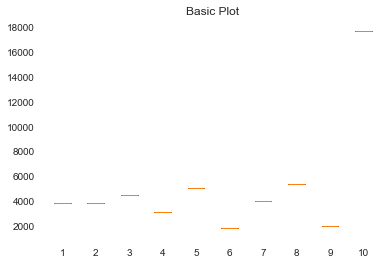

In [140]:
fig1, ax1 = plt.subplots()
ax1.set_title('Basic Plot')
ax1.boxplot(hotel_sentiment_sum)

In [155]:
hotel_sentiment_sum['Sentiment'][:10]

Dominant_Topic
0.0     3855
1.0     3884
2.0     4542
3.0     3138
4.0     5036
5.0     1808
6.0     3993
7.0     5362
8.0     1975
9.0    17750
Name: Sentiment, dtype: int64

In [ ]:
Services
Free_Amenities
Nice 
Staff_nice
Checkout
Staff_Clean
Location
Location_Friendly
Cleanliness
Sleep

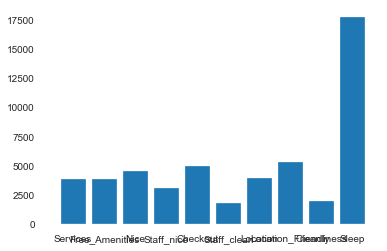

In [180]:
height = hotel_sentiment_sum['Sentiment'][:10]
bars = ('Services', 'Free_Amenities', 'Nice', 'Staff_nice', 'Checkout', 'Staff_clean', 'Location', 'Location_Friendly', 'Cleanliness', 'Sleep')
y_pos = np.arange(len(bars))
 

plt.bar(y_pos, height)
 
# Create names on the x-axis
plt.xticks(y_pos, bars)
 # Choose the position of each barplots on the x-axis (space=1,4,3,1)

# Show graphic
plt.show()

